#Решение задачи мэтчинга

Обучающий датасет, валидационный датасет и base (датасет со всеми товарами) содержат индексы товаров из base, обезличенные признаки товаров и “правильные ответы” - индексы наиболее подходящих товаров-аналогов (кроме валидационного датасета - для него “правильные ответы” содержатся в отдельном файле).

-Необходимо разработать алгоритм для решения задачи мэтчинга на основе этих данных.

-целевая метрика: accuracy@5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Загрузка данных

In [ ]:
!apt -q install libomp-dev
!pip -q install faiss-gpu

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  libomp-14-dev libomp5-14
Suggested packages:
  libomp-14-doc
The following NEW packages will be installed:
  libomp-14-dev libomp-dev libomp5-14
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 738 kB of archives.
After this operation, 8,991 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 libomp5-14 amd64 1:14.0.0-1ubuntu1.1 [389 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 libomp-14-dev amd64 1:14.0.0-1ubuntu1.1 [347 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libomp-dev amd64 1:14.0-55~exp2 [3,074 B]
Fetched 738 kB in 3s (280 kB/s)
Selecting previously unselected package libomp5-14:amd64.
(Reading database ... 121920 files and directories currently installed.)
Preparing to unpack .../libomp5-14_1%3a14.0.0-1ubuntu1.1

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import faiss
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import warnings
warnings.filterwarnings('ignore')
plt.style.use('dark_background')

Загрузим файлы с частью данных в целях быстродействия на стадиях анализа и проведения эксперементов (патерн части данных идентичен со всем объемом даннных)

Данные представленны в 4 файлах, прочитаем их и сохраним

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_part/base.csv')
df.head()

,Id,0,1,2,3,4,5,6,7,8,...,62,63,64,65,66,67,68,69,70,71
0,4207931-base,-43.946243,15.364378,17.515854,-132.31146,157.064420,-4.069252,-340.630860,-57.550140,128.398220,...,-71.927170,30.711966,-90.190475,-24.931271,66.972534,106.346634,-44.270622,155.98834,-1074.464888,-25.066608
1,2710972-base,-73.004890,4.923342,-19.750746,-136.52908,99.907170,-70.709110,-567.401996,-128.890150,109.914986,...,-109.044660,20.916021,-171.201390,-110.596844,67.730100,8.909615,-9.470253,133.29536,-545.897014,-72.913230
2,1371460-base,-85.565570,-0.493598,-48.374817,-157.98502,96.809510,-81.710210,-22.297688,79.768670,124.357086,...,-58.821650,41.369606,-132.934500,-43.016839,67.871925,141.778240,69.048520,111.72038,-1111.038833,-23.087206
3,3438601-base,-105.564090,15.393871,-46.223934,-158.11488,79.514114,-48.944480,-93.713010,38.581398,123.397960,...,-87.907290,-58.806870,-147.794800,-155.830237,68.974754,21.397510,126.098785,139.73320,-1282.707248,-74.527940
4,422798-base,-74.638880,11.315012,-40.204174,-161.76430,50.507114,-80.775560,-640.923467,65.225000,122.344940,...,-30.002094,53.642930,-149.823230,176.921371,69.473280,-43.395180,-58.947716,133.84064,-1074.464888,-1.164146


In [ ]:
df.shape

(291813, 73)

В первом файле находятся данные с уникальным идентификатором базы каждого наблюдения

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_part/train.csv')
train.head()

,Id,0,1,2,3,4,5,6,7,8,...,63,64,65,66,67,68,69,70,71,Target
0,109249-query,-24.021454,3.122524,-80.947525,-112.329994,191.090180,-66.903130,-759.626065,-75.284454,120.55149,...,-24.601670,-167.760770,133.678516,68.184600,26.317545,11.938202,148.549320,-778.563381,-46.877750,66971-base
1,34137-query,-82.033580,8.115866,-8.793022,-182.972100,56.645336,-52.597610,-55.720337,130.059250,129.38335,...,54.448433,-120.894806,-12.292085,66.608116,-27.997612,10.091335,95.809265,-1022.691531,-88.564705,1433819-base
2,136121-query,-75.719640,-0.223386,-86.186130,-162.064060,114.320114,-53.394600,-117.261013,-24.857851,124.80780,...,-5.609123,-93.029880,-80.997871,63.733383,11.378683,62.932007,130.975390,-1074.464888,-74.861176,290133-base
3,105191-query,-56.580620,5.093593,-46.943110,-149.039120,112.436430,-76.820510,-324.995645,-32.833107,119.47865,...,21.624313,-158.880370,179.597294,69.891360,-33.804955,233.914610,122.868546,-1074.464888,-93.775375,1270048-base
4,63983-query,-52.725650,9.027046,-92.829650,-113.111010,134.124970,-42.423073,-759.626065,8.261169,119.49023,...,13.807772,-208.650040,41.742014,66.522420,41.362930,162.723050,111.261310,-151.162805,-33.831450,168591-base


In [ ]:
train.shape

(9999, 74)

Второй файл несет в себе обучающую выборку с id как базы так и запроса

In [ ]:
valid = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_part/validation.csv')
valid.head()

,Id,0,1,2,3,4,5,6,7,8,...,62,63,64,65,66,67,68,69,70,71
0,196680-query,-59.383420,8.563436,-28.203072,-134.22534,82.73661,-150.572170,-129.178969,23.670555,125.66636,...,-103.481630,79.564530,-120.31357,54.218155,68.50073,32.681908,84.19686,136.412960,-1074.464888,-21.233612
1,134615-query,-103.912150,9.742726,-15.209915,-116.37310,137.69880,-85.530075,-776.123158,44.481530,114.67121,...,-51.193770,49.299644,-101.89454,105.560548,67.80104,13.633057,108.05138,111.864456,-841.022331,-76.567980
2,82675-query,-117.923280,-3.504554,-64.299390,-155.18713,156.82137,-34.082264,-537.423653,54.078613,121.97396,...,-115.176155,48.636130,-132.17967,-0.988696,68.11125,107.065216,134.61765,134.080000,27.773269,-32.401714
3,162076-query,-90.880554,4.888542,-39.647797,-131.75010,62.36212,-105.593270,-347.132493,-83.351750,133.91331,...,-112.293790,54.884007,-177.56935,-116.374997,67.88766,136.893980,124.89447,117.707750,-566.343980,-90.905556
4,23069-query,-66.946740,10.562773,-73.781830,-149.39787,2.93866,-51.288853,-587.189361,-2.764402,126.56105,...,-116.440605,47.279976,-162.65400,107.409409,67.78526,-60.976490,142.68571,82.264300,-345.340457,-48.572525


In [ ]:
valid.shape

(10000, 73)

В третьем файле находятся входные признаки тестовой выборки

In [ ]:
true = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_part/validation_answer.csv')
true.head()

,Id,Expected
0,196680-query,1087368-base
1,134615-query,849674-base
2,82675-query,4183486-base
3,162076-query,2879258-base
4,23069-query,615229-base


In [ ]:
true.shape

(10000, 2)

В четвертом файле находится целевой признак (id-базы) тестовой выборки

In [ ]:
pd.set_option('display.max_rows', 100)

### Типы данных, дубликаты, пропуски

Проверим типы данных, дубликаты и наличие пропусков в данных

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 291813 entries, 0 to 291812
Data columns (total 73 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Id      291813 non-null  object 
 1   0       291813 non-null  float64
 2   1       291813 non-null  float64
 3   2       291813 non-null  float64
 4   3       291813 non-null  float64
 5   4       291813 non-null  float64
 6   5       291813 non-null  float64
 7   6       291813 non-null  float64
 8   7       291813 non-null  float64
 9   8       291813 non-null  float64
 10  9       291813 non-null  float64
 11  10      291813 non-null  float64
 12  11      291813 non-null  float64
 13  12      291813 non-null  float64
 14  13      291813 non-null  float64
 15  14      291813 non-null  float64
 16  15      291813 non-null  float64
 17  16      291813 non-null  float64
 18  17      291813 non-null  float64
 19  18      291813 non-null  float64
 20  19      291813 non-null  float64
 21  20      29

In [ ]:
df.isna().mean()

Id    0.0
0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
13    0.0
14    0.0
15    0.0
16    0.0
17    0.0
18    0.0
19    0.0
20    0.0
21    0.0
22    0.0
23    0.0
24    0.0
25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
44    0.0
45    0.0
46    0.0
47    0.0
48    0.0
49    0.0
50    0.0
51    0.0
52    0.0
53    0.0
54    0.0
55    0.0
56    0.0
57    0.0
58    0.0
59    0.0
60    0.0
61    0.0
62    0.0
63    0.0
64    0.0
65    0.0
66    0.0
67    0.0
68    0.0
69    0.0
70    0.0
71    0.0
dtype: float64

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      9999 non-null   object 
 1   0       9999 non-null   float64
 2   1       9999 non-null   float64
 3   2       9999 non-null   float64
 4   3       9999 non-null   float64
 5   4       9999 non-null   float64
 6   5       9999 non-null   float64
 7   6       9999 non-null   float64
 8   7       9999 non-null   float64
 9   8       9999 non-null   float64
 10  9       9999 non-null   float64
 11  10      9999 non-null   float64
 12  11      9999 non-null   float64
 13  12      9999 non-null   float64
 14  13      9999 non-null   float64
 15  14      9999 non-null   float64
 16  15      9999 non-null   float64
 17  16      9999 non-null   float64
 18  17      9999 non-null   float64
 19  18      9999 non-null   float64
 20  19      9999 non-null   float64
 21  20      9999 non-null   float64
 22  

In [ ]:
train.isna().mean()

Id        0.0
0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
5         0.0
6         0.0
7         0.0
8         0.0
9         0.0
10        0.0
11        0.0
12        0.0
13        0.0
14        0.0
15        0.0
16        0.0
17        0.0
18        0.0
19        0.0
20        0.0
21        0.0
22        0.0
23        0.0
24        0.0
25        0.0
26        0.0
27        0.0
28        0.0
29        0.0
30        0.0
31        0.0
32        0.0
33        0.0
34        0.0
35        0.0
36        0.0
37        0.0
38        0.0
39        0.0
40        0.0
41        0.0
42        0.0
43        0.0
44        0.0
45        0.0
46        0.0
47        0.0
48        0.0
49        0.0
50        0.0
51        0.0
52        0.0
53        0.0
54        0.0
55        0.0
56        0.0
57        0.0
58        0.0
59        0.0
60        0.0
61        0.0
62        0.0
63        0.0
64        0.0
65        0.0
66        0.0
67        0.0
68        0.0
69        0.0
70    

In [ ]:
valid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 73 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      10000 non-null  object 
 1   0       10000 non-null  float64
 2   1       10000 non-null  float64
 3   2       10000 non-null  float64
 4   3       10000 non-null  float64
 5   4       10000 non-null  float64
 6   5       10000 non-null  float64
 7   6       10000 non-null  float64
 8   7       10000 non-null  float64
 9   8       10000 non-null  float64
 10  9       10000 non-null  float64
 11  10      10000 non-null  float64
 12  11      10000 non-null  float64
 13  12      10000 non-null  float64
 14  13      10000 non-null  float64
 15  14      10000 non-null  float64
 16  15      10000 non-null  float64
 17  16      10000 non-null  float64
 18  17      10000 non-null  float64
 19  18      10000 non-null  float64
 20  19      10000 non-null  float64
 21  20      10000 non-null  float64
 22 

In [ ]:
valid.isna().mean()

Id    0.0
0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
13    0.0
14    0.0
15    0.0
16    0.0
17    0.0
18    0.0
19    0.0
20    0.0
21    0.0
22    0.0
23    0.0
24    0.0
25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
44    0.0
45    0.0
46    0.0
47    0.0
48    0.0
49    0.0
50    0.0
51    0.0
52    0.0
53    0.0
54    0.0
55    0.0
56    0.0
57    0.0
58    0.0
59    0.0
60    0.0
61    0.0
62    0.0
63    0.0
64    0.0
65    0.0
66    0.0
67    0.0
68    0.0
69    0.0
70    0.0
71    0.0
dtype: float64

In [ ]:
true.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Id        10000 non-null  object
 1   Expected  10000 non-null  object
dtypes: object(2)
memory usage: 156.4+ KB


In [ ]:
true.isna().mean()

Id          0.0
Expected    0.0
dtype: float64

In [ ]:
pd.reset_option('all')

Типы данных представленны корректно, пропусков в данных нет

In [ ]:
df.drop('Id', axis=1).duplicated().sum()

11278

In [ ]:
df.duplicated().sum()

11278

Наблюдаем 11278 явных дубликатов в df, удалим их:

In [ ]:
df = df.drop_duplicates().reset_index(drop=True)
df.duplicated().sum()

0

In [ ]:
train.drop('Id', axis=1).duplicated().sum()

243

In [ ]:
train.duplicated().sum()

243

243 явных дубликатов в train

In [ ]:
train = train.drop_duplicates().reset_index(drop=True)
train.duplicated().sum()

0

In [ ]:
valid.drop('Id', axis=1).duplicated().sum()

265

In [ ]:
valid.duplicated().sum()

265

In [ ]:
true.duplicated().sum()

265

265 явных дубликатов в valid и true

Удостоверимся что это одни и те же значения:

In [ ]:
true[true.duplicated() == True]

,Id,Expected
943,114803-query,2545455-base
1001,87775-query,459671-base
1158,63870-query,2198344-base
1446,25897-query,977421-base
1520,109468-query,1261199-base
...,...,...
9887,174515-query,1223510-base
9925,14495-query,1055668-base
9935,127665-query,333528-base
9945,151137-query,425280-base


In [ ]:
valid[valid.duplicated() == True]

,Id,0,1,2,3,4,5,6,7,8,...,62,63,64,65,66,67,68,69,70,71
943,114803-query,-101.082890,5.540288,-12.010399,-165.78003,165.070770,-90.546455,-126.970553,-15.534117,129.63318,...,-145.038440,41.476670,-195.875920,80.800686,69.467186,18.862162,47.316790,97.196060,-1074.329349,-76.602060
1001,87775-query,-60.845516,5.175650,-7.150406,-154.14874,135.116620,-68.609150,-51.144944,60.909584,106.04319,...,-138.264190,62.078320,-171.094440,-103.121822,70.815450,46.924530,36.251000,89.474594,-1074.464888,-26.805397
1158,63870-query,-94.242905,3.868941,-70.836530,-140.52805,185.549350,-82.631970,-759.626065,29.759644,134.19905,...,-46.607094,37.560130,-130.201400,138.874079,65.366890,67.210470,95.458760,111.093980,70.195714,-60.119503
1446,25897-query,-90.140650,1.706038,-31.901302,-144.51865,124.351780,-39.397522,-275.331241,-11.262804,123.42321,...,-155.481720,28.937962,-63.676582,167.898998,67.595116,92.115780,109.151350,90.525130,-1074.464888,-59.644333
1520,109468-query,-117.979256,6.286935,-34.845955,-145.82758,149.212340,-75.225840,-759.626065,-10.162037,122.42709,...,-68.101620,3.898214,-96.005280,131.117751,69.177320,-39.760044,-13.365089,136.487300,-1085.387293,-100.183900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9887,174515-query,-114.698410,0.325339,-26.300800,-164.58128,85.371280,-97.394340,18.527914,-11.784159,114.88004,...,-144.275440,31.029224,-214.089540,136.767308,67.860960,-0.925775,86.162926,138.398510,-1074.464888,-61.581030
9925,14495-query,-123.976746,0.226129,-14.248978,-148.44832,37.216354,-26.652393,-289.138692,-29.454977,117.56476,...,-82.273810,26.167728,-124.080680,115.912690,65.433170,24.917190,-0.285141,122.670910,-38.731523,-110.099790
9935,127665-query,-43.045483,9.688239,-69.770780,-175.35973,94.052310,-88.594210,-759.626065,-38.775513,123.98312,...,-70.196710,34.703403,-266.793270,118.149764,67.143005,105.027880,17.861614,55.464030,-1074.464888,-54.564682
9945,151137-query,-66.163730,10.259417,-26.121260,-149.76454,121.025154,-117.044010,-310.052014,-60.856606,117.43666,...,-72.846390,10.476112,-220.000060,-61.546250,67.706080,17.913353,22.873245,77.296770,-1074.464888,-80.217830


Идентичные идентификаторы фрейма и id-запроса у valid и true

In [ ]:
sub = true[true.duplicated() == True]['Id'] != valid[valid.duplicated() == True]['Id']
sub.sum()

0

Это одни и те же наблюдения

Удалим дубликаты:

In [ ]:
valid = valid.drop_duplicates().reset_index(drop=True)
valid.duplicated().sum()

0

In [ ]:
true = true.drop_duplicates().reset_index(drop=True)
true.duplicated().sum()

0

## Исследовательский анализ данных

### Base

0
count    280535.000000
mean        -86.262582
std          24.926896
min        -189.356020
25%        -103.149743
50%         -86.297714
75%         -69.238668
max          15.574616
Name: 0, dtype: float64


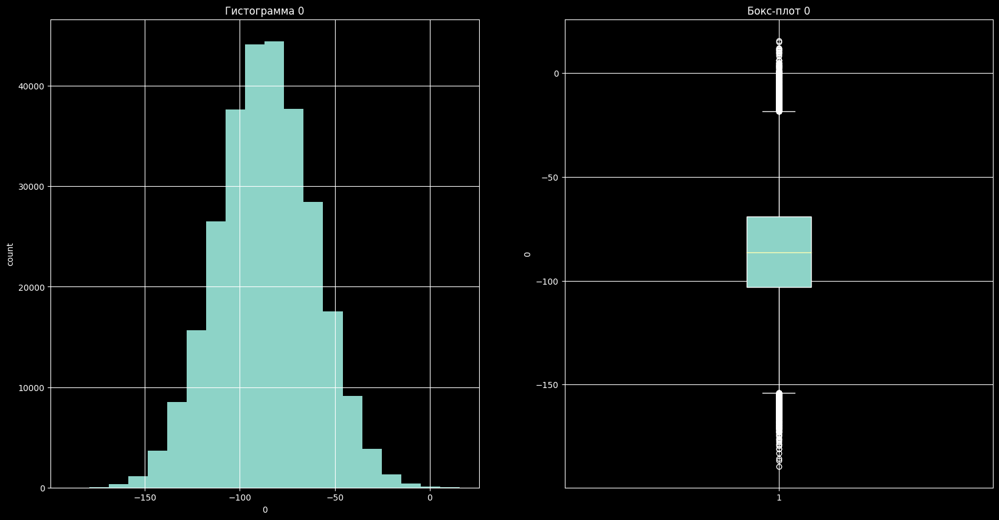

1
count    280535.000000
mean          8.076253
std           4.950601
min         -12.594500
25%           4.705760
50%           8.039526
75%          11.466233
max          28.751917
Name: 1, dtype: float64


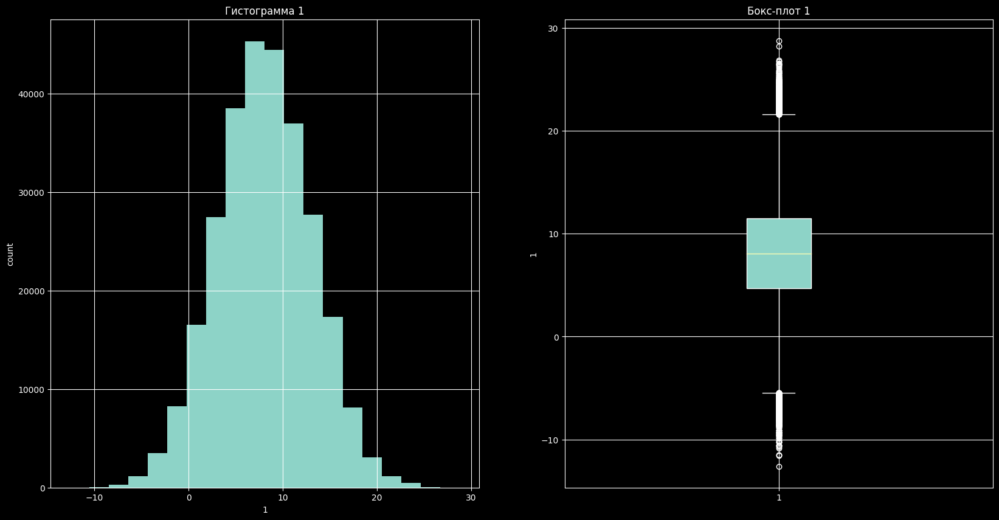

2
count    280535.000000
mean        -44.602718
std          38.544201
min        -231.785920
25%         -69.524600
50%         -43.848522
75%         -19.668575
max         151.377080
Name: 2, dtype: float64


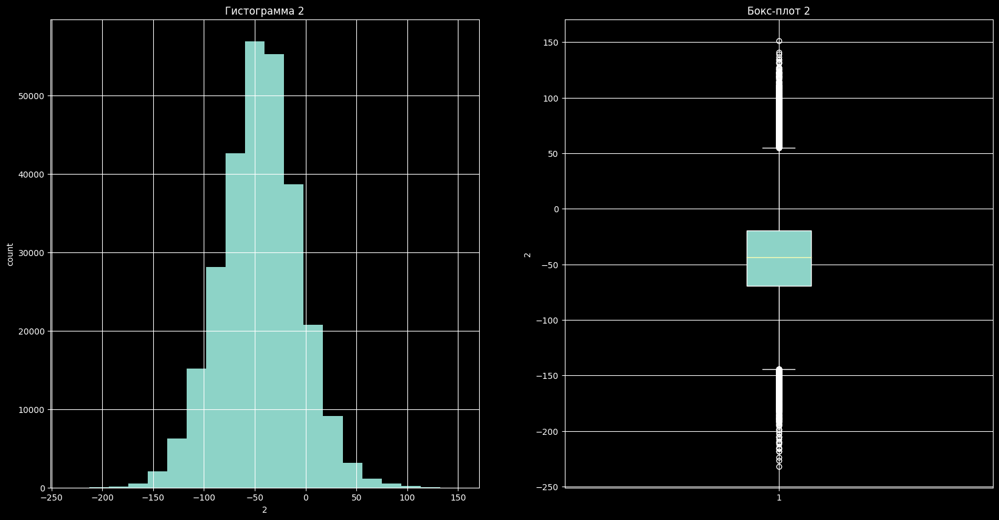

3
count    280535.000000
mean       -146.608060
std          19.851889
min        -224.880500
25%        -159.888650
50%        -146.719400
75%        -133.315265
max         -55.167892
Name: 3, dtype: float64


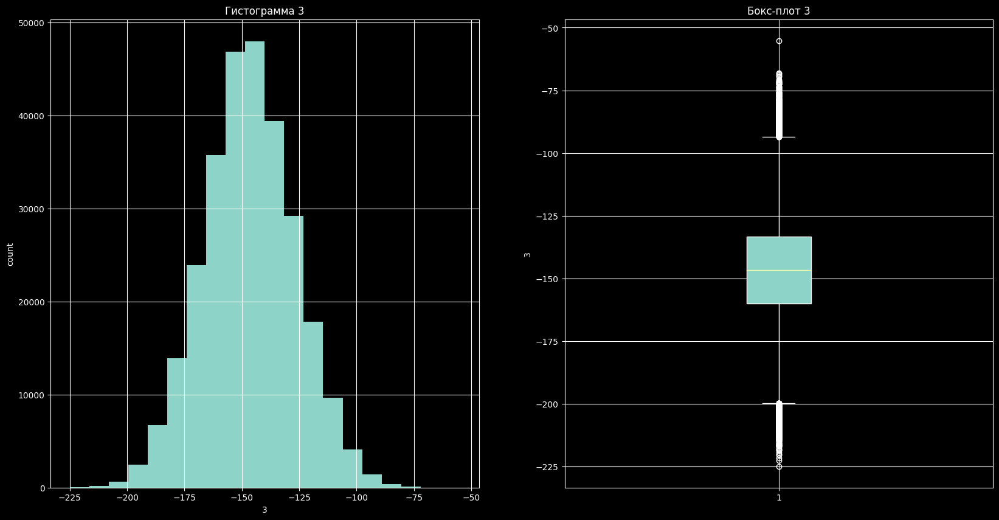

4
count    280535.000000
mean        111.259446
std          46.359416
min         -95.240830
25%          80.356810
50%         111.776024
75%         142.368670
max         299.307920
Name: 4, dtype: float64


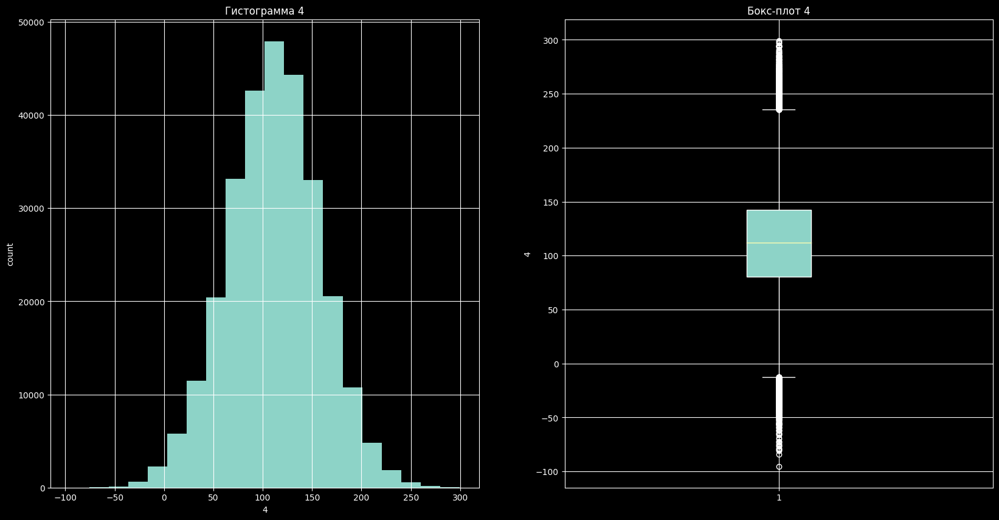

5
count    280535.000000
mean        -71.881191
std          28.189068
min        -188.473330
25%         -91.243848
50%         -71.756645
75%         -52.312802
max          49.880882
Name: 5, dtype: float64


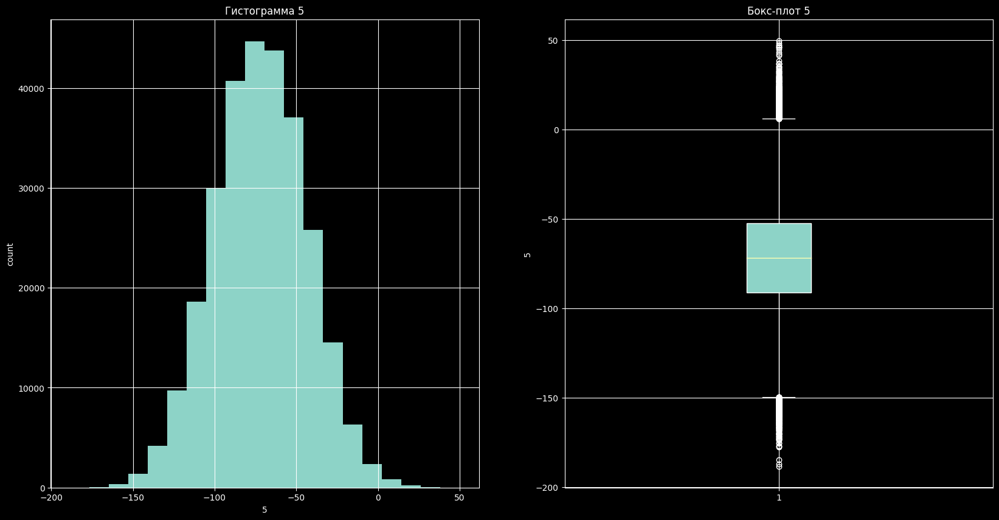

6
count    280535.000000
mean       -393.454026
std         272.101514
min        -791.468770
25%        -631.740510
50%        -424.457604
75%        -157.402926
max         109.631986
Name: 6, dtype: float64


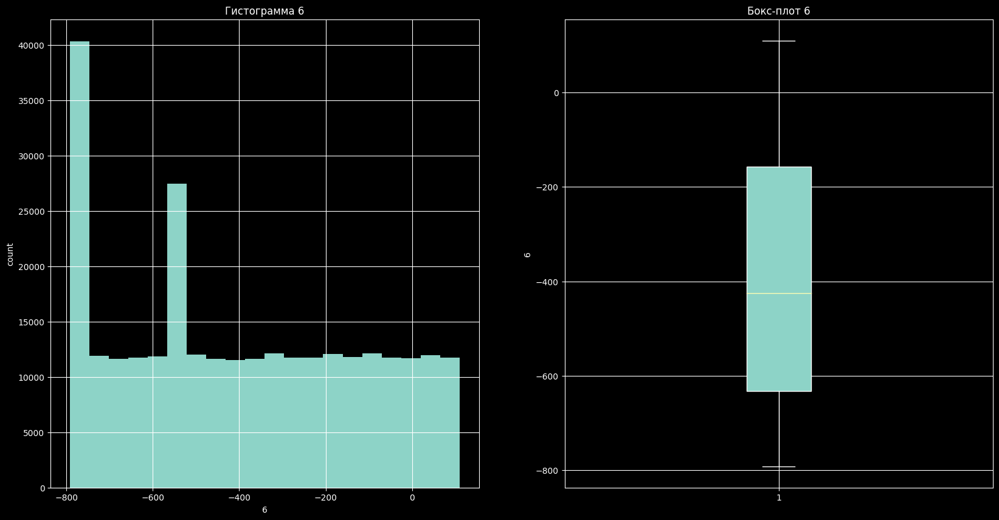

7
count    280535.000000
mean         20.399939
std          64.273309
min        -296.171050
25%         -22.075390
50%          20.866192
75%          63.991116
max         301.094240
Name: 7, dtype: float64


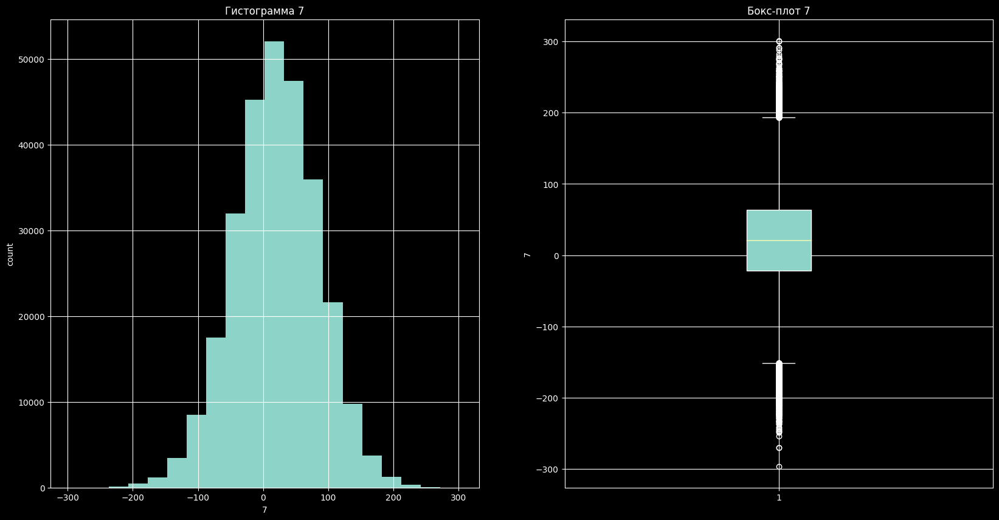

8
count    280535.000000
mean        123.673489
std           6.354015
min          93.684616
25%         119.468280
50%         123.877330
75%         127.967140
max         147.870910
Name: 8, dtype: float64


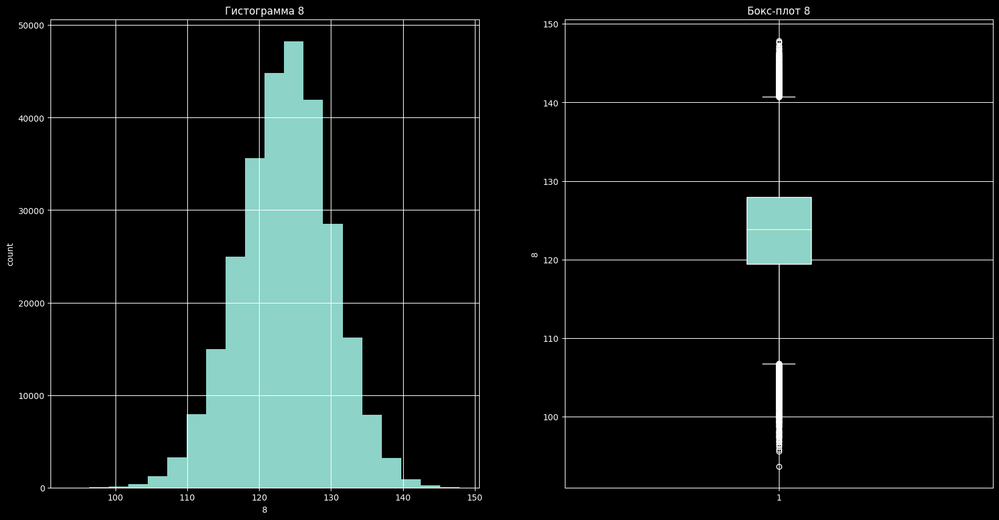

9
count    280535.000000
mean        124.408196
std          64.375754
min        -143.499600
25%          81.645300
50%         123.432480
75%         166.981605
max         402.994600
Name: 9, dtype: float64


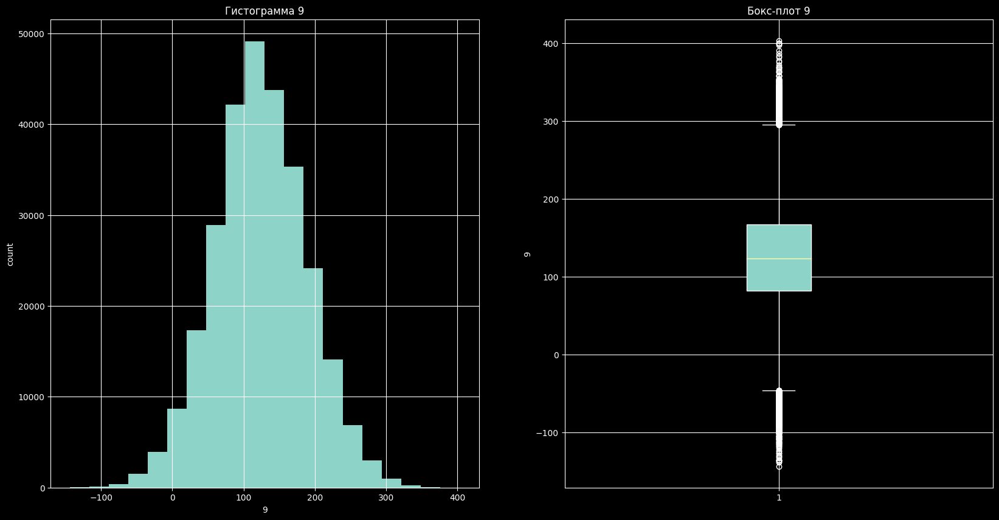

10
count    280535.000000
mean       -143.246716
std          41.830075
min        -321.522580
25%        -170.582045
50%        -141.817720
75%        -114.920650
max          20.790848
Name: 10, dtype: float64


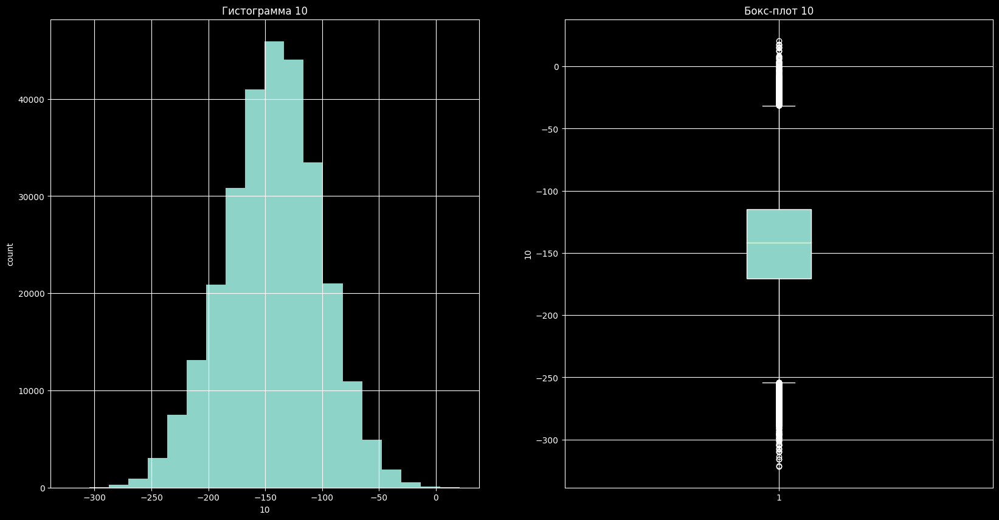

11
count    280535.000000
mean        -69.926948
std          51.186344
min        -367.130700
25%        -103.977450
50%         -70.368546
75%         -35.720323
max         180.045350
Name: 11, dtype: float64


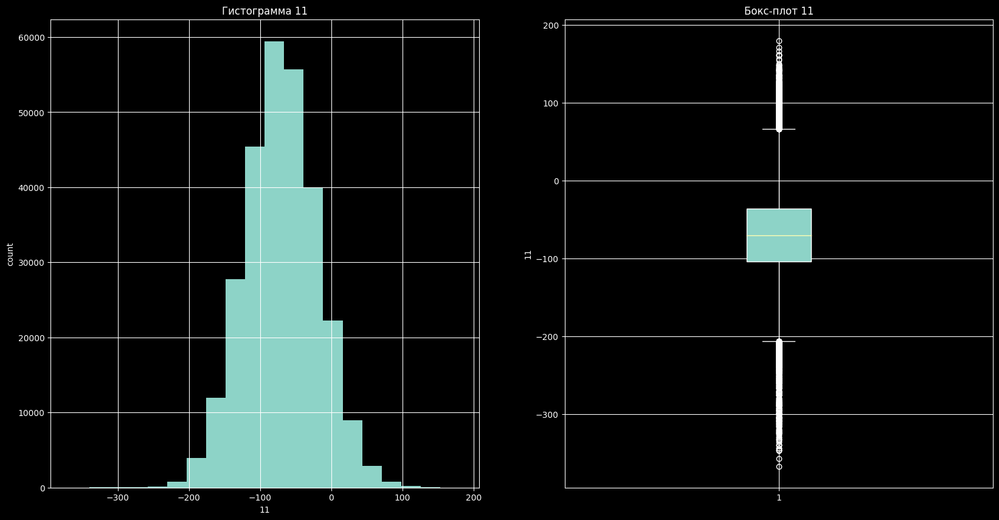

12
count    280535.000000
mean        -41.181138
std          38.969439
min        -215.223530
25%         -66.600500
50%         -40.328754
75%         -14.710959
max         119.991196
Name: 12, dtype: float64


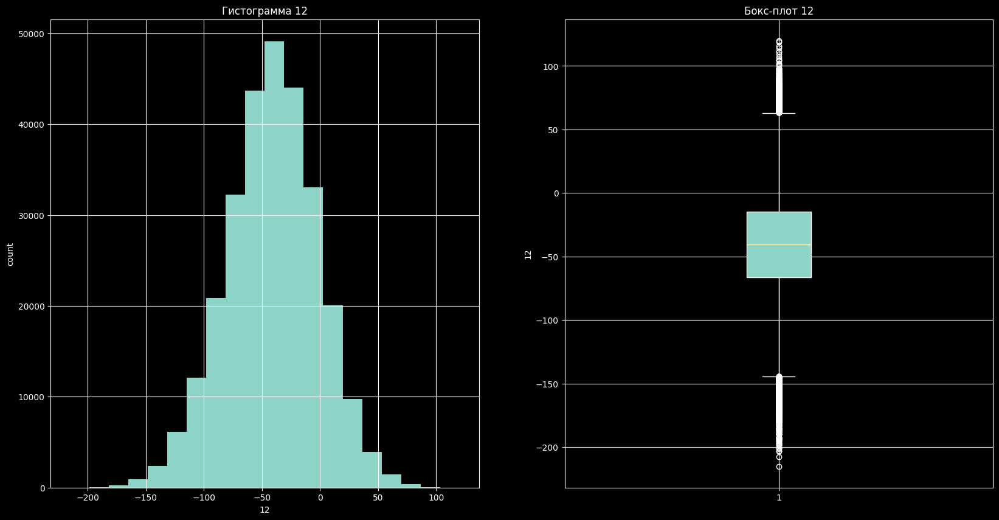

13
count    280535.000000
mean          7.630945
std          36.575113
min        -175.623890
25%         -16.864338
50%           8.185975
75%          32.741399
max         177.527040
Name: 13, dtype: float64


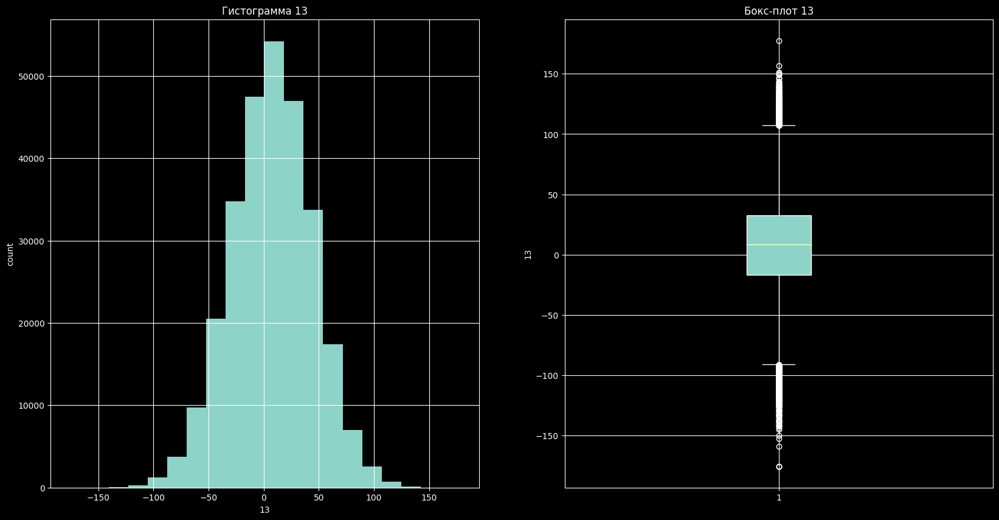

14
count    280535.000000
mean        148.937476
std          33.636047
min          -9.157745
25%         126.034030
50%         149.247160
75%         172.100960
max         284.657040
Name: 14, dtype: float64


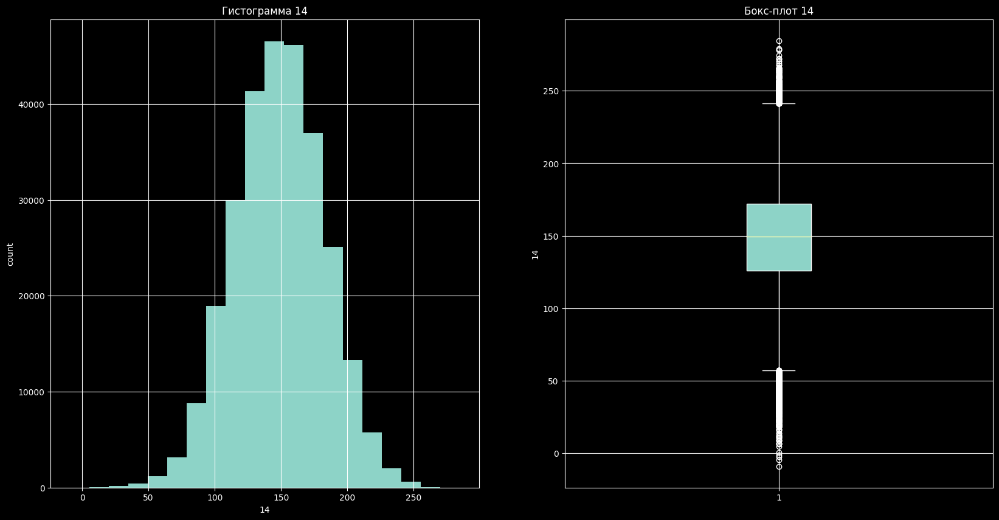

15
count    280535.000000
mean        -23.199090
std          13.075080
min         -84.724250
25%         -31.797769
50%         -22.951057
75%         -14.365096
max          35.080270
Name: 15, dtype: float64


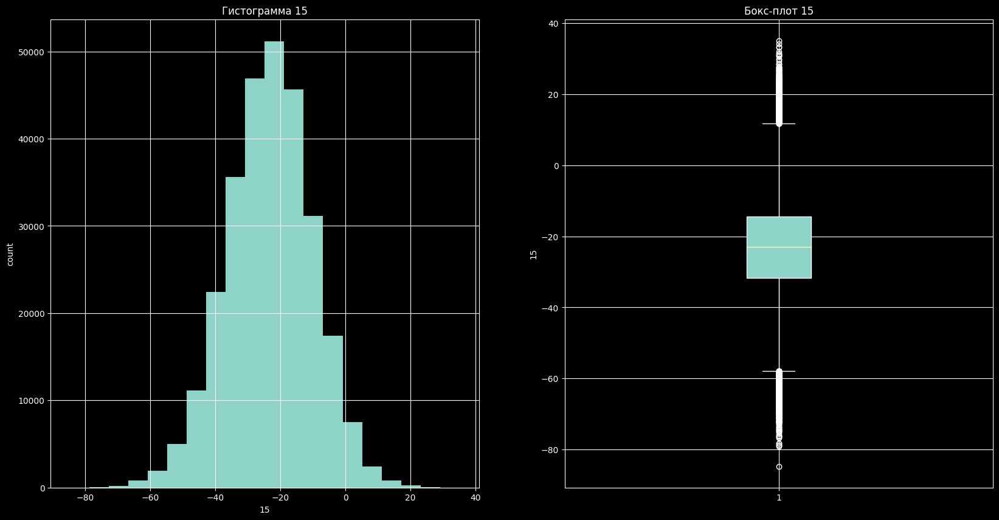

16
count    280535.000000
mean         -0.945514
std          20.825502
min         -96.368160
25%         -15.132058
50%          -1.027753
75%          13.337160
max          90.389210
Name: 16, dtype: float64


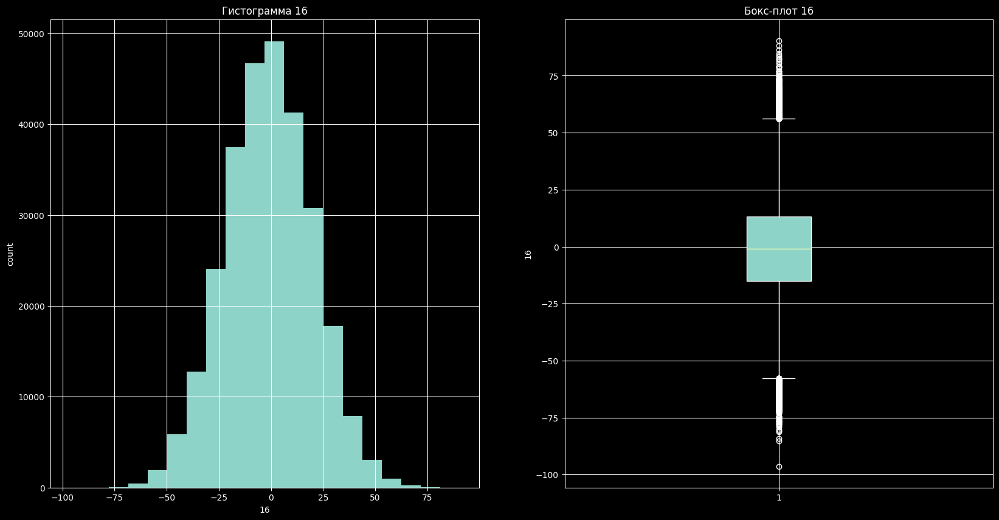

17
count    280535.000000
mean        -19.240269
std          52.971926
min        -237.018780
25%         -55.494100
50%         -19.787570
75%          16.790301
max         206.303970
Name: 17, dtype: float64


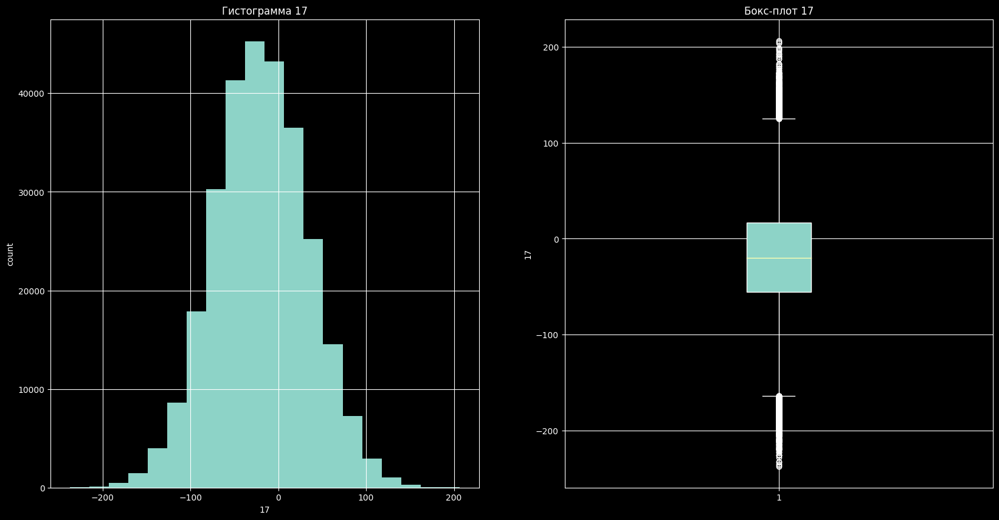

18
count    280535.000000
mean       -137.368702
std          46.668294
min        -348.336240
25%        -167.706535
50%        -136.857770
75%        -107.603115
max          86.998080
Name: 18, dtype: float64


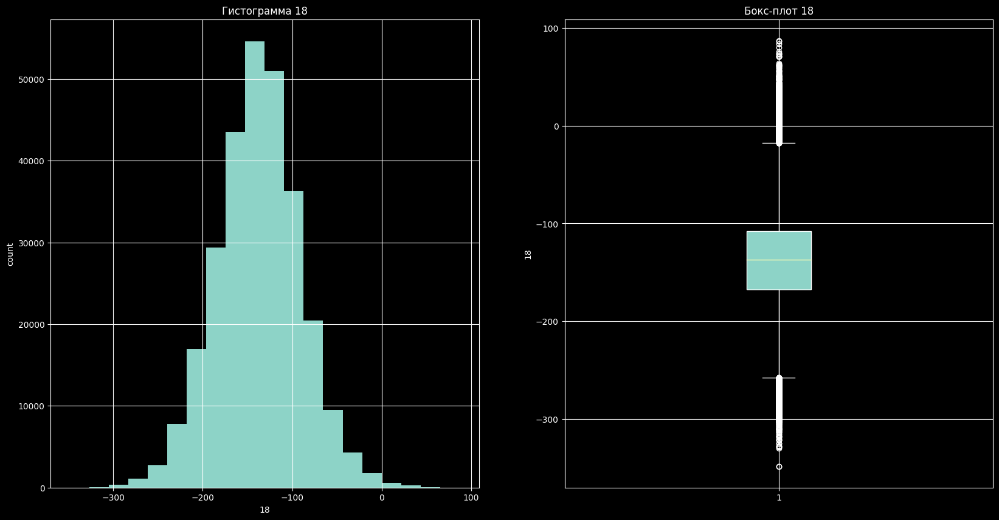

19
count    280535.000000
mean        -79.189643
std           0.757769
min         -82.659546
25%         -79.680050
50%         -79.179760
75%         -78.679242
max         -75.796460
Name: 19, dtype: float64


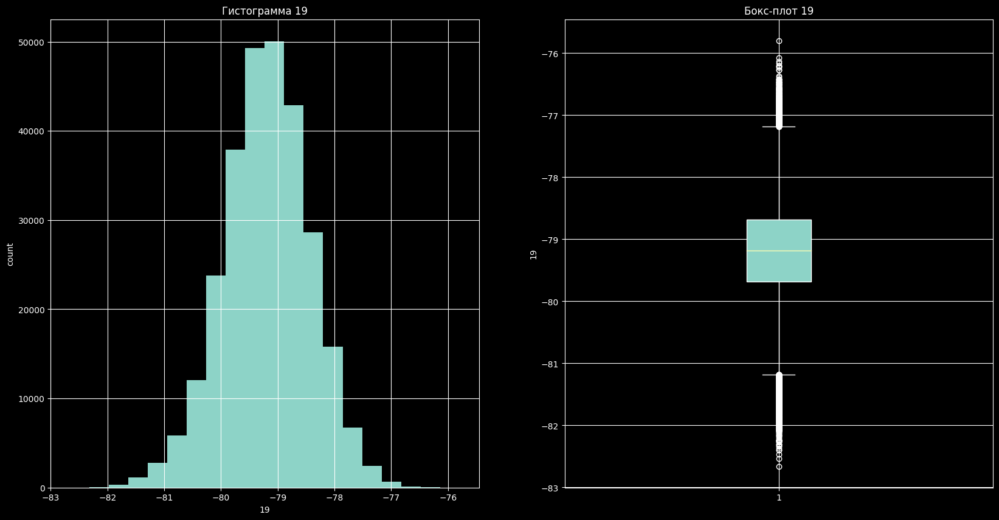

20
count    280535.000000
mean        -98.264717
std          28.148689
min        -230.840270
25%        -116.892960
50%         -97.513780
75%         -79.262214
max          30.247147
Name: 20, dtype: float64


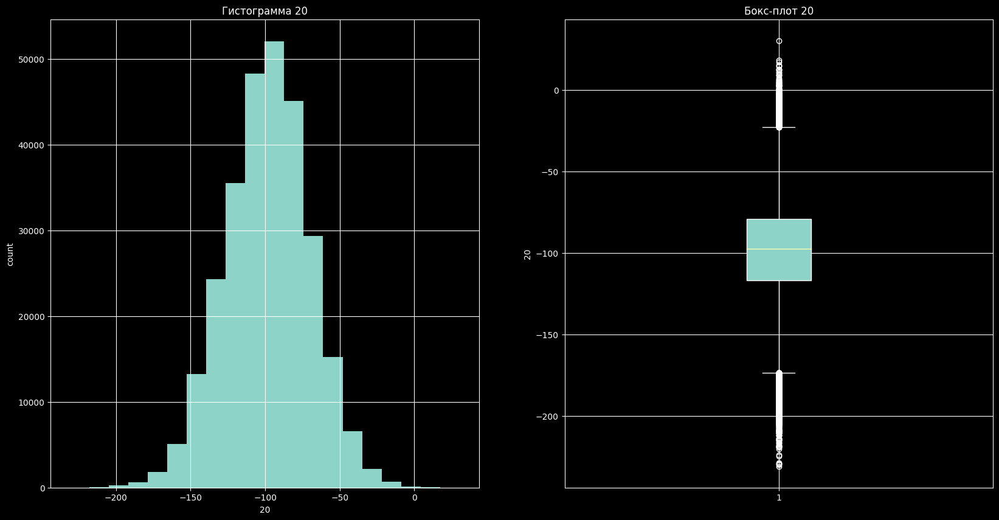

21
count    280535.000000
mean       1257.294014
std         399.927842
min         136.855507
25%        1086.612351
50%        1507.231274
75%        1507.231274
max        1557.418340
Name: 21, dtype: float64


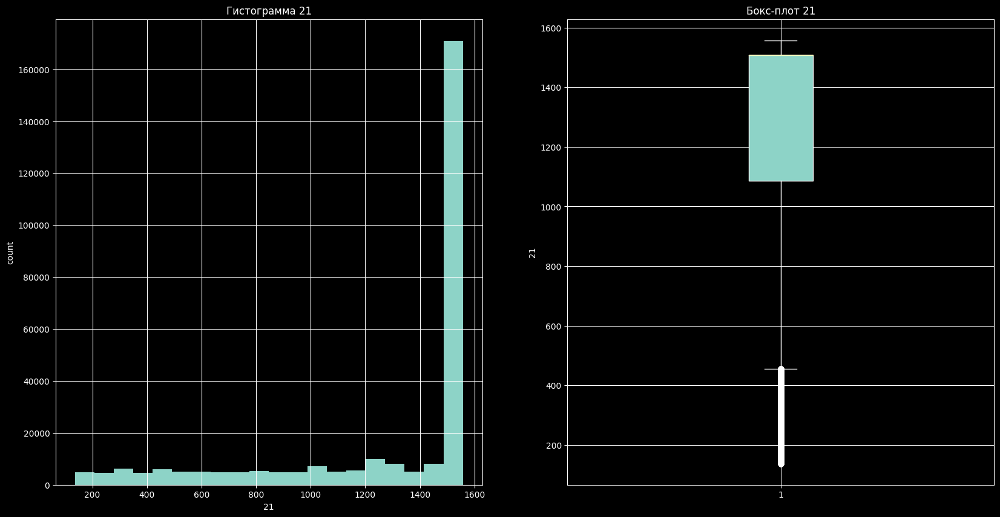

22
count    280535.000000
mean         -6.796919
std          51.990851
min        -219.015870
25%         -42.251195
50%          -6.438452
75%          28.290704
max         204.201260
Name: 22, dtype: float64


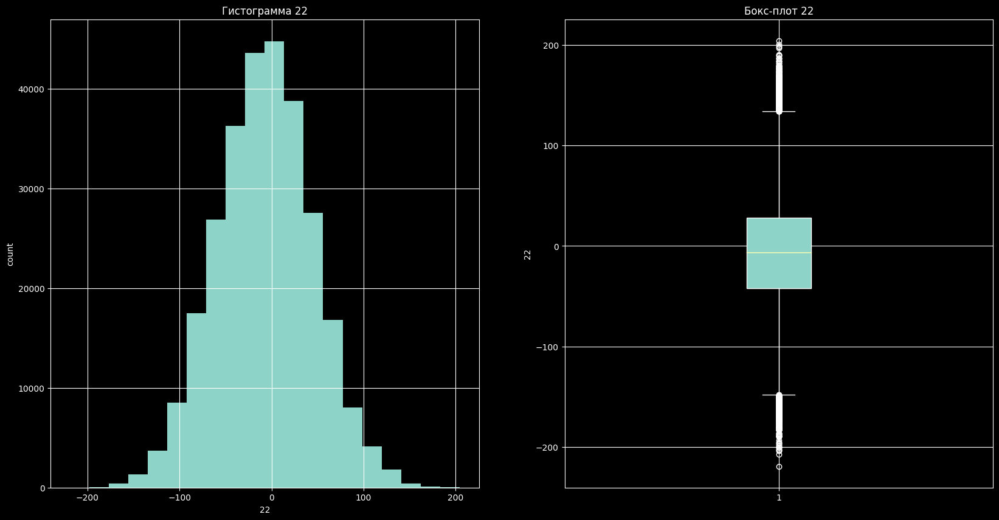

23
count    280535.000000
mean         56.726826
std          34.384860
min         -83.704820
25%          33.343178
50%          57.062010
75%          79.692332
max         214.311230
Name: 23, dtype: float64


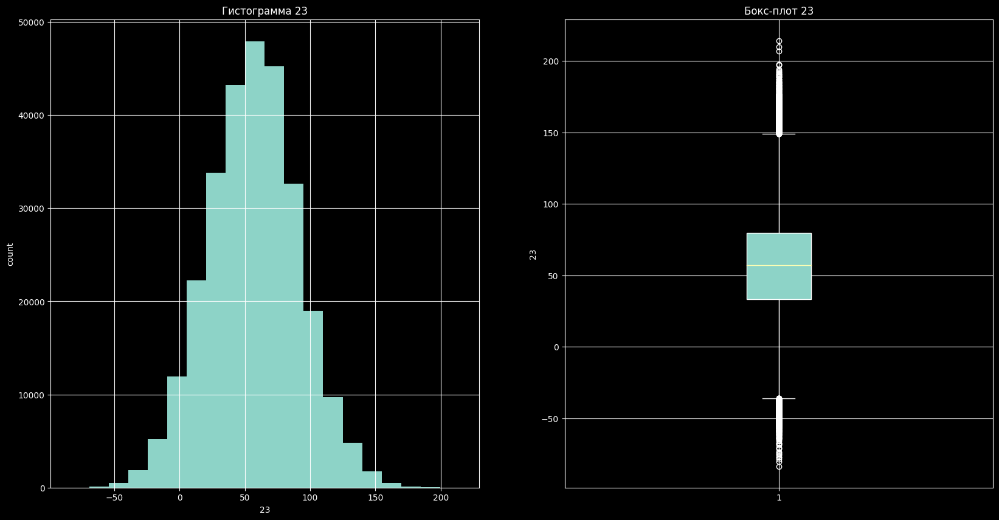

24
count    280535.000000
mean         26.624828
std          38.968861
min        -143.183290
25%           0.400886
50%          26.998499
75%          53.092788
max         195.515240
Name: 24, dtype: float64


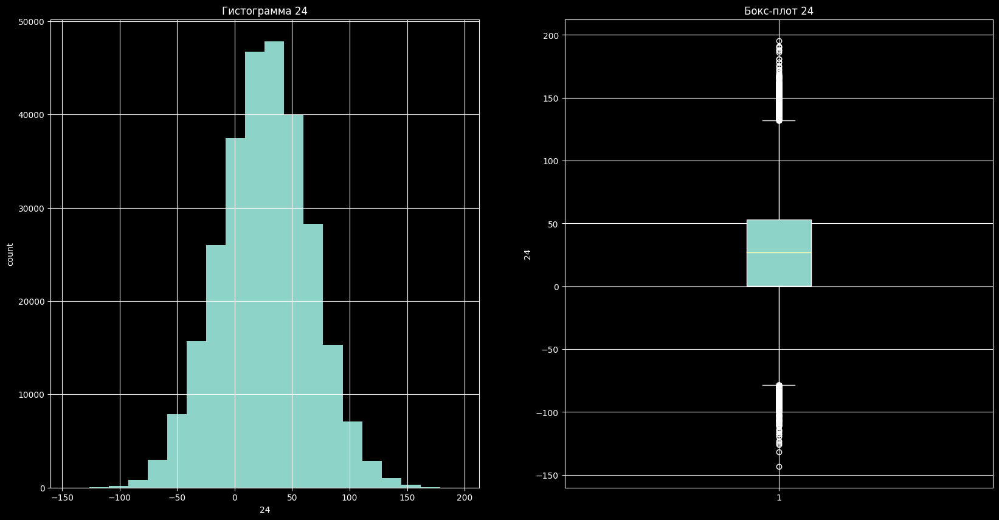

25
count    280535.000000
mean        726.688043
std         205.900297
min         -61.967366
25%         813.770071
50%         813.770071
75%         813.770071
max         845.758252
Name: 25, dtype: float64


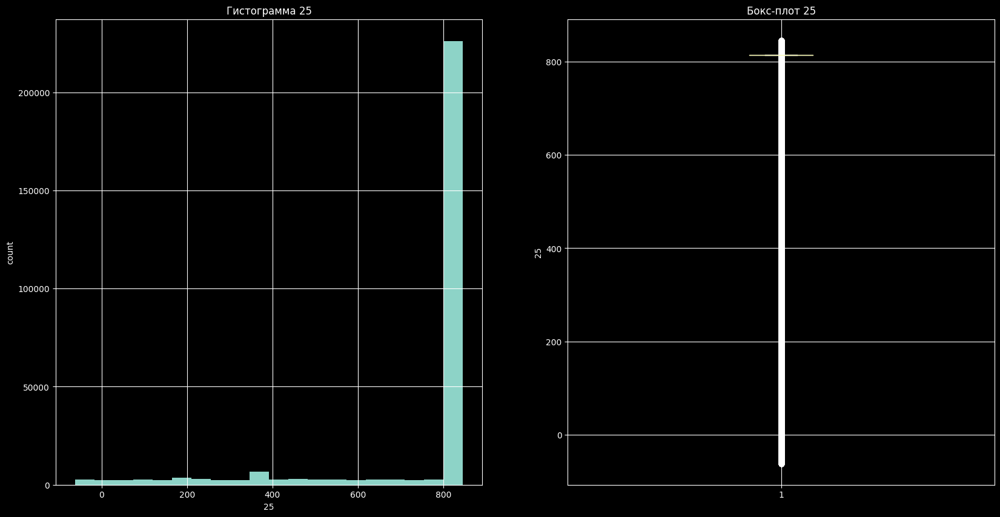

26
count    280535.000000
mean        -66.034474
std          61.554623
min        -327.226200
25%        -107.558067
50%         -65.878170
75%         -25.509745
max         222.614410
Name: 26, dtype: float64


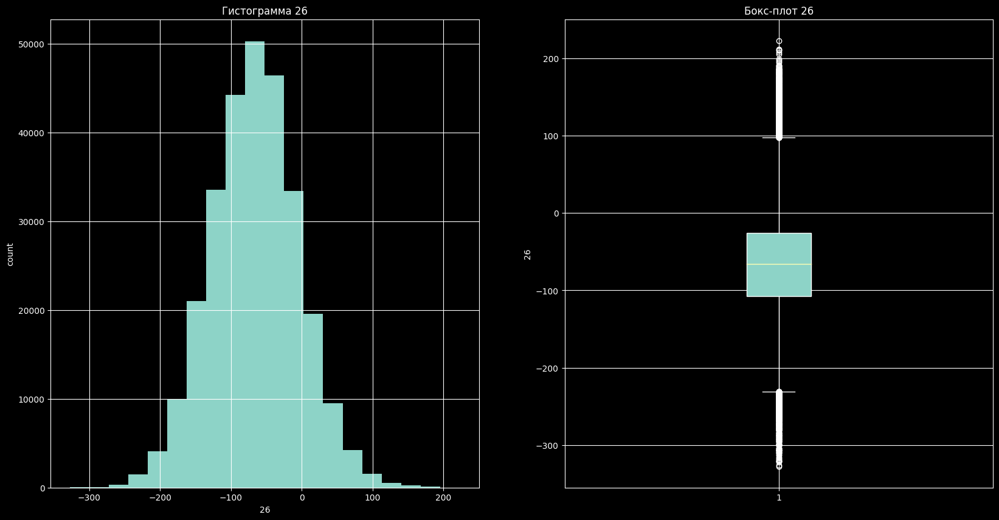

27
count    280535.000000
mean         16.299773
std           4.656989
min          -7.296732
25%          13.255929
50%          16.364674
75%          19.422657
max          38.266210
Name: 27, dtype: float64


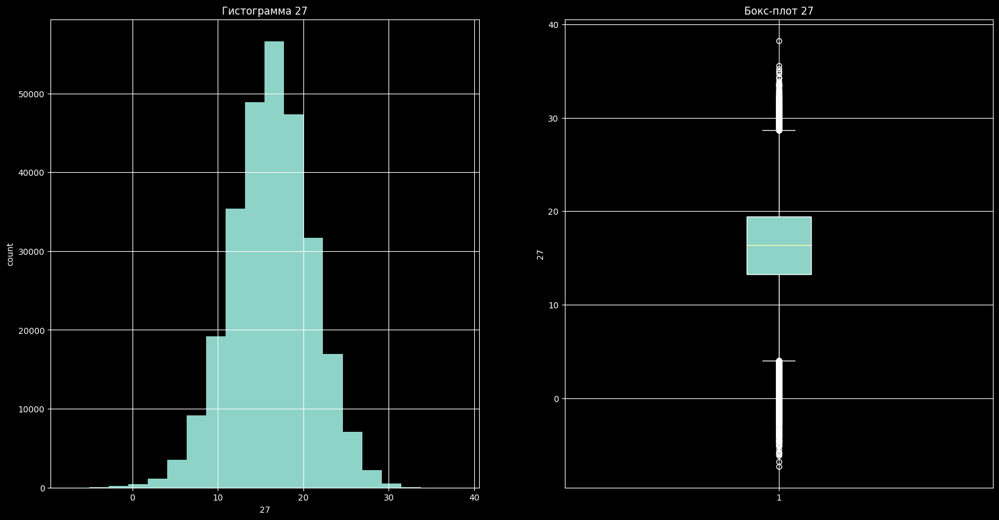

28
count    280535.000000
mean        -86.264456
std          48.323388
min        -302.772400
25%        -118.427863
50%         -85.411760
75%         -53.862435
max         127.499540
Name: 28, dtype: float64


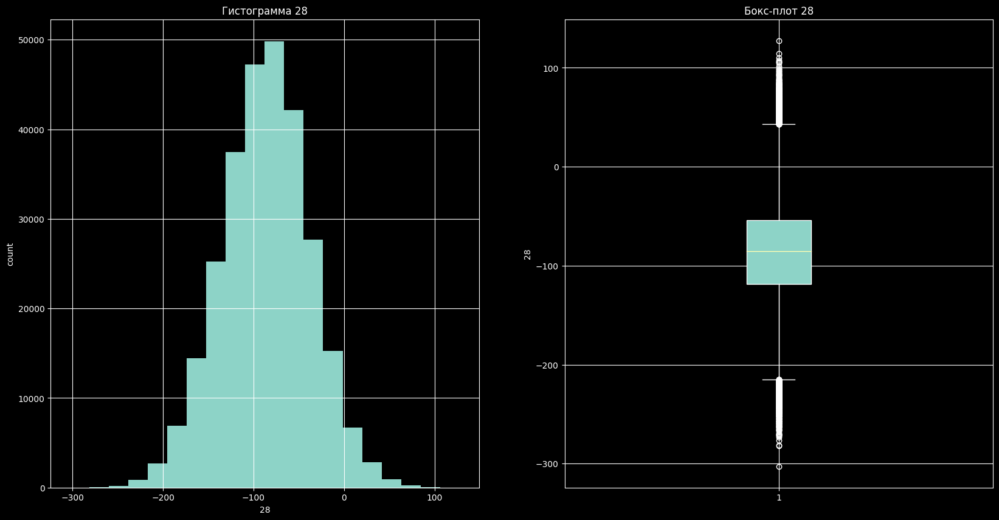

29
count    280535.000000
mean        151.736281
std          10.092055
min         107.650450
25%         144.898725
50%         151.633540
75%         158.268590
max         197.499940
Name: 29, dtype: float64


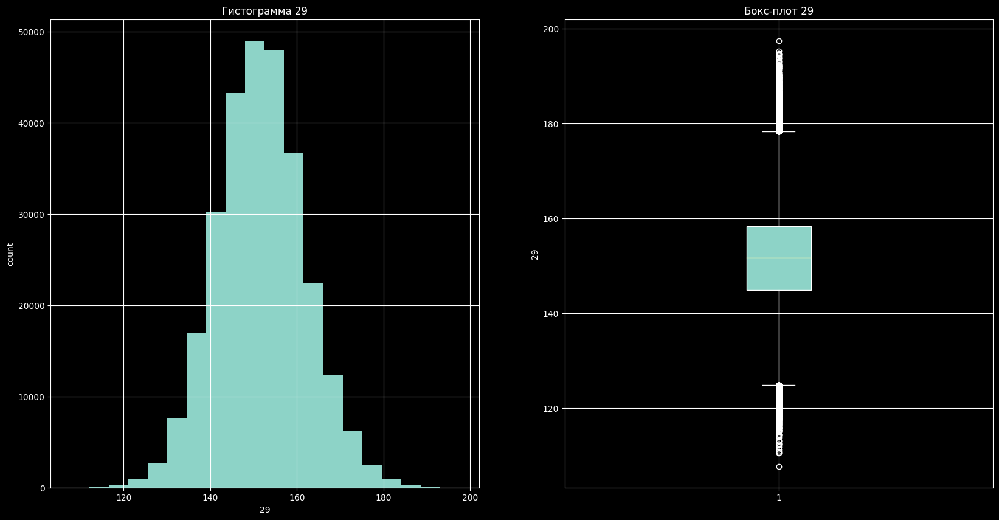

30
count    280535.000000
mean        -11.590236
std          28.947838
min        -146.495420
25%         -30.716190
50%         -11.153910
75%           8.277696
max         105.036690
Name: 30, dtype: float64


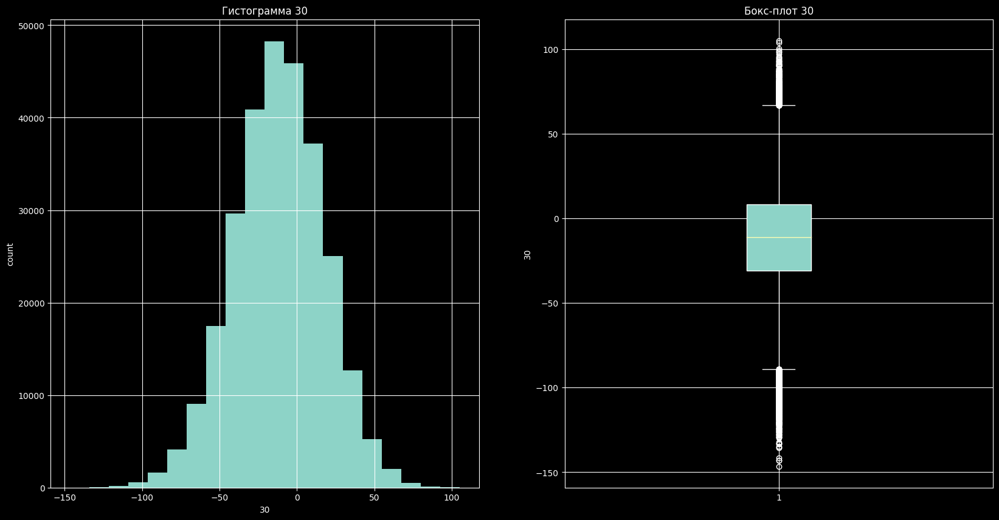

31
count    280535.000000
mean       -144.251476
std          34.899697
min        -288.613980
25%        -167.129650
50%        -144.208950
75%        -121.342930
max           2.917328
Name: 31, dtype: float64


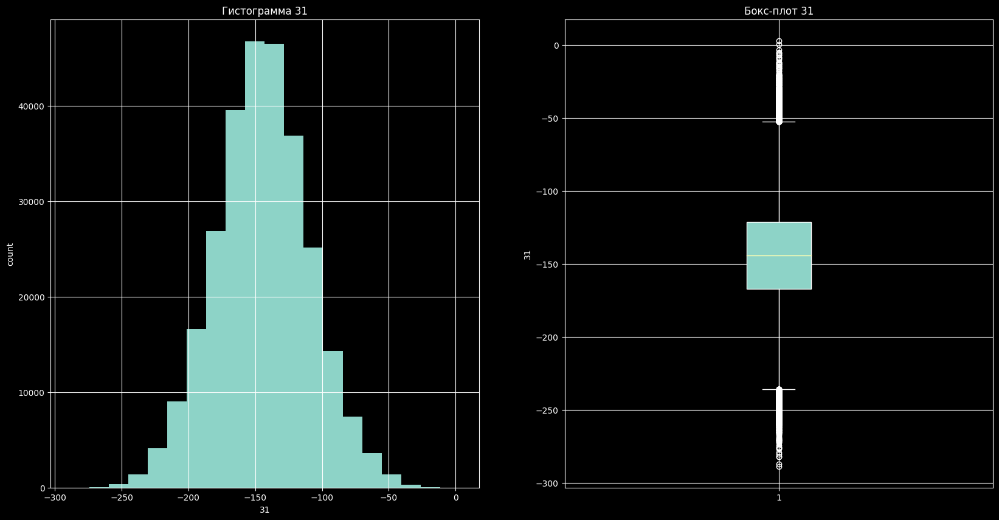

32
count    280535.000000
mean         87.286512
std          27.787968
min         -25.102974
25%          68.452787
50%          86.900536
75%         105.993300
max         201.428620
Name: 32, dtype: float64


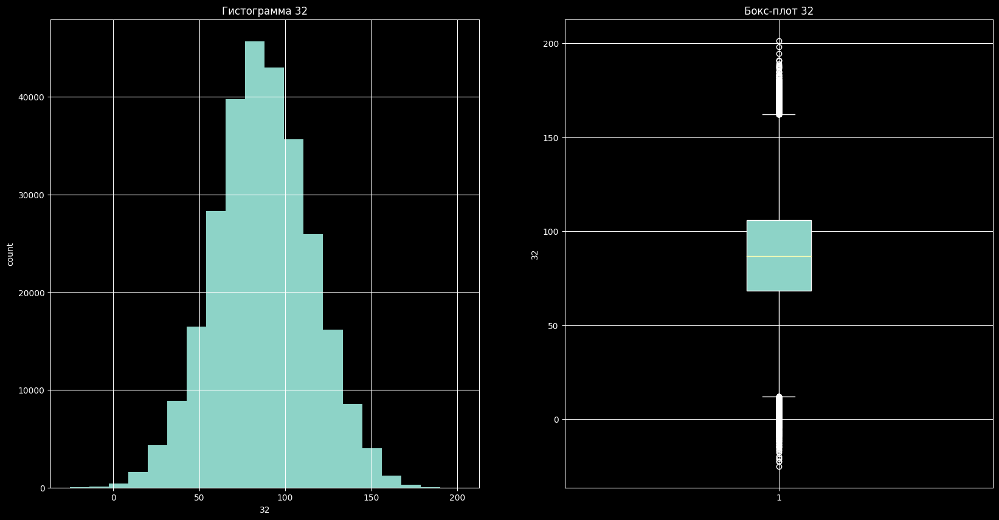

33
count    280535.000000
mean       -555.151749
std         260.714234
min       -1045.311529
25%        -771.296708
50%        -529.295053
75%        -341.781842
max        -137.646757
Name: 33, dtype: float64


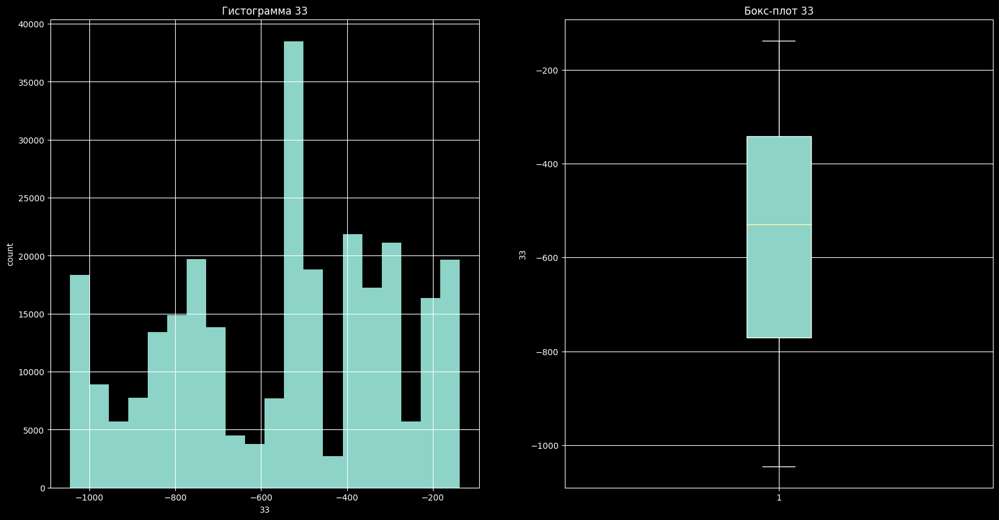

34
count    280535.000000
mean         36.343609
std          39.881895
min        -126.765594
25%           9.457743
50%          35.492470
75%          62.953598
max         218.161000
Name: 34, dtype: float64


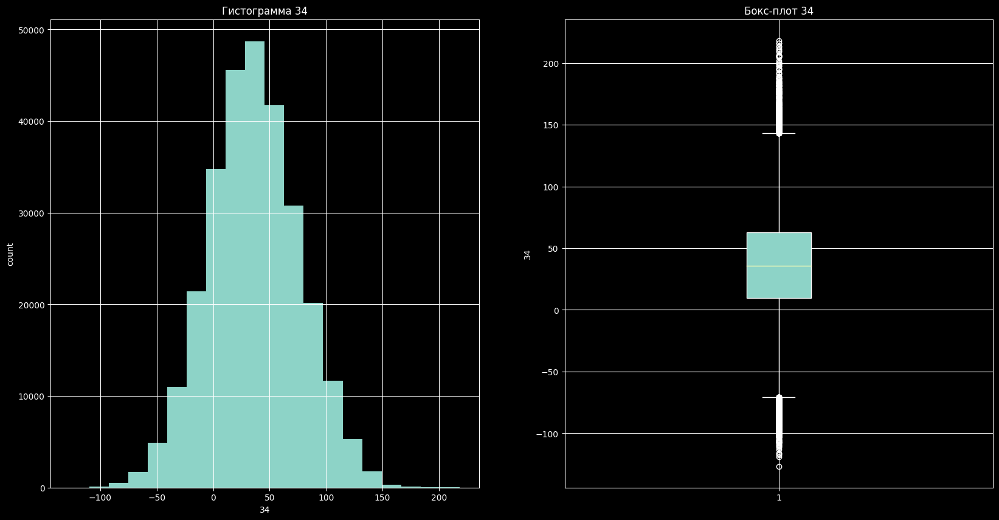

35
count    280535.000000
mean         75.168167
std          21.456314
min          -8.800842
25%          60.943548
50%          74.532780
75%          88.799020
max         166.948490
Name: 35, dtype: float64


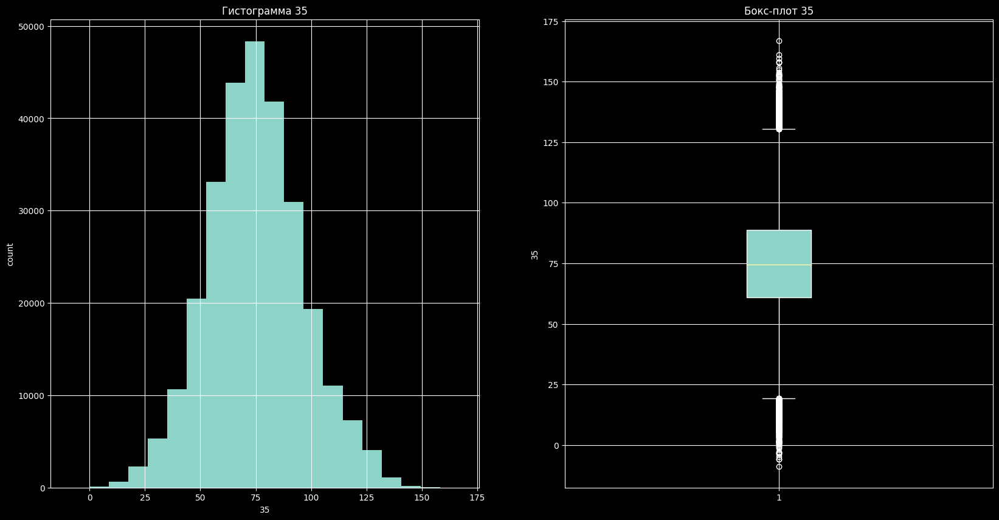

36
count    280535.000000
mean        -16.459909
std          25.828540
min        -125.226540
25%         -34.123104
50%         -16.179844
75%           1.199853
max          89.750755
Name: 36, dtype: float64


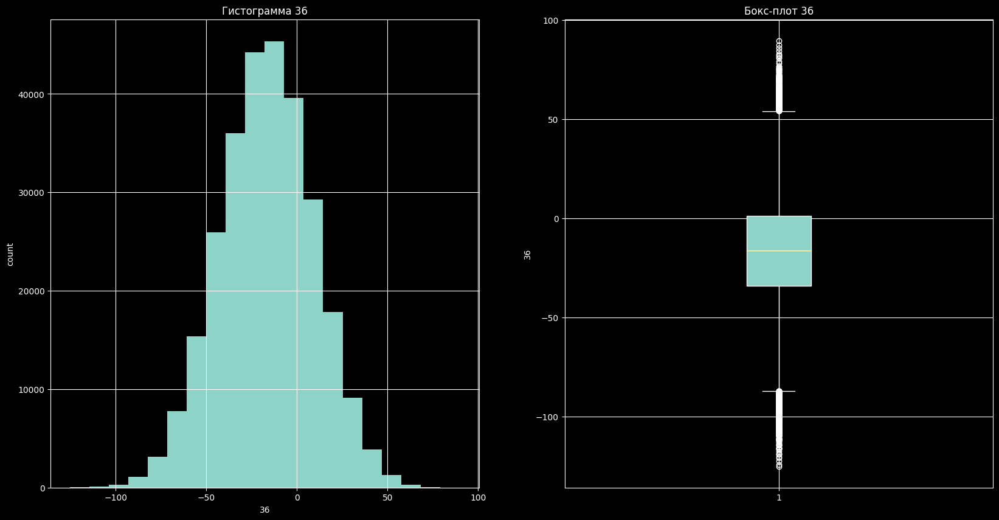

37
count    280535.000000
mean       -146.674941
std           9.956547
min        -190.385990
25%        -153.294365
50%        -146.761980
75%        -139.976935
max        -102.341890
Name: 37, dtype: float64


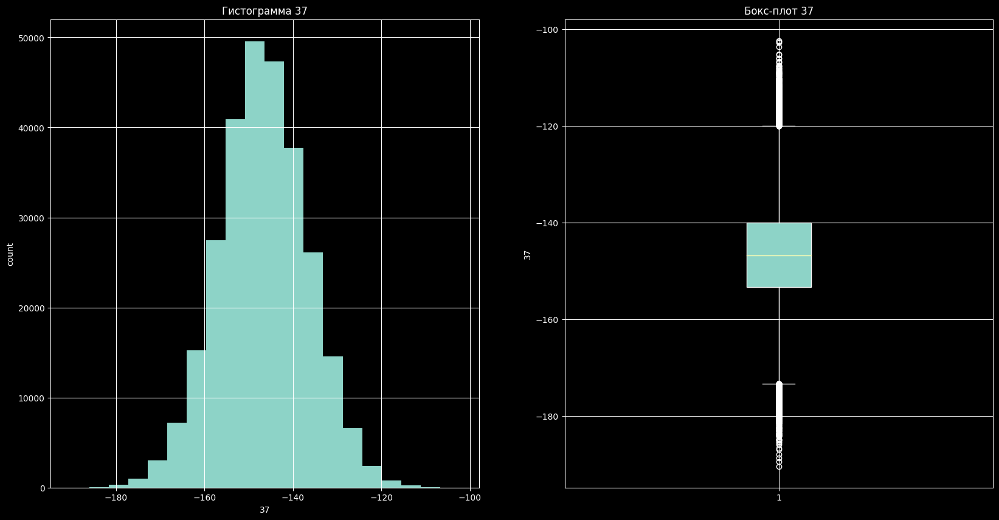

38
count    280535.000000
mean       -118.532948
std          13.124267
min        -168.637420
25%        -127.451177
50%        -118.595810
75%        -109.709520
max         -63.957638
Name: 38, dtype: float64


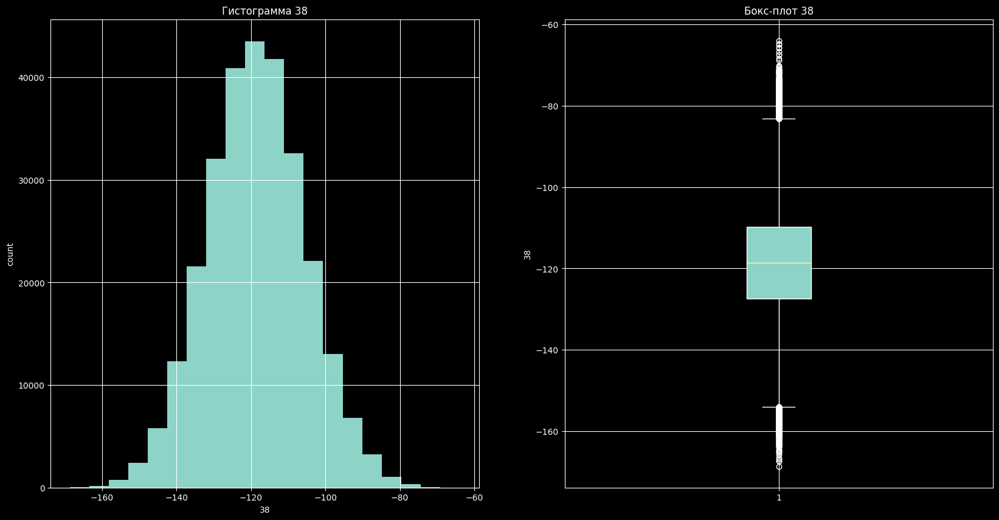

39
count    280535.000000
mean        -41.900912
std          19.207398
min        -130.044040
25%         -54.861372
50%         -42.064342
75%         -28.948542
max          40.955660
Name: 39, dtype: float64


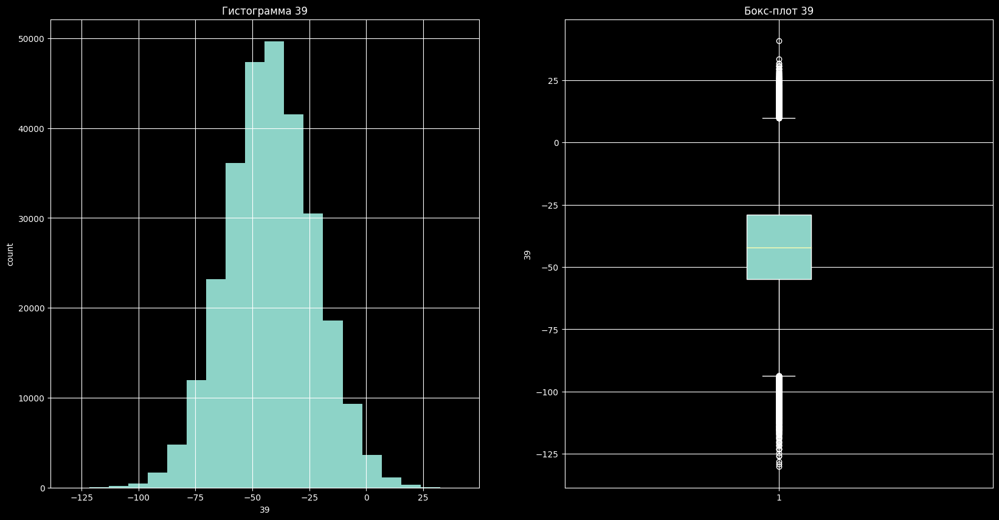

40
count    280535.000000
mean         -9.503985
std           8.188525
min         -44.640232
25%         -14.999104
50%          -9.496161
75%          -4.023318
max          25.123966
Name: 40, dtype: float64


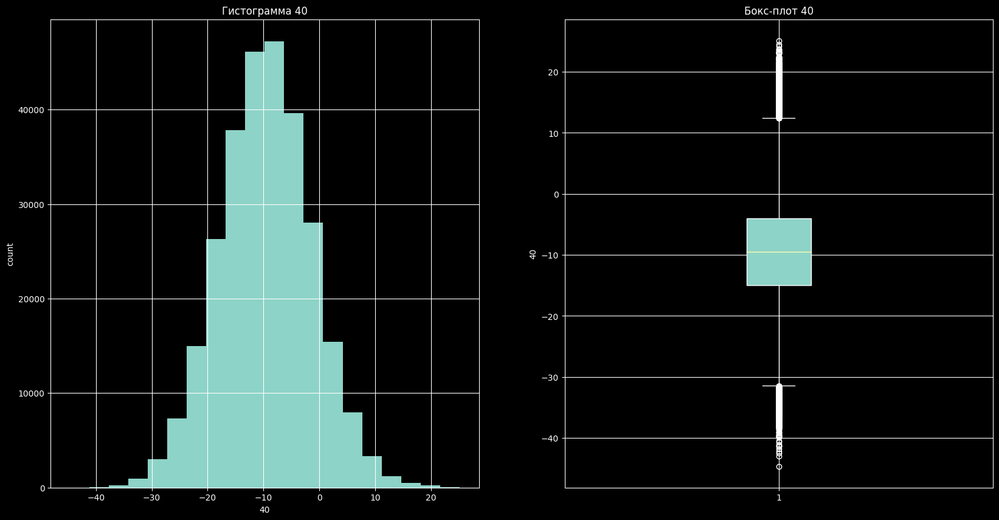

41
count    280535.000000
mean          4.063370
std           5.830368
min         -19.545673
25%           0.057146
50%           4.075182
75%           8.076971
max          29.969437
Name: 41, dtype: float64


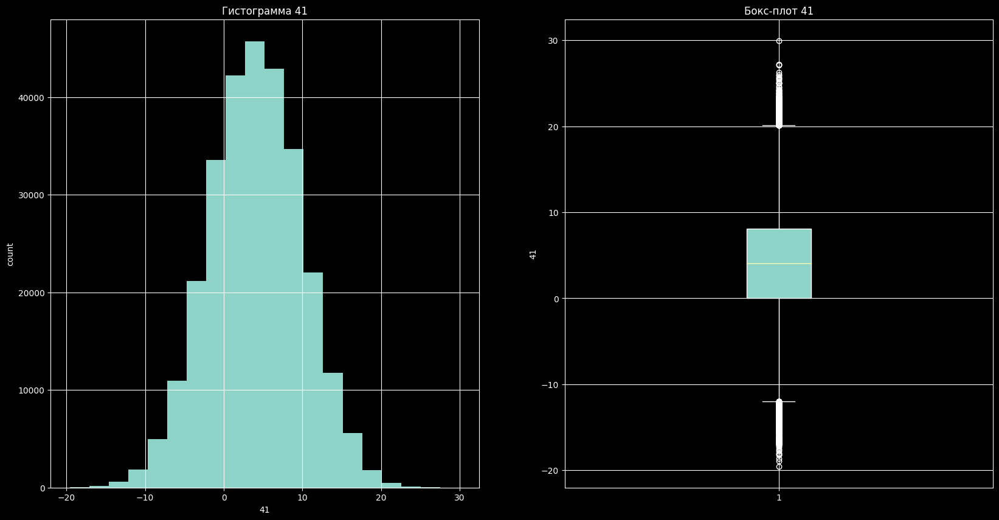

42
count    280535.000000
mean       -112.652084
std          56.944961
min        -335.376220
25%        -151.576720
50%        -112.970690
75%         -73.754654
max         116.259950
Name: 42, dtype: float64


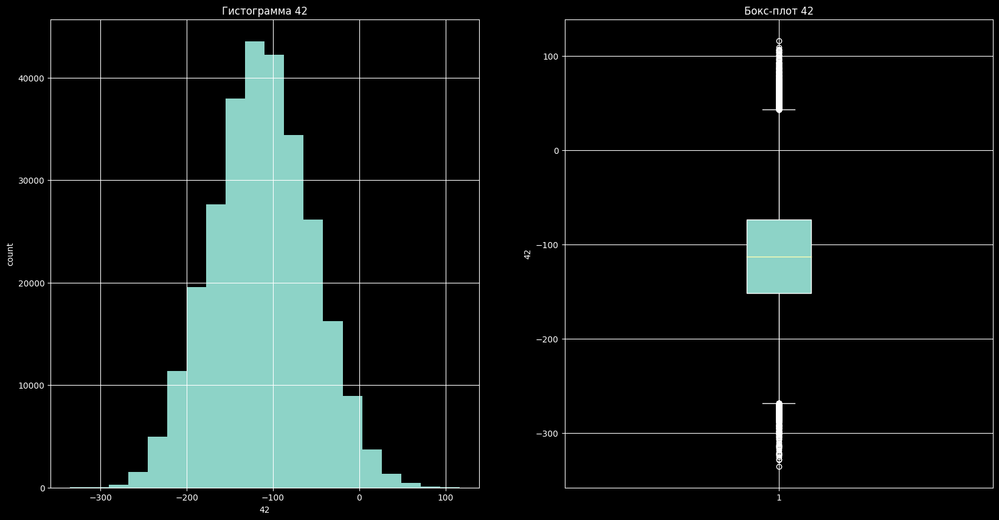

43
count    280535.000000
mean        120.820885
std          46.769195
min         -78.077320
25%          88.159278
50%         119.894745
75%         152.211520
max         335.198730
Name: 43, dtype: float64


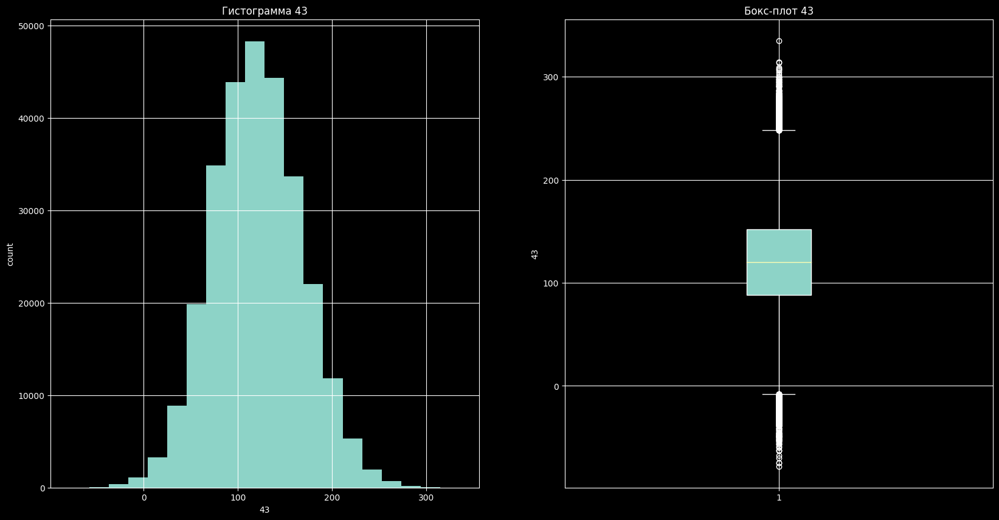

44
count    280535.000000
mean        -39.784543
std          14.735300
min         -63.102401
25%         -52.848742
50%         -39.983903
75%         -25.981664
max         -16.052626
Name: 44, dtype: float64


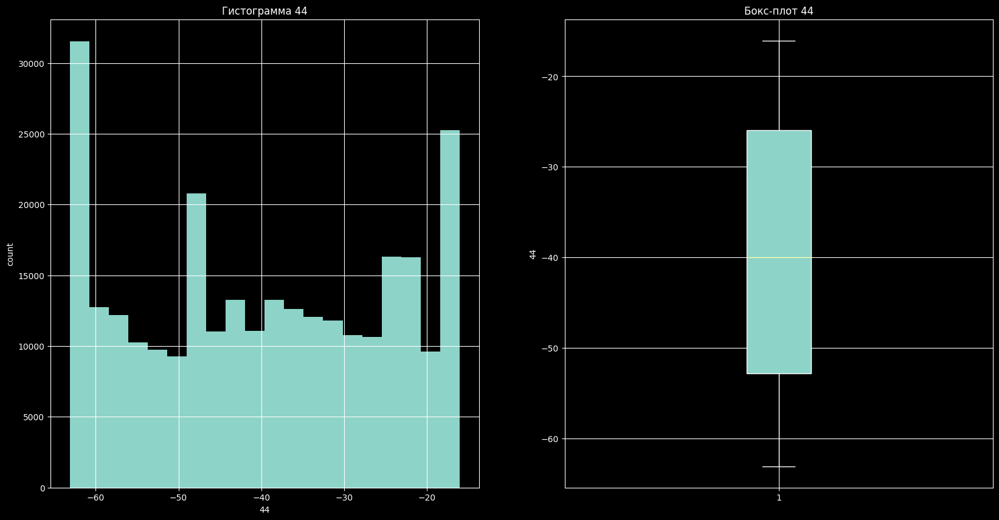

45
count    280535.000000
mean         58.973687
std          32.030512
min         -71.691635
25%          37.110747
50%          59.036377
75%          81.866660
max         178.599610
Name: 45, dtype: float64


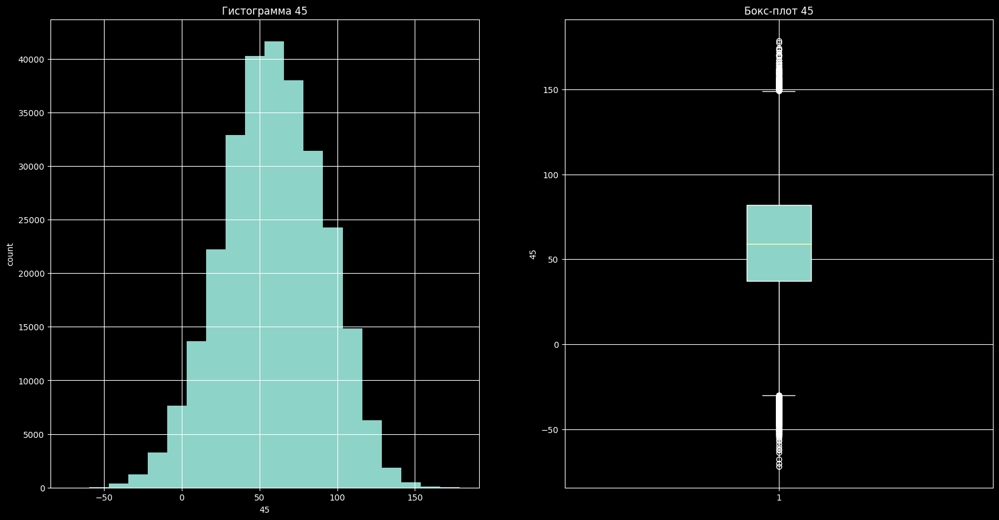

46
count    280535.000000
mean        -85.069550
std          63.246970
min        -334.213750
25%        -128.578710
50%         -85.362020
75%         -43.037675
max         191.472290
Name: 46, dtype: float64


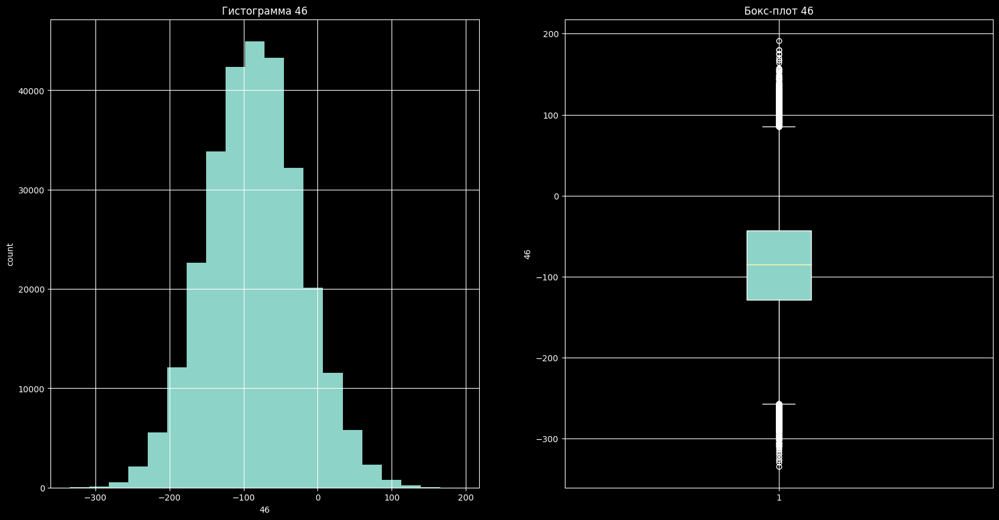

47
count    280535.000000
mean       -138.570415
std          57.731875
min        -389.026640
25%        -176.669760
50%        -137.532840
75%        -100.059958
max         112.636200
Name: 47, dtype: float64


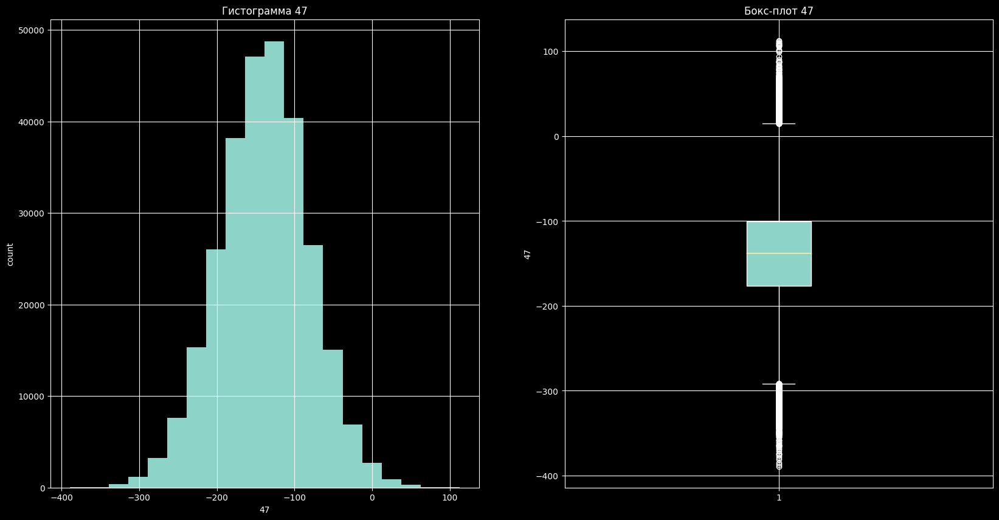

48
count    280535.000000
mean         47.977120
std          45.195964
min        -133.092030
25%          17.905985
50%          46.987766
75%          78.620672
max         239.683790
Name: 48, dtype: float64


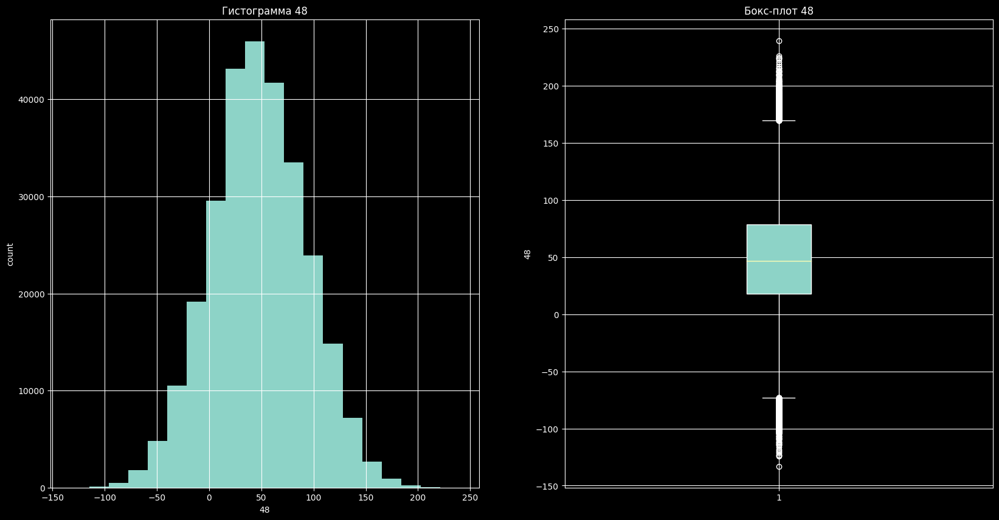

49
count    280535.000000
mean        -32.588737
std          58.282926
min        -322.812070
25%         -70.024217
50%         -29.367325
75%           7.449802
max         187.693790
Name: 49, dtype: float64


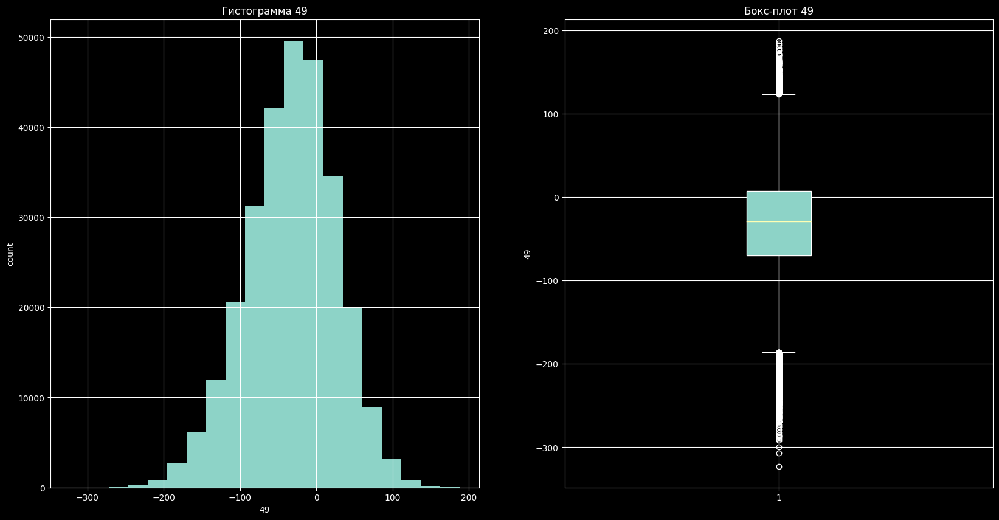

50
count    280535.000000
mean         26.599604
std          59.069998
min        -245.635030
25%         -12.401707
50%          27.538890
75%          66.135790
max         269.815220
Name: 50, dtype: float64


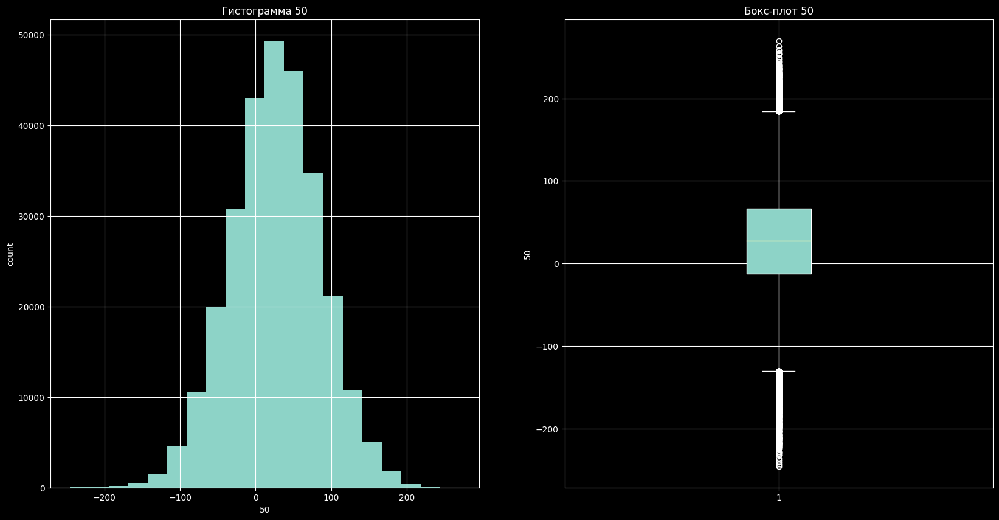

51
count    280535.000000
mean        -21.827361
std          51.778713
min        -264.633450
25%         -56.367489
50%         -22.232800
75%          12.674001
max         217.989270
Name: 51, dtype: float64


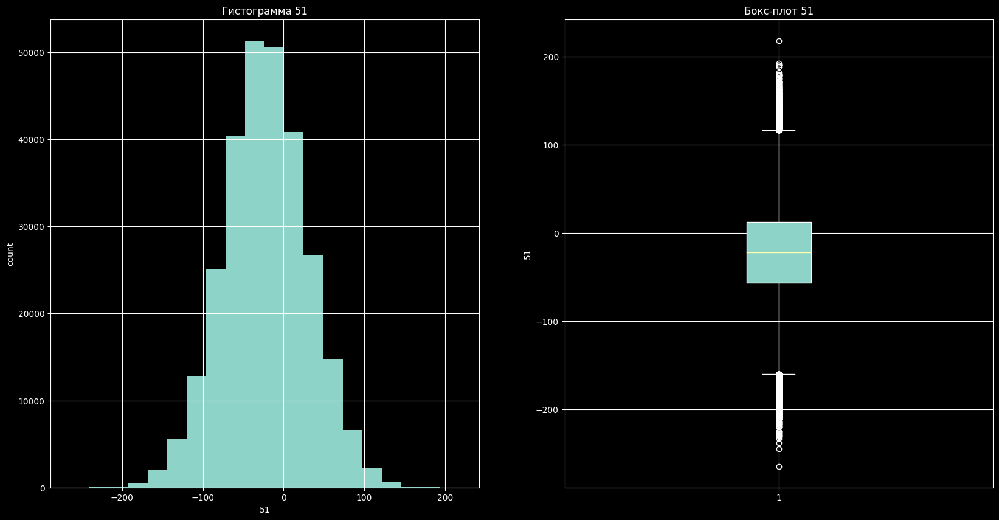

52
count    280535.000000
mean         67.040240
std          13.062947
min          16.126598
25%          58.482748
50%          67.253220
75%          75.958065
max         121.719666
Name: 52, dtype: float64


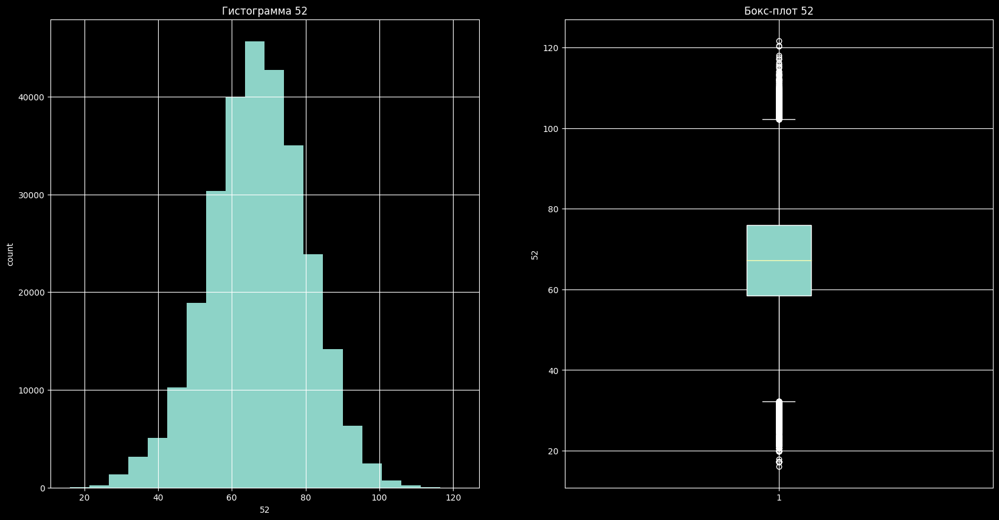

53
count    280535.000000
mean       -118.003273
std          54.773385
min        -361.489350
25%        -154.638150
50%        -117.690765
75%         -80.809440
max         120.150590
Name: 53, dtype: float64


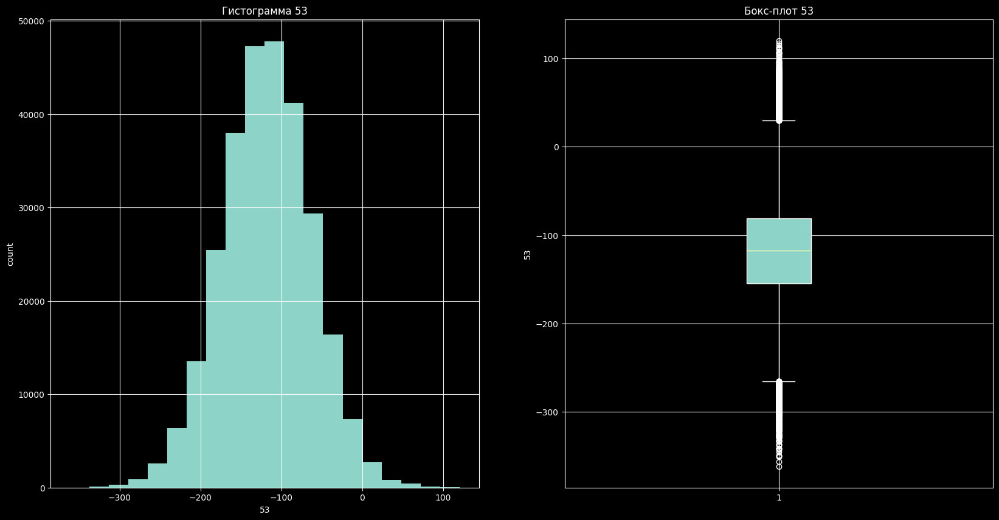

54
count    280535.000000
mean         88.030752
std           4.773794
min          66.851030
25%          84.712585
50%          88.016710
75%          91.309275
max         108.044174
Name: 54, dtype: float64


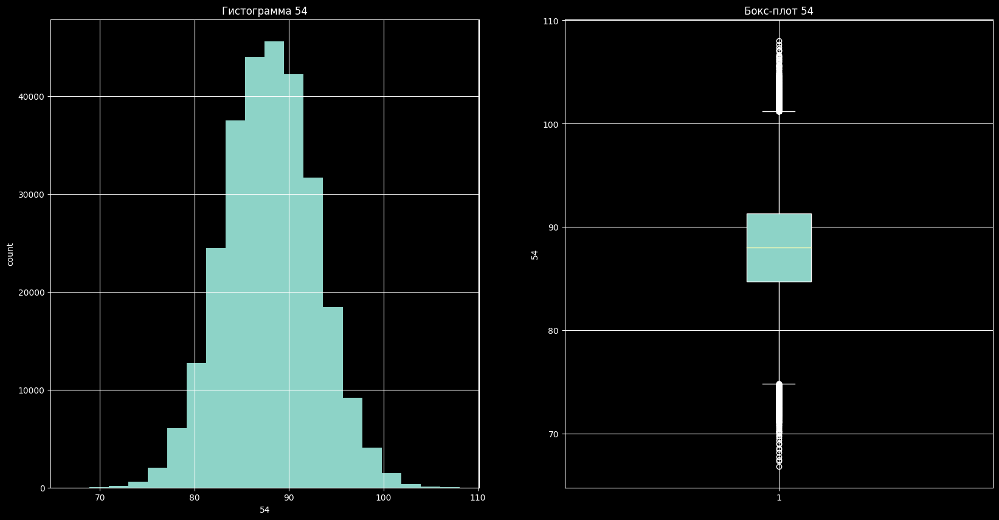

55
count    280535.000000
mean         69.207267
std          11.953157
min          18.996754
25%          61.306342
50%          69.341900
75%          77.267830
max         114.881516
Name: 55, dtype: float64


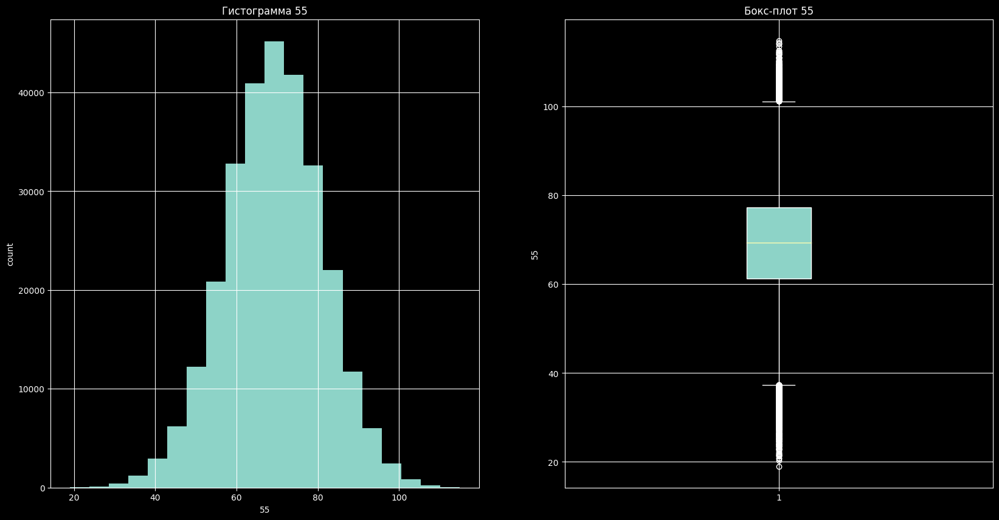

56
count    280535.000000
mean       -132.890507
std           7.820231
min        -165.421420
25%        -138.084010
50%        -132.807330
75%        -127.610500
max         -98.527270
Name: 56, dtype: float64


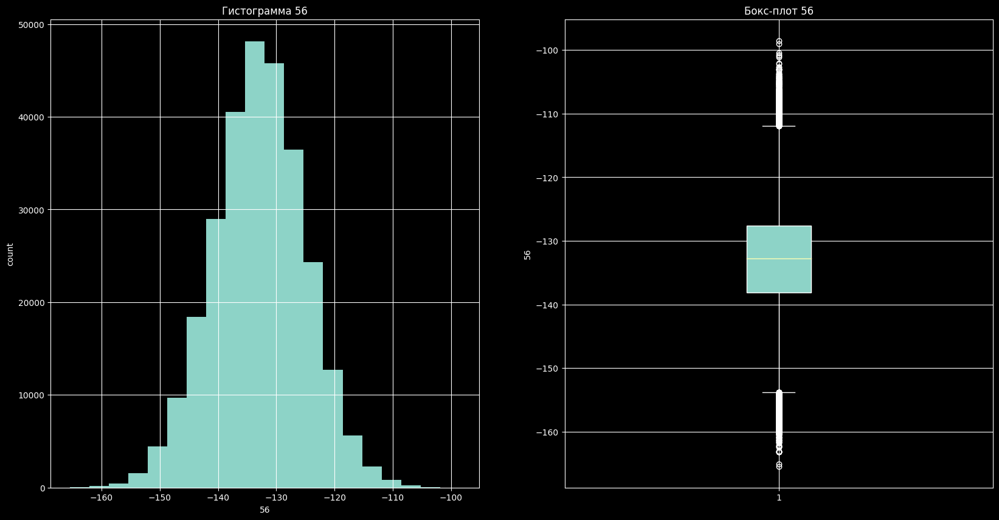

57
count    280535.000000
mean         13.123351
std          51.077113
min        -196.183610
25%         -22.542454
50%          13.027288
75%          48.083530
max         232.707750
Name: 57, dtype: float64


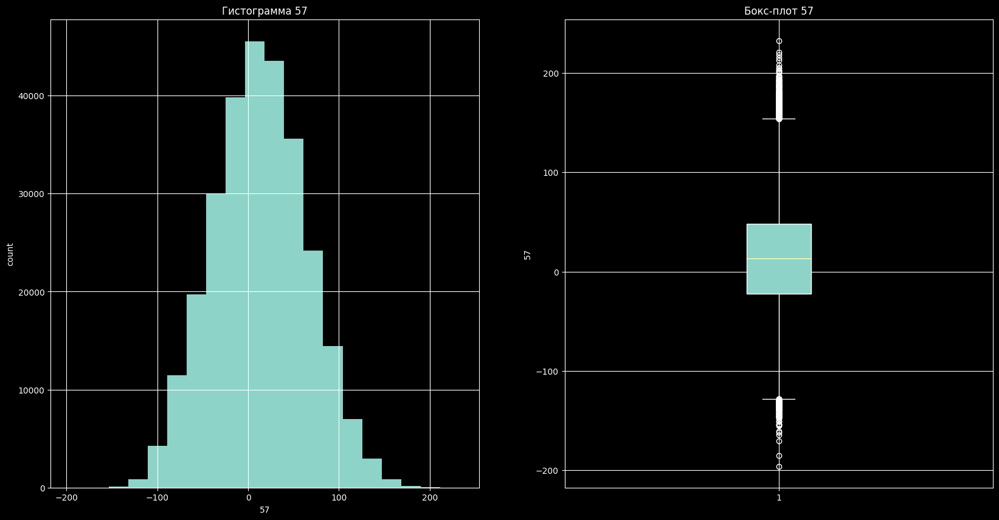

58
count    280535.000000
mean       -119.606000
std          55.170226
min        -328.829280
25%        -157.451175
50%        -120.427370
75%         -81.756512
max         113.967360
Name: 58, dtype: float64


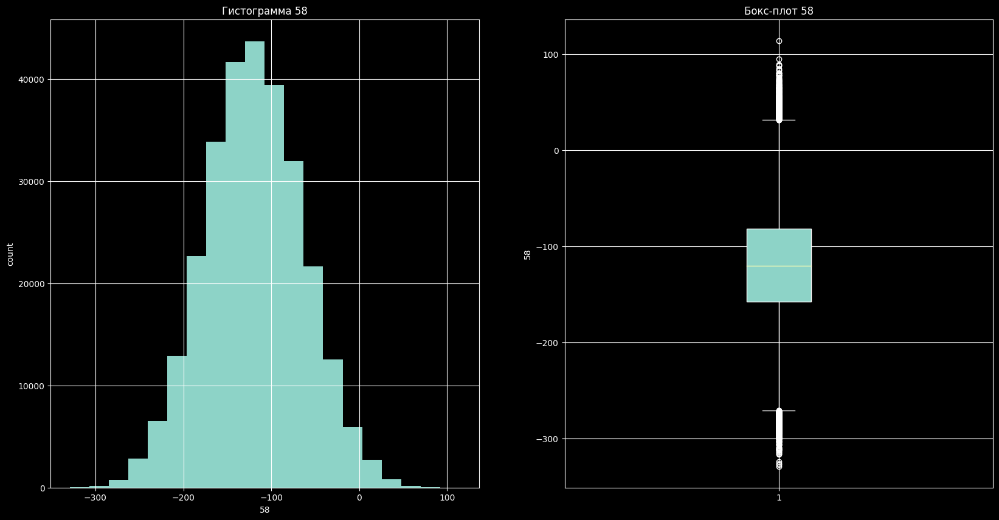

59
count    280535.000000
mean       -315.825456
std         210.641959
min        -681.042024
25%        -497.829019
50%        -315.555421
75%        -133.343894
max          48.727576
Name: 59, dtype: float64


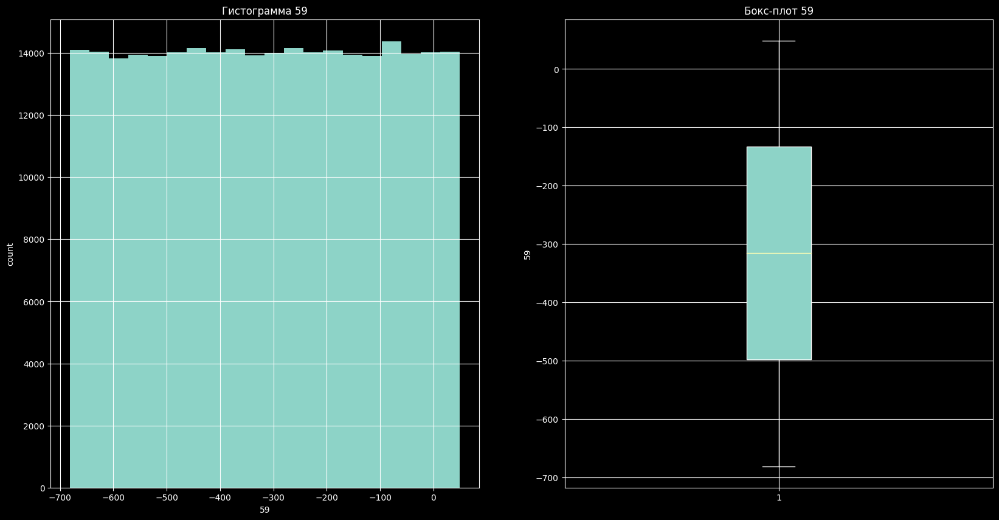

60
count    280535.000000
mean        -64.944391
std          62.517226
min        -400.791100
25%        -106.769590
50%         -63.797943
75%         -22.612144
max         197.279700
Name: 60, dtype: float64


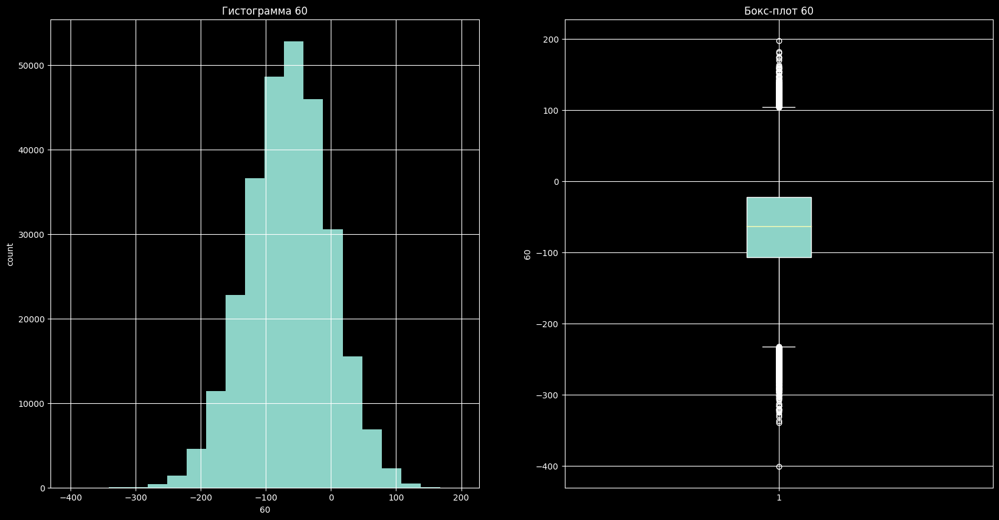

61
count    280535.000000
mean       -130.690919
std           9.570510
min        -169.028370
25%        -137.433640
50%        -130.913860
75%        -124.303885
max         -91.366425
Name: 61, dtype: float64


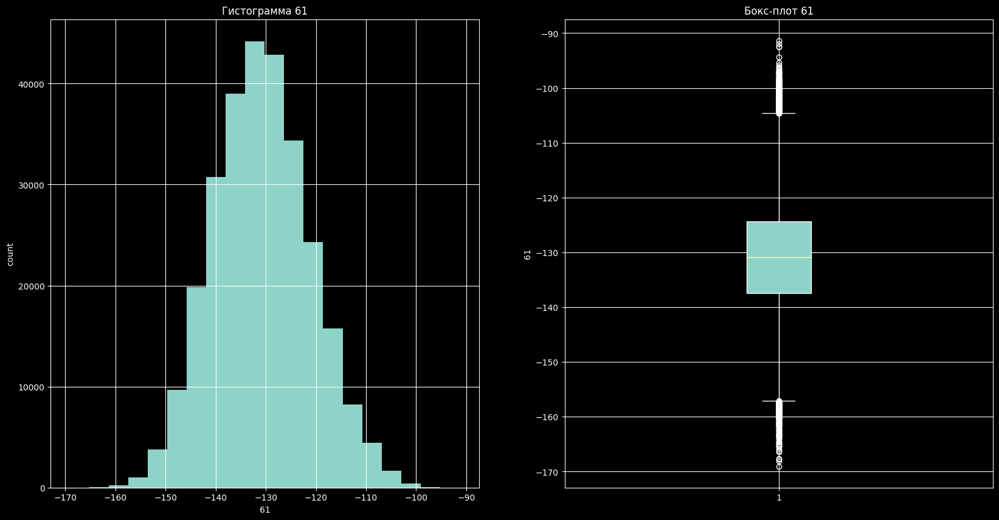

62
count    280535.000000
mean        -79.081180
std          30.485520
min        -214.821140
25%         -98.820138
50%         -78.549350
75%         -58.650658
max          48.822197
Name: 62, dtype: float64


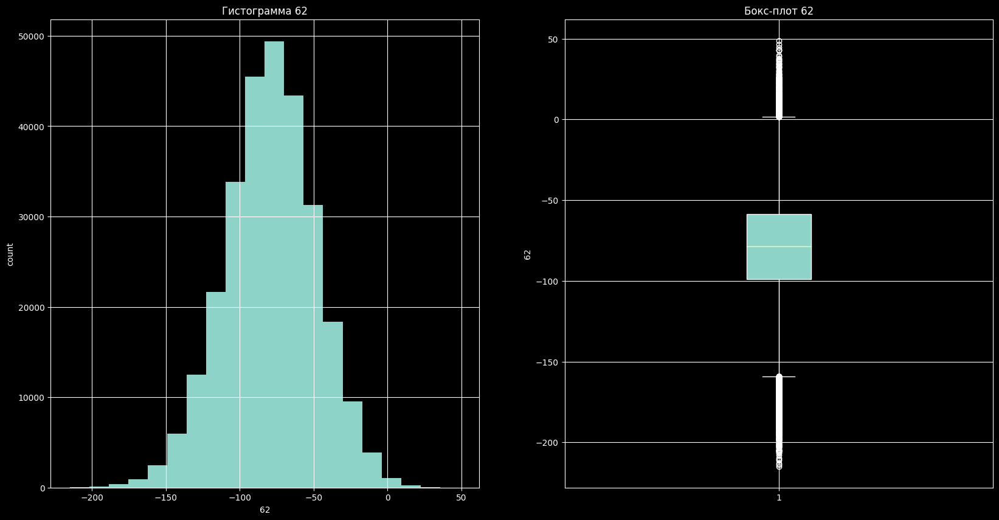

63
count    280535.000000
mean         33.244465
std          28.902296
min         -85.825500
25%          16.945875
50%          34.671993
75%          52.093507
max         141.025270
Name: 63, dtype: float64


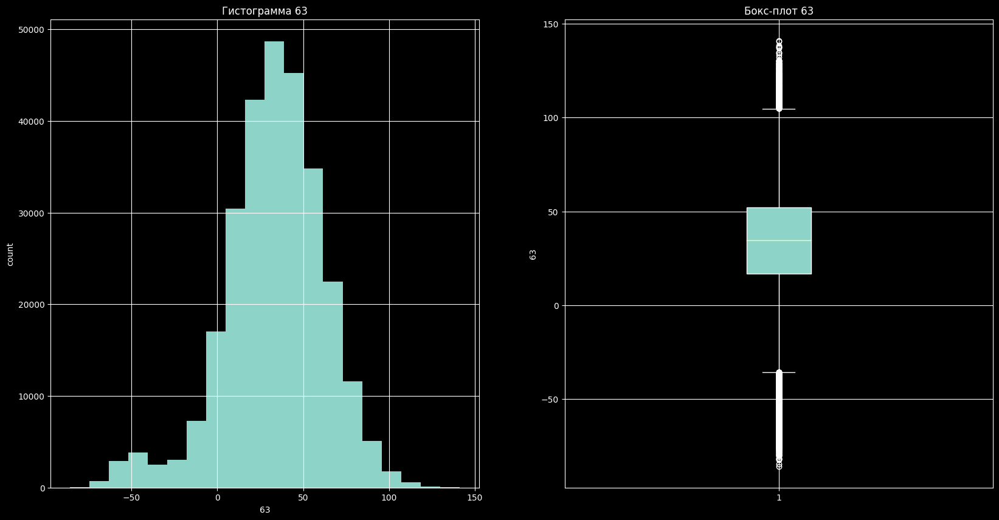

64
count    280535.000000
mean       -154.697617
std          41.216136
min        -346.239320
25%        -180.669690
50%        -153.879100
75%        -127.192390
max          17.344528
Name: 64, dtype: float64


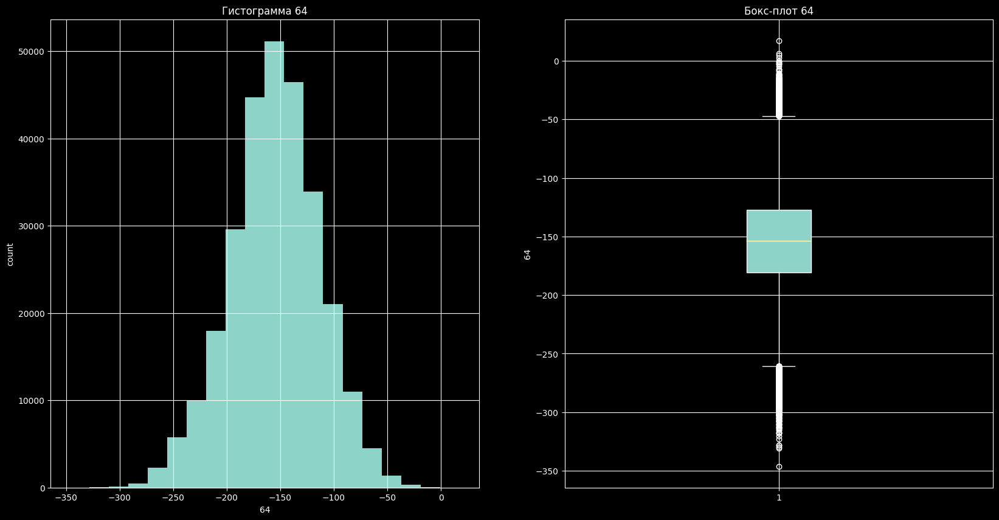

65
count    280535.000000
mean         13.696453
std          98.996770
min        -157.593866
25%         -71.738241
50%          13.110913
75%          99.340971
max         185.096719
Name: 65, dtype: float64


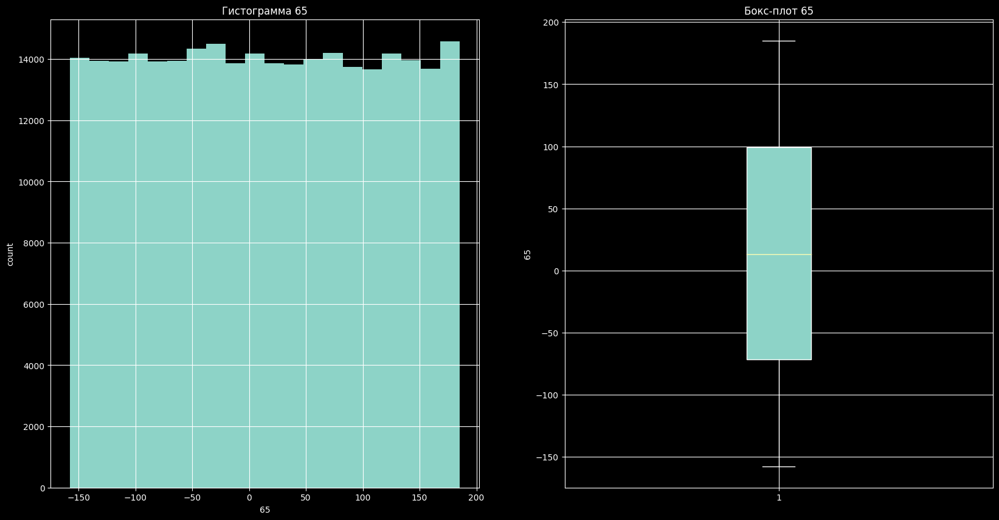

66
count    280535.000000
mean         67.793600
std           1.825380
min          59.835790
25%          66.584488
50%          67.816650
75%          69.029700
max          75.474625
Name: 66, dtype: float64


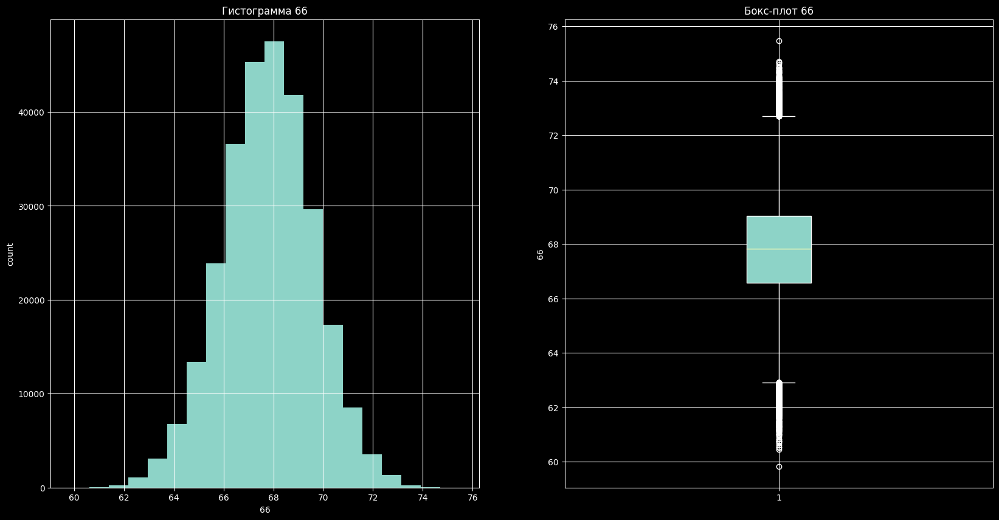

67
count    280535.000000
mean         23.523355
std          55.328733
min        -213.492420
25%         -12.510499
50%          23.415112
75%          59.702573
max         264.347200
Name: 67, dtype: float64


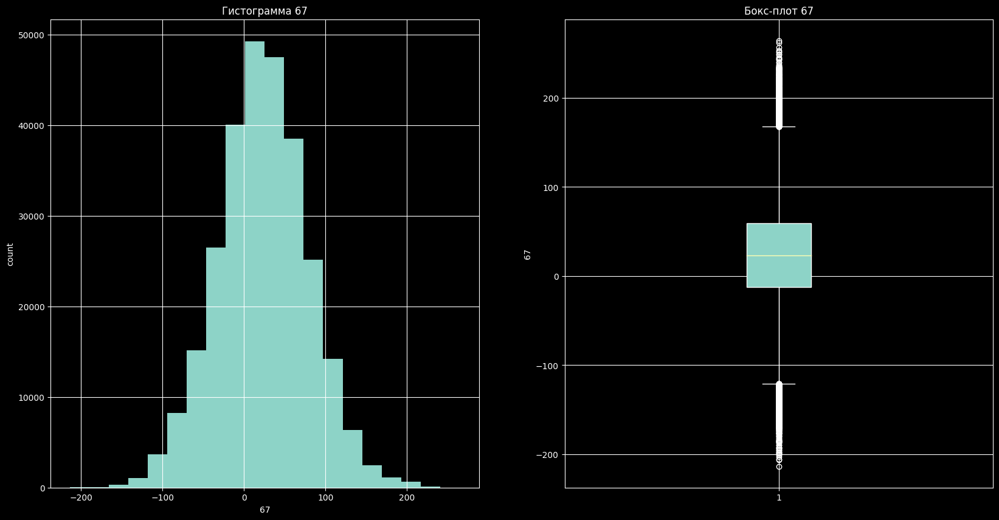

68
count    280535.000000
mean         74.871897
std          61.319200
min        -190.483150
25%          33.796422
50%          74.840126
75%         115.869375
max         319.601040
Name: 68, dtype: float64


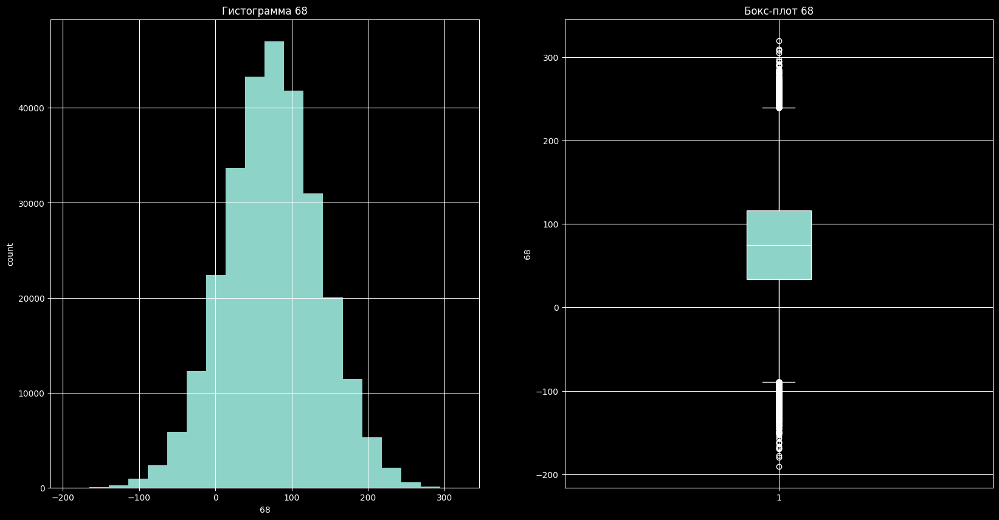

69
count    280535.000000
mean        115.600059
std          21.218969
min          18.601448
25%         101.672300
50%         116.035995
75%         129.631180
max         213.577260
Name: 69, dtype: float64


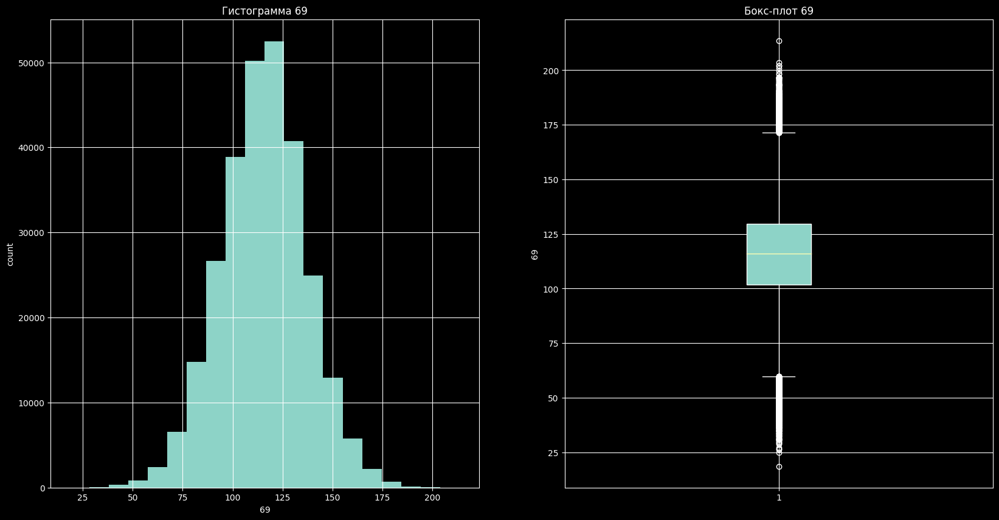

70
count    280535.000000
mean       -798.033164
std         385.506507
min       -1297.924962
25%       -1074.464888
50%       -1074.464888
75%        -503.168511
max          98.770811
Name: 70, dtype: float64


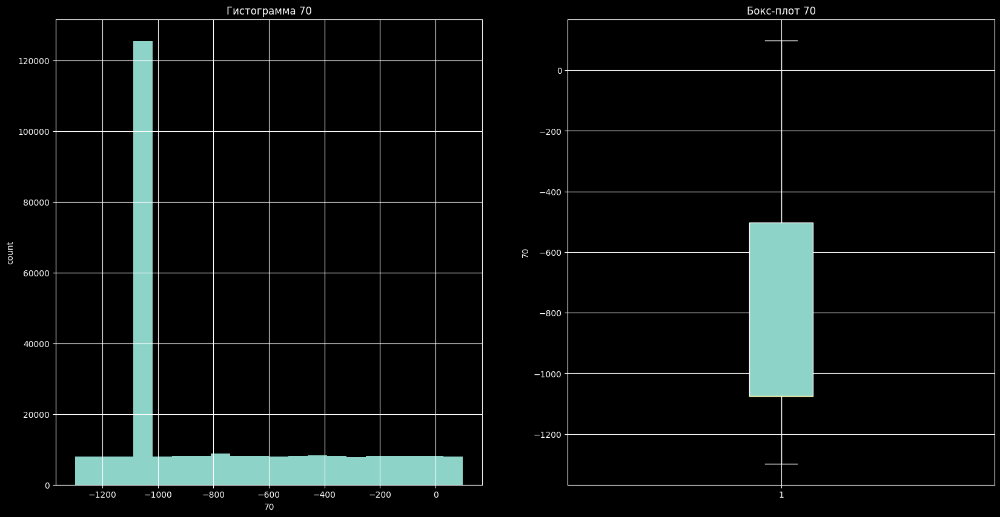

71
count    280535.000000
mean        -47.712148
std          41.728637
min        -209.935760
25%         -75.636830
50%         -48.413030
75%         -19.684170
max         126.973220
Name: 71, dtype: float64


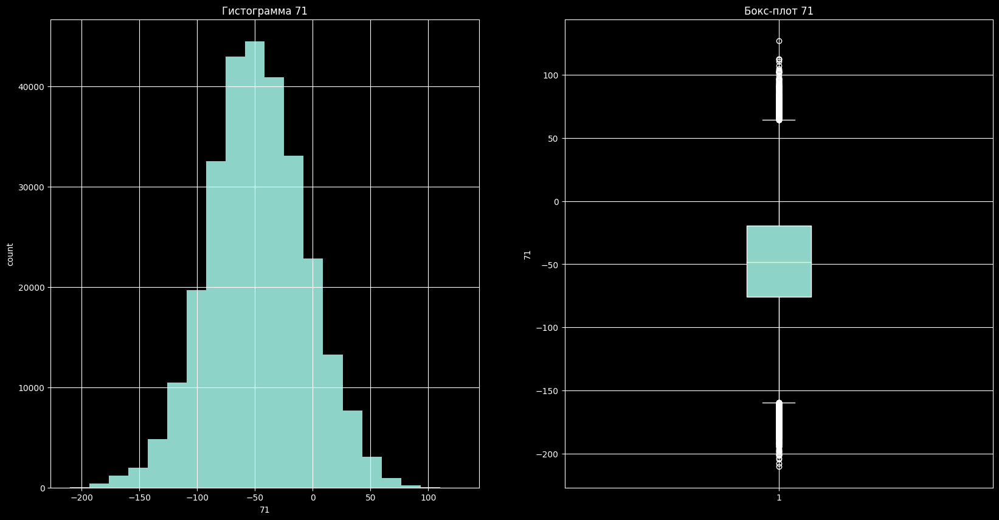

In [ ]:
for colum in [str(_) for _ in range(72)]:
    print(colum)
    print(df[colum].describe())
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].hist(df[colum], bins=20)
    ax[0].set_title('Гистограмма ' + colum)
    ax[0].set_xlabel(colum)
    ax[0].set_ylabel('count')
    ax[0].grid(True)

    ax[1].boxplot(df[colum], patch_artist=True)
    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum)
    ax[1].grid(True)
    plt.show()

### Train

0
count    9756.000000
mean      -85.495239
std        25.985869
min      -173.032560
25%      -103.417380
50%       -85.193517
75%       -67.492968
max         5.052292
Name: 0, dtype: float64


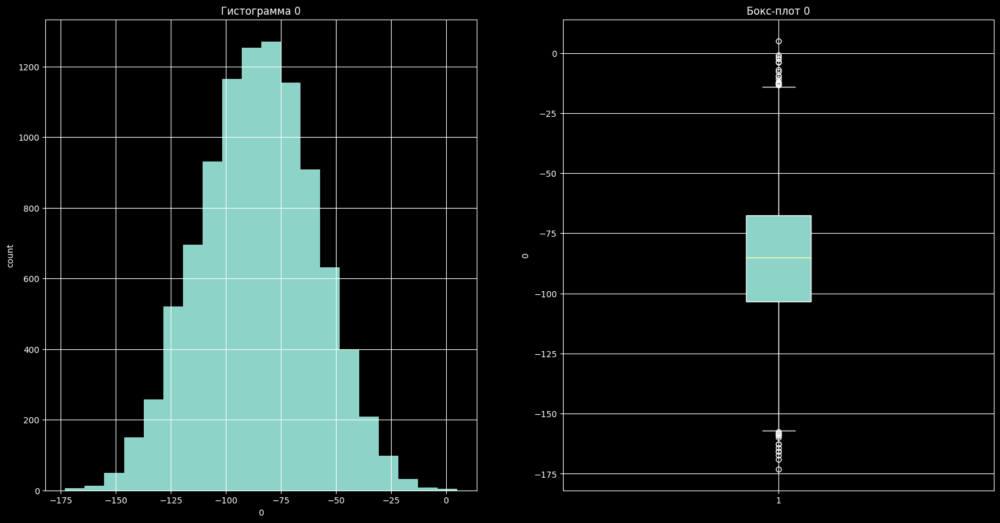

1
count    9756.000000
mean        7.602217
std         4.995552
min       -11.560507
25%         4.150611
50%         7.584998
75%        10.988419
max        26.741890
Name: 1, dtype: float64


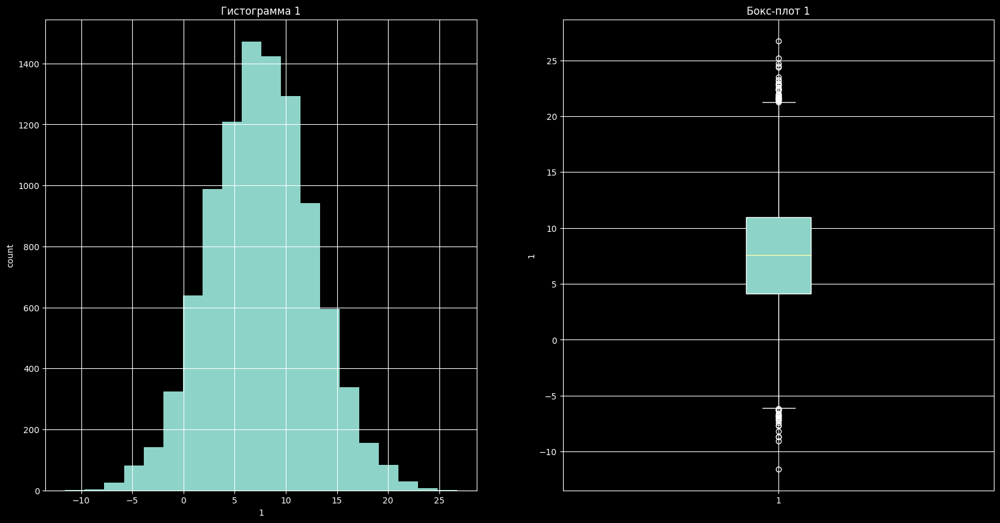

2
count    9756.000000
mean      -43.872343
std        39.260739
min      -187.292630
25%       -69.837885
50%       -43.036492
75%       -17.255111
max       134.859800
Name: 2, dtype: float64


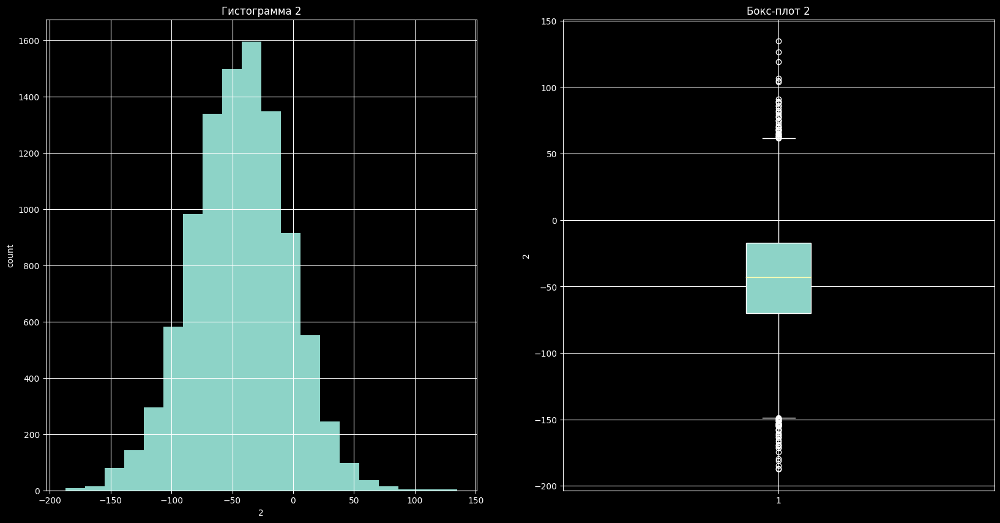

3
count    9756.000000
mean     -146.154699
std        20.314058
min      -219.724800
25%      -160.047202
50%      -146.449745
75%      -132.585393
max       -71.194680
Name: 3, dtype: float64


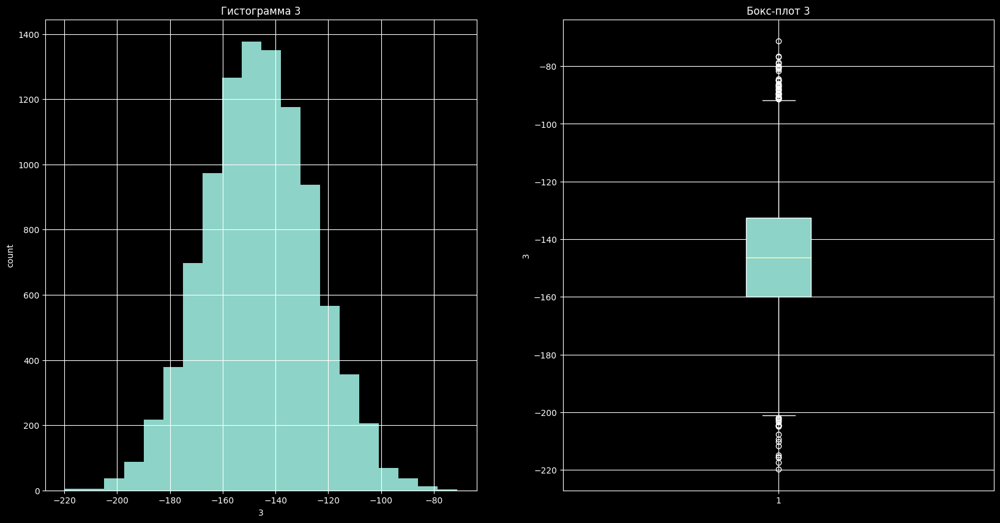

4
count    9756.000000
mean      112.033630
std        47.554473
min       -71.243350
25%        79.787993
50%       112.352070
75%       144.079180
max       297.368620
Name: 4, dtype: float64


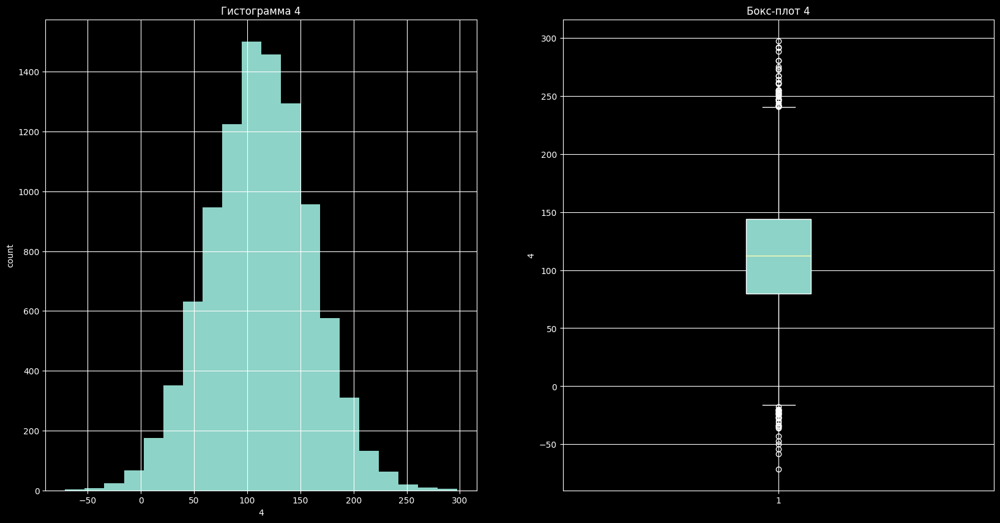

5
count    9756.000000
mean      -73.699378
std        28.764322
min      -184.962450
25%       -93.676849
50%       -74.093830
75%       -54.128315
max        31.378914
Name: 5, dtype: float64


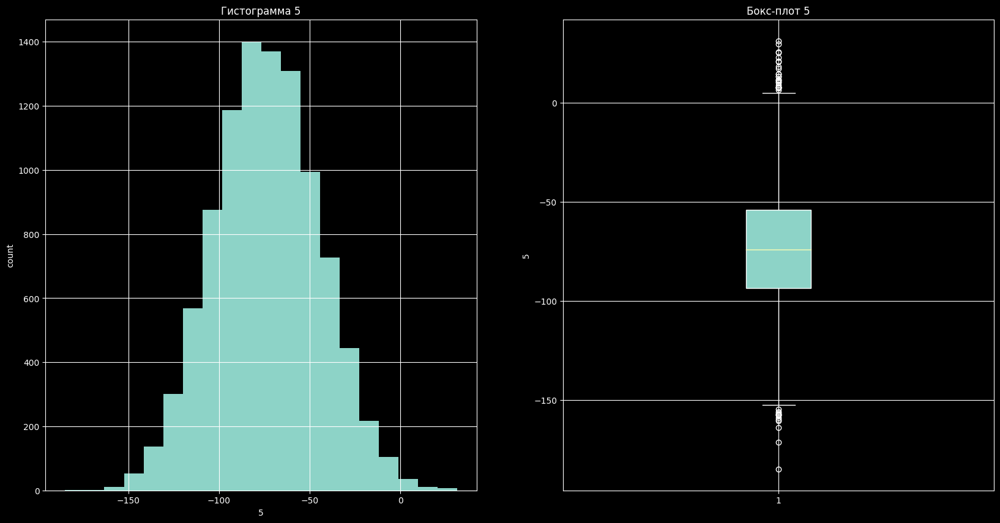

6
count    9756.000000
mean     -443.500591
std       281.497466
min      -791.443909
25%      -755.968068
50%      -517.644263
75%      -203.398926
max       109.632035
Name: 6, dtype: float64


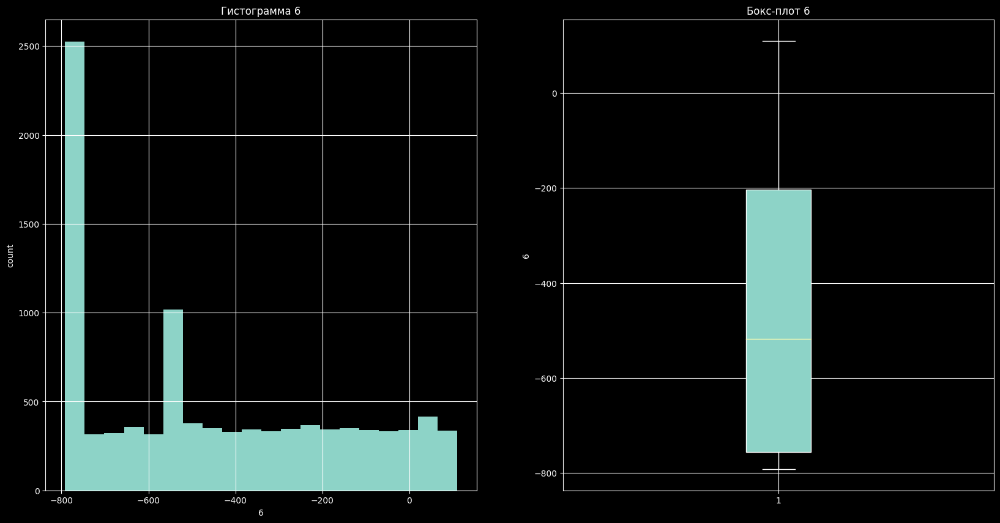

7
count    9756.000000
mean       21.849024
std        66.364147
min      -250.681340
25%       -21.130224
50%        22.319749
75%        66.436262
max       261.413420
Name: 7, dtype: float64


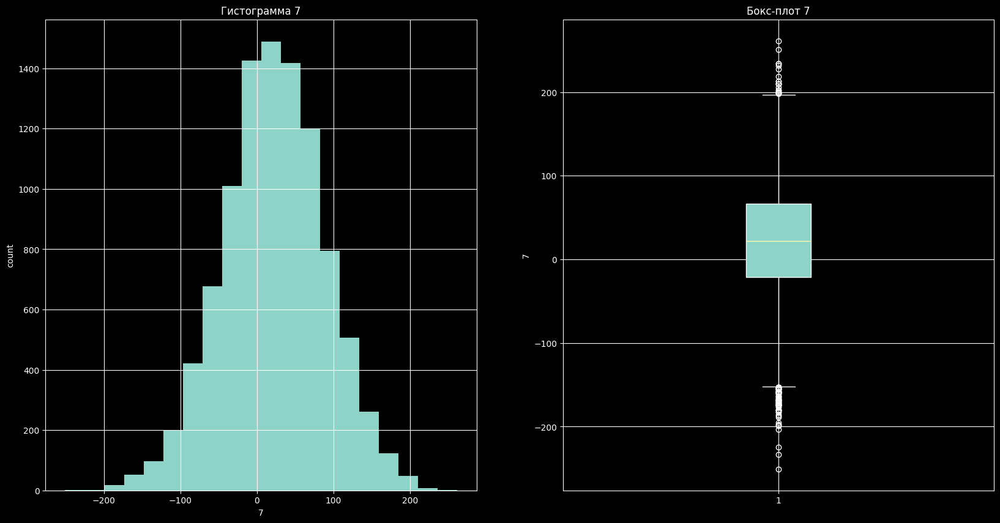

8
count    9756.000000
mean      123.098243
std         6.416586
min        99.001770
25%       118.788339
50%       122.989927
75%       127.469700
max       145.178470
Name: 8, dtype: float64


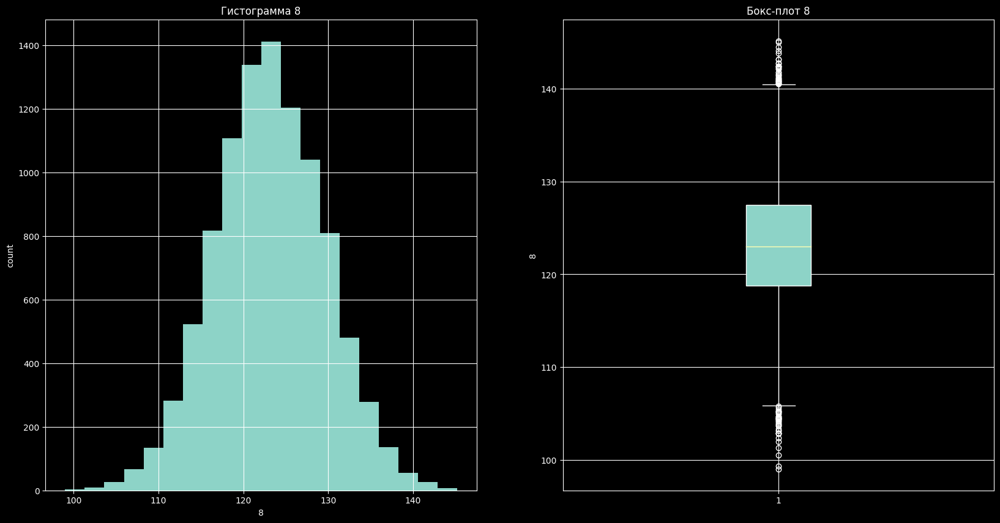

9
count    9756.000000
mean      126.565141
std        64.931700
min      -113.104600
25%        82.031719
50%       126.537905
75%       170.134120
max       353.214970
Name: 9, dtype: float64


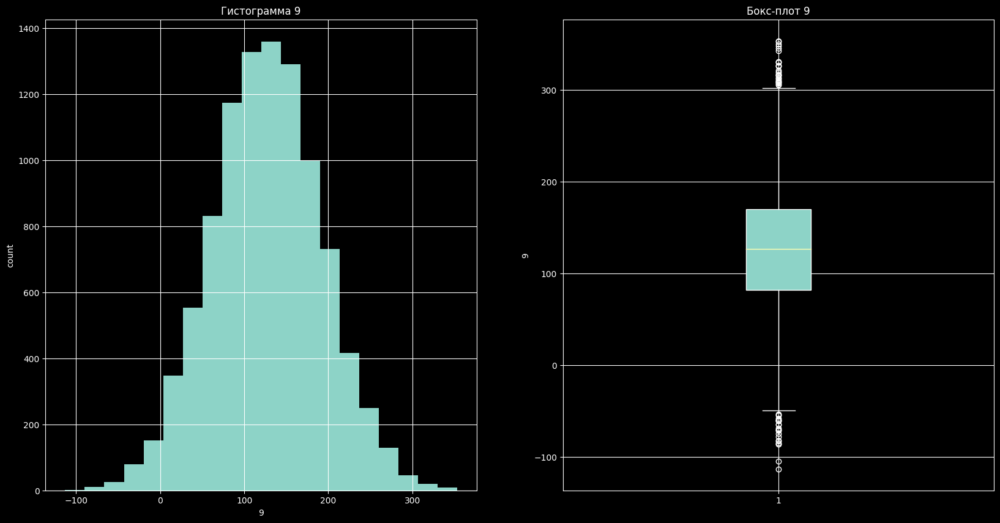

10
count    9756.000000
mean     -140.664928
std        41.396844
min      -287.202640
25%      -168.203542
50%      -140.027990
75%      -112.704594
max        14.706146
Name: 10, dtype: float64


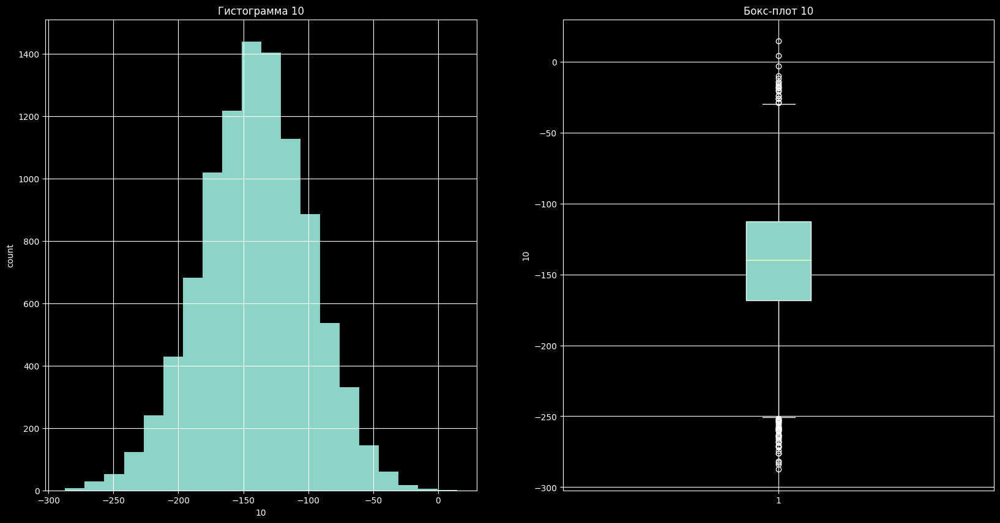

11
count    9756.000000
mean      -69.338487
std        51.259062
min      -344.520570
25%      -103.191335
50%       -68.808912
75%       -35.156083
max       133.851600
Name: 11, dtype: float64


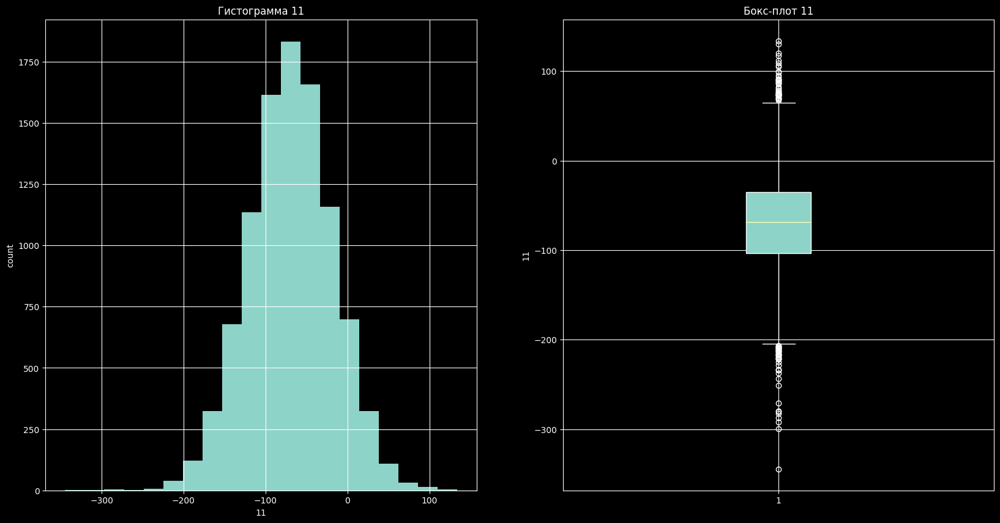

12
count    9756.000000
mean      -42.301024
std        41.029576
min      -201.855180
25%       -70.320925
50%       -41.157401
75%       -14.419285
max        89.709700
Name: 12, dtype: float64


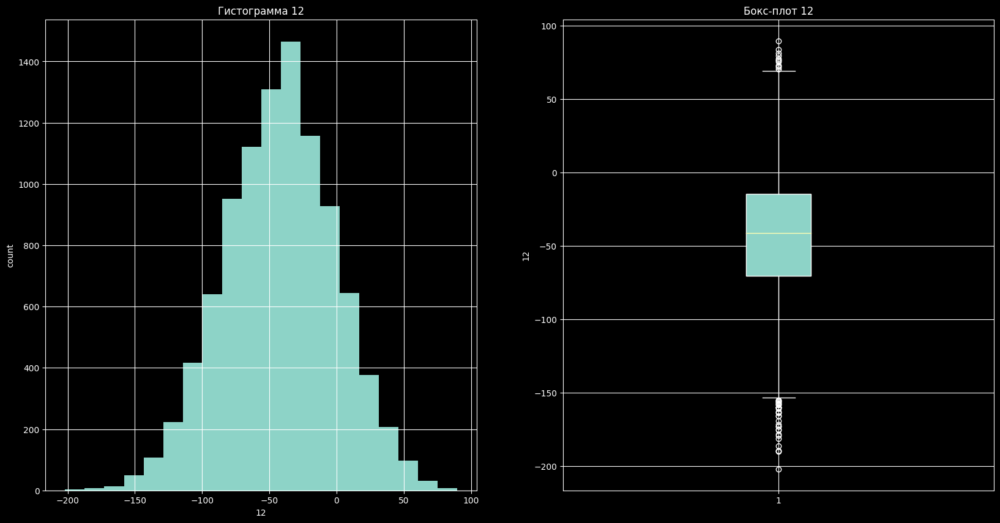

13
count    9756.000000
mean        5.883810
std        37.539640
min      -128.040480
25%       -19.534490
50%         5.922571
75%        31.481734
max       134.725160
Name: 13, dtype: float64


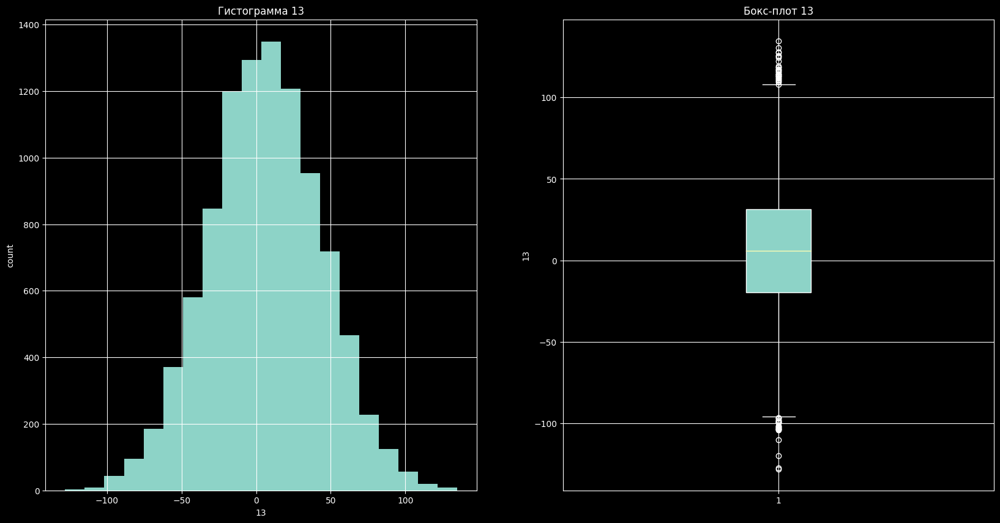

14
count    9756.000000
mean      149.062582
std        34.020392
min        21.577286
25%       126.422171
50%       150.233285
75%       172.363670
max       278.276180
Name: 14, dtype: float64


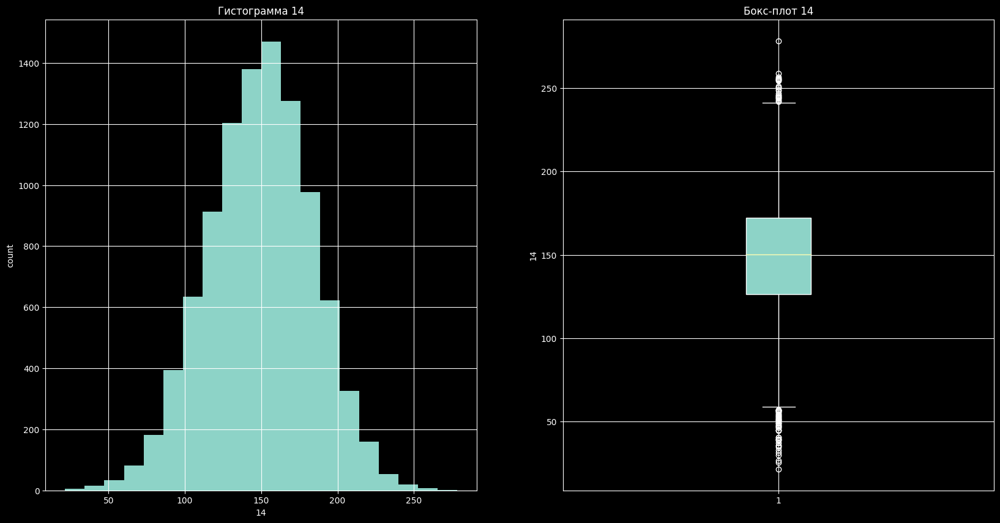

15
count    9756.000000
mean      -23.908301
std        13.046515
min       -77.179040
25%       -32.279138
50%       -23.770185
75%       -15.504712
max        30.950819
Name: 15, dtype: float64


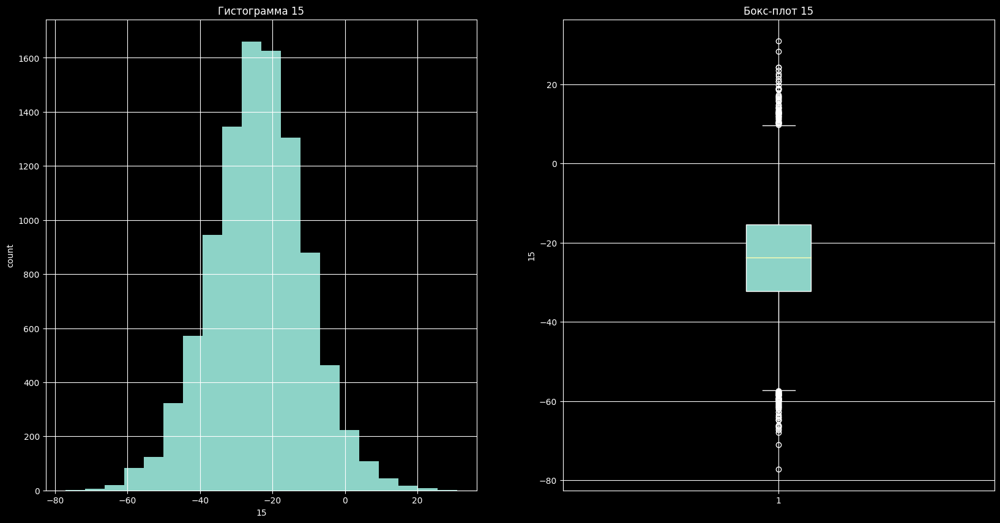

16
count    9756.000000
mean       -1.986735
std        20.992660
min       -70.050766
25%       -16.347586
50%        -2.103385
75%        11.966397
max        88.695940
Name: 16, dtype: float64


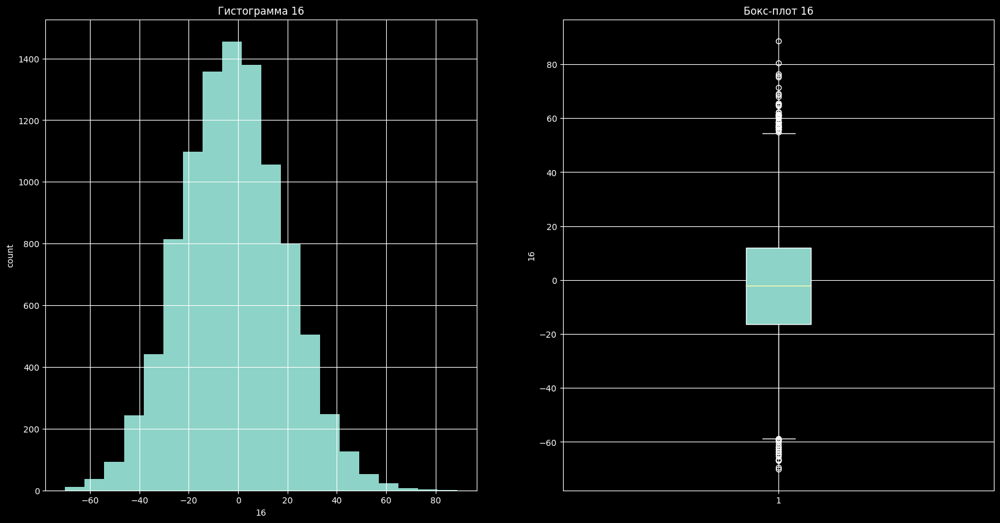

17
count    9756.000000
mean      -13.353534
std        54.870610
min      -222.327650
25%       -49.662866
50%       -12.388333
75%        23.937886
max       189.463420
Name: 17, dtype: float64


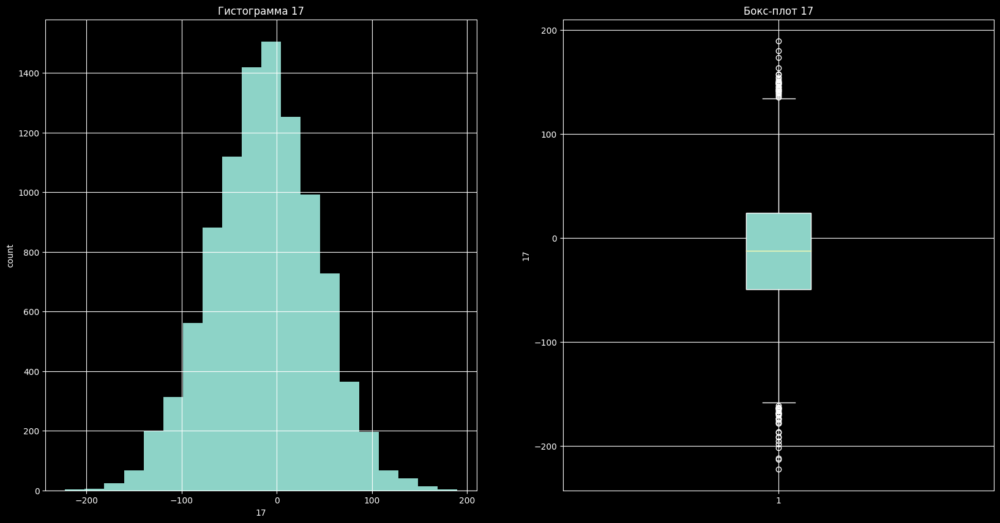

18
count    9756.000000
mean     -138.216565
std        48.940150
min      -329.597720
25%      -171.203615
50%      -138.572435
75%      -106.309265
max        82.683810
Name: 18, dtype: float64


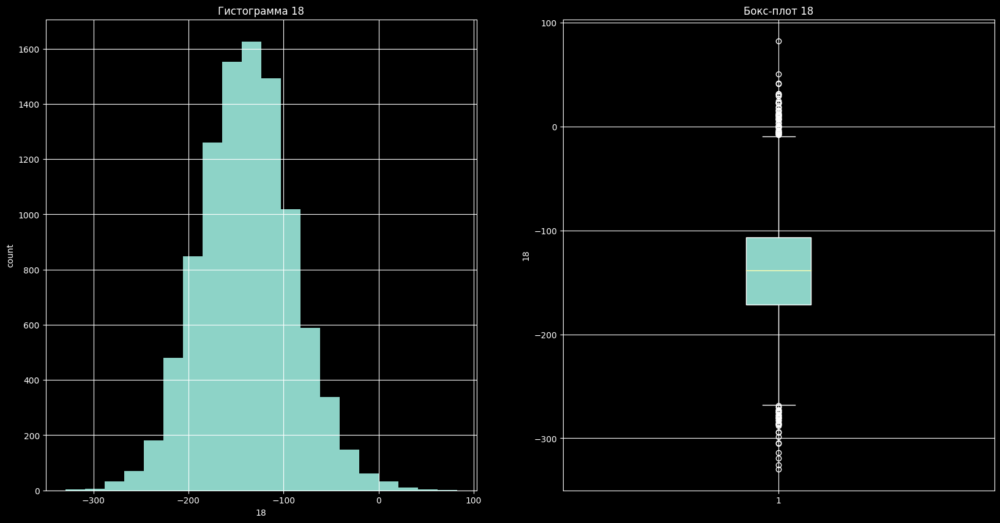

19
count    9756.000000
mean      -79.181202
std         0.778453
min       -82.252945
25%       -79.685466
50%       -79.156400
75%       -78.655512
max       -76.700424
Name: 19, dtype: float64


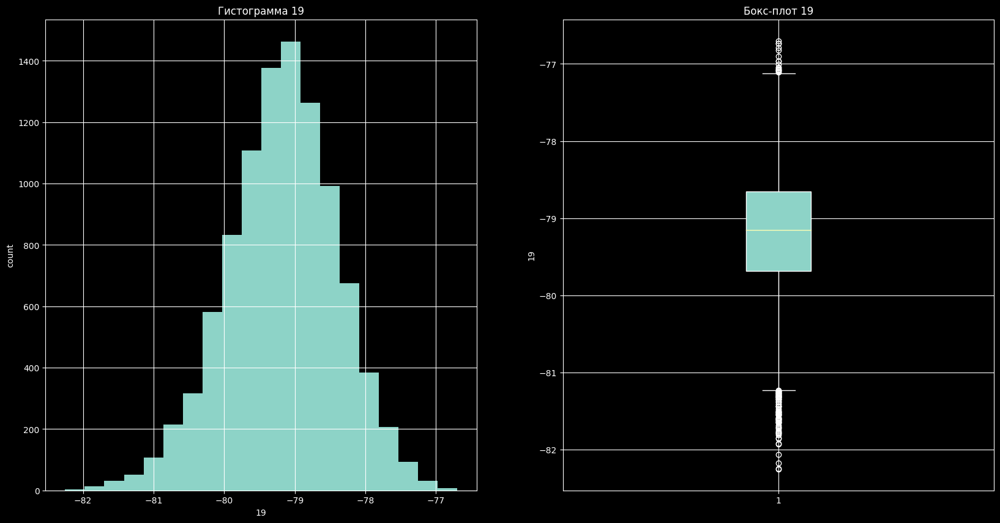

20
count    9756.000000
mean      -97.427301
std        28.212993
min      -228.985530
25%      -115.240379
50%       -96.684045
75%       -78.191008
max         0.243759
Name: 20, dtype: float64


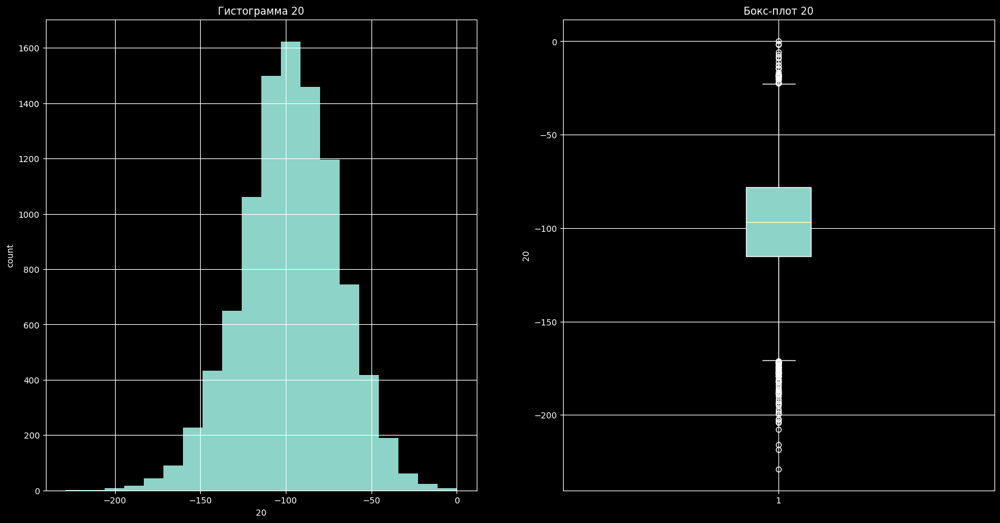

21
count    9756.000000
mean     1297.877100
std       372.979884
min       136.900447
25%      1248.126198
50%      1507.231274
75%      1507.231274
max      1556.087035
Name: 21, dtype: float64


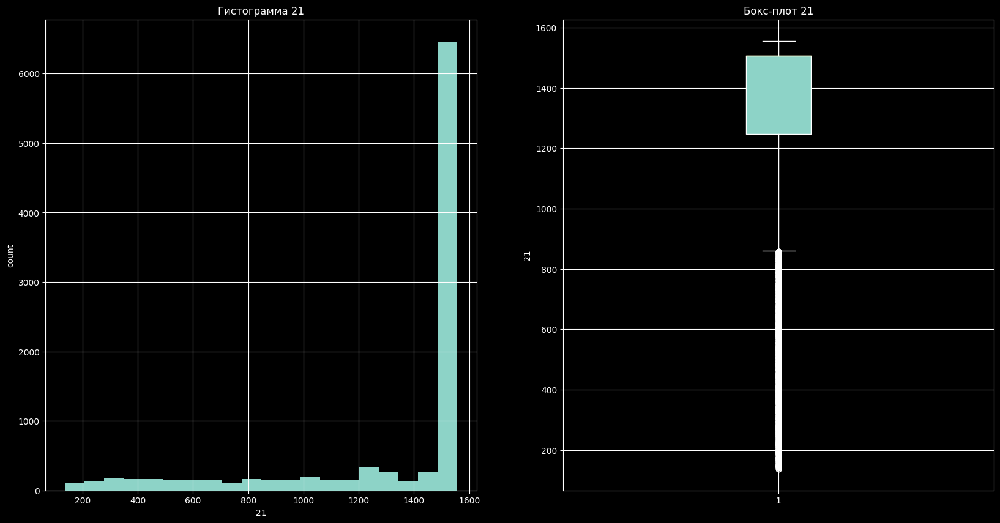

22
count    9756.000000
mean       -3.533013
std        50.200347
min      -174.593440
25%       -37.160124
50%        -3.361196
75%        30.408735
max       193.884310
Name: 22, dtype: float64


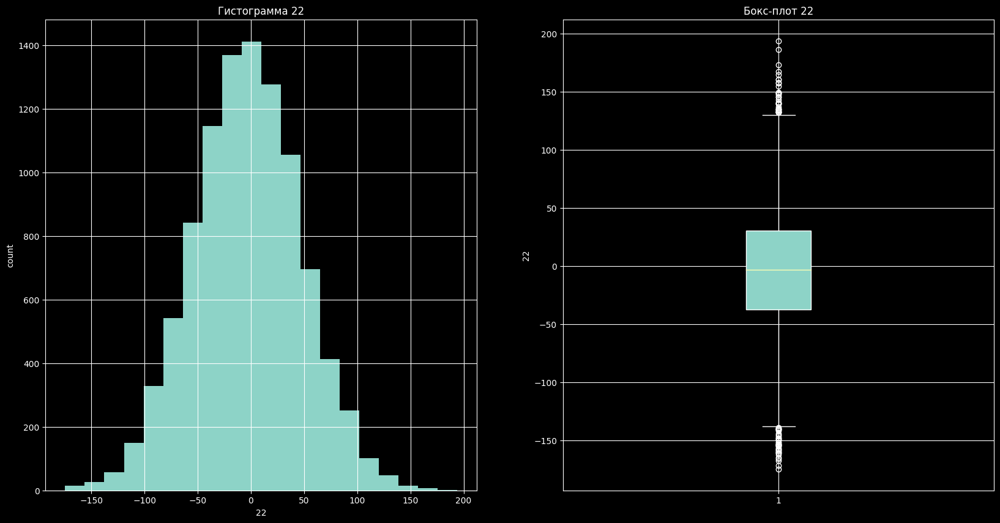

23
count    9756.000000
mean       56.414480
std        35.448725
min       -75.980484
25%        32.438980
50%        55.887555
75%        79.731809
max       193.120830
Name: 23, dtype: float64


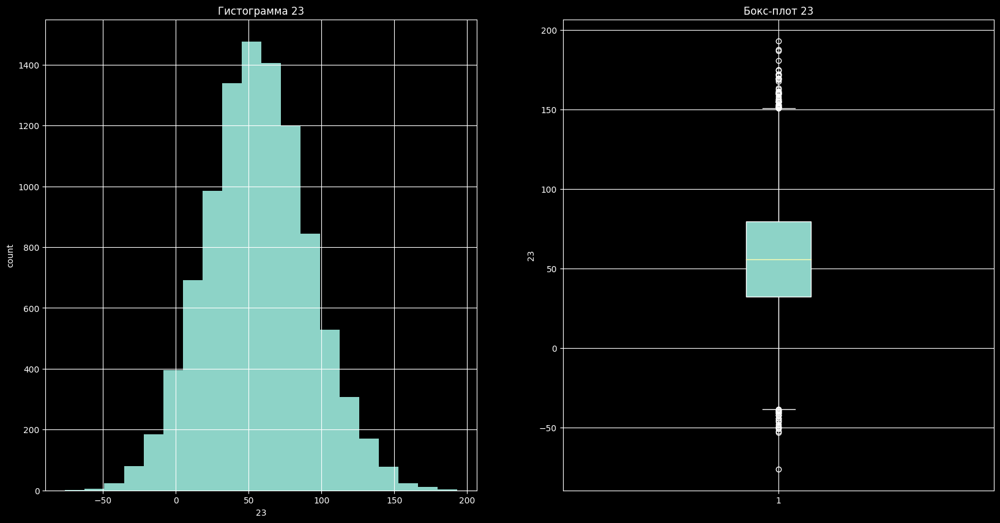

24
count    9756.000000
mean       23.040860
std        41.158802
min      -120.500656
25%        -5.993720
50%        23.338047
75%        52.138779
max       148.891630
Name: 24, dtype: float64


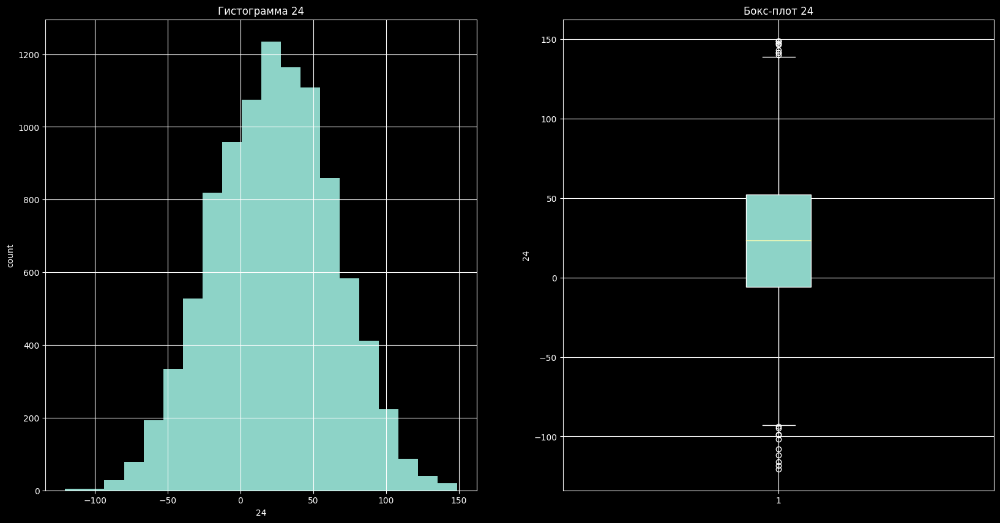

25
count    9756.000000
mean      741.822603
std       193.032391
min       -61.640878
25%       813.770071
50%       813.770071
75%       813.770071
max       845.476566
Name: 25, dtype: float64


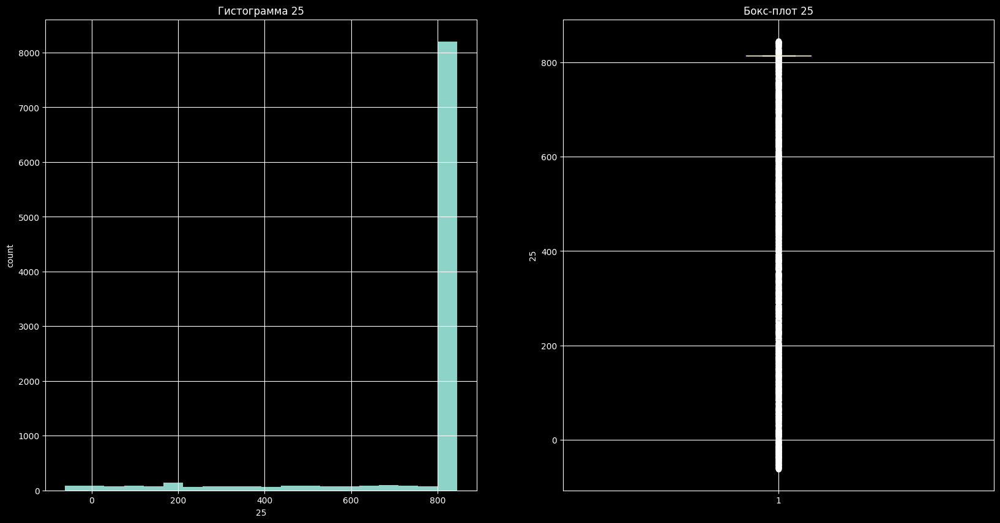

26
count    9756.000000
mean      -64.833808
std        63.564602
min      -318.192700
25%      -106.548722
50%       -65.170320
75%       -22.727067
max       202.053900
Name: 26, dtype: float64


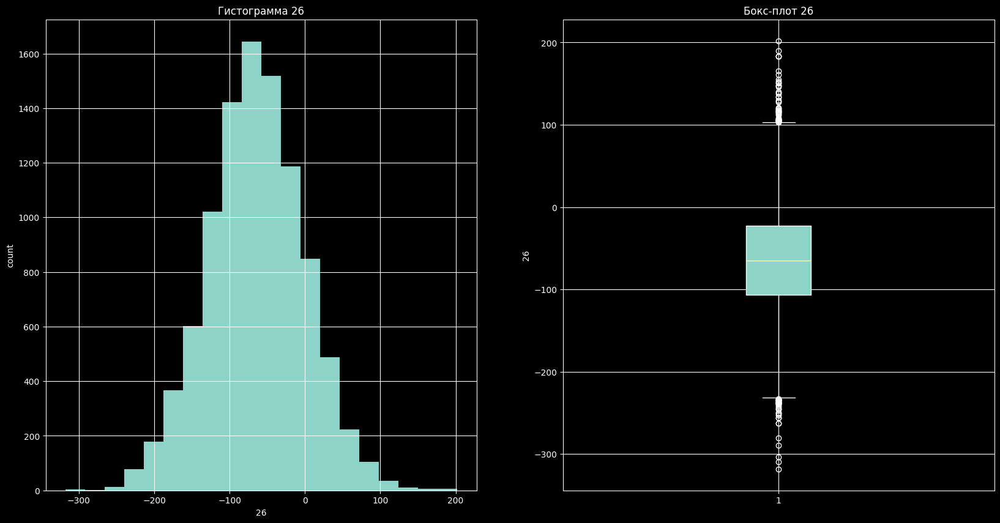

27
count    9756.000000
mean       16.292583
std         4.819927
min        -4.305775
25%        13.120441
50%        16.366634
75%        19.517092
max        35.141838
Name: 27, dtype: float64


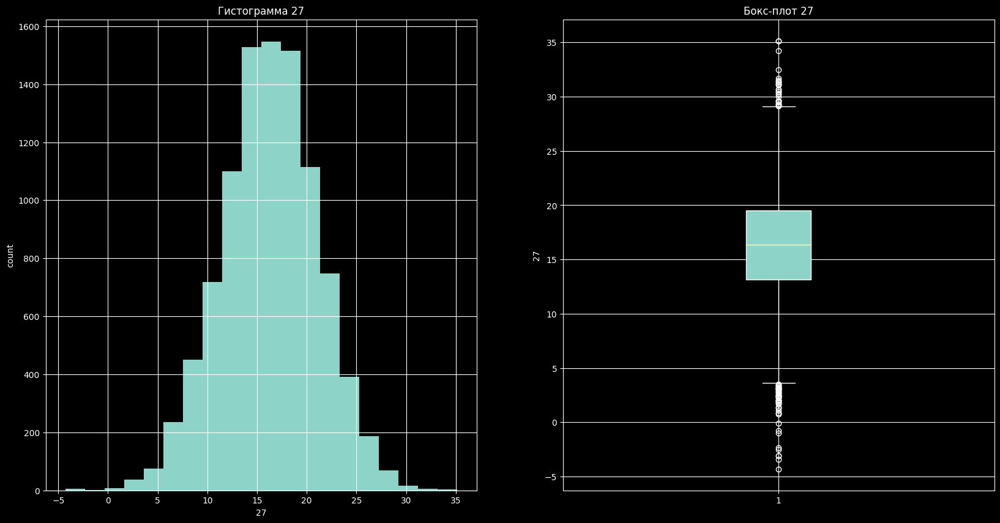

28
count    9756.000000
mean      -86.215191
std        48.744443
min      -269.041630
25%      -119.434325
50%       -87.048092
75%       -53.172598
max       107.757996
Name: 28, dtype: float64


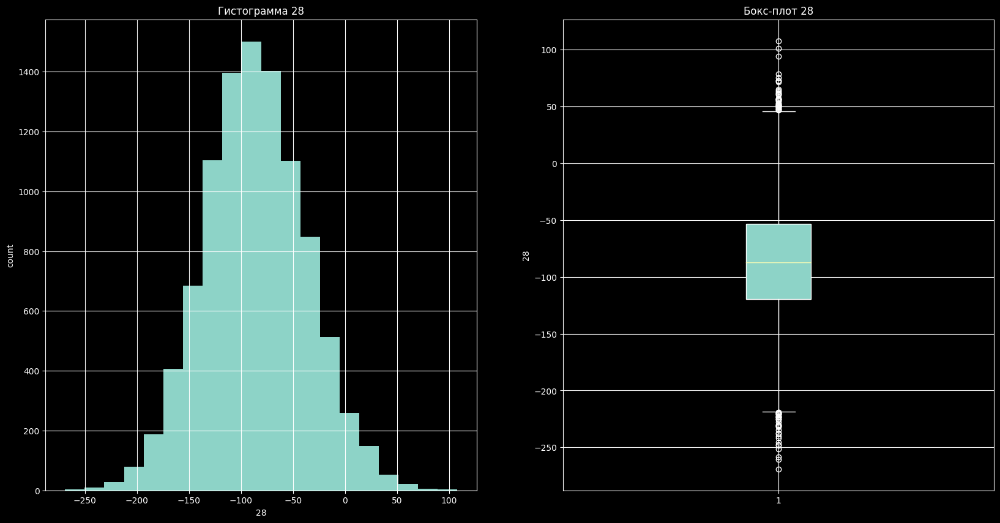

29
count    9756.000000
mean      152.171197
std        10.359860
min       114.099030
25%       145.379942
50%       151.995195
75%       158.933130
max       193.917180
Name: 29, dtype: float64


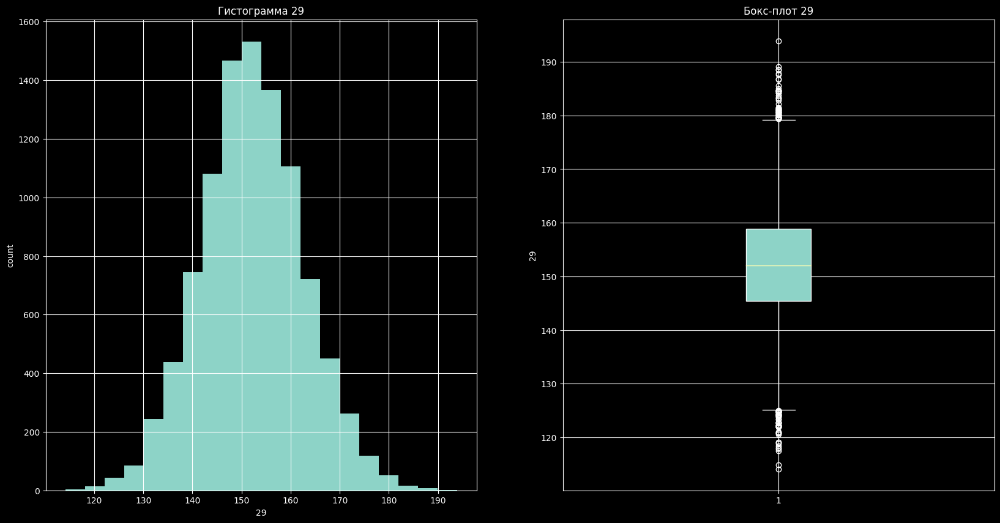

30
count    9756.000000
mean      -13.683470
std        29.409532
min      -125.440050
25%       -32.956551
50%       -13.138925
75%         6.282738
max        77.790330
Name: 30, dtype: float64


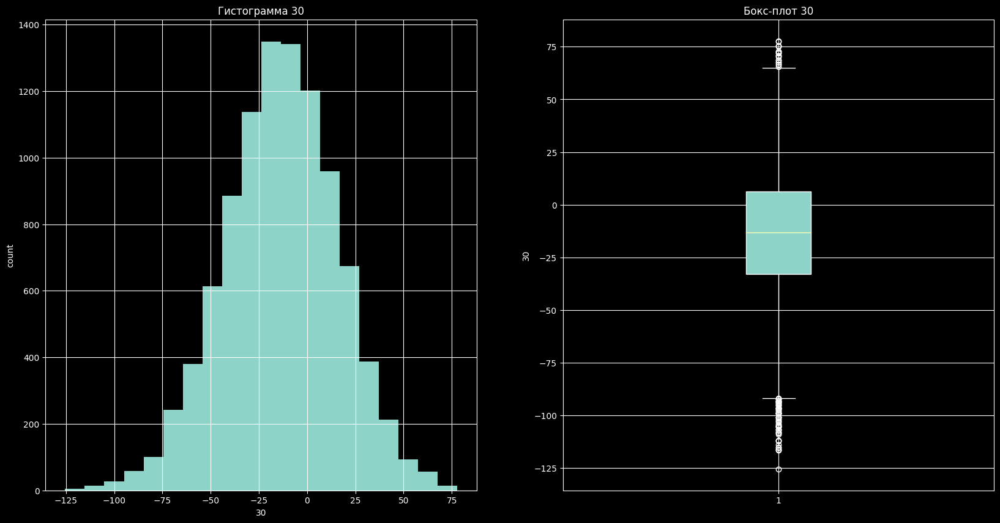

31
count    9756.000000
mean     -144.580247
std        36.264550
min      -261.522860
25%      -169.033678
50%      -145.221515
75%      -119.897773
max        -3.318390
Name: 31, dtype: float64


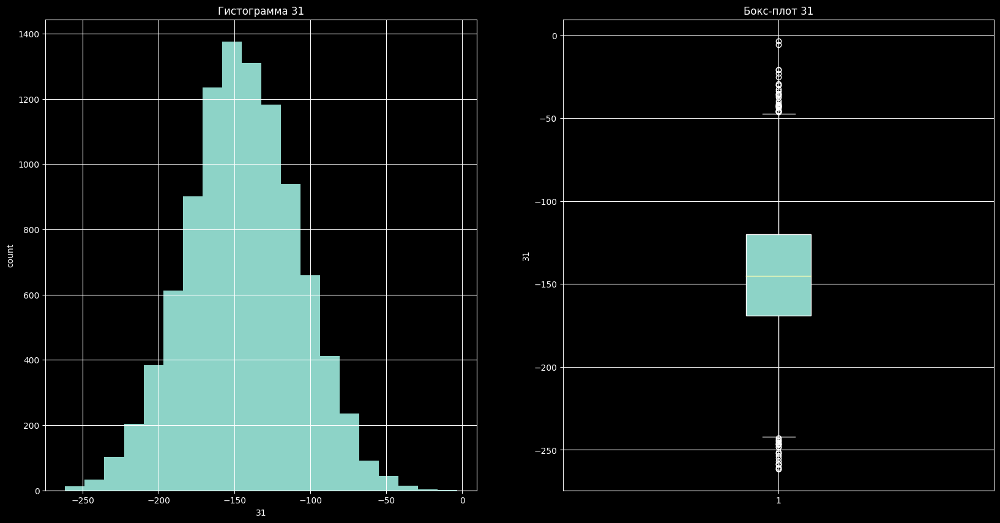

32
count    9756.000000
mean       89.440954
std        28.494801
min       -12.177368
25%        69.607820
50%        89.685128
75%       109.240685
max       198.146580
Name: 32, dtype: float64


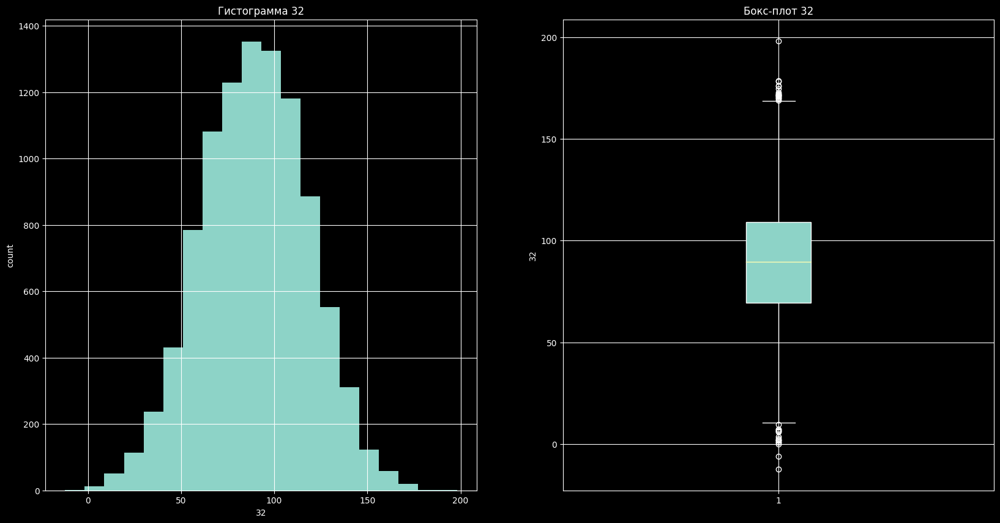

33
count    9756.000000
mean     -585.302187
std       274.095526
min     -1043.159721
25%      -803.390708
50%      -579.590387
75%      -343.552629
max      -137.646757
Name: 33, dtype: float64


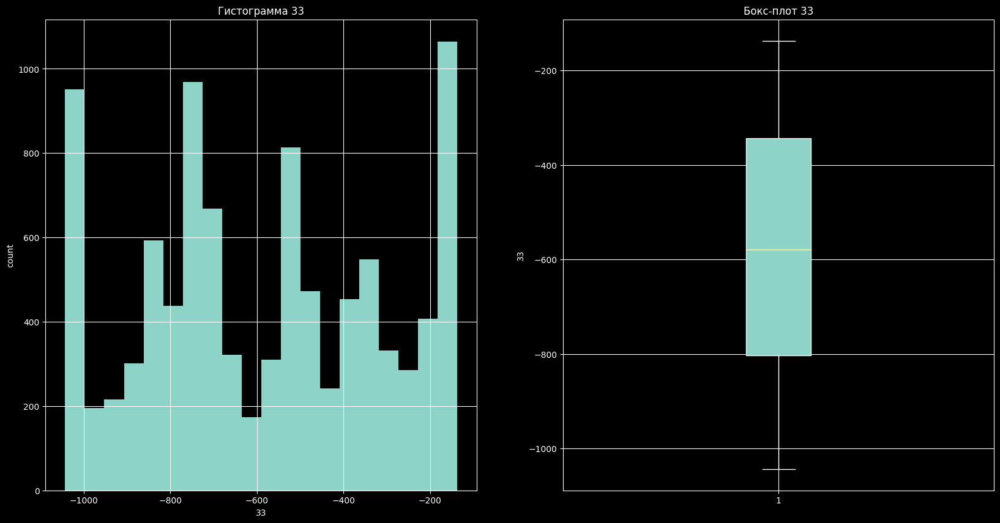

34
count    9756.000000
mean       36.461697
std        39.132946
min      -112.779755
25%         9.820759
50%        36.180033
75%        63.477177
max       164.170350
Name: 34, dtype: float64


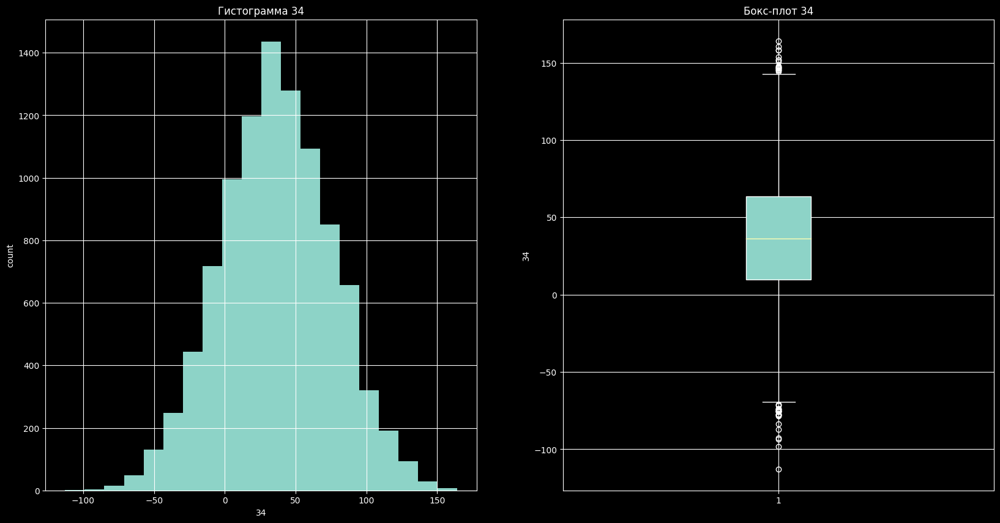

35
count    9756.000000
mean       73.114257
std        19.845343
min        -1.458771
25%        60.177923
50%        72.974010
75%        85.978967
max       148.037050
Name: 35, dtype: float64


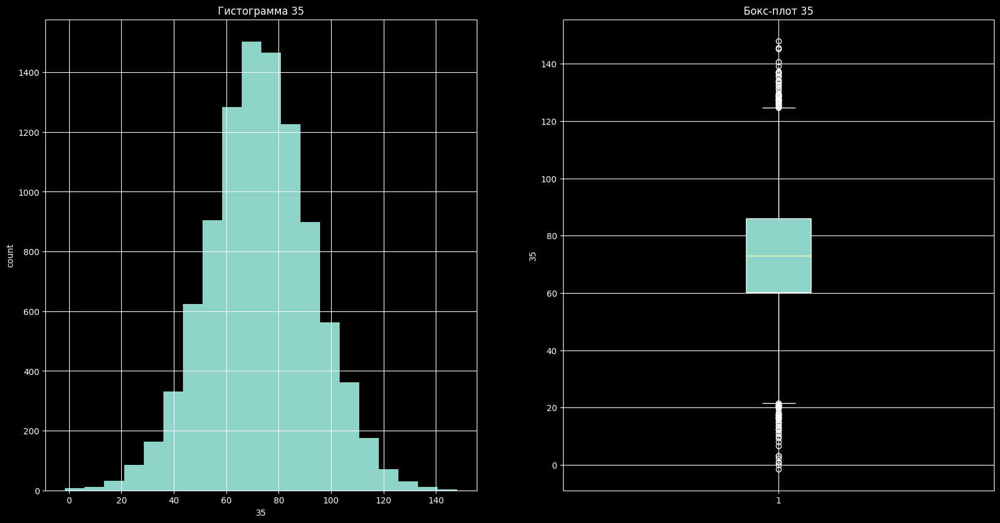

36
count    9756.000000
mean      -13.952523
std        25.553757
min      -108.400100
25%       -31.096978
50%       -13.691590
75%         3.732495
max        78.402885
Name: 36, dtype: float64


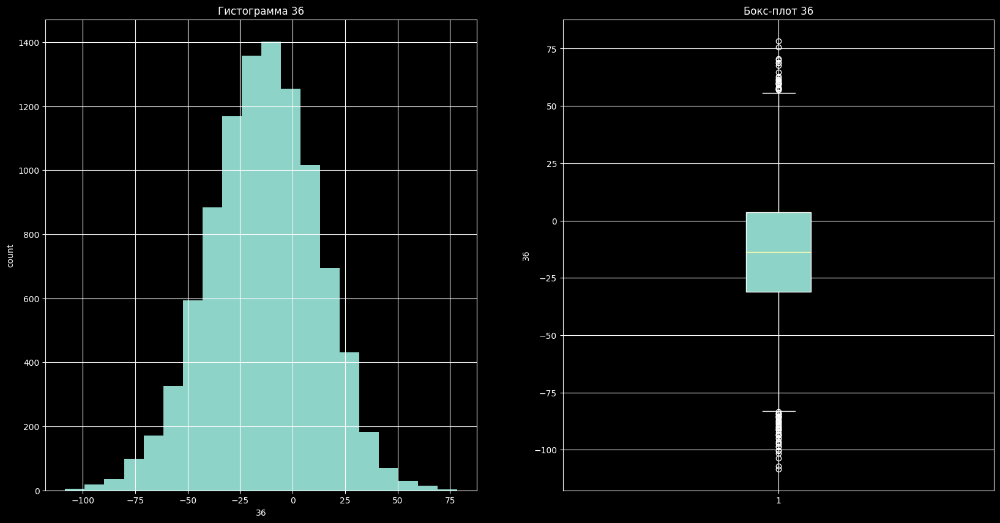

37
count    9756.000000
mean     -146.515366
std        10.258980
min      -188.973650
25%      -153.280555
50%      -146.423450
75%      -139.538467
max      -108.274000
Name: 37, dtype: float64


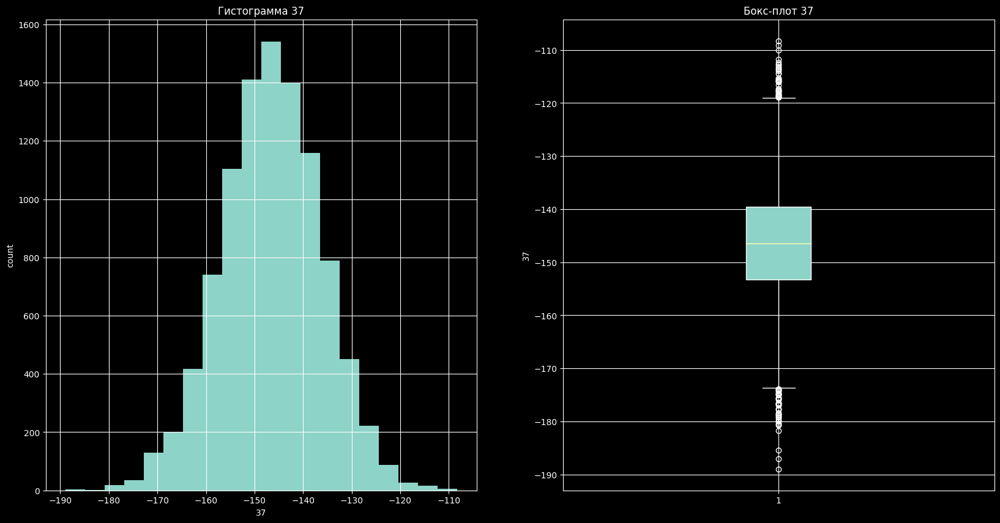

38
count    9756.000000
mean     -118.325105
std        13.630813
min      -163.109950
25%      -127.488137
50%      -118.229485
75%      -109.072862
max       -68.437980
Name: 38, dtype: float64


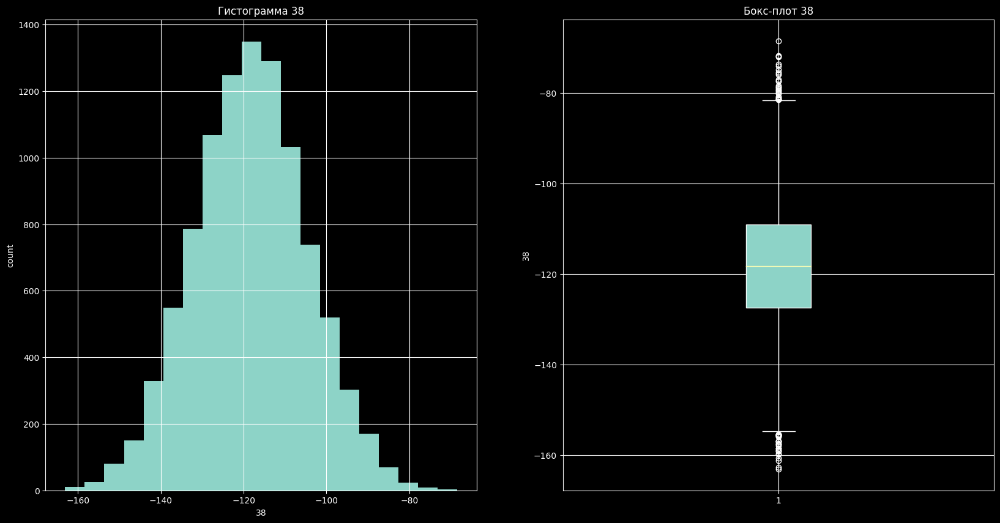

39
count    9756.000000
mean      -41.192415
std        19.871598
min      -123.062420
25%       -54.541745
50%       -41.448262
75%       -27.675319
max        29.400135
Name: 39, dtype: float64


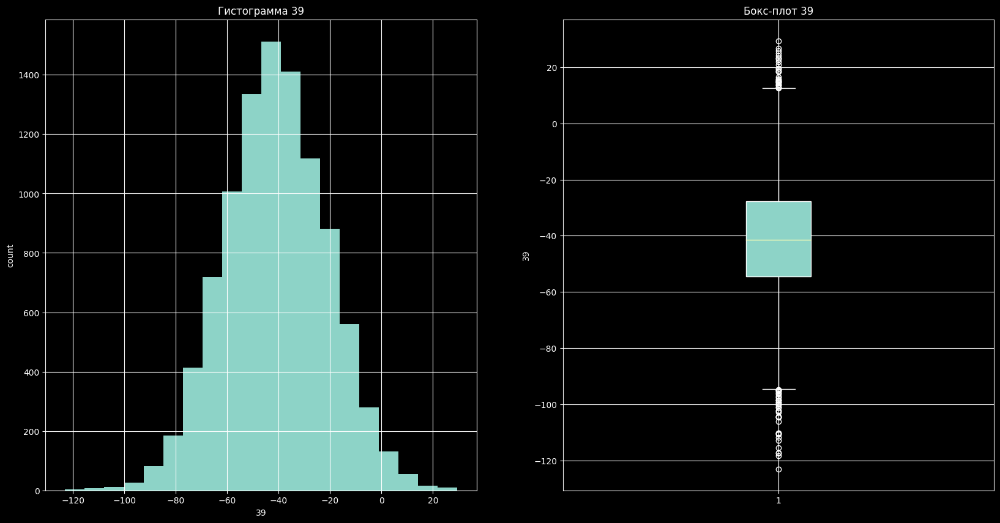

40
count    9756.000000
mean       -9.374513
std         8.327809
min       -43.014280
25%       -14.937603
50%        -9.278700
75%        -3.772762
max        21.992147
Name: 40, dtype: float64


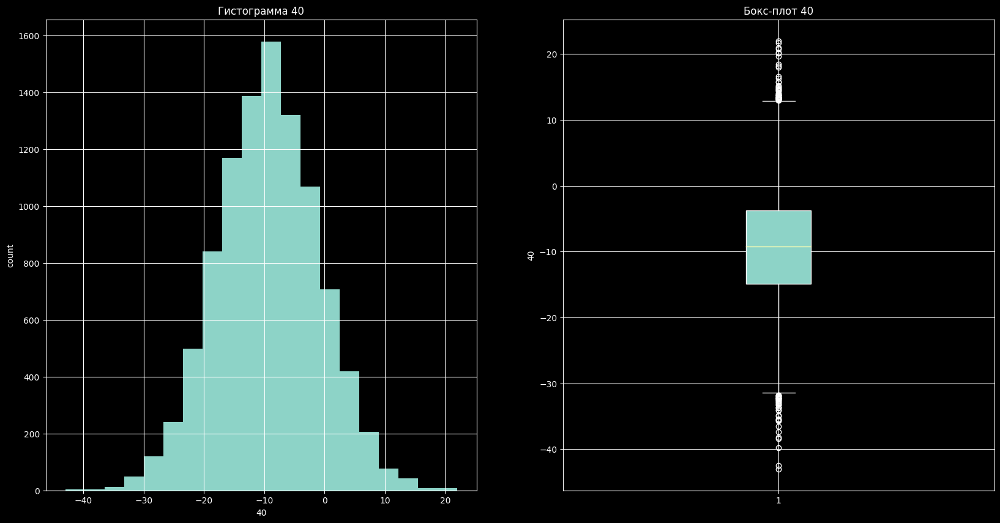

41
count    9756.000000
mean        4.180120
std         5.936954
min       -16.524162
25%         0.075654
50%         4.279874
75%         8.269464
max        23.780308
Name: 41, dtype: float64


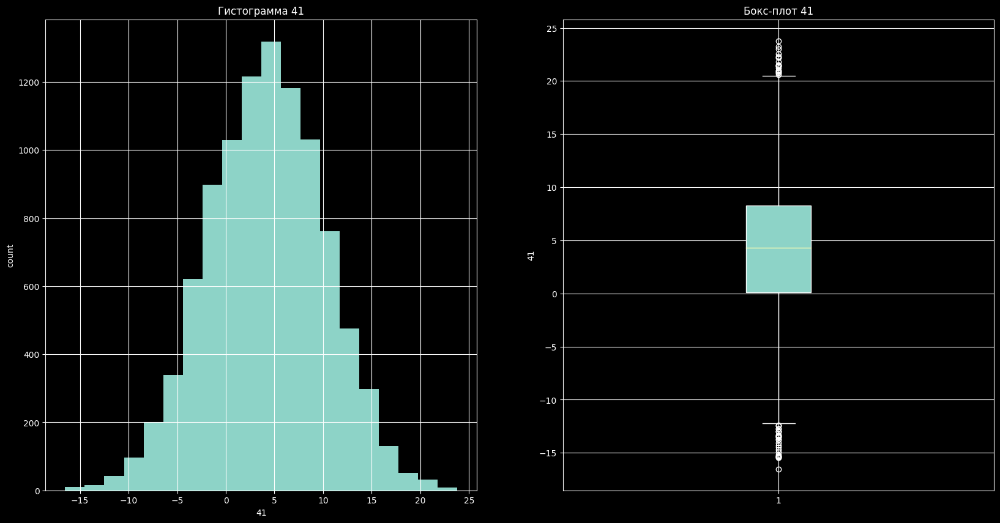

42
count    9756.000000
mean     -104.669884
std        56.038535
min      -307.125950
25%      -142.238960
50%      -105.917055
75%       -66.769110
max        96.572570
Name: 42, dtype: float64


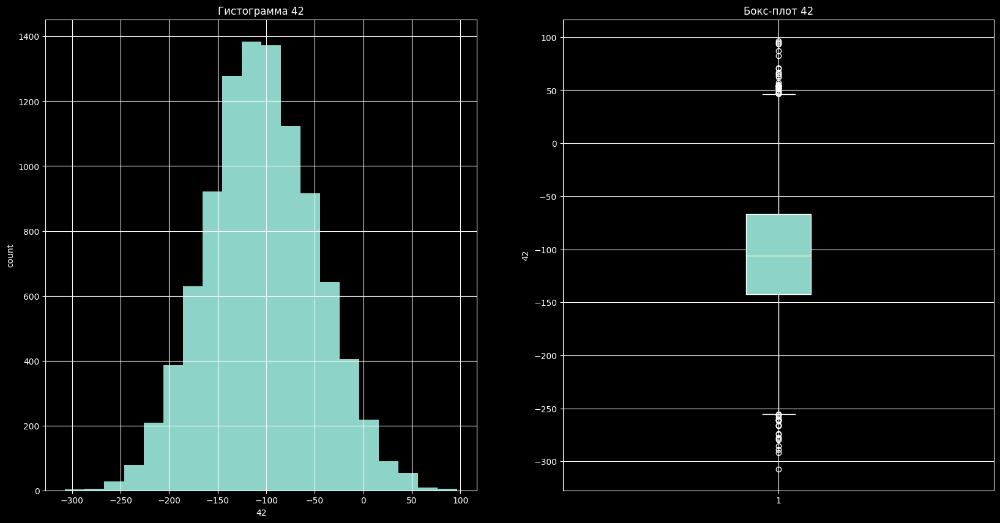

43
count    9756.000000
mean      122.182299
std        48.266068
min       -73.530136
25%        88.466630
50%       122.060712
75%       154.628635
max       286.050900
Name: 43, dtype: float64


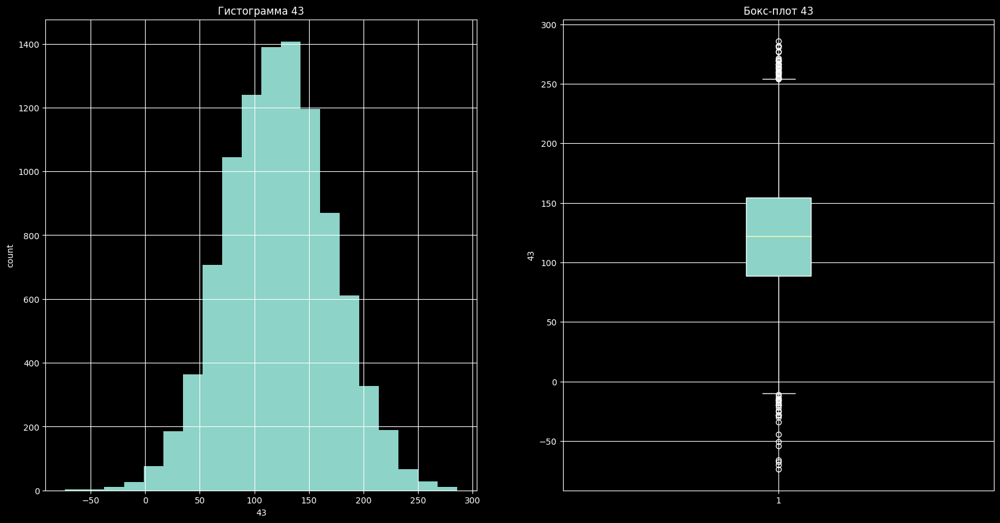

44
count    9756.000000
mean      -40.413279
std        14.848102
min       -63.098819
25%       -54.117874
50%       -39.727996
75%       -26.720193
max       -16.057414
Name: 44, dtype: float64


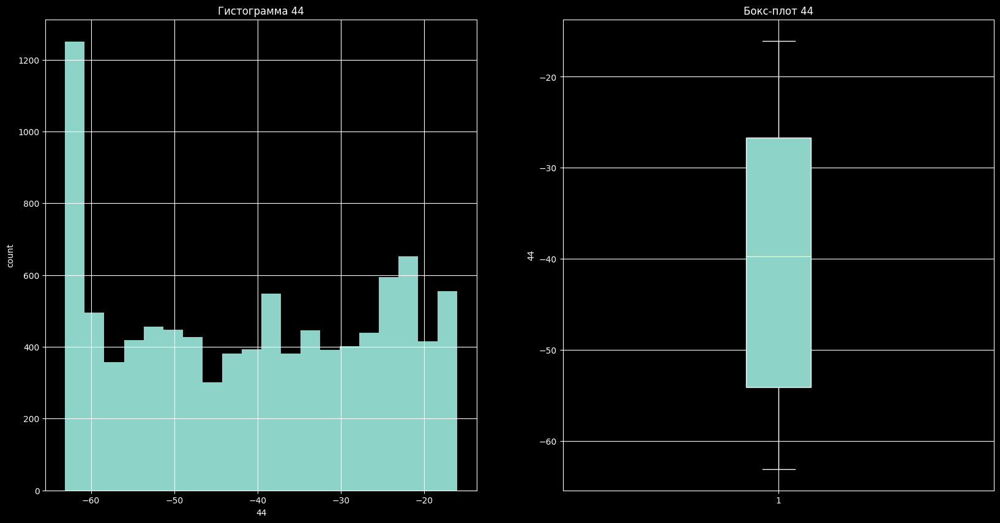

45
count    9756.000000
mean       59.472303
std        30.847118
min       -40.429813
25%        38.335478
50%        59.624151
75%        80.877803
max       178.599610
Name: 45, dtype: float64


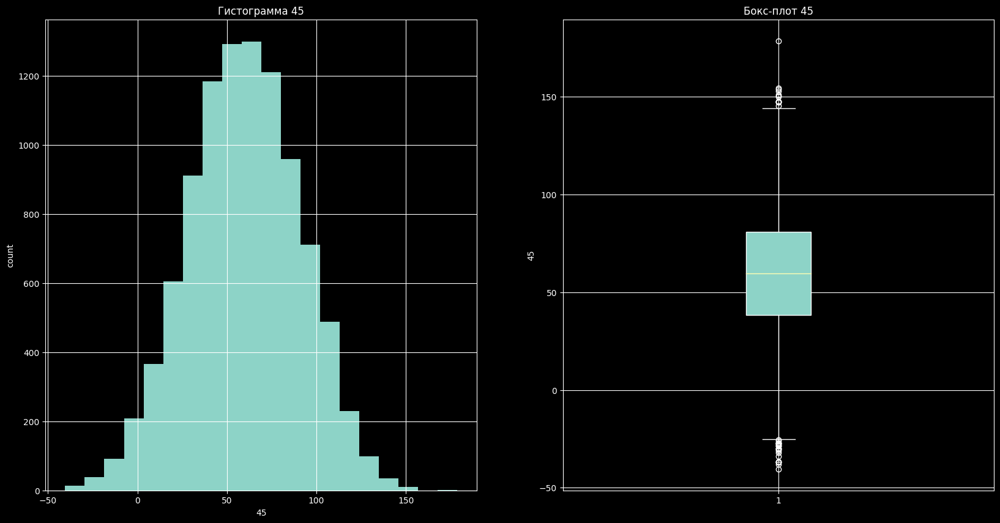

46
count    9756.000000
mean      -83.758493
std        66.218317
min      -297.294860
25%      -129.506137
50%       -84.551198
75%       -40.058331
max       176.673580
Name: 46, dtype: float64


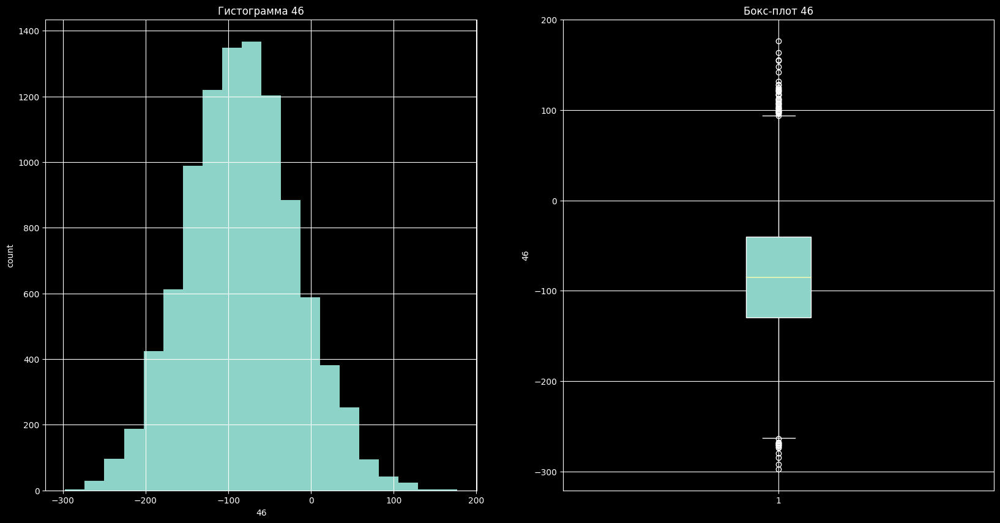

47
count    9756.000000
mean     -141.325874
std        59.722025
min      -364.509220
25%      -181.701683
50%      -141.212895
75%      -101.294460
max        88.152620
Name: 47, dtype: float64


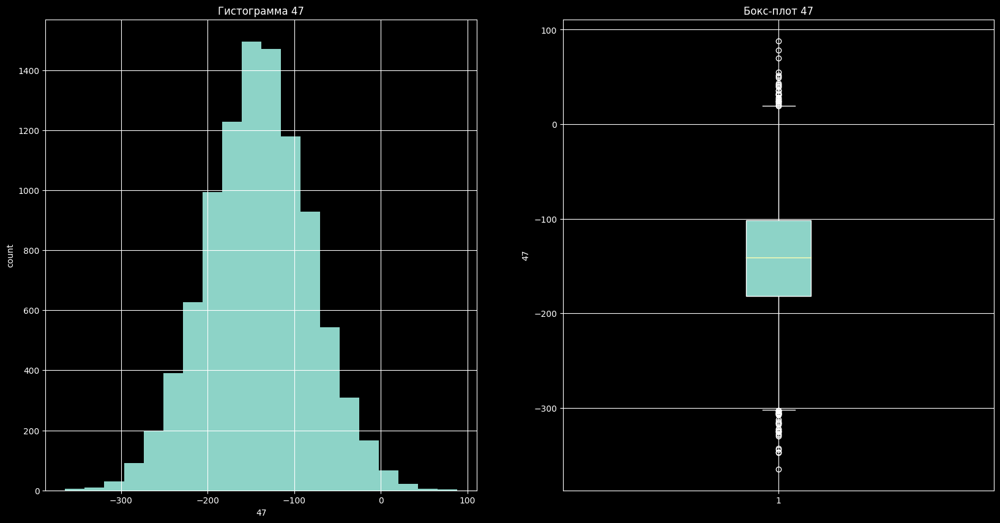

48
count    9756.000000
mean       45.748076
std        45.990398
min      -108.377380
25%        14.824235
50%        44.874525
75%        76.567920
max       204.514370
Name: 48, dtype: float64


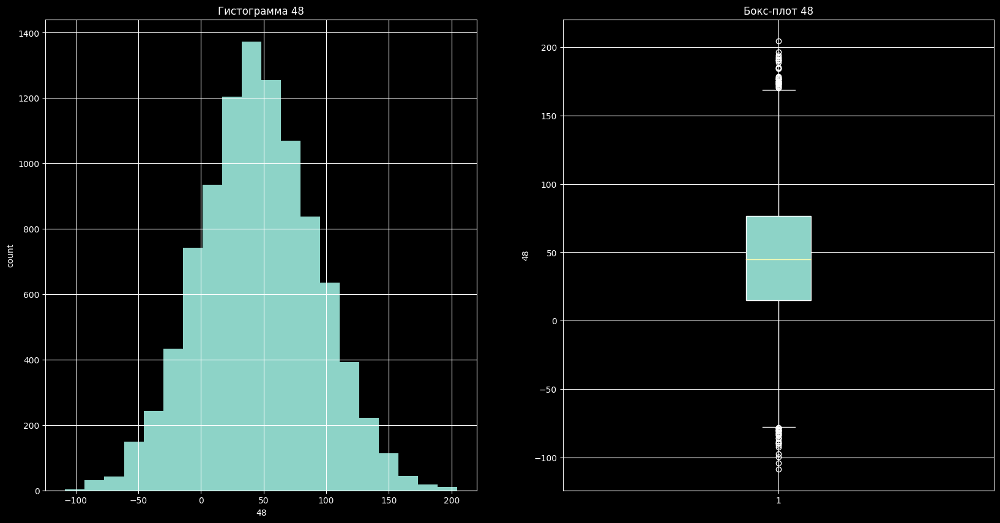

49
count    9756.000000
mean      -34.525206
std        59.539972
min      -251.944990
25%       -73.358045
50%       -32.241581
75%         6.871117
max       173.931850
Name: 49, dtype: float64


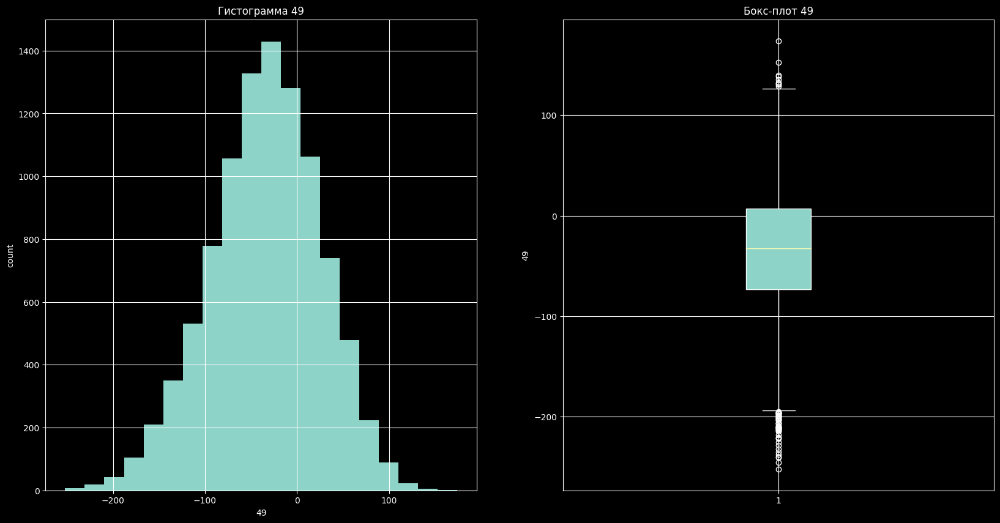

50
count    9756.000000
mean       30.362336
std        60.684777
min      -217.258000
25%       -10.004924
50%        31.527286
75%        72.009963
max       237.228270
Name: 50, dtype: float64


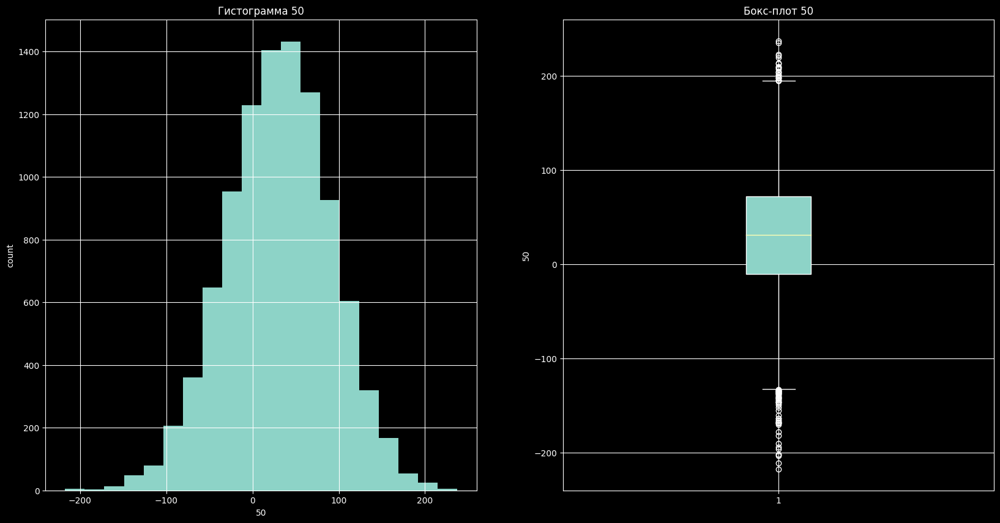

51
count    9756.000000
mean      -23.071529
std        55.752993
min      -216.835040
25%       -61.141094
50%       -23.758487
75%        14.833712
max       163.437400
Name: 51, dtype: float64


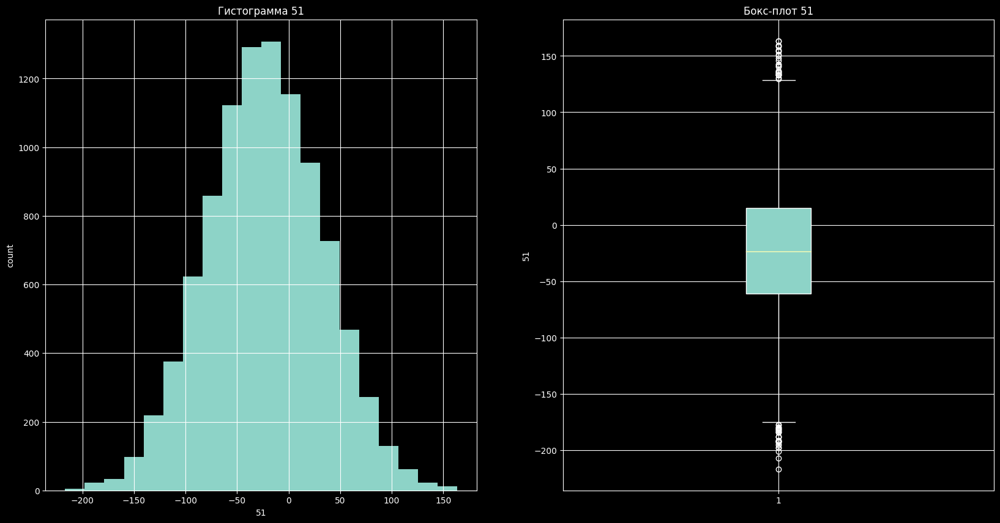

52
count    9756.000000
mean       67.438969
std        13.058536
min        21.089088
25%        58.270254
50%        67.157140
75%        76.393520
max       115.808710
Name: 52, dtype: float64


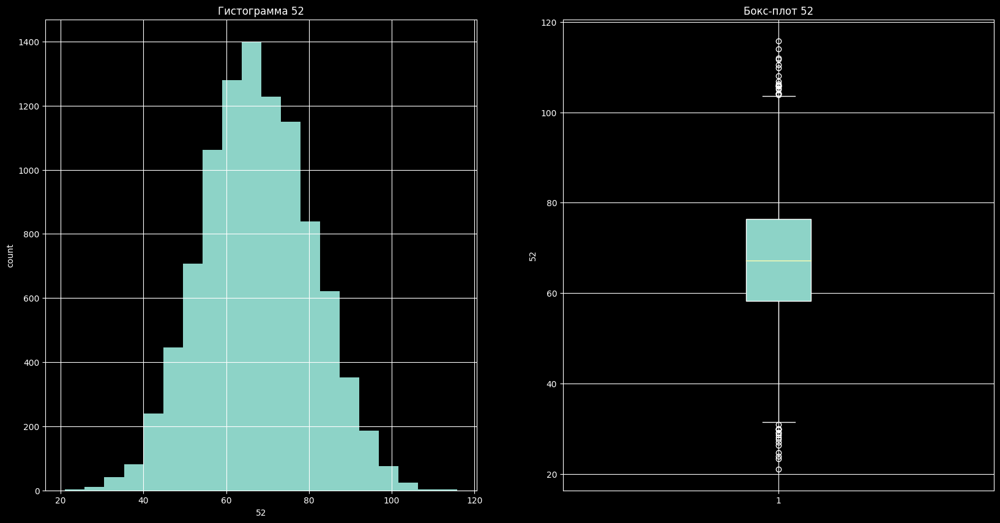

53
count    9756.000000
mean     -120.601053
std        56.025039
min      -321.383970
25%      -158.807553
50%      -120.704373
75%       -81.539116
max        74.526306
Name: 53, dtype: float64


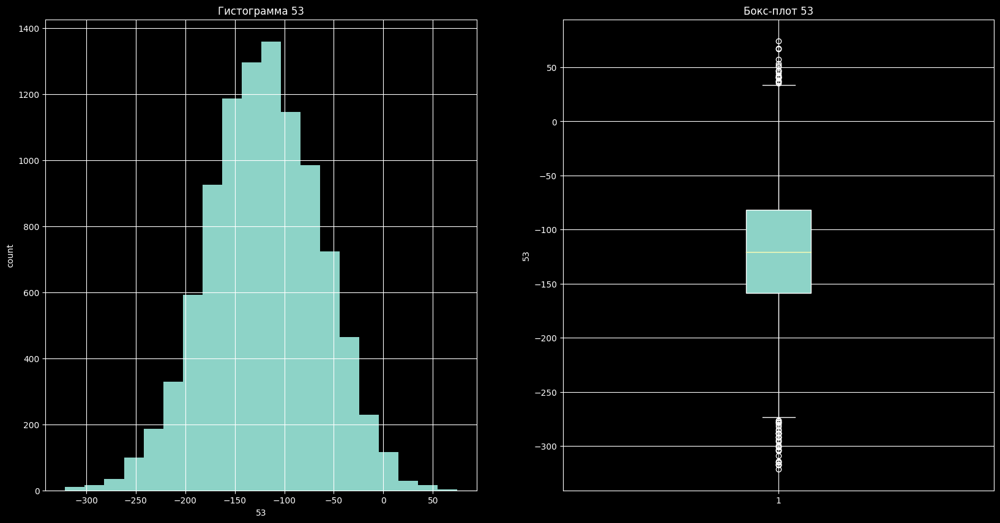

54
count    9756.000000
mean       88.191146
std         4.774603
min        70.048590
25%        84.947964
50%        88.208793
75%        91.413498
max       107.090416
Name: 54, dtype: float64


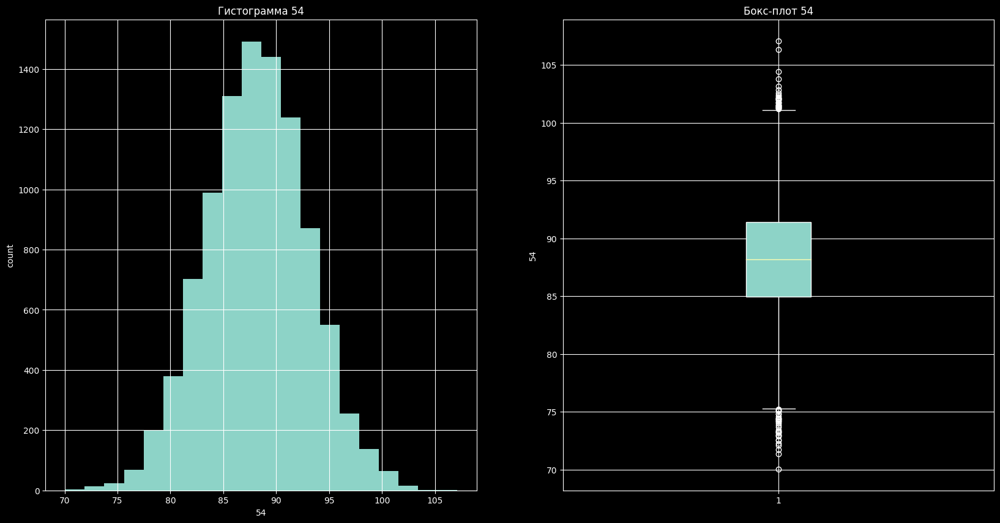

55
count    9756.000000
mean       69.480221
std        12.416566
min        22.668636
25%        61.164243
50%        69.436190
75%        77.974131
max       112.399280
Name: 55, dtype: float64


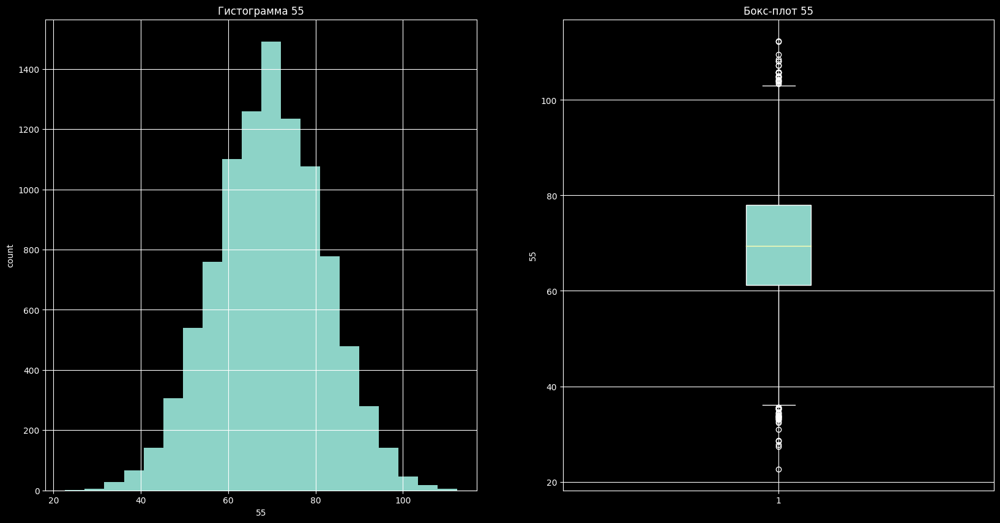

56
count    9756.000000
mean     -132.547112
std         7.976040
min      -161.124900
25%      -137.956725
50%      -132.533730
75%      -127.060221
max      -102.505455
Name: 56, dtype: float64


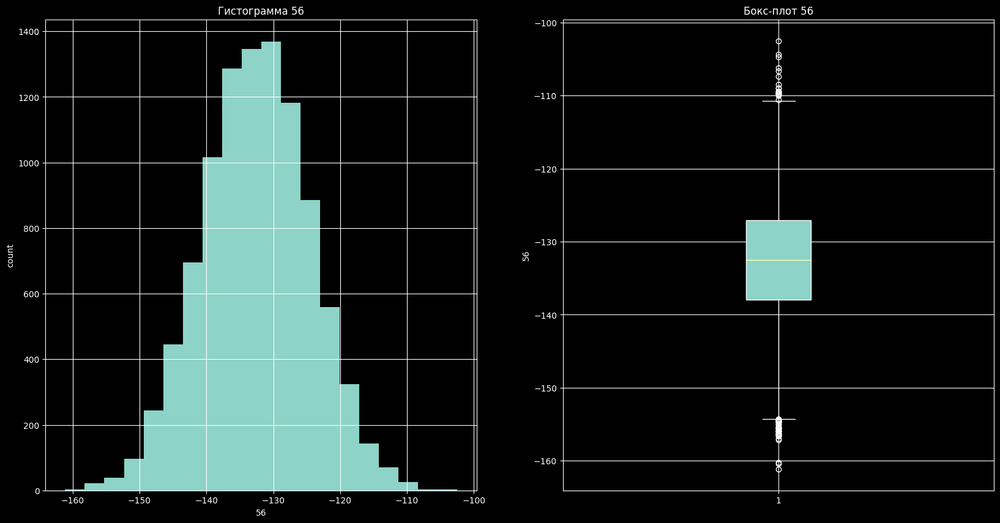

57
count    9756.000000
mean       14.633372
std        49.153340
min      -134.082200
25%       -19.527924
50%        14.188540
75%        47.460638
max       187.686970
Name: 57, dtype: float64


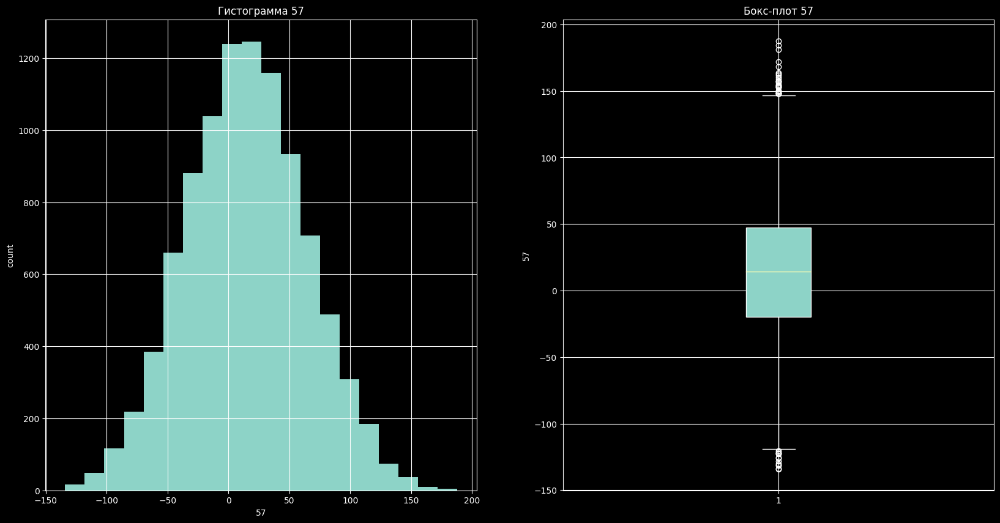

58
count    9756.000000
mean     -120.002063
std        55.698046
min      -318.879640
25%      -158.491772
50%      -120.569943
75%       -81.603810
max        78.903140
Name: 58, dtype: float64


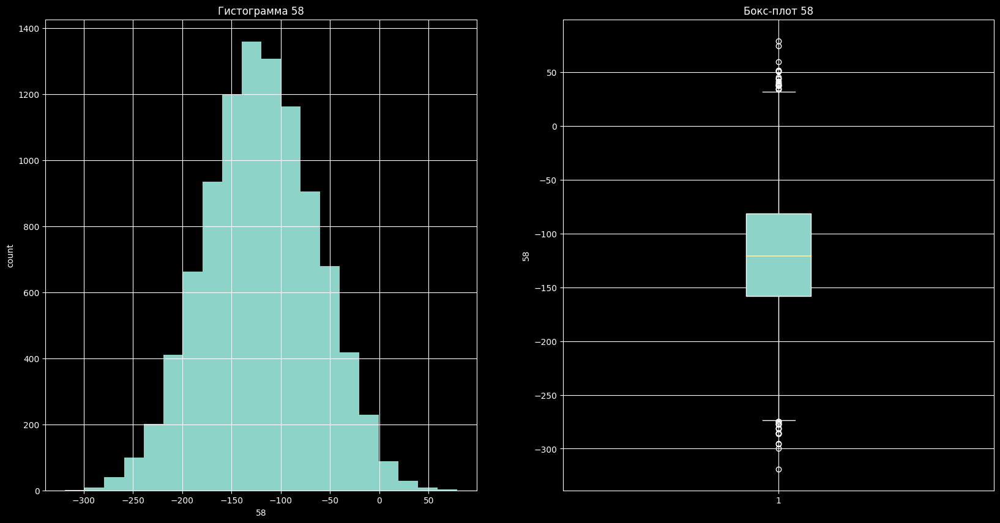

59
count    9756.000000
mean     -314.414347
std       209.553020
min      -681.033307
25%      -496.604634
50%      -309.552199
75%      -133.293561
max        48.656760
Name: 59, dtype: float64


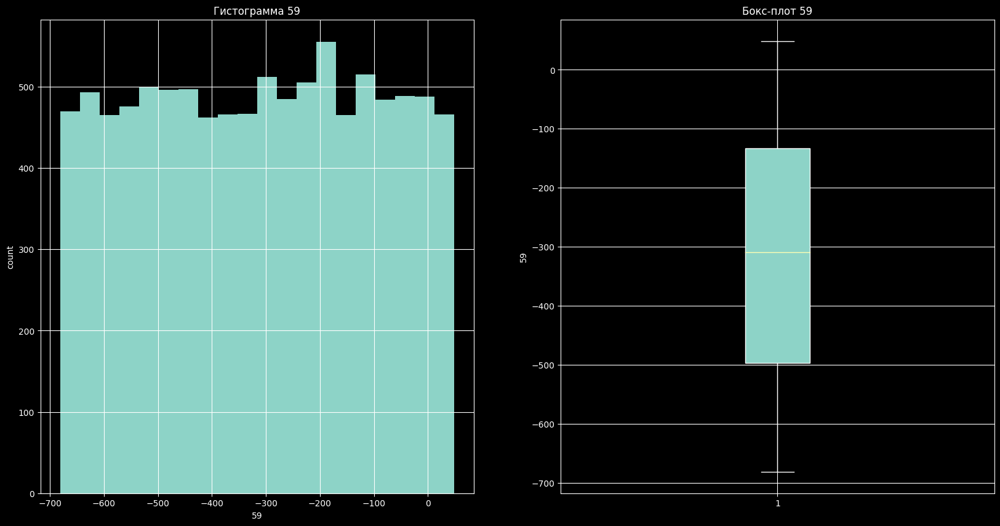

60
count    9756.000000
mean      -66.890665
std        64.517450
min      -301.453370
25%      -111.032567
50%       -66.072452
75%       -22.326728
max       175.577000
Name: 60, dtype: float64


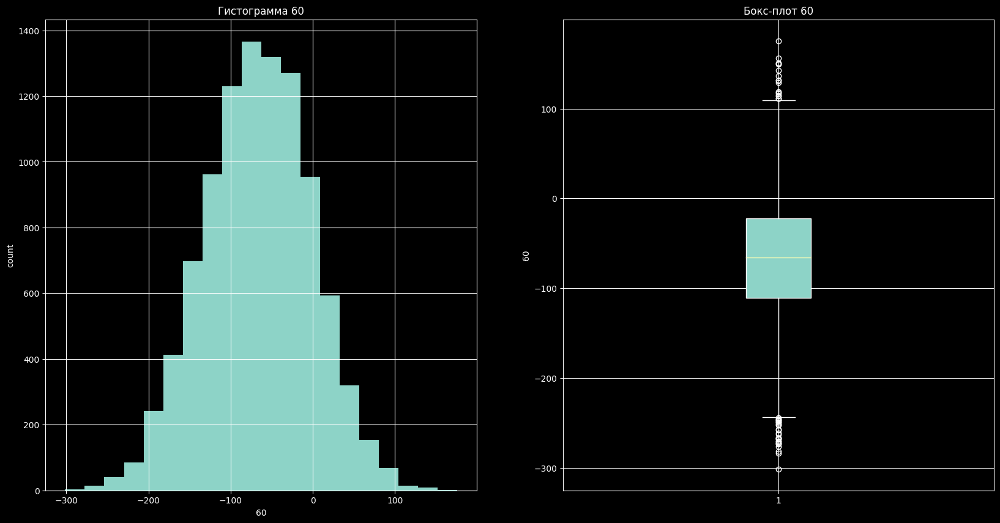

61
count    9756.000000
mean     -130.544896
std         9.364976
min      -167.331150
25%      -136.808065
50%      -130.612140
75%      -124.265879
max       -98.809080
Name: 61, dtype: float64


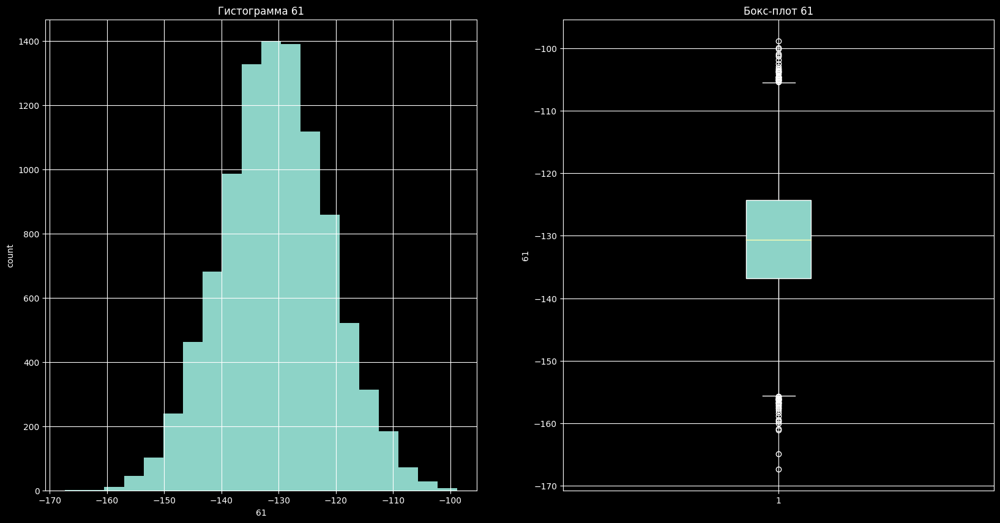

62
count    9756.000000
mean      -81.328357
std        30.601096
min      -191.308230
25%      -101.671773
50%       -81.714710
75%       -60.626403
max        20.978668
Name: 62, dtype: float64


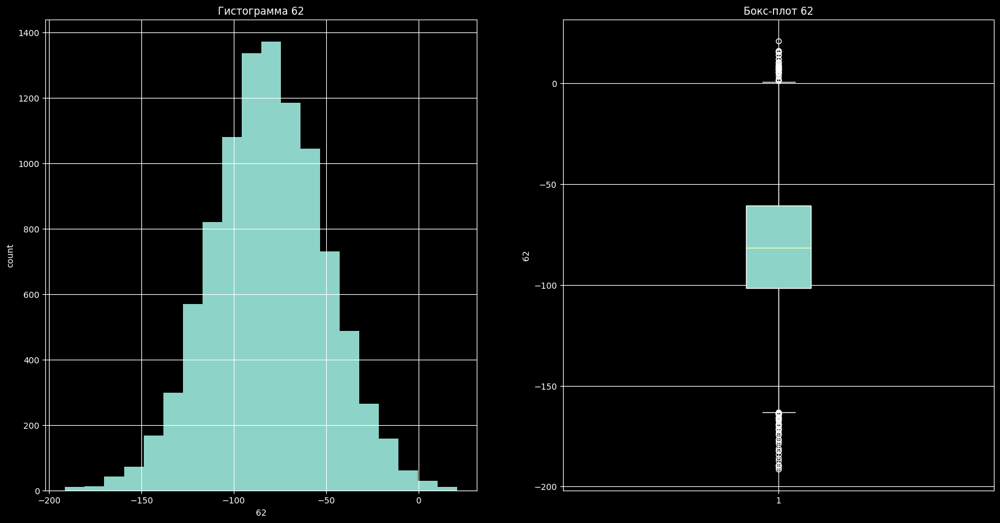

63
count    9756.000000
mean       37.142809
std        25.382906
min       -60.515068
25%        20.378427
50%        36.948156
75%        53.905740
max       137.559200
Name: 63, dtype: float64


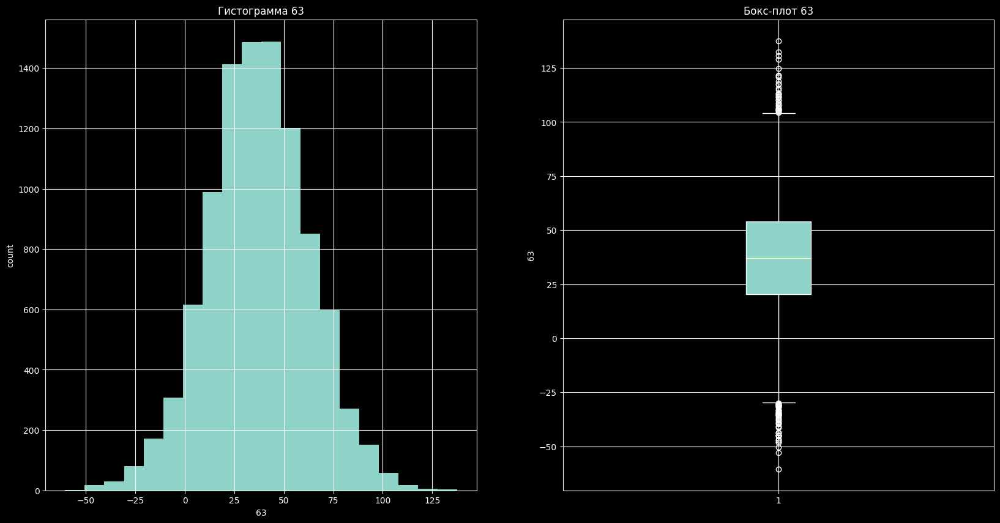

64
count    9756.000000
mean     -152.343848
std        41.067666
min      -306.837650
25%      -179.218153
50%      -151.254625
75%      -124.238407
max       -18.955208
Name: 64, dtype: float64


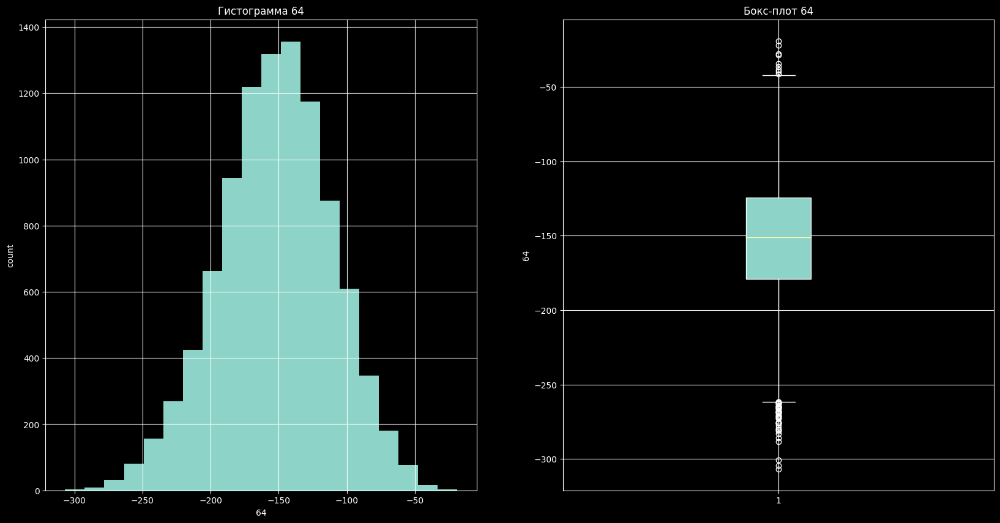

65
count    9756.000000
mean       16.351873
std        99.110520
min      -157.579209
25%       -67.848670
50%        15.931760
75%       101.795409
max       185.055845
Name: 65, dtype: float64


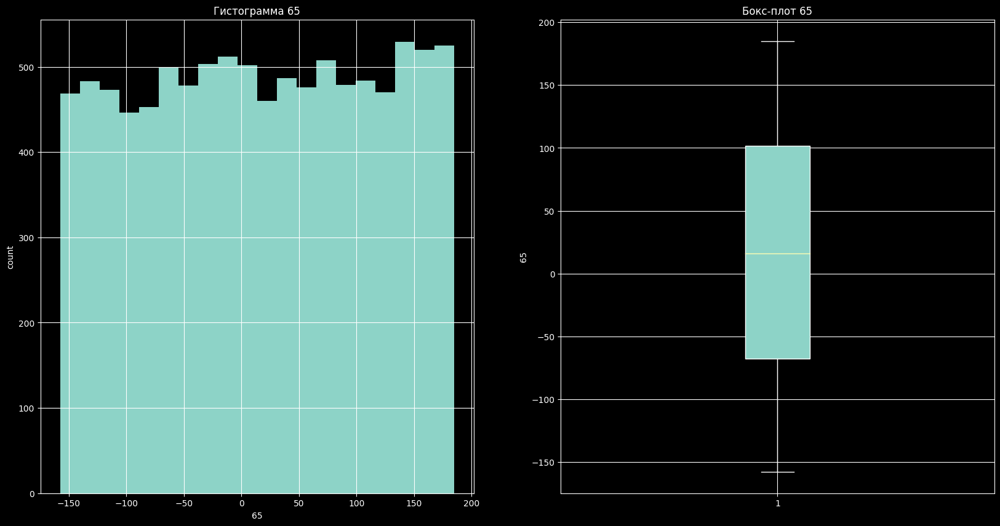

66
count    9756.000000
mean       67.804728
std         1.873409
min        61.339855
25%        66.543627
50%        67.821550
75%        69.085695
max        74.121605
Name: 66, dtype: float64


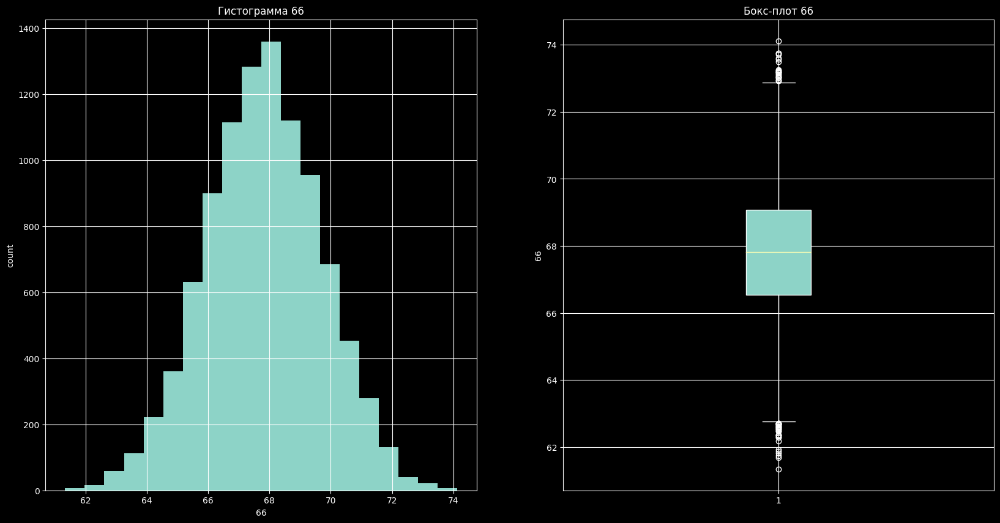

67
count    9756.000000
mean       23.704324
std        54.848172
min      -165.361250
25%       -12.360816
50%        23.971517
75%        59.276444
max       236.385470
Name: 67, dtype: float64


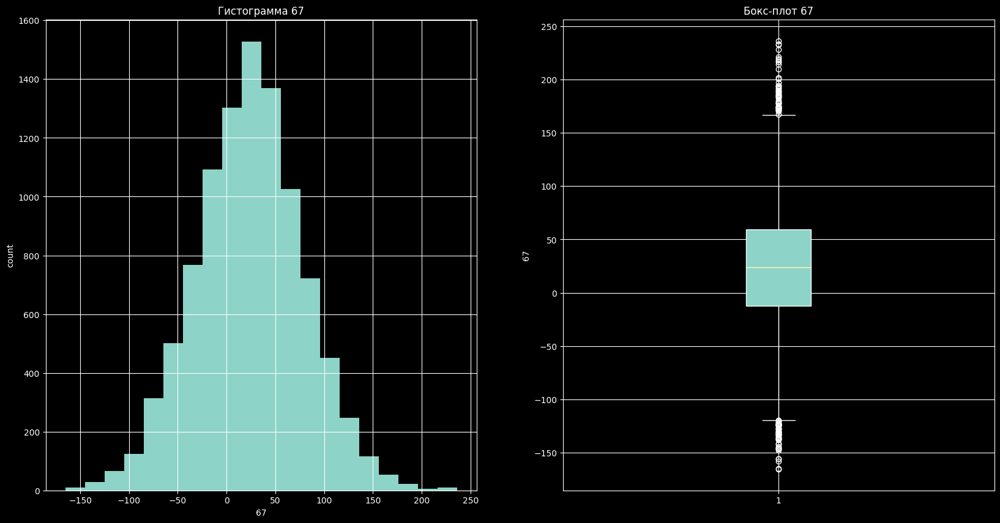

68
count    9756.000000
mean       73.291549
std        61.479638
min      -127.017555
25%        32.067661
50%        73.074797
75%       113.117487
max       304.391780
Name: 68, dtype: float64


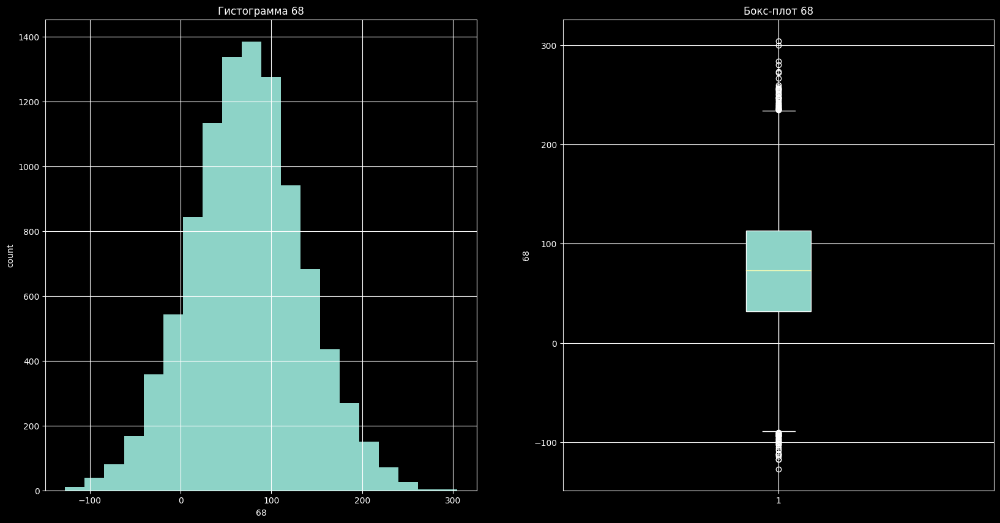

69
count    9756.000000
mean      115.440719
std        21.653826
min        34.696030
25%       100.530748
50%       115.821653
75%       130.374942
max       187.621400
Name: 69, dtype: float64


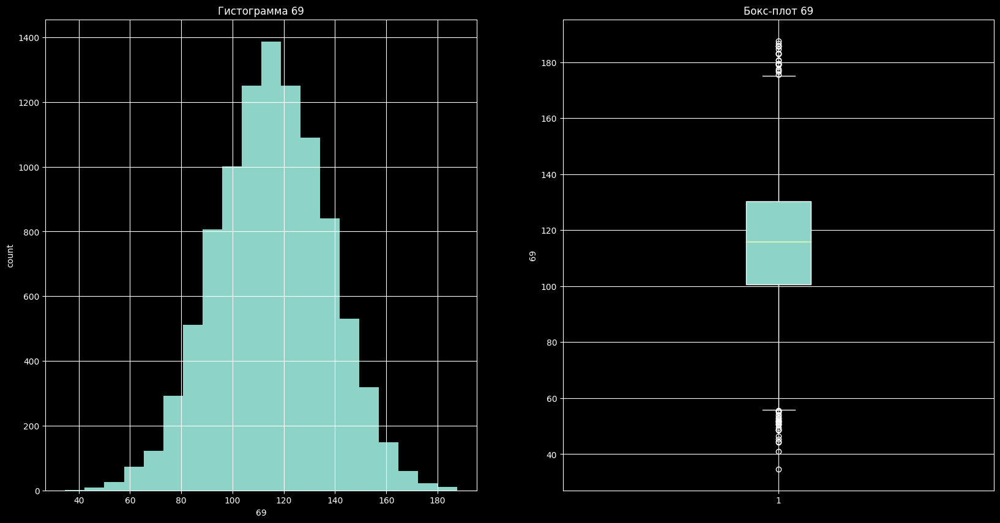

70
count    9756.000000
mean     -707.763346
std       405.894803
min     -1297.871984
25%     -1074.464888
50%      -798.921738
75%      -360.709910
max        97.787799
Name: 70, dtype: float64


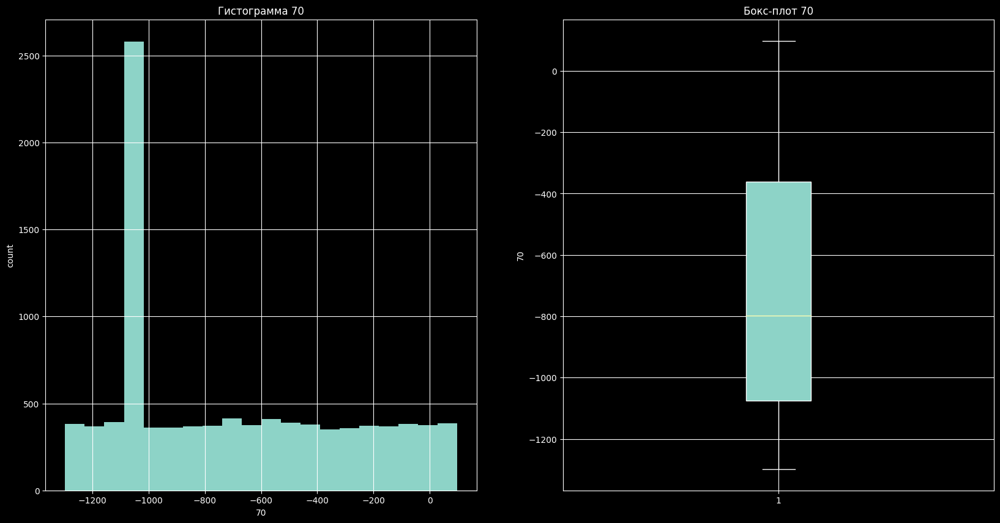

71
count    9756.000000
mean      -48.269466
std        40.924960
min      -208.276810
25%       -75.299866
50%       -48.982439
75%       -21.702771
max       111.831955
Name: 71, dtype: float64


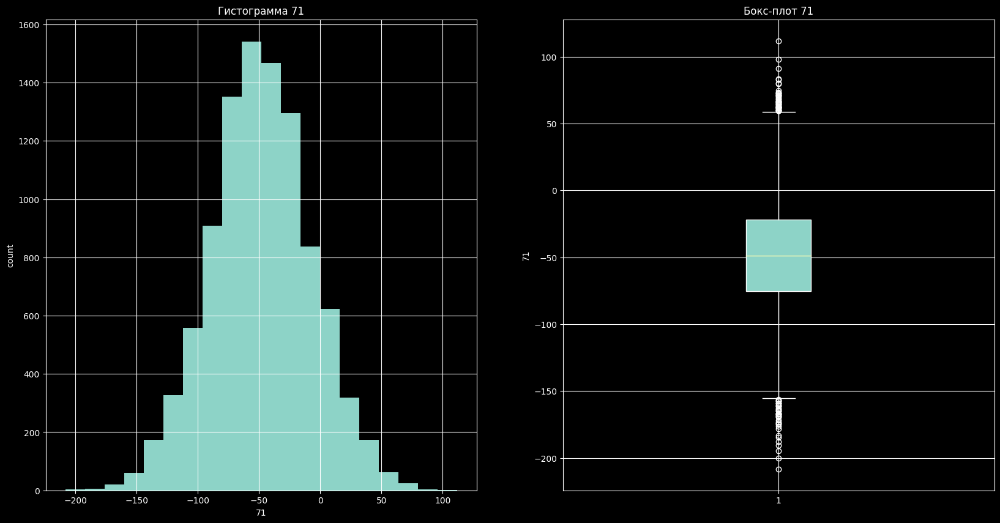

In [ ]:
for colum in [str(_) for _ in range(72)]:
    print(colum)
    print(train[colum].describe())
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].hist(train[colum], bins=20)
    ax[0].set_title('Гистограмма ' + colum)
    ax[0].set_xlabel(colum)
    ax[0].set_ylabel('count')
    ax[0].grid(True)

    ax[1].boxplot(train[colum], patch_artist=True)
    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum)
    ax[1].grid(True)
    plt.show()

### Validation

0
count    9735.000000
mean      -85.364575
std        25.890376
min      -167.550670
25%      -103.268313
50%       -85.485504
75%       -67.288240
max        10.861183
Name: 0, dtype: float64


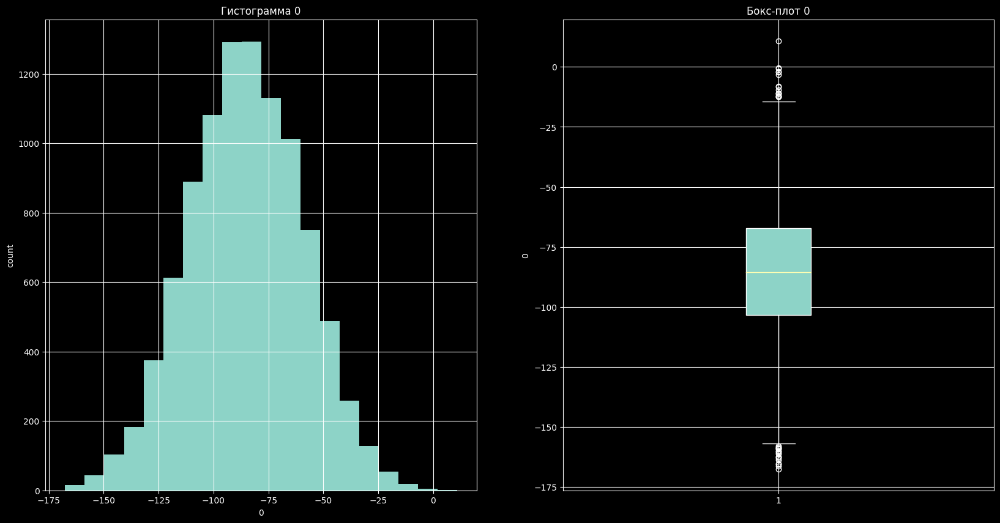

1
count    9735.000000
mean        7.640901
std         4.946807
min       -10.583933
25%         4.250976
50%         7.600389
75%        10.955034
max        27.944784
Name: 1, dtype: float64


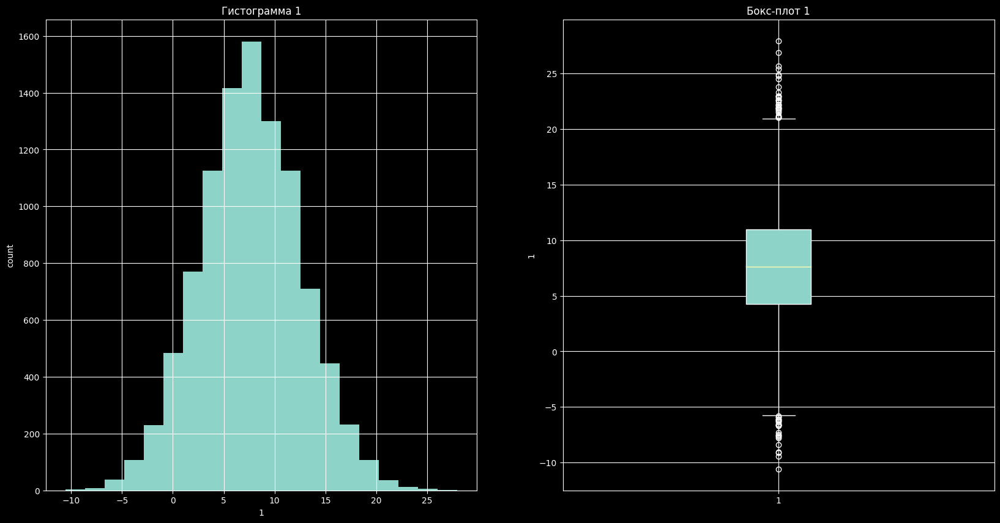

2
count    9735.000000
mean      -43.723550
std        38.803276
min      -205.797360
25%       -69.631315
50%       -43.263650
75%       -17.939057
max       107.040690
Name: 2, dtype: float64


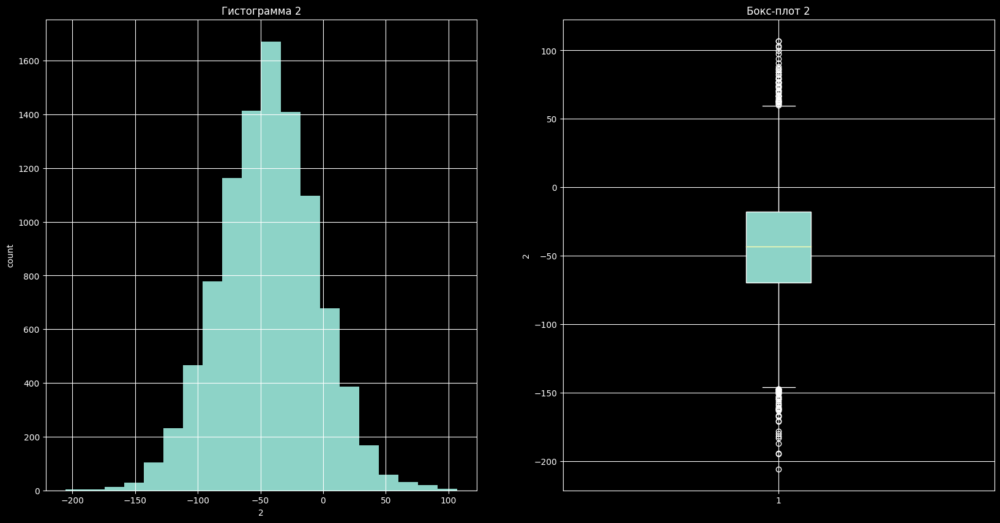

3
count    9735.000000
mean     -146.076968
std        20.580620
min      -219.720890
25%      -160.040820
50%      -146.115020
75%      -131.969895
max       -73.909584
Name: 3, dtype: float64


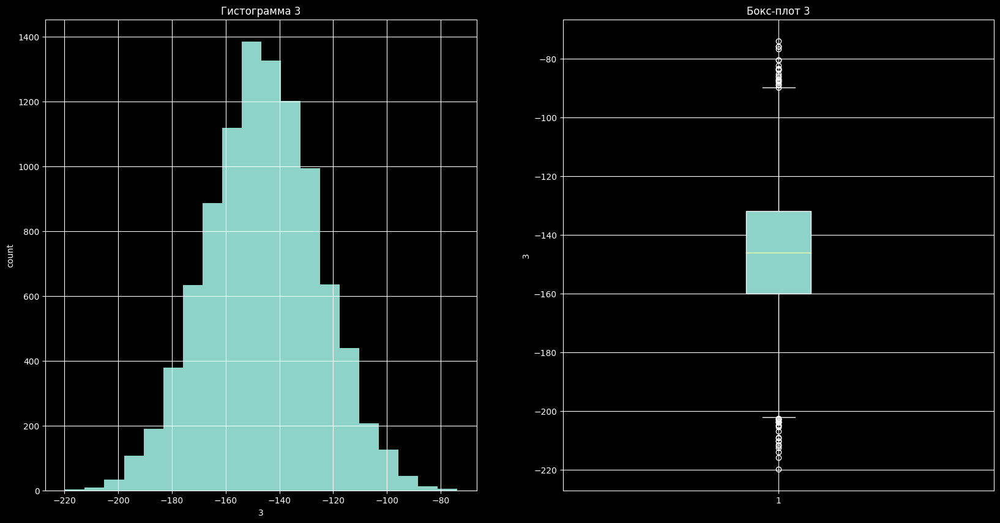

4
count    9735.000000
mean      111.180517
std        47.807285
min       -76.422760
25%        78.565993
50%       111.344860
75%       143.594795
max       287.397200
Name: 4, dtype: float64


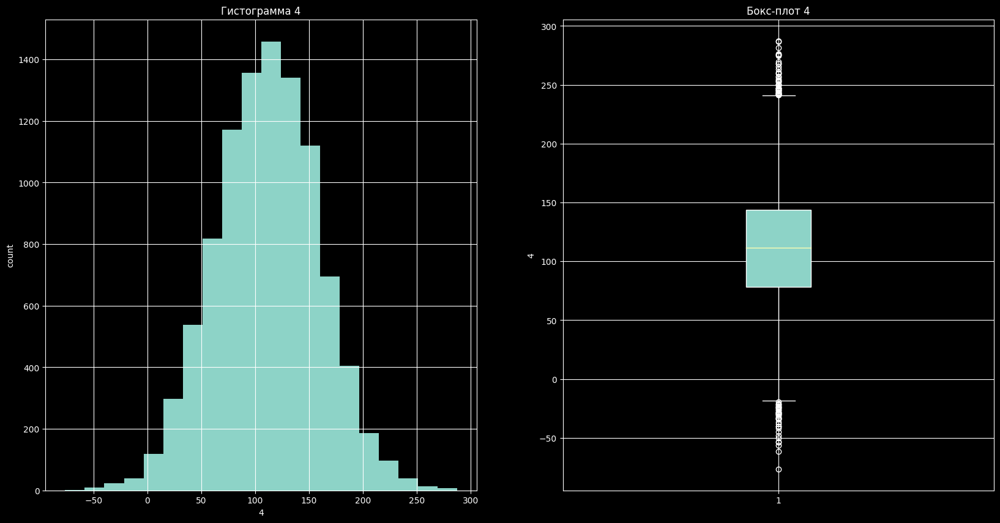

5
count    9735.000000
mean      -72.702286
std        28.605532
min      -170.868380
25%       -92.282133
50%       -72.729330
75%       -53.401766
max        47.001106
Name: 5, dtype: float64


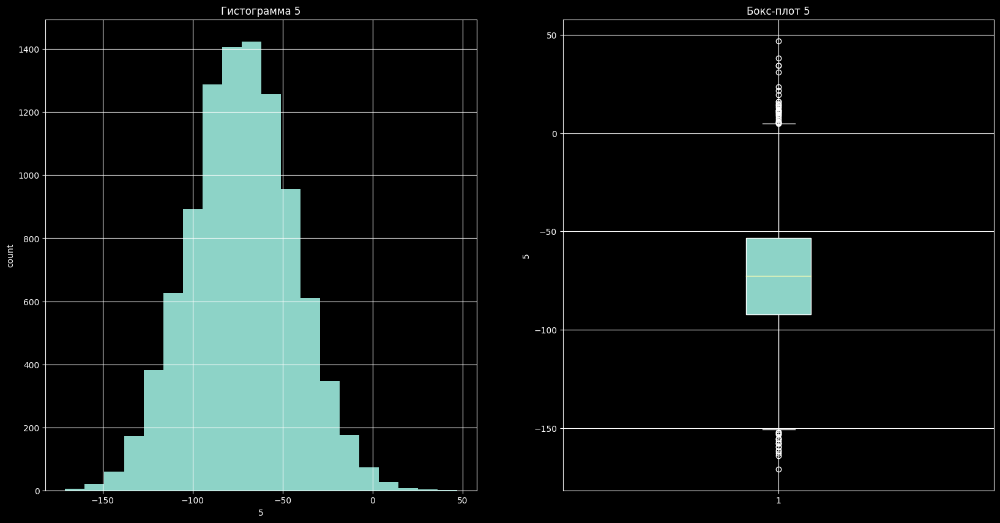

6
count    9735.000000
mean     -440.679542
std       278.993259
min      -791.443909
25%      -739.714037
50%      -512.480617
75%      -204.339780
max       109.404851
Name: 6, dtype: float64


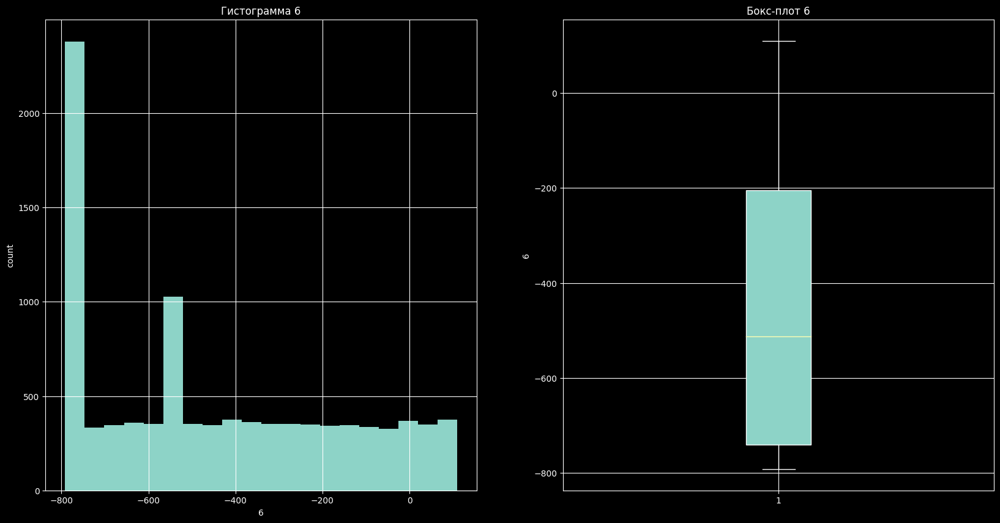

7
count    9735.000000
mean       21.852440
std        66.340512
min      -277.983950
25%       -22.096068
50%        22.613623
75%        67.070775
max       251.090180
Name: 7, dtype: float64


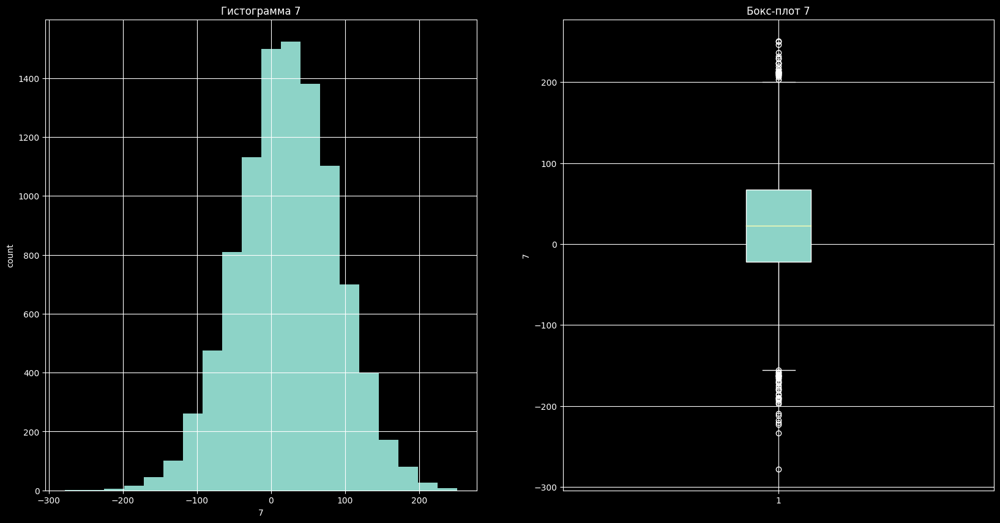

8
count    9735.000000
mean      123.071432
std         6.512706
min        97.360535
25%       118.670208
50%       123.113500
75%       127.580203
max       146.034410
Name: 8, dtype: float64


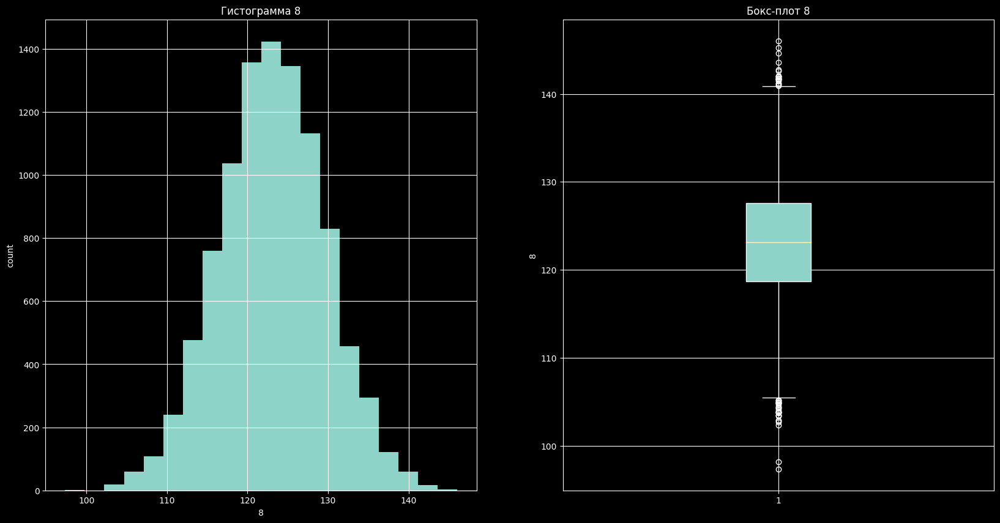

9
count    9735.000000
mean      124.721299
std        65.460379
min      -118.700714
25%        81.134553
50%       124.854450
75%       168.512845
max       350.088320
Name: 9, dtype: float64


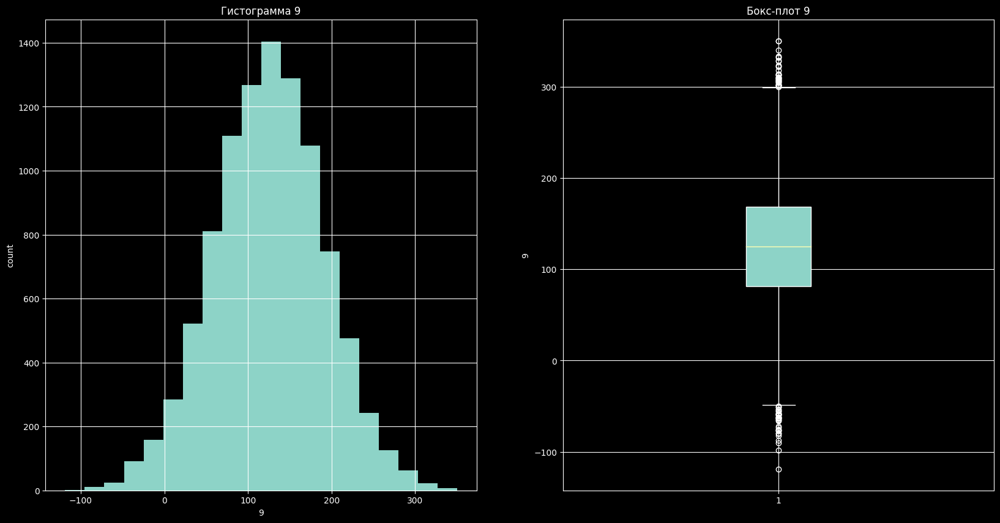

10
count    9735.000000
mean     -141.499588
std        42.148235
min      -330.570600
25%      -169.120580
50%      -140.899920
75%      -113.054950
max        15.473236
Name: 10, dtype: float64


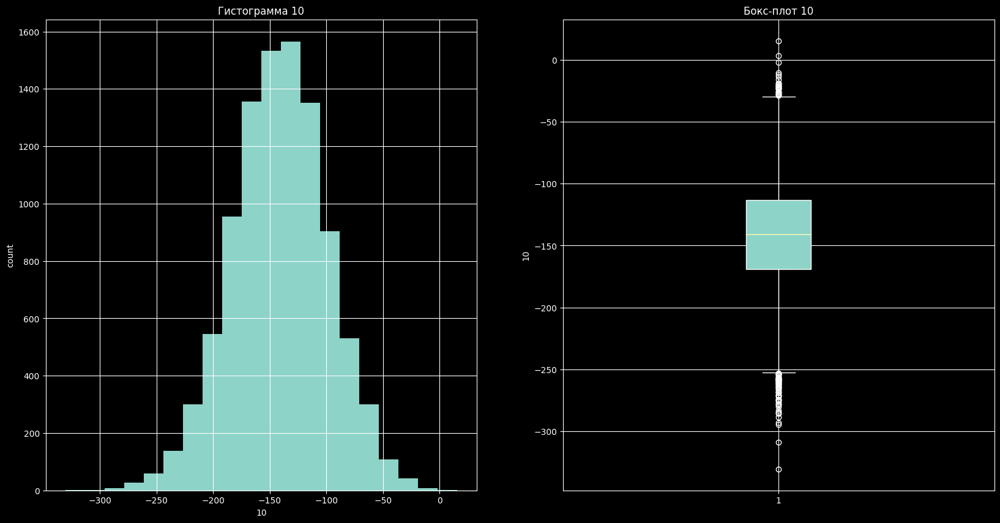

11
count    9735.000000
mean      -68.684407
std        51.121635
min      -319.487200
25%      -102.577742
50%       -67.885090
75%       -33.834952
max       142.509250
Name: 11, dtype: float64


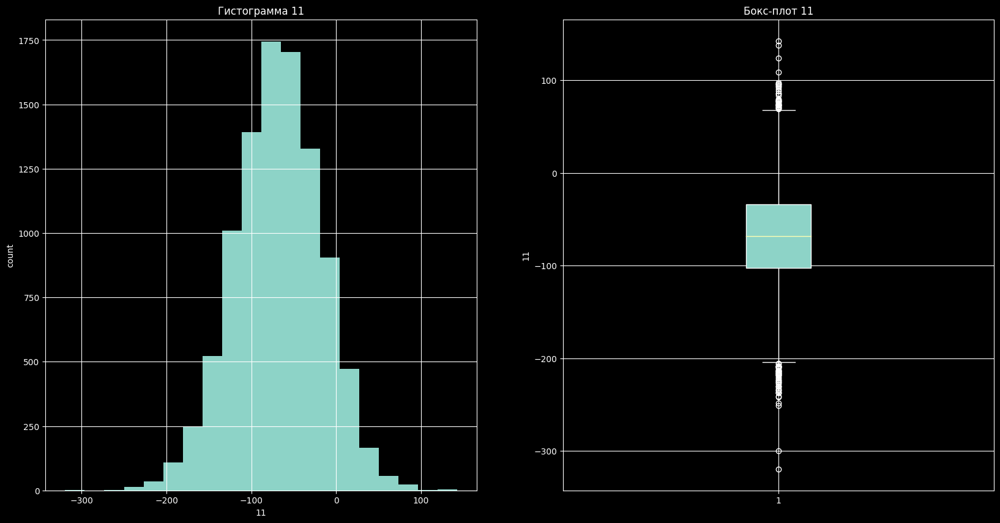

12
count    9735.000000
mean      -41.786089
std        41.254938
min      -186.662410
25%       -69.403943
50%       -41.397670
75%       -13.557892
max       100.769580
Name: 12, dtype: float64


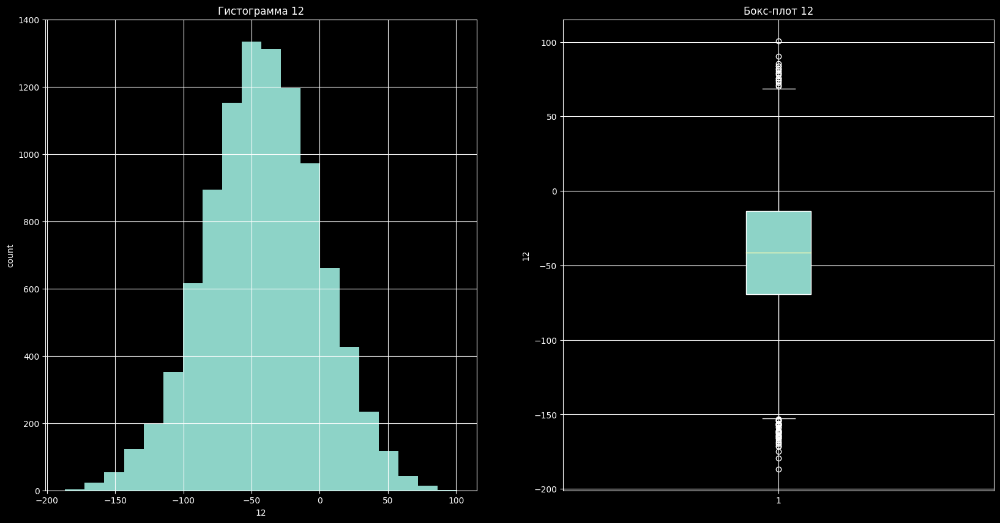

13
count    9735.000000
mean        6.622721
std        37.186194
min      -127.034910
25%       -18.708523
50%         6.904329
75%        31.643438
max       155.685520
Name: 13, dtype: float64


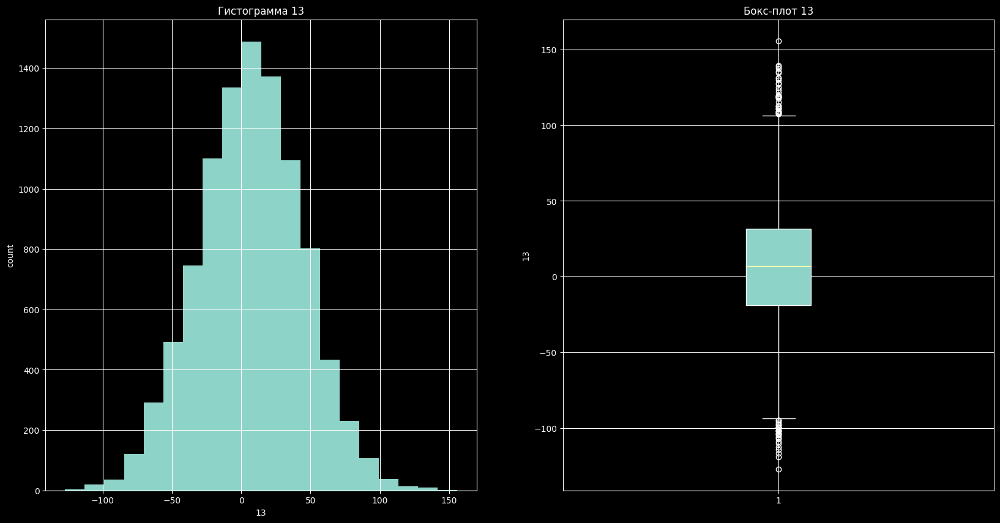

14
count    9735.000000
mean      148.120857
std        34.065221
min        14.174850
25%       125.994335
50%       148.404750
75%       171.113365
max       279.152560
Name: 14, dtype: float64


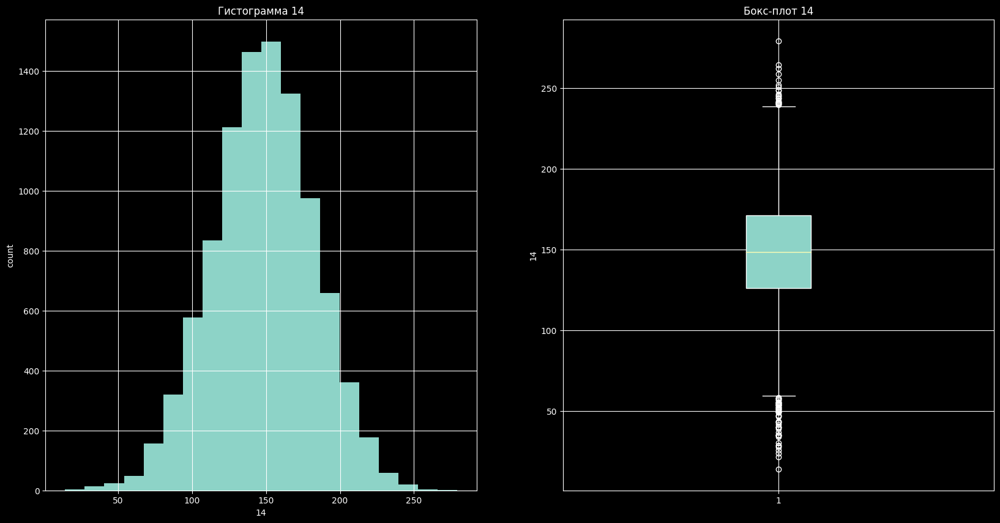

15
count    9735.000000
mean      -24.060975
std        13.098376
min       -76.103580
25%       -32.618764
50%       -23.912780
75%       -15.481599
max        33.496887
Name: 15, dtype: float64


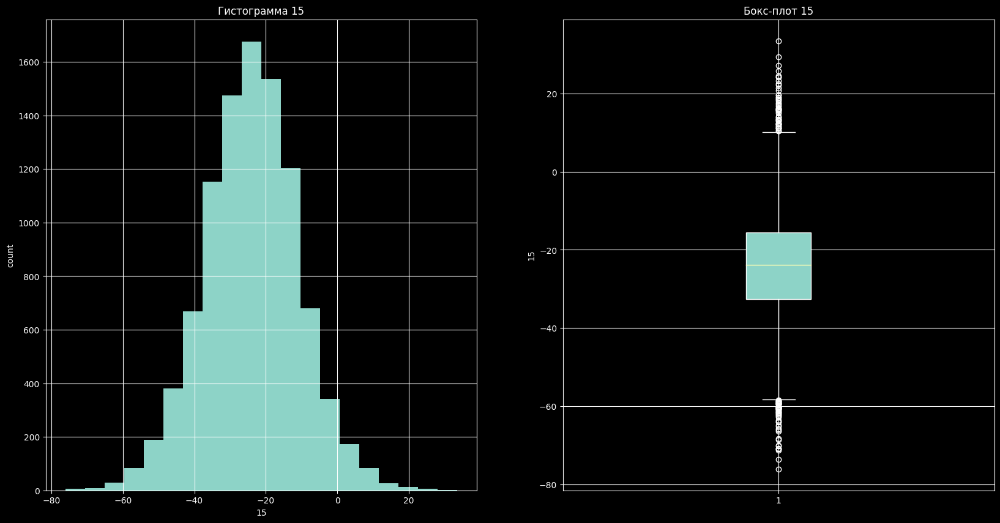

16
count    9735.000000
mean       -2.182174
std        20.932264
min       -73.360480
25%       -16.586205
50%        -2.412594
75%        11.654926
max        78.473526
Name: 16, dtype: float64


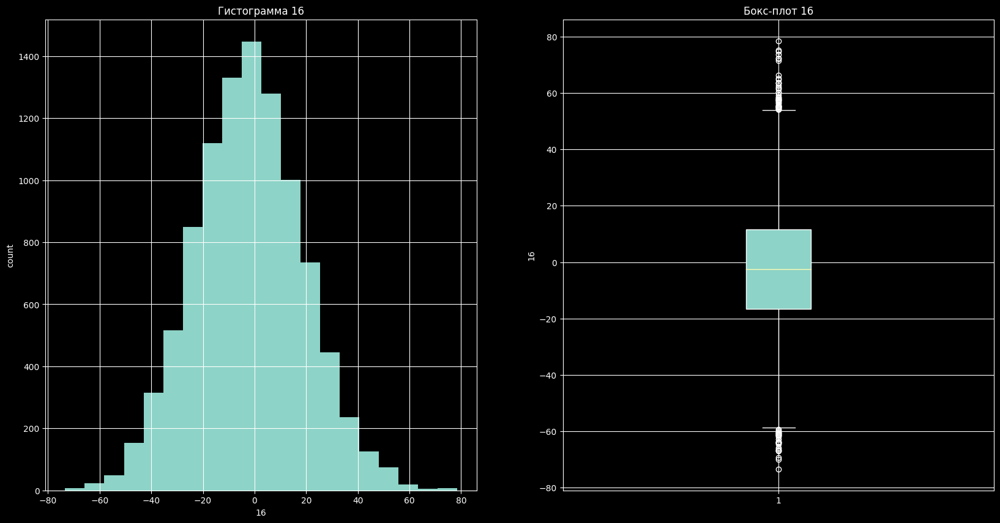

17
count    9735.000000
mean      -12.852237
std        55.093514
min      -213.804920
25%       -50.577282
50%       -12.208562
75%        25.118610
max       169.186540
Name: 17, dtype: float64


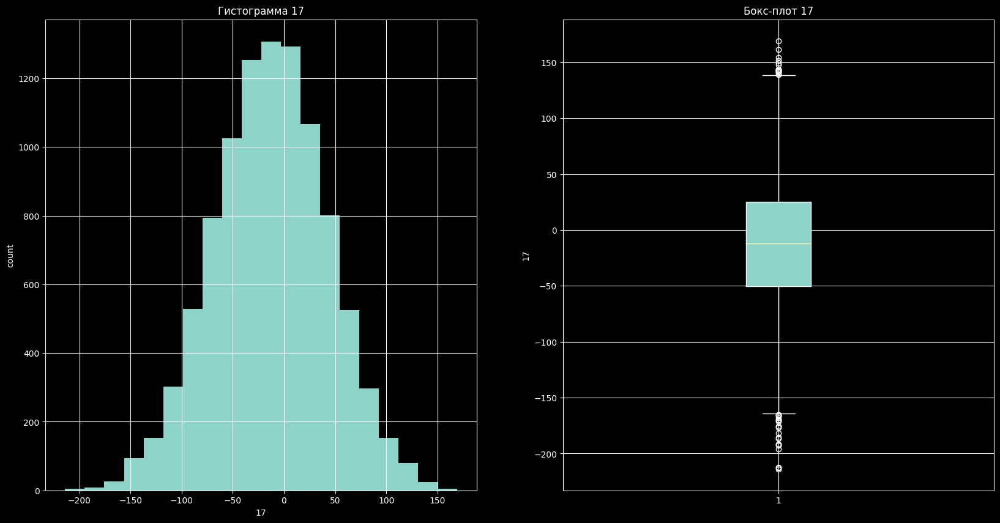

18
count    9735.000000
mean     -138.850373
std        49.204191
min      -325.562040
25%      -171.874565
50%      -139.693240
75%      -106.968215
max        58.336655
Name: 18, dtype: float64


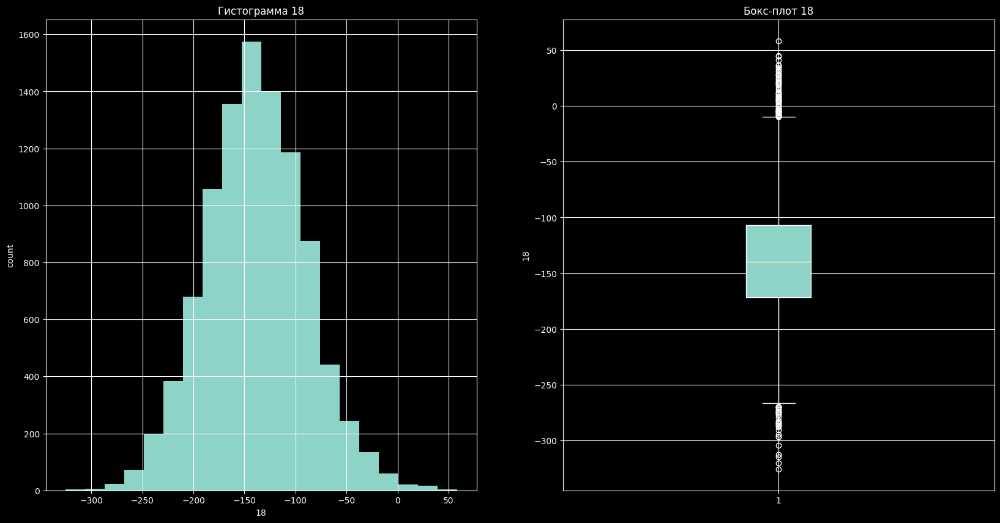

19
count    9735.000000
mean      -79.158748
std         0.775514
min       -82.637184
25%       -79.648830
50%       -79.128586
75%       -78.641835
max       -76.566574
Name: 19, dtype: float64


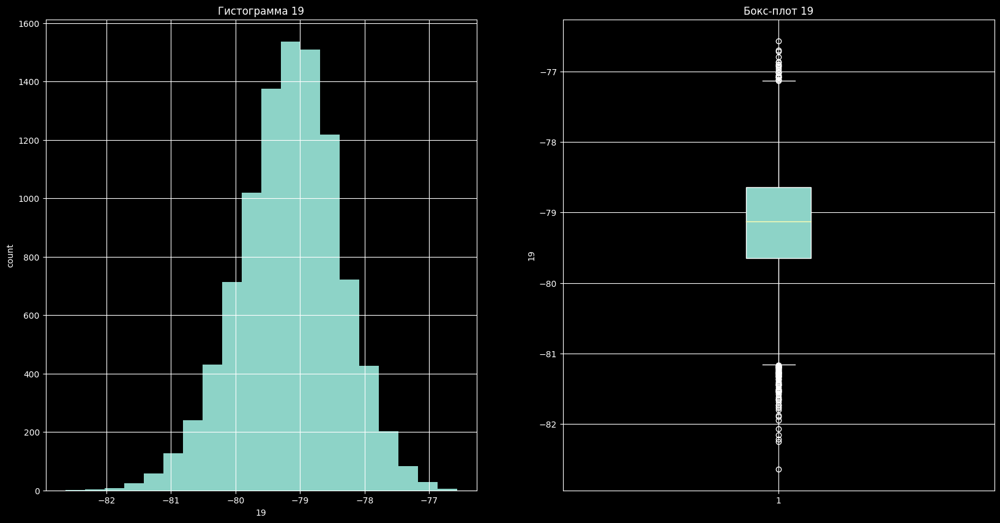

20
count    9735.000000
mean      -97.476448
std        28.866701
min      -214.844510
25%      -115.624470
50%       -96.716010
75%       -78.278427
max        13.653412
Name: 20, dtype: float64


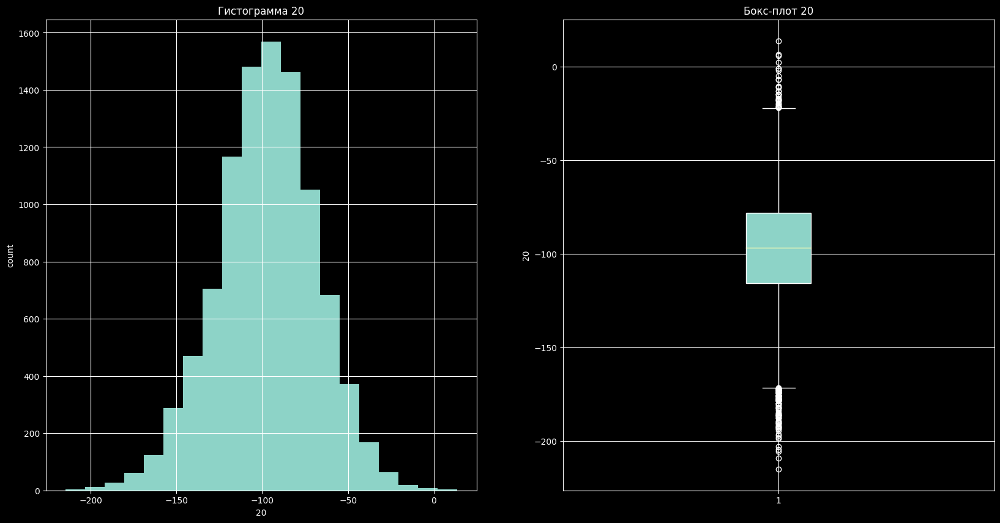

21
count    9735.000000
mean     1302.445748
std       370.650087
min       136.900447
25%      1248.126198
50%      1507.231274
75%      1507.231274
max      1557.383334
Name: 21, dtype: float64


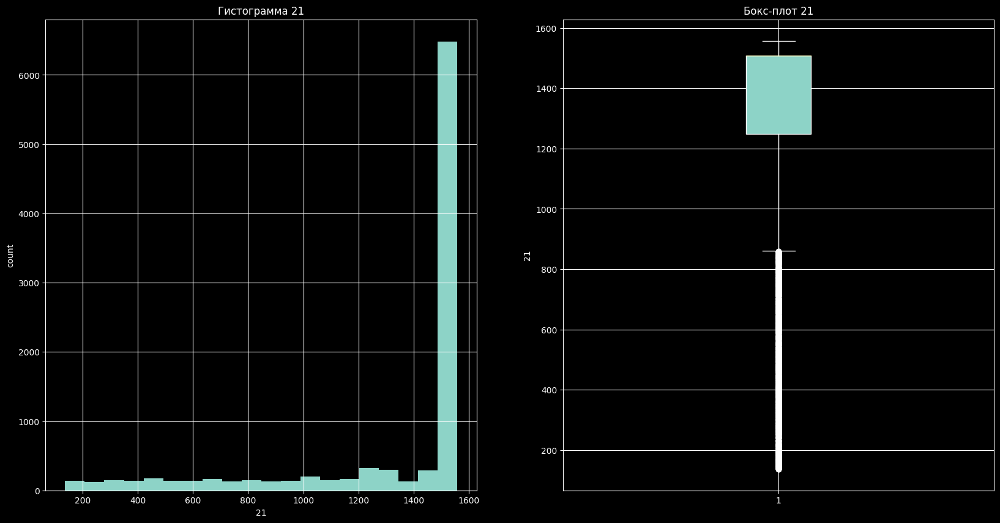

22
count    9735.000000
mean       -3.595626
std        50.496995
min      -203.143550
25%       -37.582628
50%        -3.536906
75%        30.158653
max       182.802830
Name: 22, dtype: float64


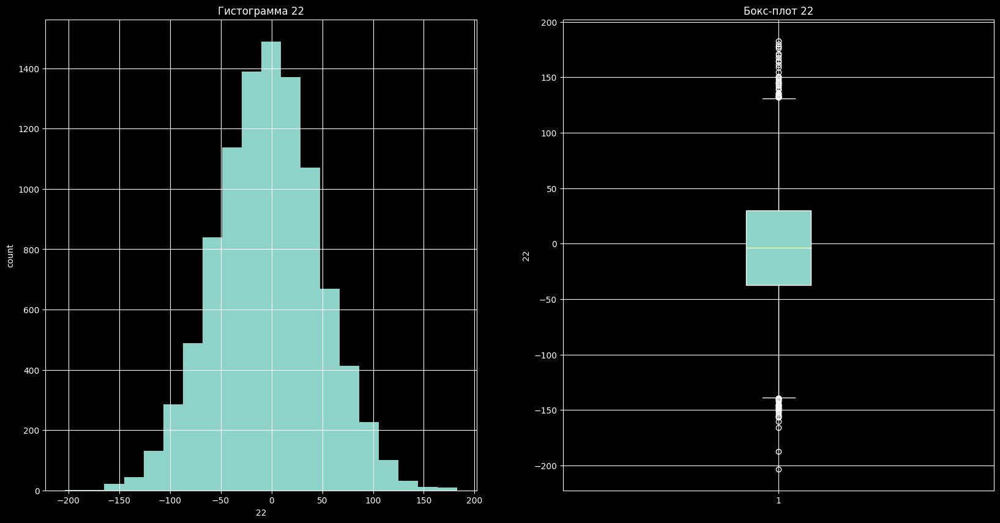

23
count    9735.000000
mean       56.021914
std        35.755869
min       -71.251465
25%        31.335777
50%        55.198696
75%        80.137276
max       207.021060
Name: 23, dtype: float64


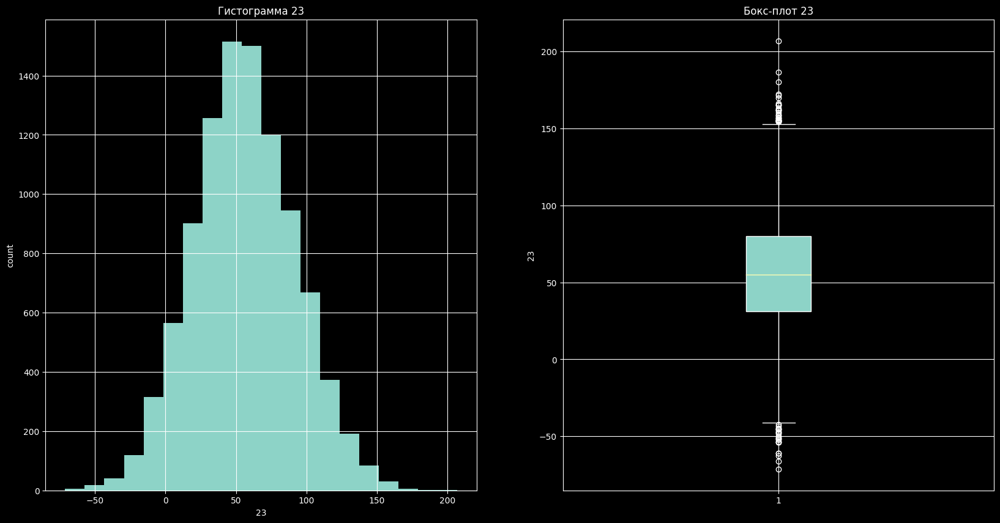

24
count    9735.000000
mean       23.626519
std        40.783425
min      -111.529680
25%        -5.232156
50%        23.786629
75%        51.845538
max       169.642990
Name: 24, dtype: float64


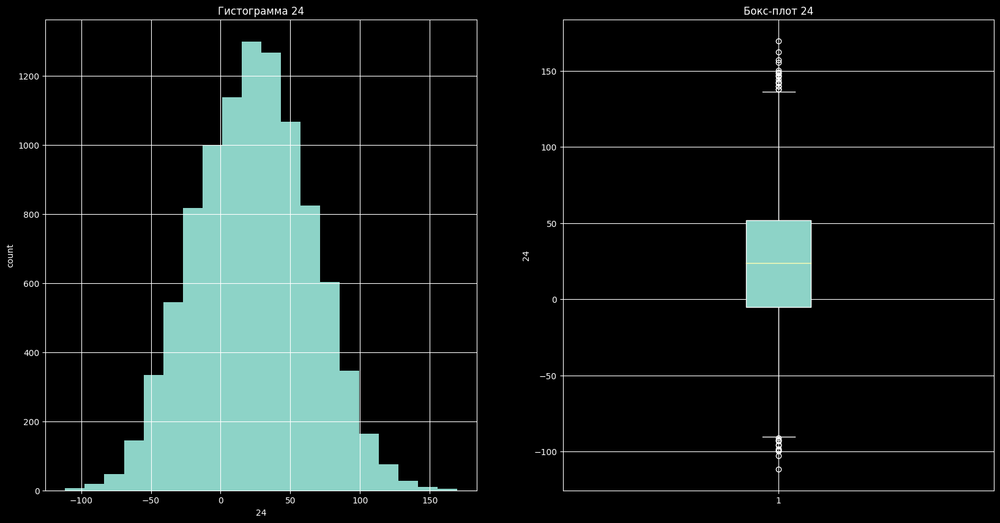

25
count    9735.000000
mean      743.443589
std       188.689078
min       -61.372864
25%       813.770071
50%       813.770071
75%       813.770071
max       843.769977
Name: 25, dtype: float64


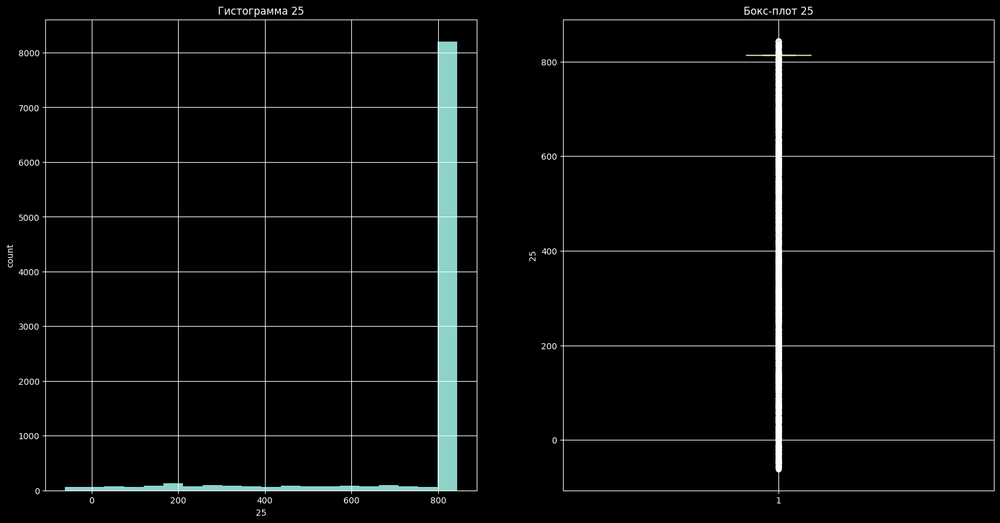

26
count    9735.000000
mean      -64.064063
std        63.645000
min      -320.391100
25%      -106.519423
50%       -64.237280
75%       -22.757931
max       186.595730
Name: 26, dtype: float64


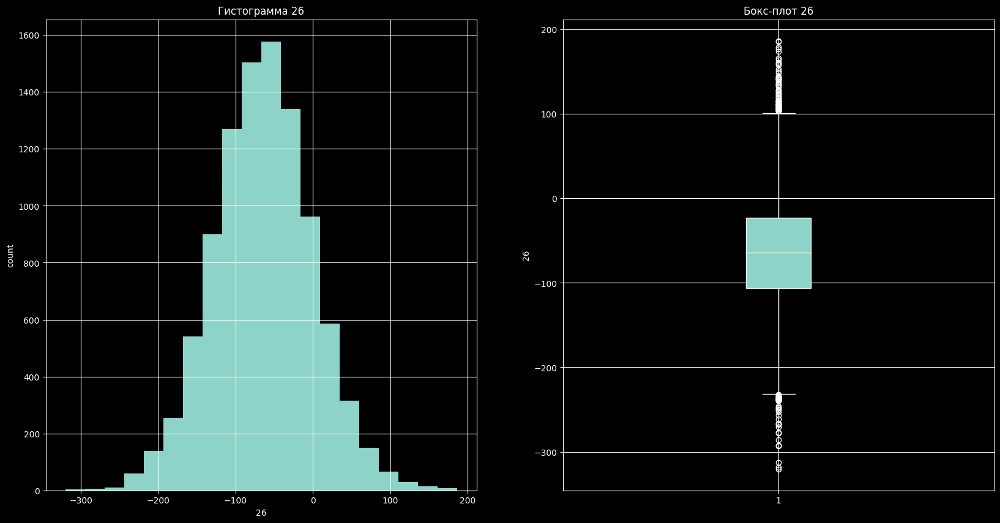

27
count    9735.000000
mean       16.329780
std         4.850581
min        -3.172426
25%        13.133897
50%        16.444958
75%        19.690629
max        35.141838
Name: 27, dtype: float64


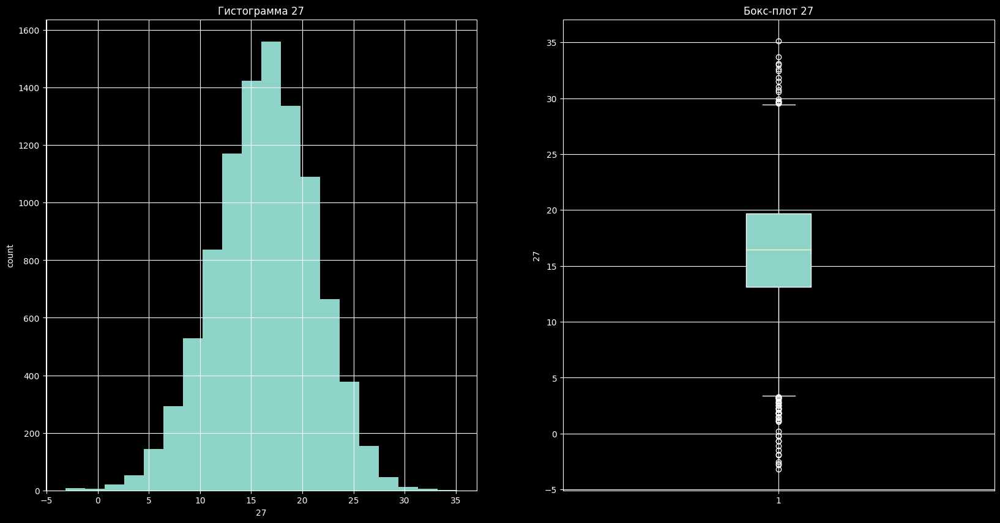

28
count    9735.000000
mean      -85.665628
std        49.099519
min      -285.668700
25%      -118.938665
50%       -85.630264
75%       -53.015785
max        93.949160
Name: 28, dtype: float64


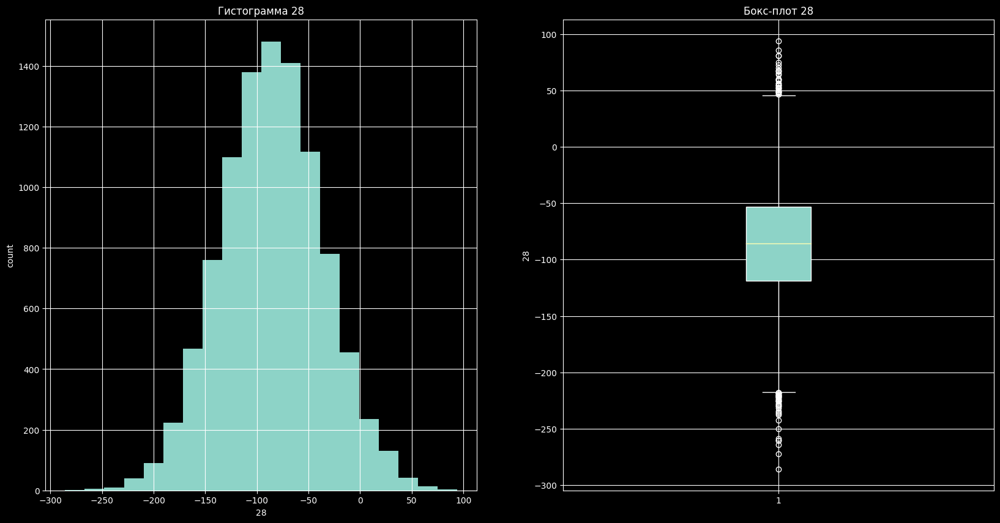

29
count    9735.000000
mean      152.097939
std        10.295764
min       114.074390
25%       145.408445
50%       151.802250
75%       158.726410
max       194.006530
Name: 29, dtype: float64


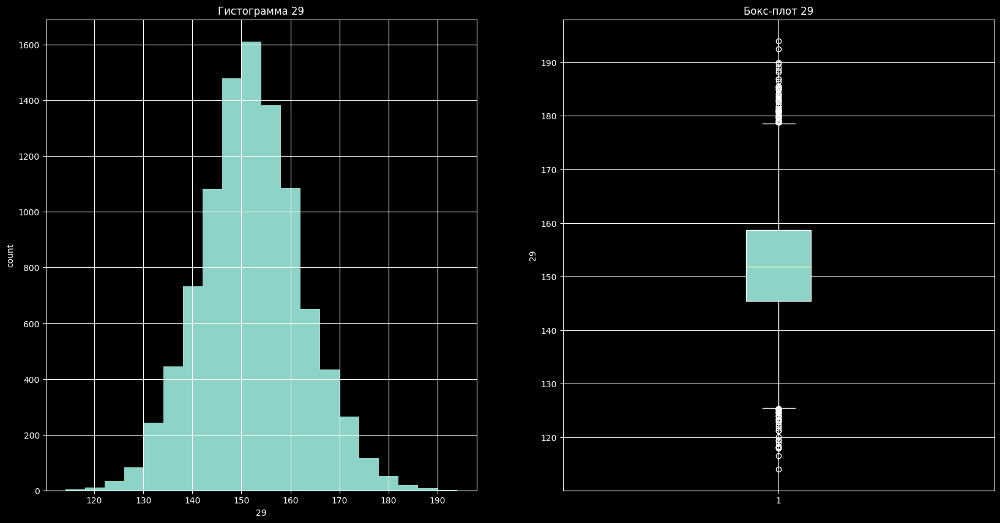

30
count    9735.000000
mean      -13.369737
std        29.175207
min      -129.807620
25%       -32.844118
50%       -12.940484
75%         6.177093
max        89.562400
Name: 30, dtype: float64


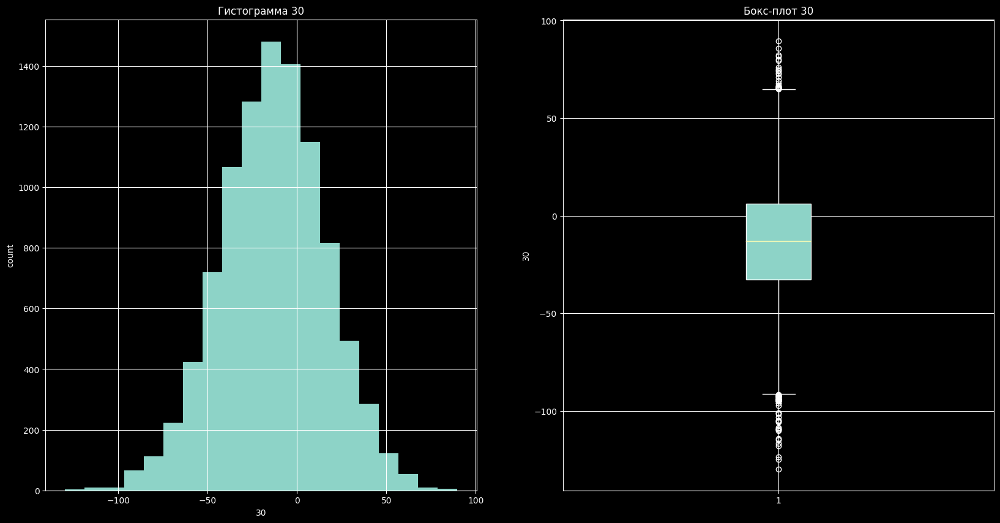

31
count    9735.000000
mean     -144.944461
std        36.153267
min      -279.023320
25%      -169.402075
50%      -145.121190
75%      -120.509158
max       -13.835709
Name: 31, dtype: float64


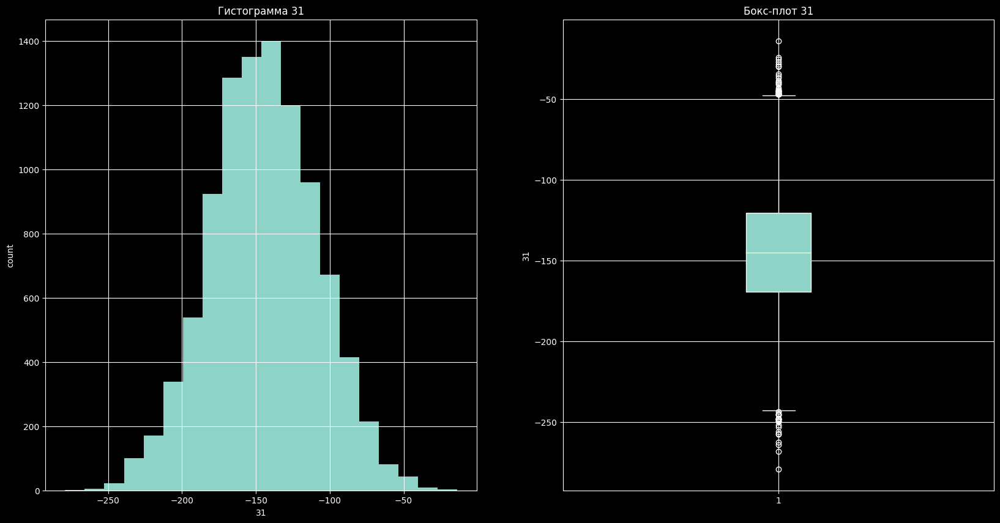

32
count    9735.000000
mean       89.854857
std        28.351659
min       -15.432167
25%        70.095470
50%        90.216360
75%       109.253198
max       191.028380
Name: 32, dtype: float64


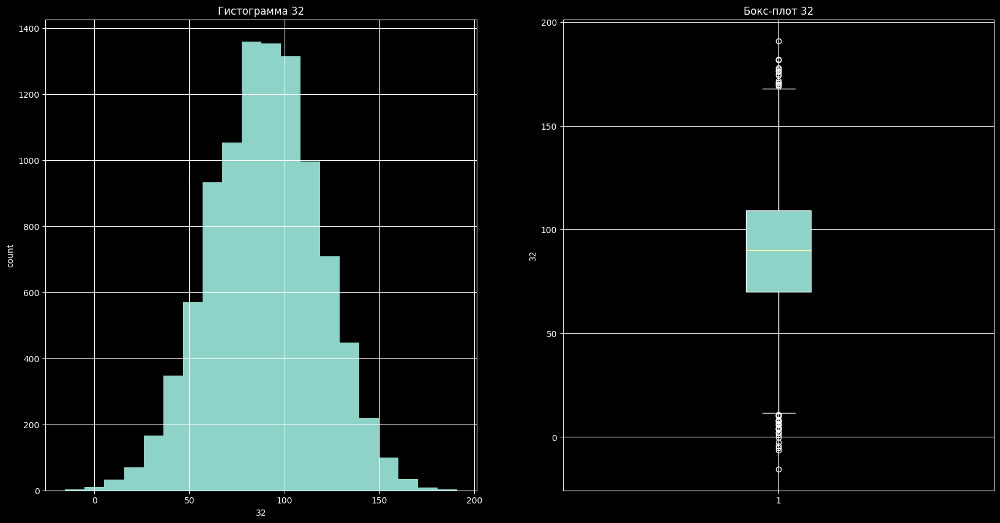

33
count    9735.000000
mean     -590.094829
std       273.475871
min     -1044.135662
25%      -803.390708
50%      -587.287872
75%      -351.013430
max      -137.646757
Name: 33, dtype: float64


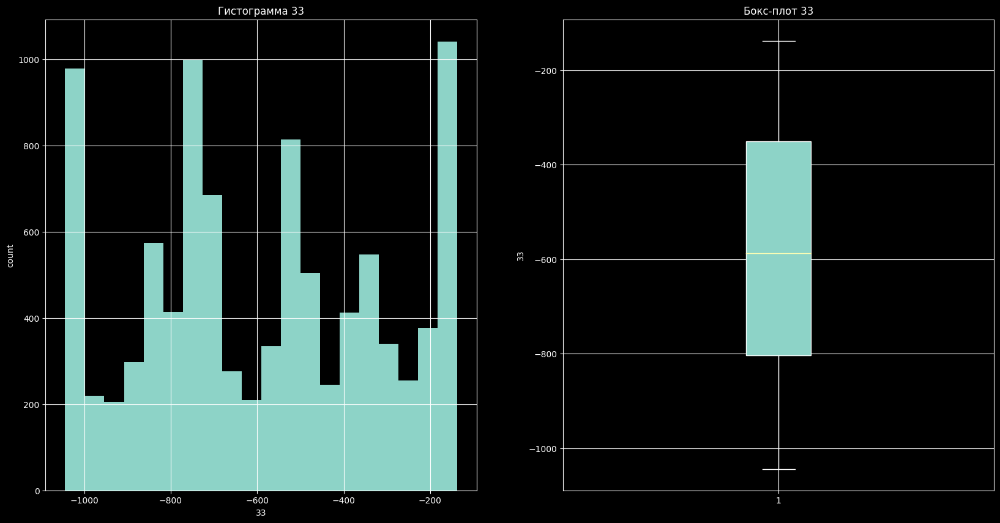

34
count    9735.000000
mean       37.476729
std        39.533159
min      -106.804090
25%        10.672597
50%        37.084910
75%        64.964088
max       223.982030
Name: 34, dtype: float64


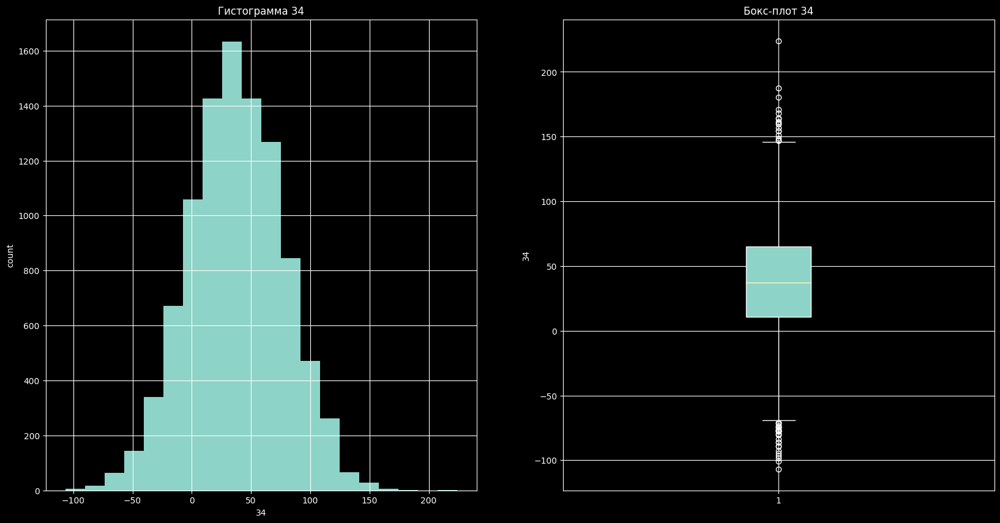

35
count    9735.000000
mean       72.712337
std        20.330299
min         4.486587
25%        59.498079
50%        72.539960
75%        86.193958
max       145.948400
Name: 35, dtype: float64


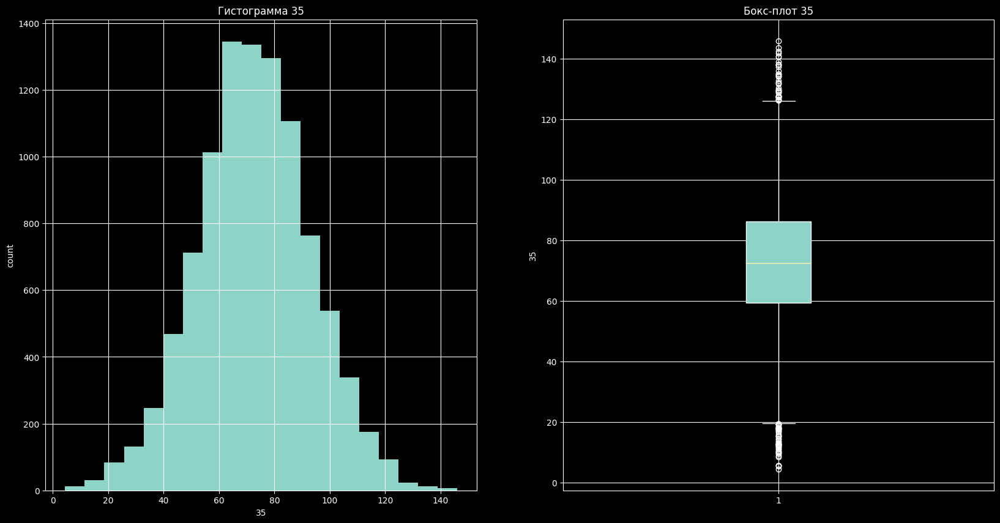

36
count    9735.000000
mean      -14.236674
std        25.620190
min      -124.311615
25%       -31.548547
50%       -13.454527
75%         3.426095
max        68.436780
Name: 36, dtype: float64


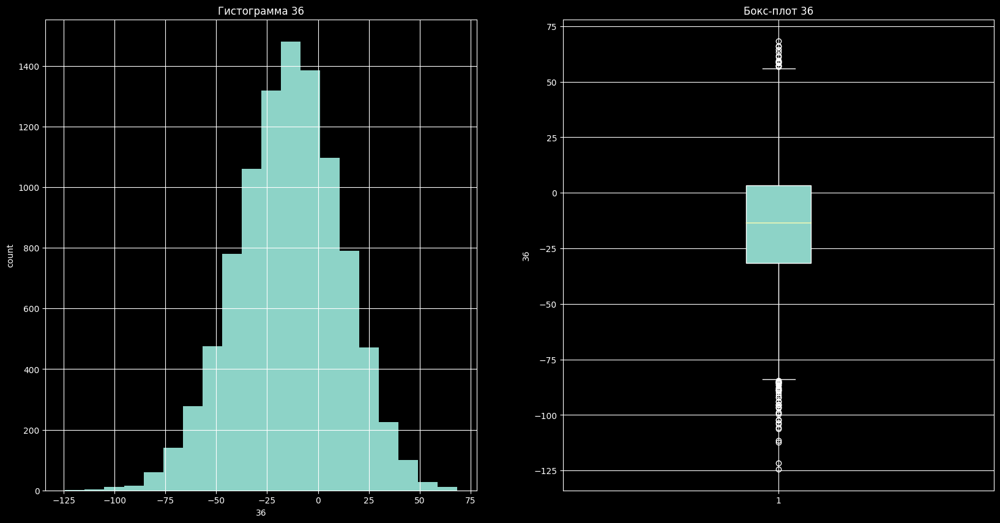

37
count    9735.000000
mean     -146.492903
std        10.515476
min      -182.330830
25%      -153.487830
50%      -146.283950
75%      -139.338005
max      -109.528610
Name: 37, dtype: float64


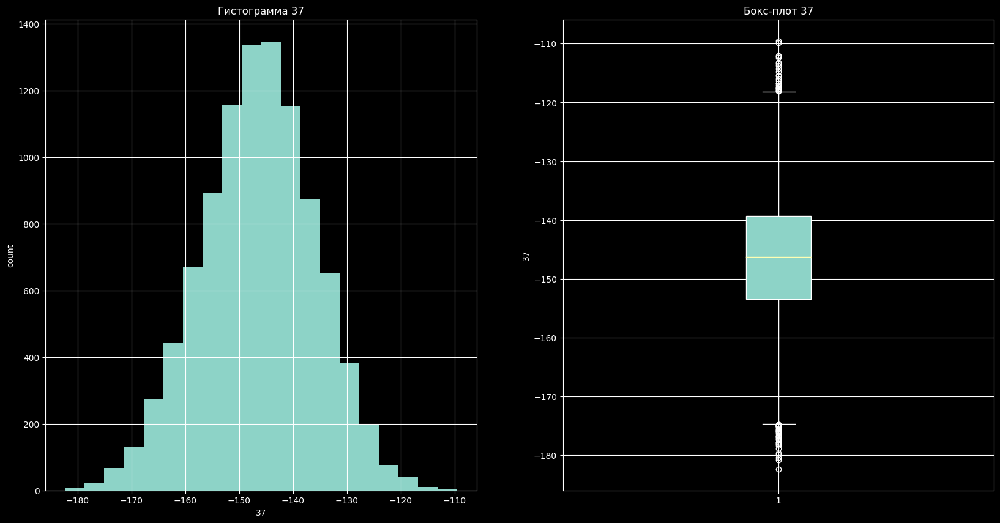

38
count    9735.000000
mean     -118.578325
std        13.661736
min      -163.759160
25%      -127.913495
50%      -118.470170
75%      -109.198302
max       -61.248470
Name: 38, dtype: float64


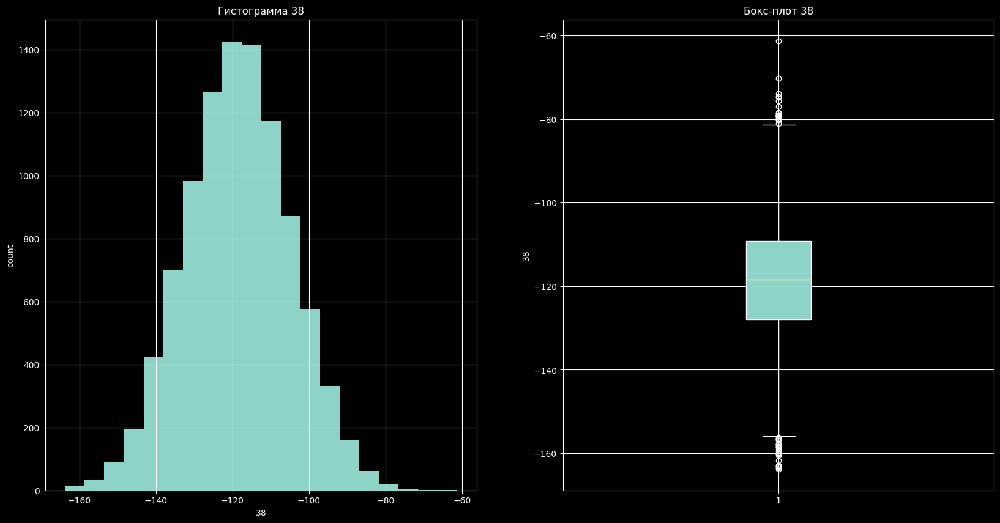

39
count    9735.000000
mean      -41.159419
std        19.721320
min      -117.975280
25%       -54.561668
50%       -41.340380
75%       -27.818393
max        29.915936
Name: 39, dtype: float64


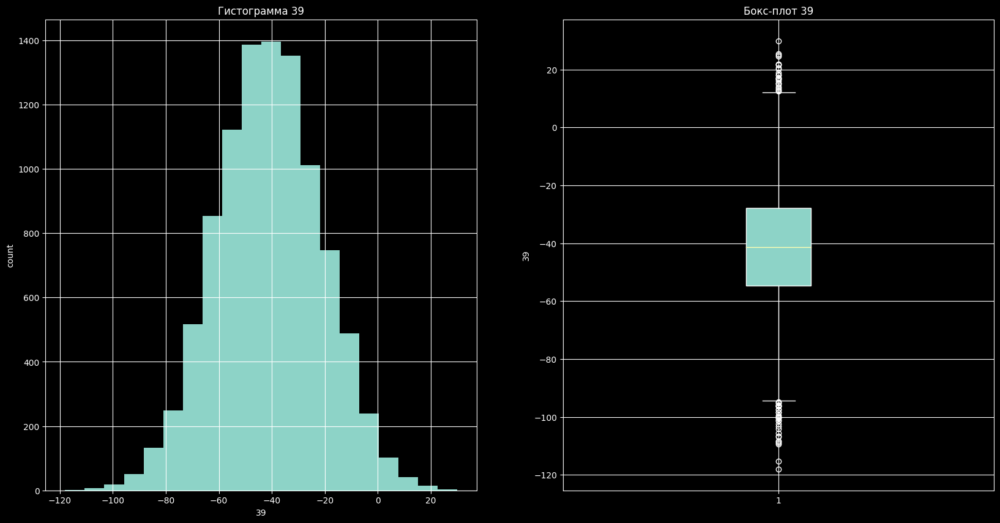

40
count    9735.000000
mean       -9.406986
std         8.338084
min       -38.138474
25%       -14.902623
50%        -9.388214
75%        -3.822462
max        23.958340
Name: 40, dtype: float64


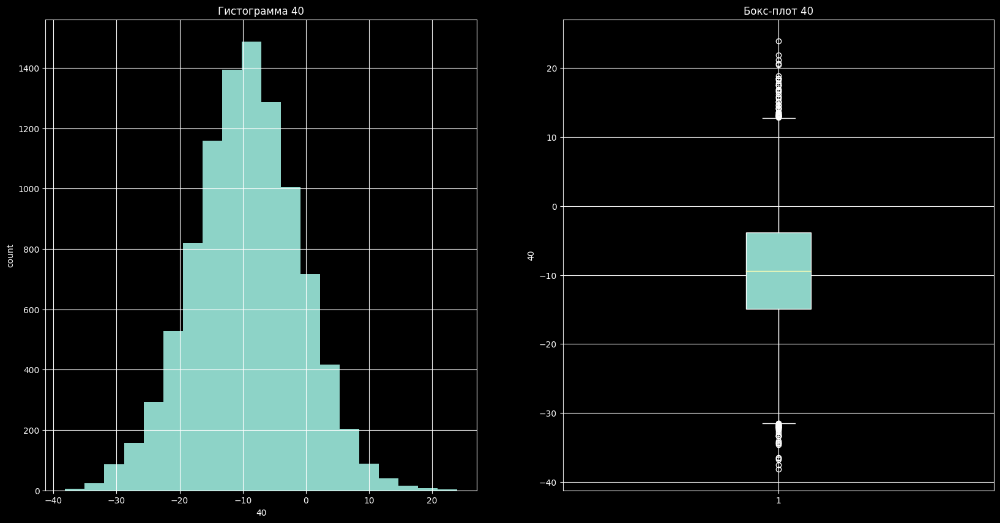

41
count    9735.000000
mean        4.146328
std         5.895173
min       -17.022370
25%         0.100580
50%         4.240728
75%         8.216057
max        23.811054
Name: 41, dtype: float64


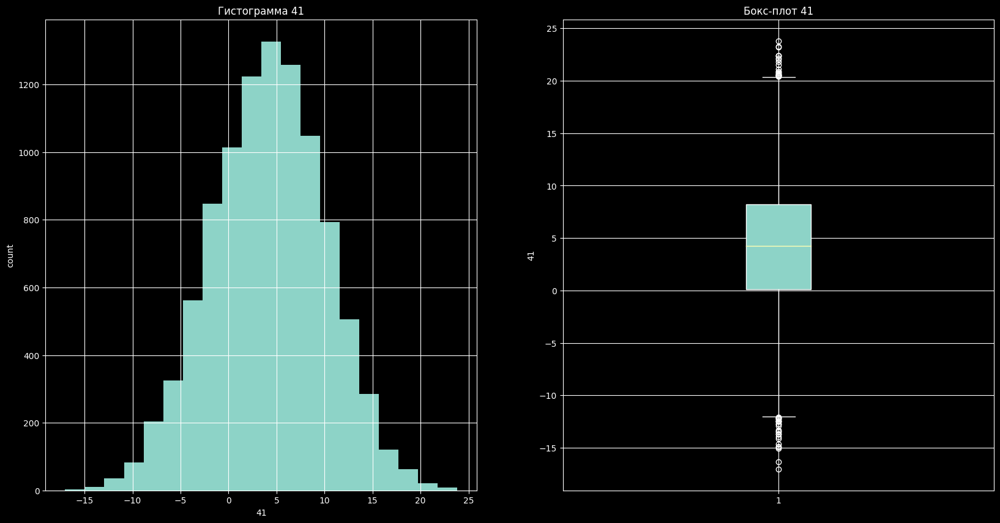

42
count    9735.000000
mean     -104.752560
std        56.893860
min      -312.002870
25%      -145.075110
50%      -105.927574
75%       -66.124640
max        95.003815
Name: 42, dtype: float64


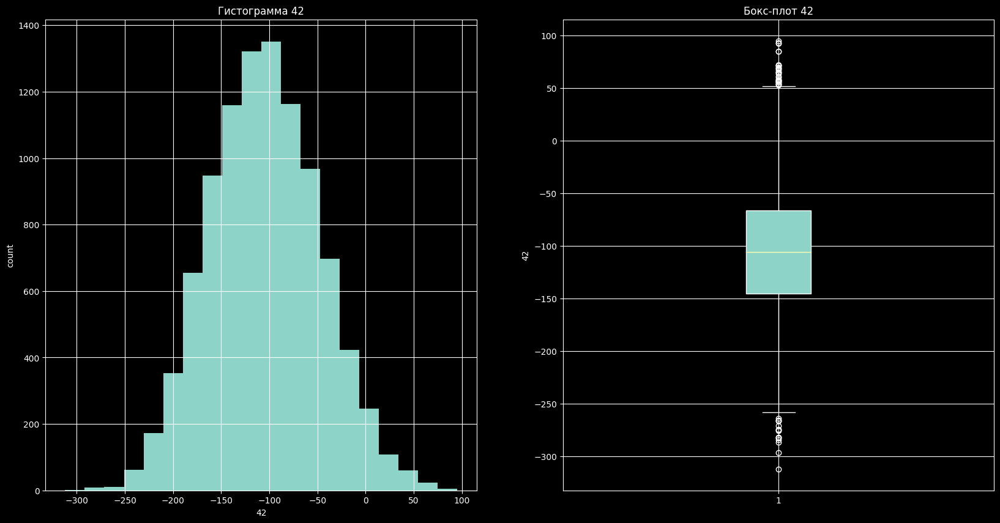

43
count    9735.000000
mean      122.322146
std        48.357816
min       -67.570360
25%        89.475403
50%       122.252720
75%       155.247510
max       278.892360
Name: 43, dtype: float64


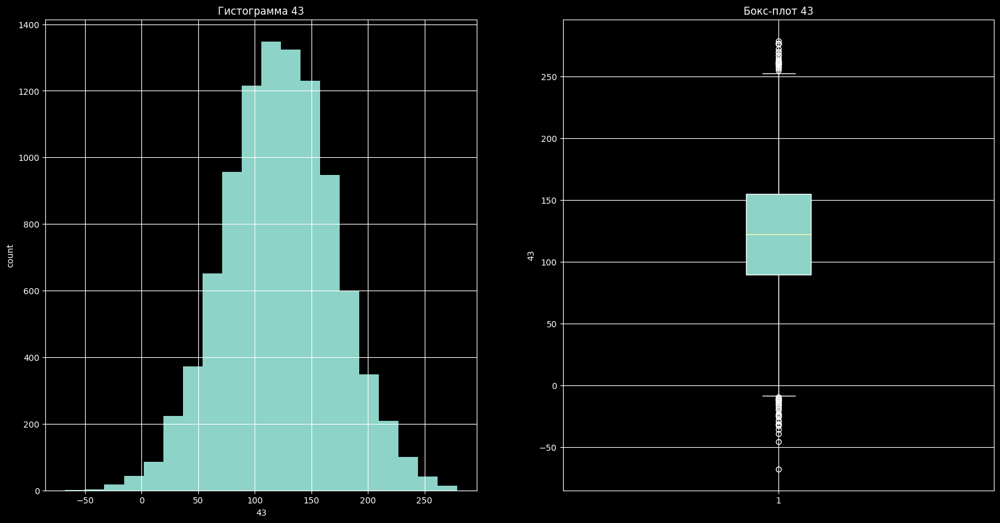

44
count    9735.000000
mean      -40.282123
std        14.852290
min       -63.092999
25%       -54.018840
50%       -39.727996
75%       -26.409095
max       -16.075579
Name: 44, dtype: float64


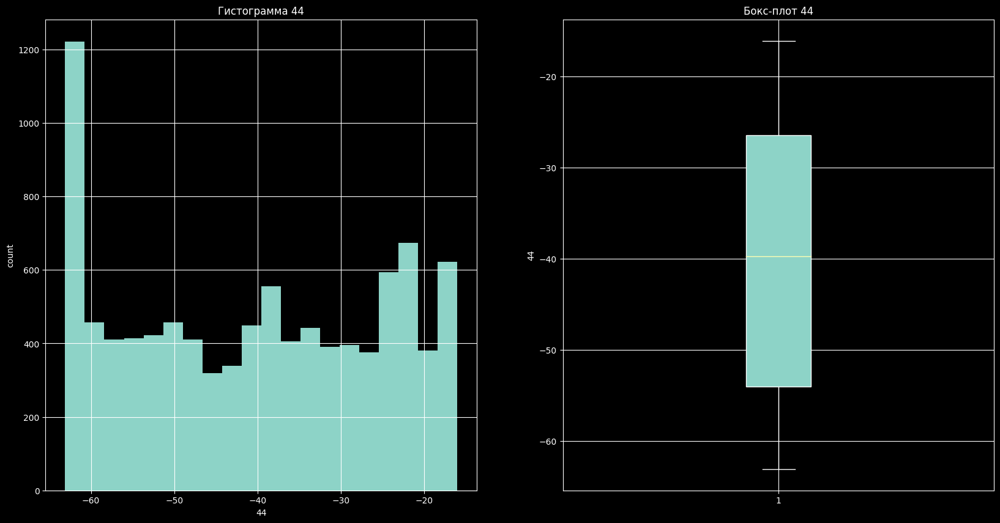

45
count    9735.000000
mean       58.734728
std        31.012773
min       -76.792040
25%        37.391254
50%        59.166286
75%        80.113120
max       171.937640
Name: 45, dtype: float64


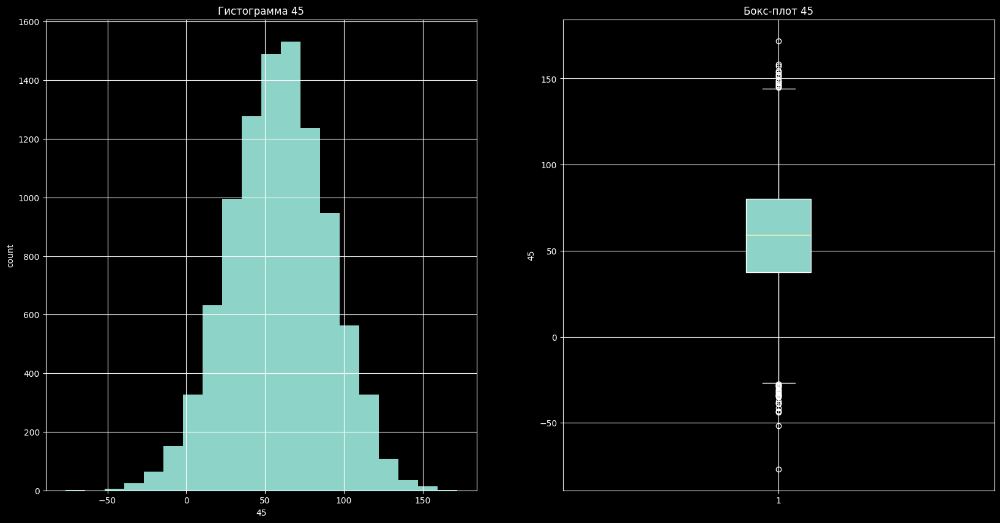

46
count    9735.000000
mean      -84.842082
std        65.781095
min      -290.236330
25%      -130.404005
50%       -86.409320
75%       -39.377296
max       197.354130
Name: 46, dtype: float64


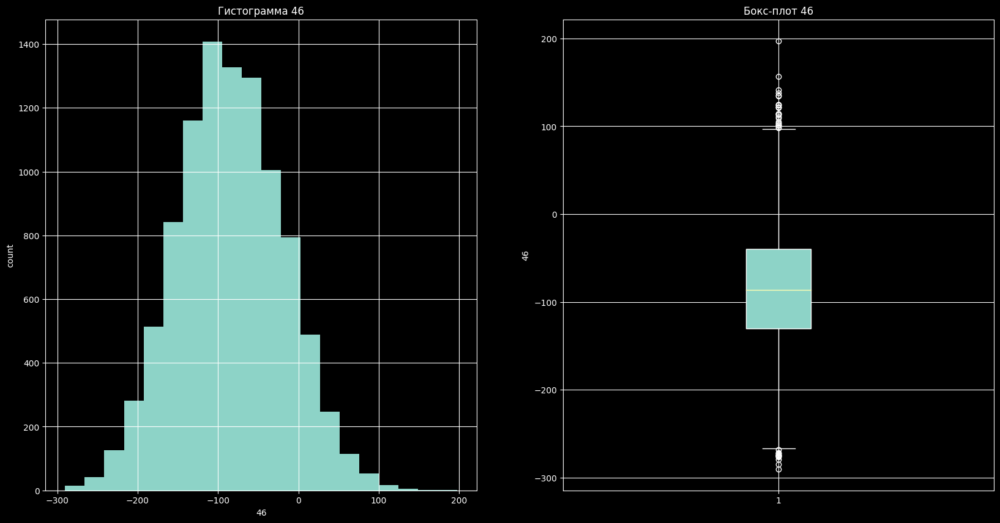

47
count    9735.000000
mean     -141.458111
std        59.703645
min      -353.775000
25%      -181.792465
50%      -141.882780
75%      -101.075895
max       110.090000
Name: 47, dtype: float64


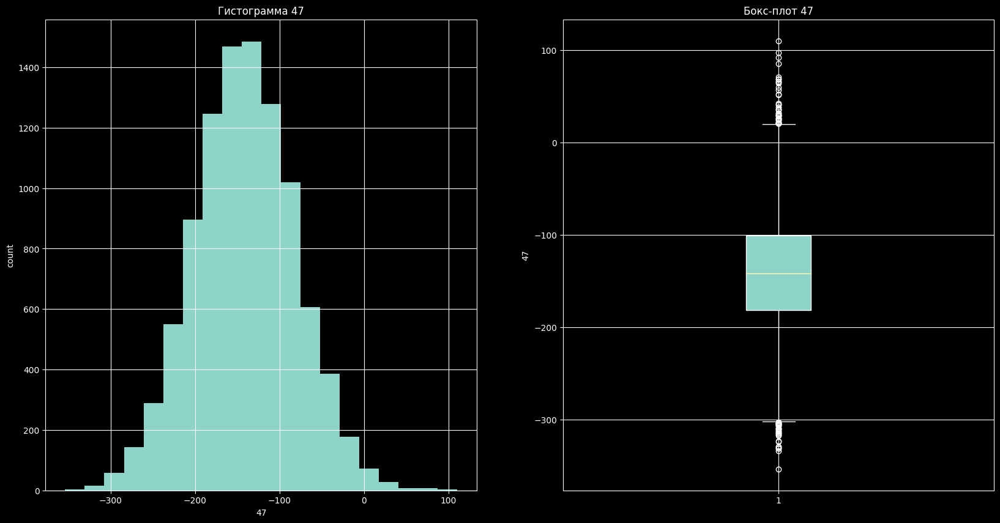

48
count    9735.000000
mean       46.612373
std        46.237686
min      -111.037350
25%        14.865068
50%        46.255440
75%        77.806175
max       211.886810
Name: 48, dtype: float64


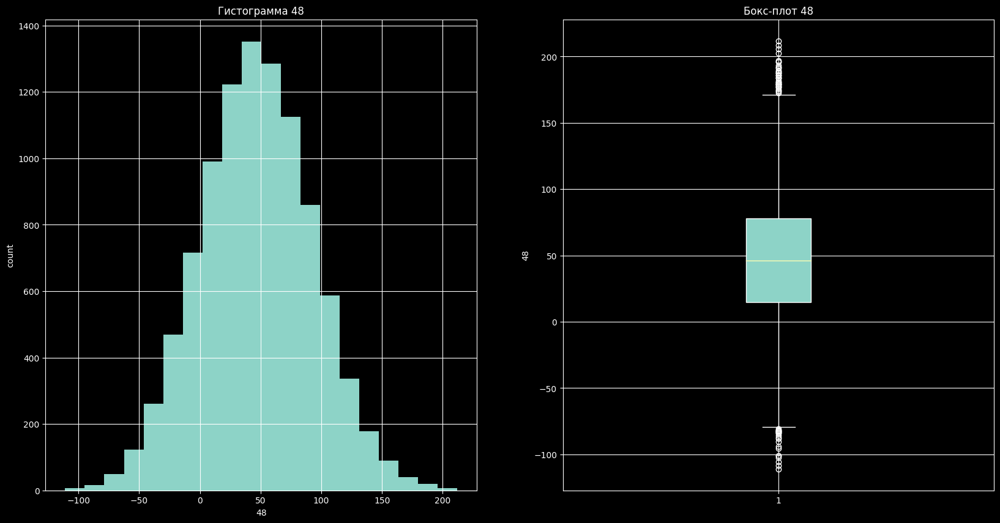

49
count    9735.000000
mean      -35.455933
std        59.082068
min      -254.934420
25%       -74.031225
50%       -32.736713
75%         5.116560
max       176.815170
Name: 49, dtype: float64


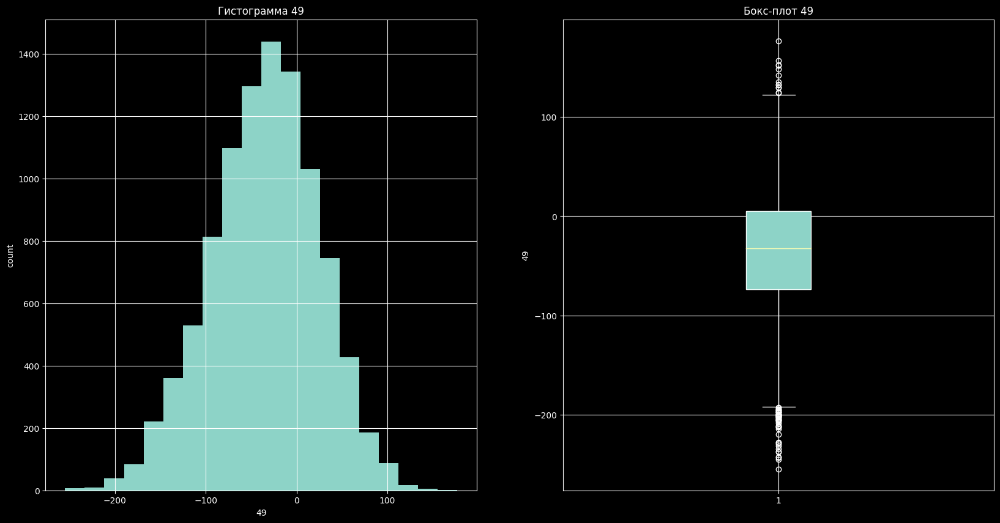

50
count    9735.000000
mean       28.374233
std        60.998014
min      -279.886380
25%       -12.656837
50%        29.086891
75%        68.943935
max       241.087370
Name: 50, dtype: float64


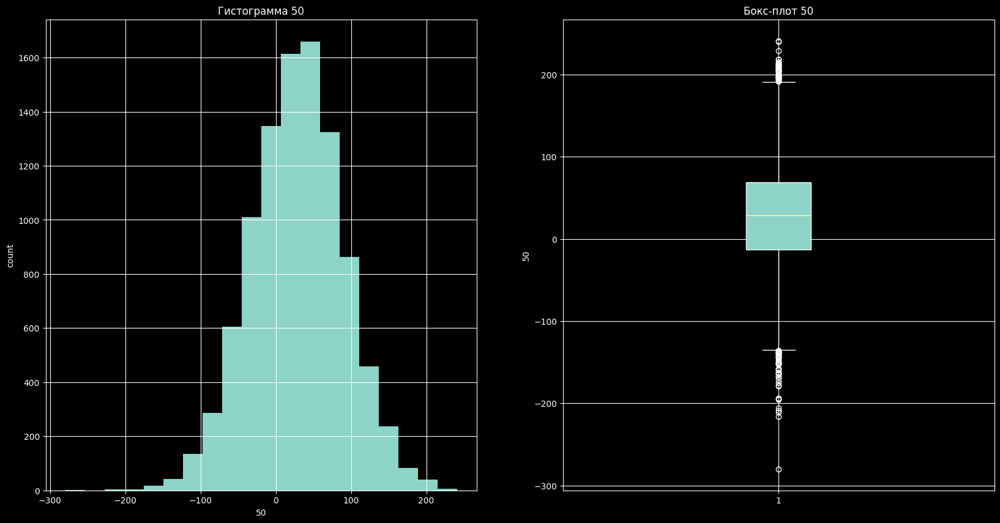

51
count    9735.000000
mean      -22.795400
std        54.338410
min      -224.566300
25%       -59.697986
50%       -23.492388
75%        13.683350
max       167.806640
Name: 51, dtype: float64


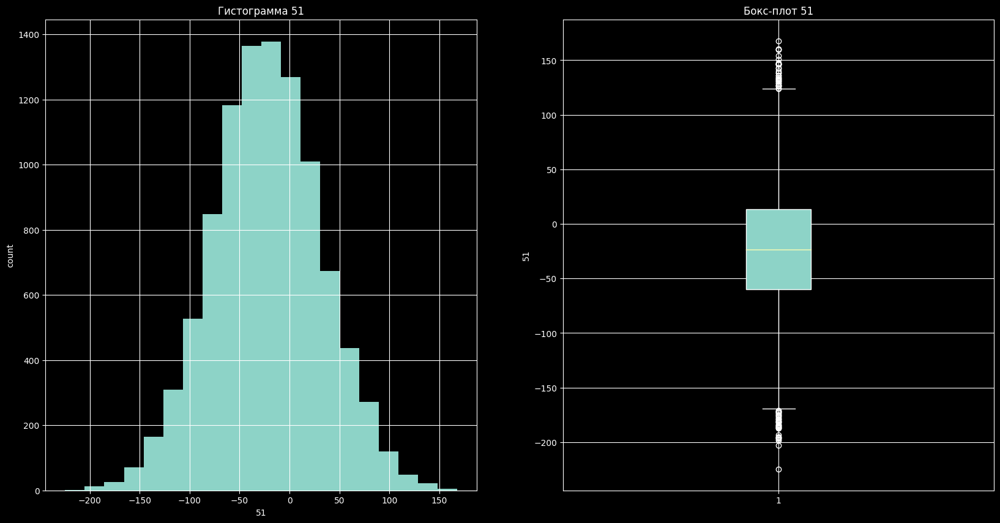

52
count    9735.000000
mean       67.699688
std        12.876360
min        24.655590
25%        58.709982
50%        67.483086
75%        76.536285
max       116.998640
Name: 52, dtype: float64


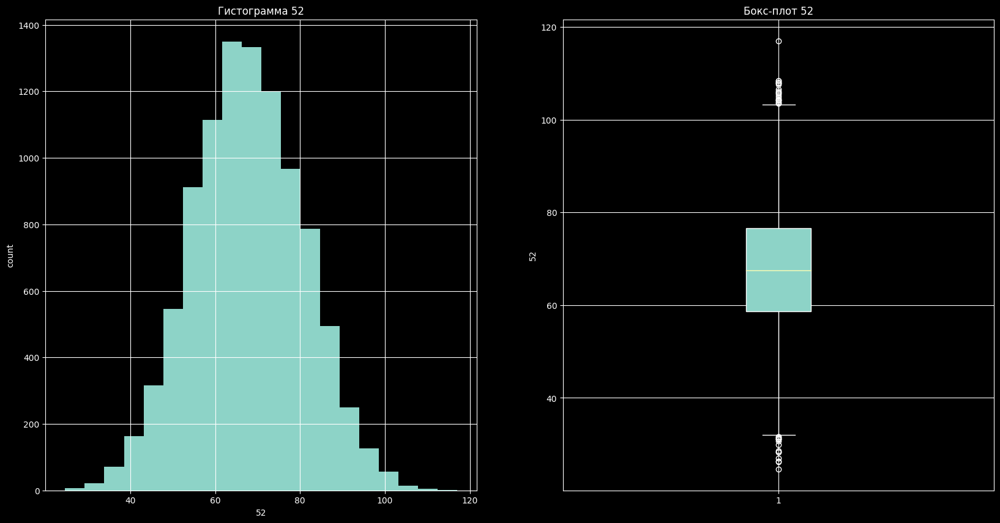

53
count    9735.000000
mean     -120.356634
std        56.033129
min      -338.532960
25%      -158.430505
50%      -120.687740
75%       -81.471712
max        91.180010
Name: 53, dtype: float64


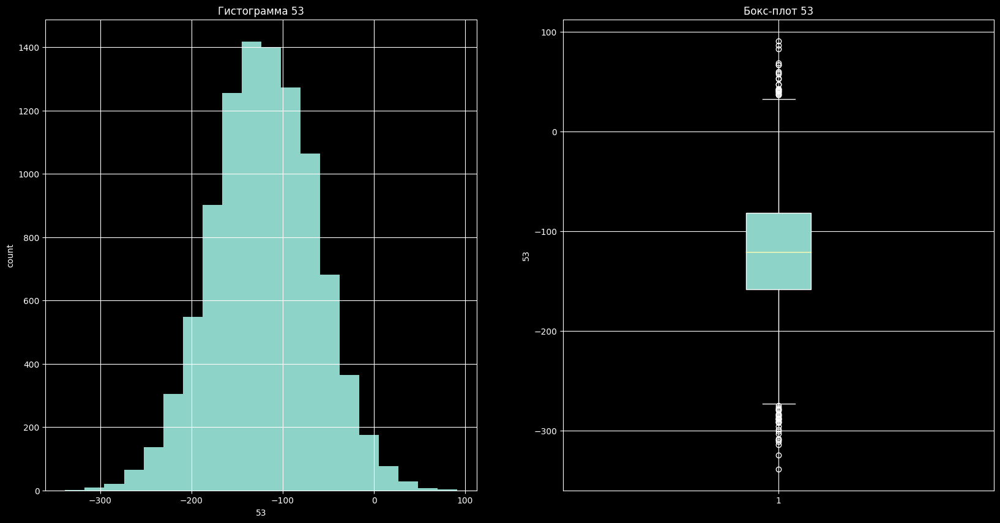

54
count    9735.000000
mean       88.217523
std         4.817962
min        69.422220
25%        84.953495
50%        88.198845
75%        91.390580
max       106.335710
Name: 54, dtype: float64


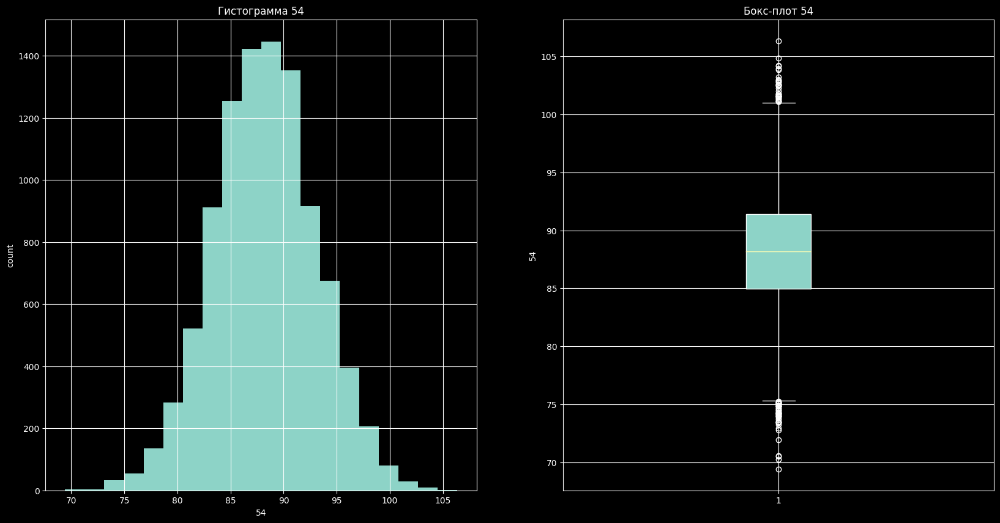

55
count    9735.000000
mean       69.518407
std        12.392383
min        19.095284
25%        61.149695
50%        69.600320
75%        78.143900
max       107.598770
Name: 55, dtype: float64


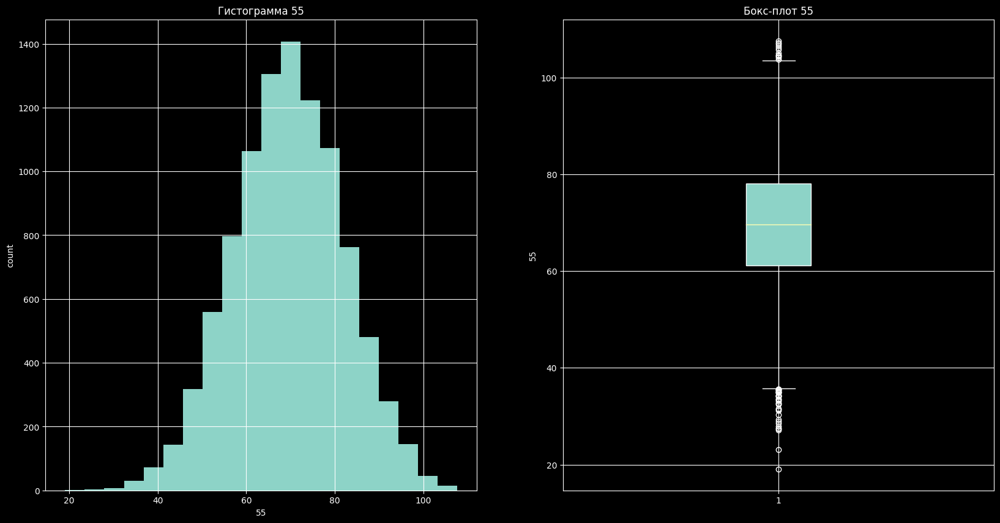

56
count    9735.000000
mean     -132.536486
std         7.997836
min      -160.989200
25%      -137.830045
50%      -132.461490
75%      -127.034034
max      -100.981290
Name: 56, dtype: float64


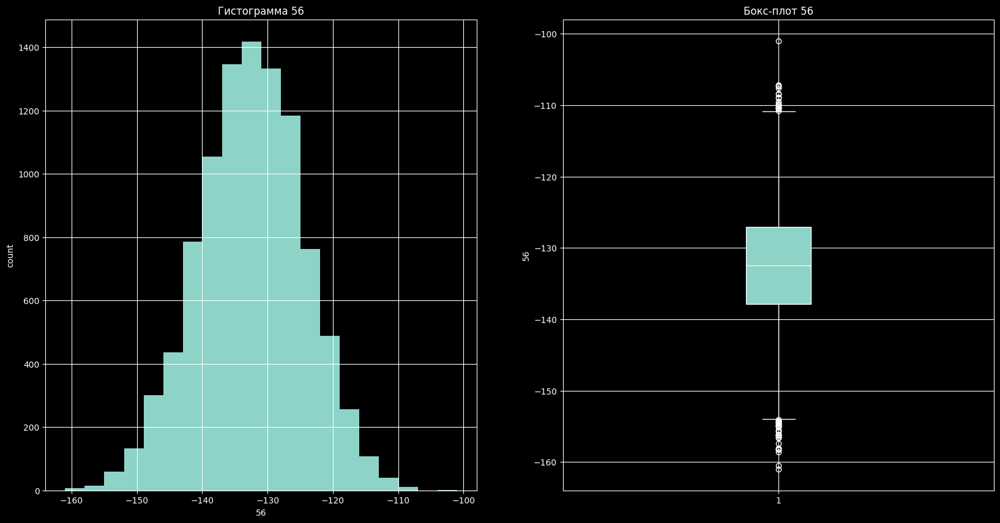

57
count    9735.000000
mean       13.674578
std        49.081752
min      -172.997600
25%       -20.784675
50%        12.599892
75%        46.505185
max       178.872990
Name: 57, dtype: float64


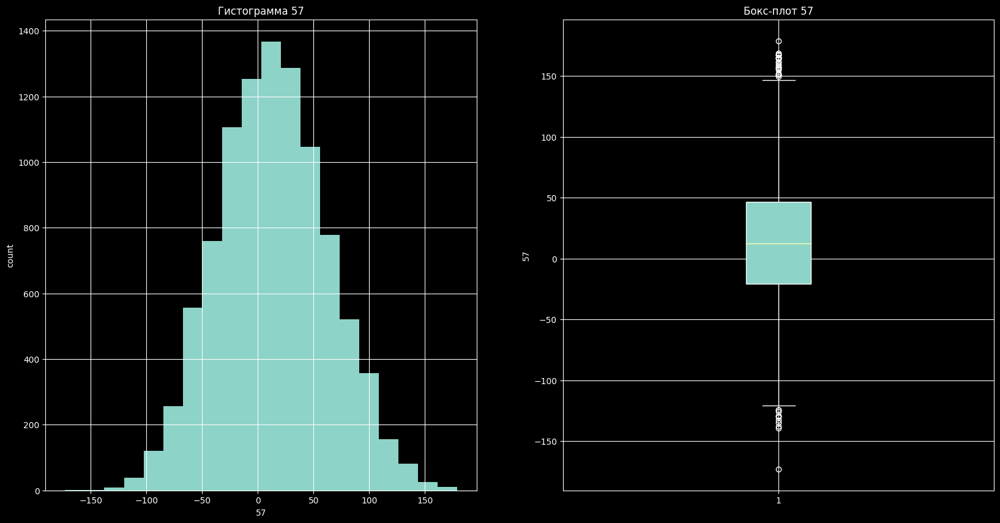

58
count    9735.000000
mean     -120.684709
std        56.065719
min      -308.604550
25%      -160.040550
50%      -120.809890
75%       -81.255455
max        86.655090
Name: 58, dtype: float64


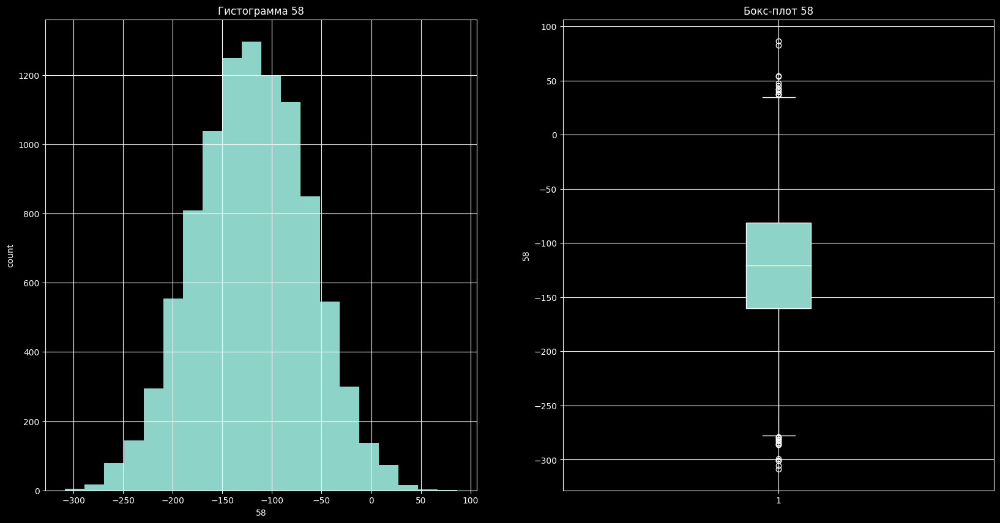

59
count    9735.000000
mean     -316.787102
std       209.768574
min      -680.889648
25%      -498.096121
50%      -314.660909
75%      -134.271541
max        48.719260
Name: 59, dtype: float64


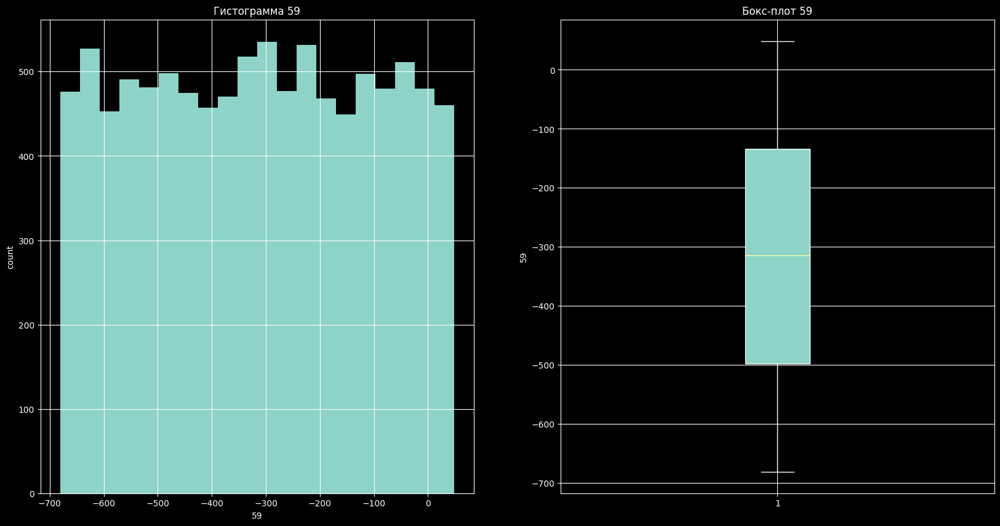

60
count    9735.000000
mean      -67.411349
std        64.867380
min      -312.653630
25%      -111.535960
50%       -66.989700
75%       -22.706175
max       189.175500
Name: 60, dtype: float64


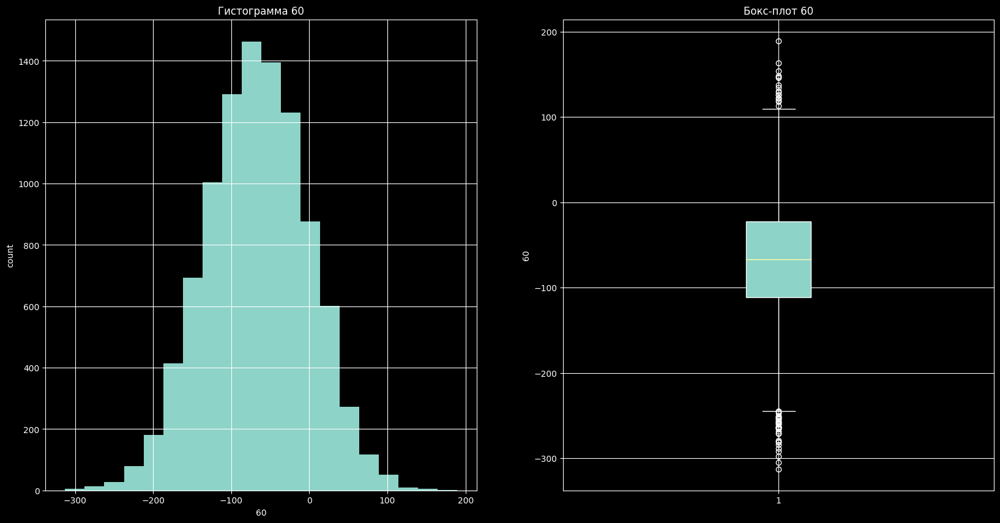

61
count    9735.000000
mean     -130.685601
std         9.292260
min      -160.060150
25%      -137.157380
50%      -130.933100
75%      -124.525749
max       -97.490330
Name: 61, dtype: float64


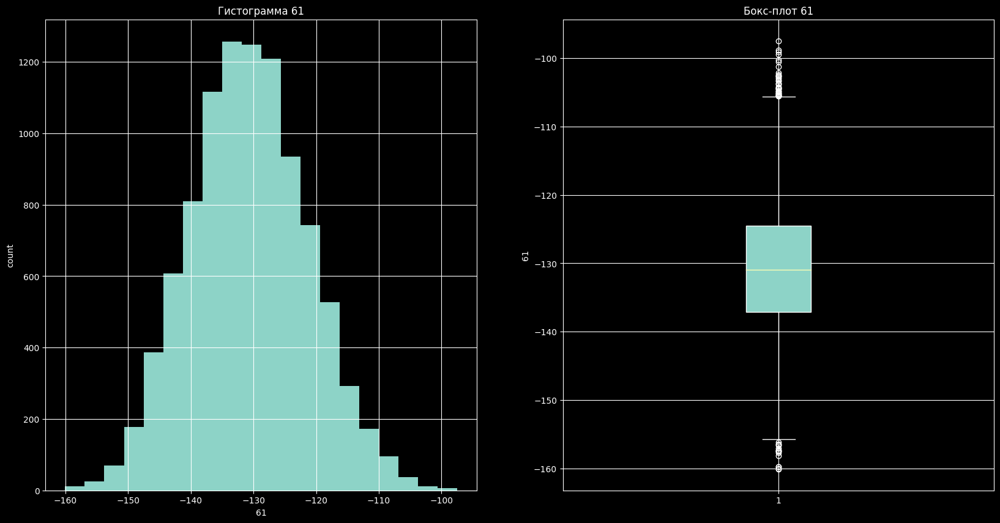

62
count    9735.000000
mean      -81.258716
std        30.620804
min      -189.231300
25%      -101.934802
50%       -80.706894
75%       -60.179666
max        31.880241
Name: 62, dtype: float64


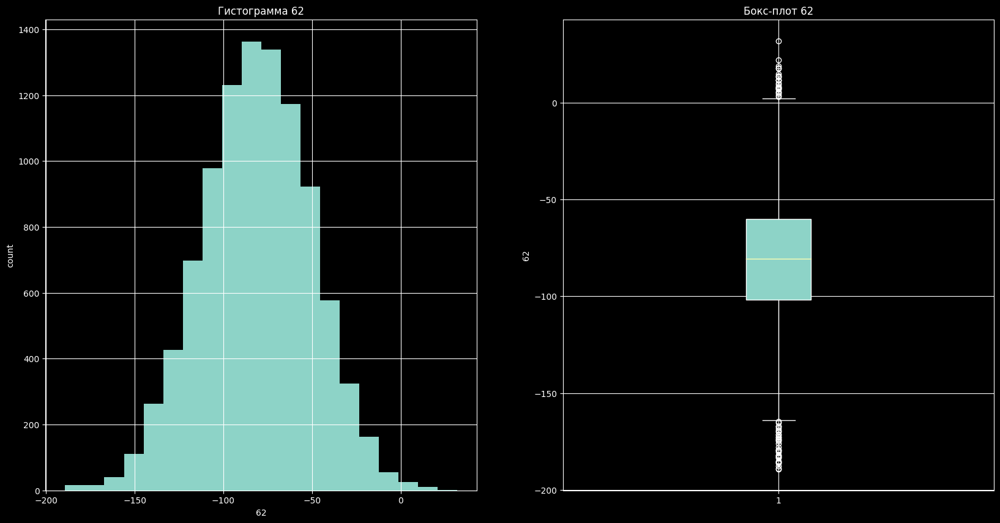

63
count    9735.000000
mean       37.014992
std        25.287042
min       -47.206474
25%        19.959320
50%        36.461020
75%        53.900384
max       141.025270
Name: 63, dtype: float64


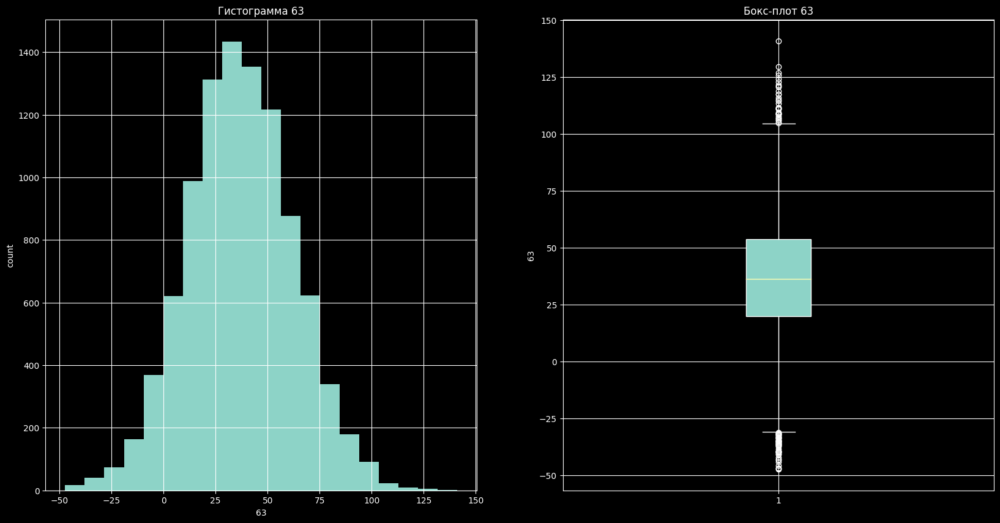

64
count    9735.000000
mean     -152.192985
std        40.980712
min      -308.200380
25%      -179.098175
50%      -151.263150
75%      -124.443215
max       -17.406784
Name: 64, dtype: float64


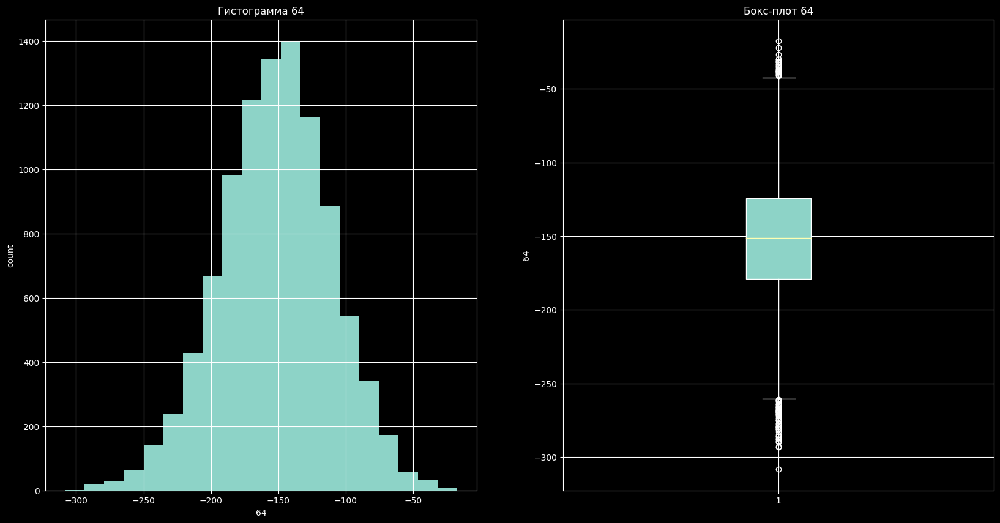

65
count    9735.000000
mean       14.918633
std        99.365881
min      -157.580677
25%       -71.389846
50%        16.543816
75%       100.210574
max       184.987267
Name: 65, dtype: float64


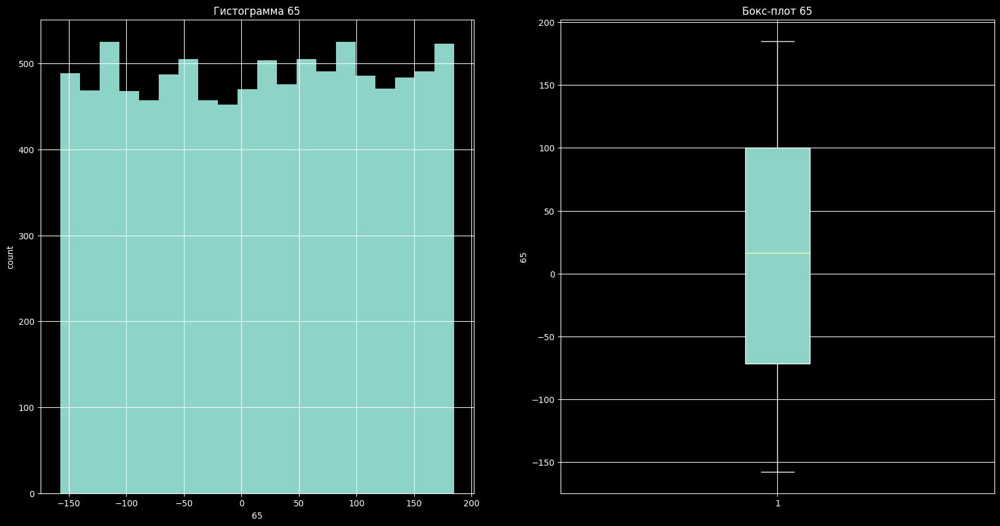

66
count    9735.000000
mean       67.796365
std         1.848587
min        61.086390
25%        66.552165
50%        67.811600
75%        69.043973
max        73.886790
Name: 66, dtype: float64


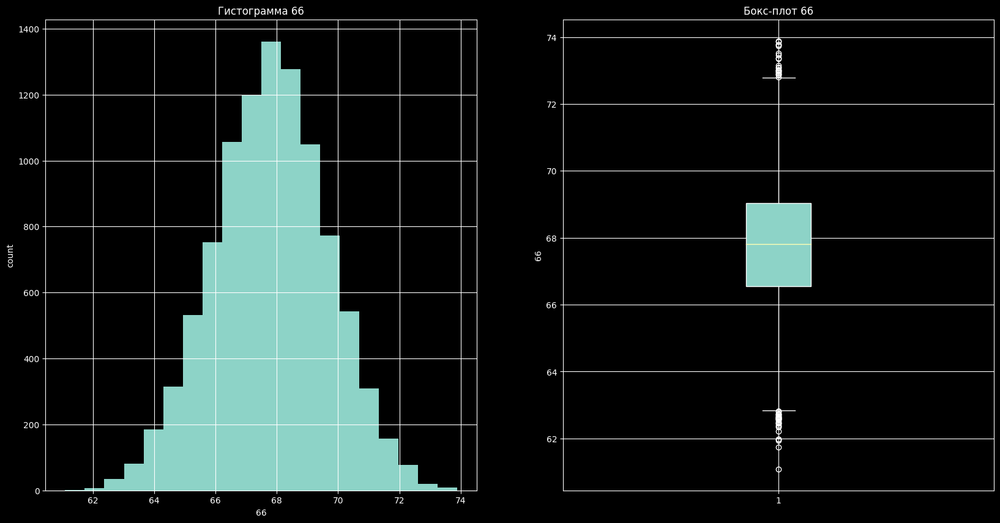

67
count    9735.000000
mean       22.873085
std        55.571844
min      -174.799100
25%       -13.990073
50%        22.770462
75%        59.996725
max       241.695620
Name: 67, dtype: float64


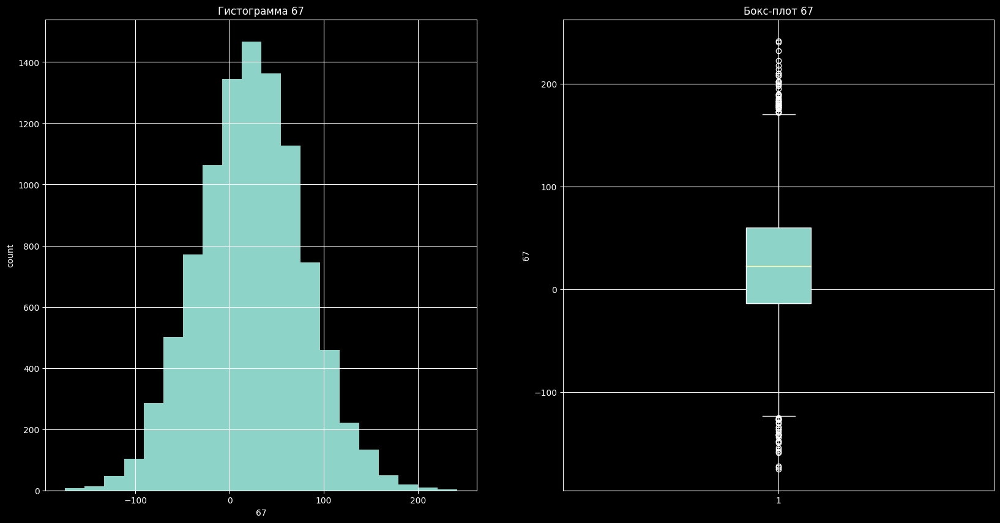

68
count    9735.000000
mean       72.675312
std        62.522454
min      -159.840730
25%        31.363344
50%        71.827790
75%       114.258710
max       289.583160
Name: 68, dtype: float64


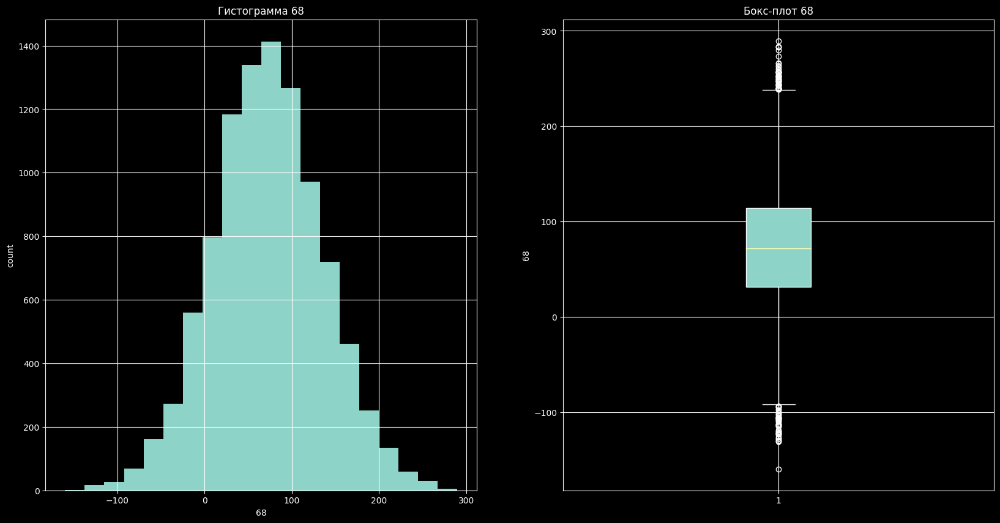

69
count    9735.000000
mean      115.452156
std        21.514909
min        27.746750
25%       100.424093
50%       115.466780
75%       130.032330
max       190.171420
Name: 69, dtype: float64


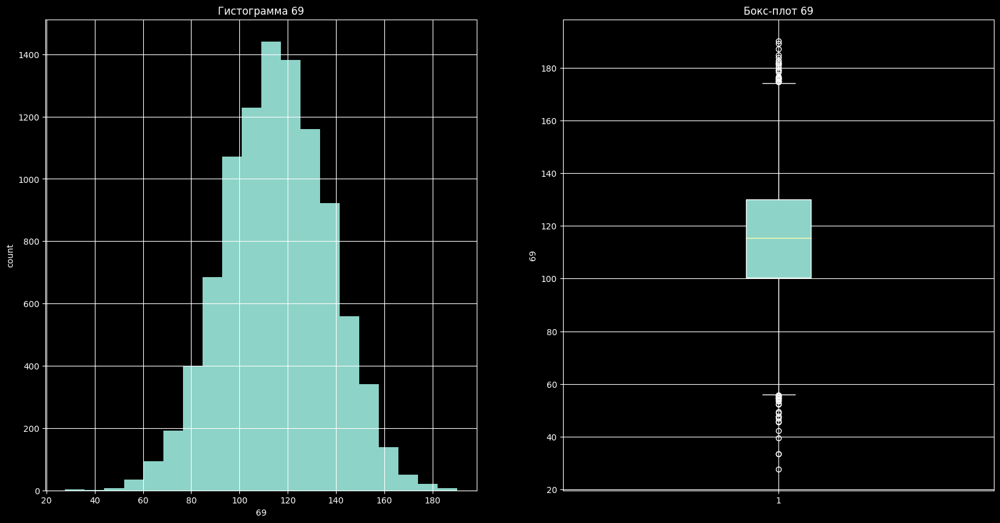

70
count    9735.000000
mean     -708.802131
std       405.763677
min     -1297.689518
25%     -1074.464888
50%      -806.701972
75%      -358.659556
max        98.747128
Name: 70, dtype: float64


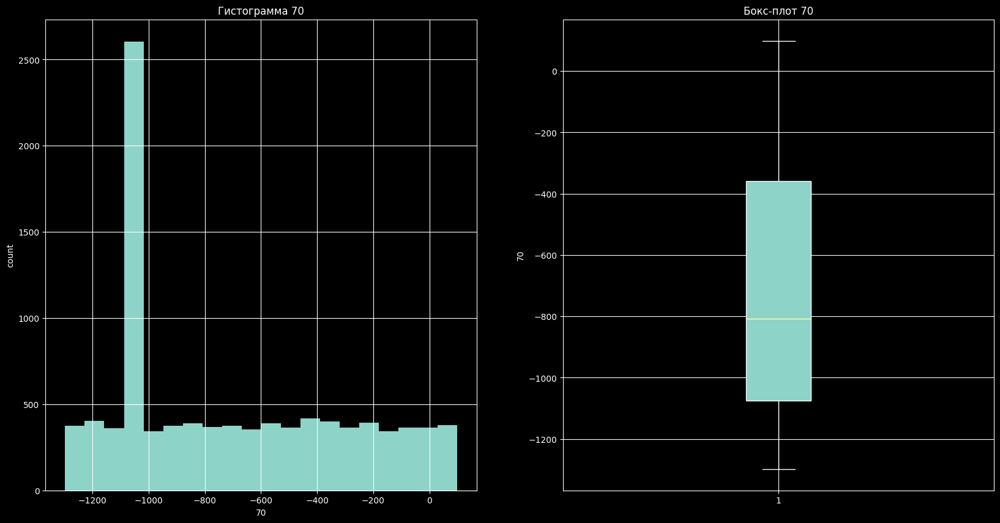

71
count    9735.000000
mean      -48.792952
std        41.185055
min      -209.935760
25%       -76.726445
50%       -49.070145
75%       -20.737321
max       102.473755
Name: 71, dtype: float64


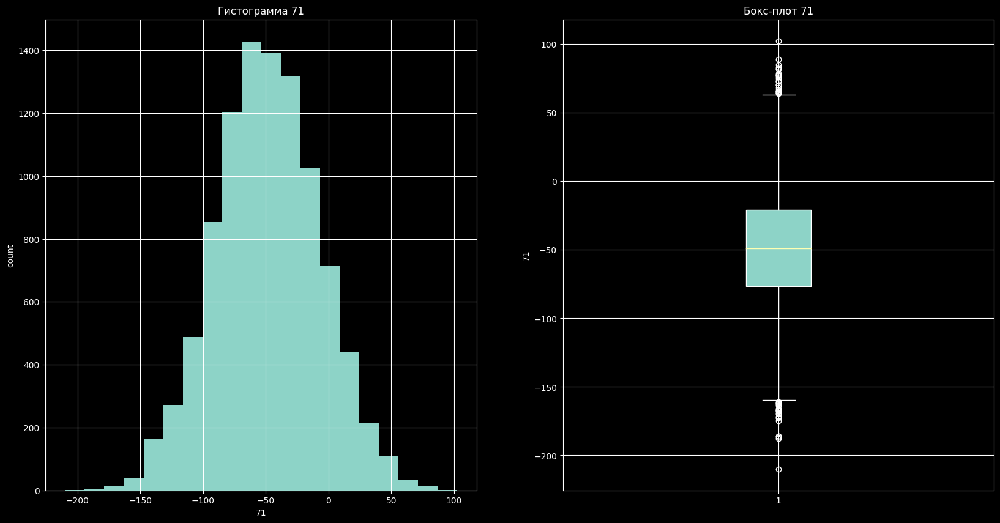

In [ ]:
for colum in [str(_) for _ in range(72)]:
    print(colum)
    print(valid[colum].describe())
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].hist(valid[colum], bins=20)
    ax[0].set_title('Гистограмма ' + colum)
    ax[0].set_xlabel(colum)
    ax[0].set_ylabel('count')
    ax[0].grid(True)

    ax[1].boxplot(valid[colum], patch_artist=True)
    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum)
    ax[1].grid(True)
    plt.show()

Касательно распределений признаков: base, train и valid; Они идентичны

Большинство признаков имеют патерн: 'похоже на нормальное распределение, присутствуют слегка выбивающиеся значения по обе стороны распределения'.

Аномалными выглядят признаки: 6, 21, 25, 33, 44, 59, 65, 70.

## Корреляционный анализ

Построим "хитмап" по матрице корреляций Пирсона, посмотрим на связь признаков и для отслеживания мультиколлинеарности

### Base

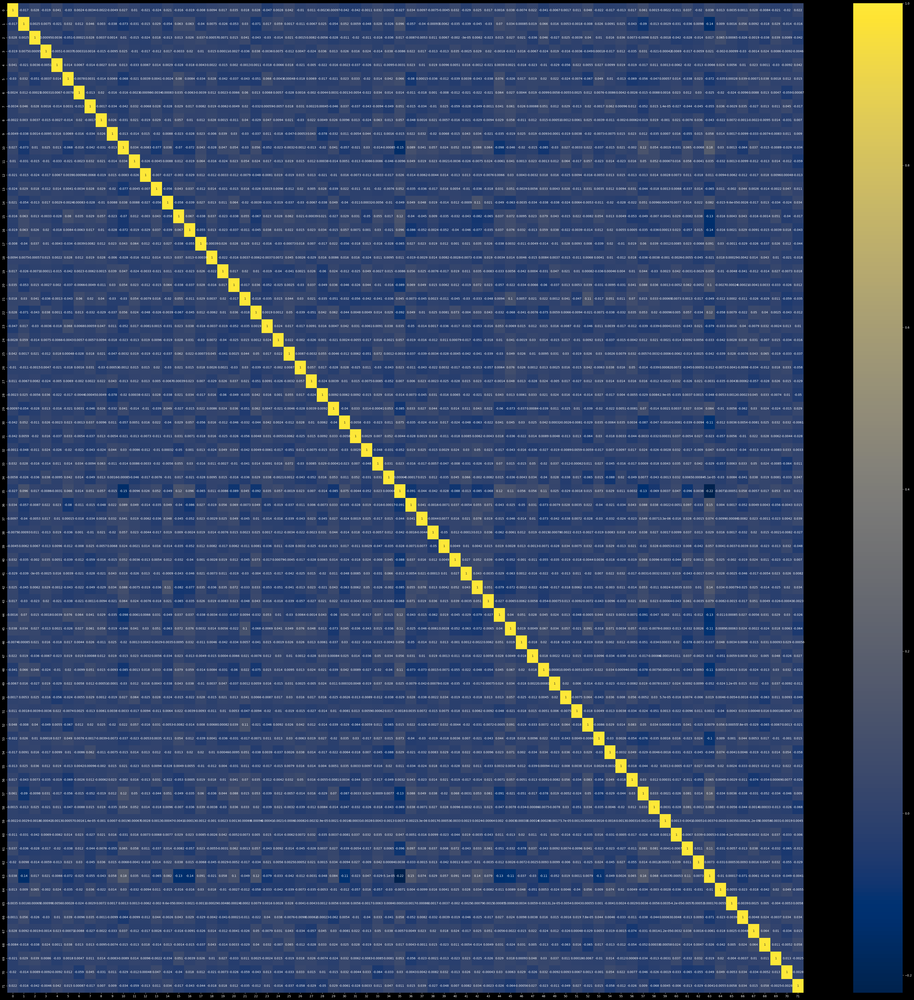

In [ ]:
fig, ax = plt.subplots(figsize=(60, 60))
sns.heatmap(df.drop('Id', axis=1).corr(), annot=True, cmap='cividis').legend = False

### Train

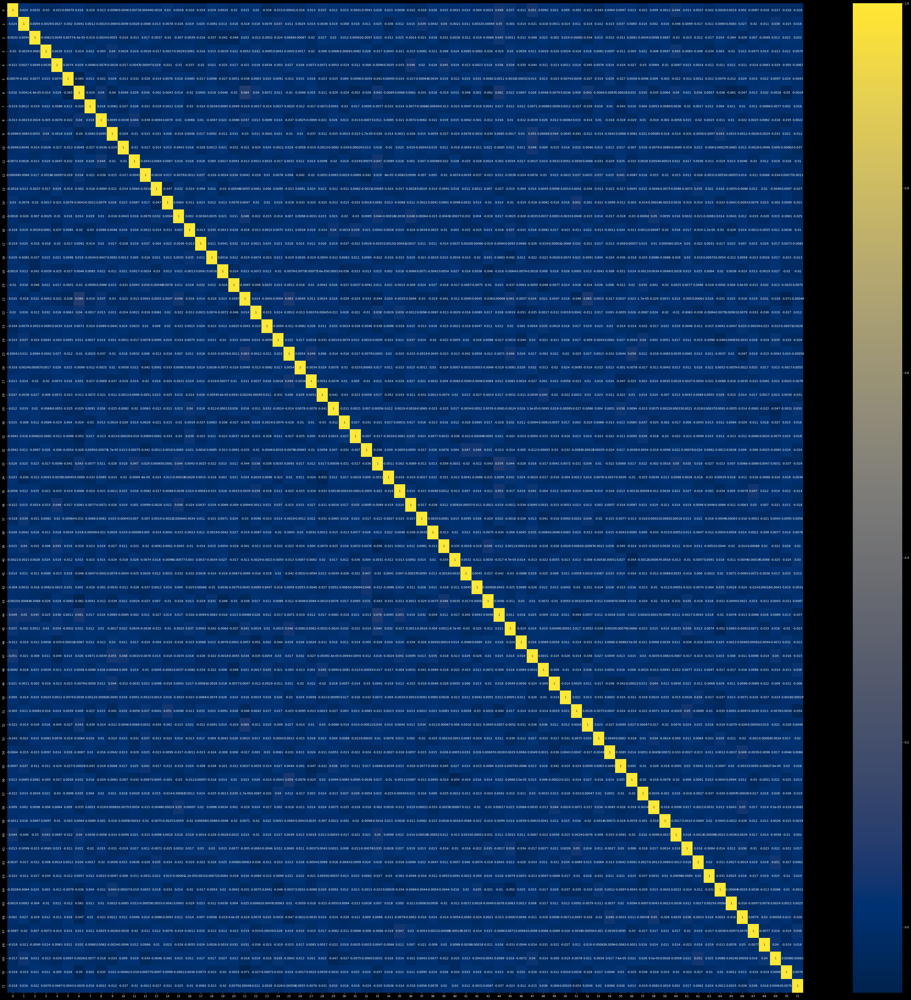

In [ ]:
fig, ax = plt.subplots(figsize=(60, 60))
sns.heatmap(train.drop(['Id', 'Target'], axis=1).corr(), annot=True, cmap='cividis').legend = False

### Validation

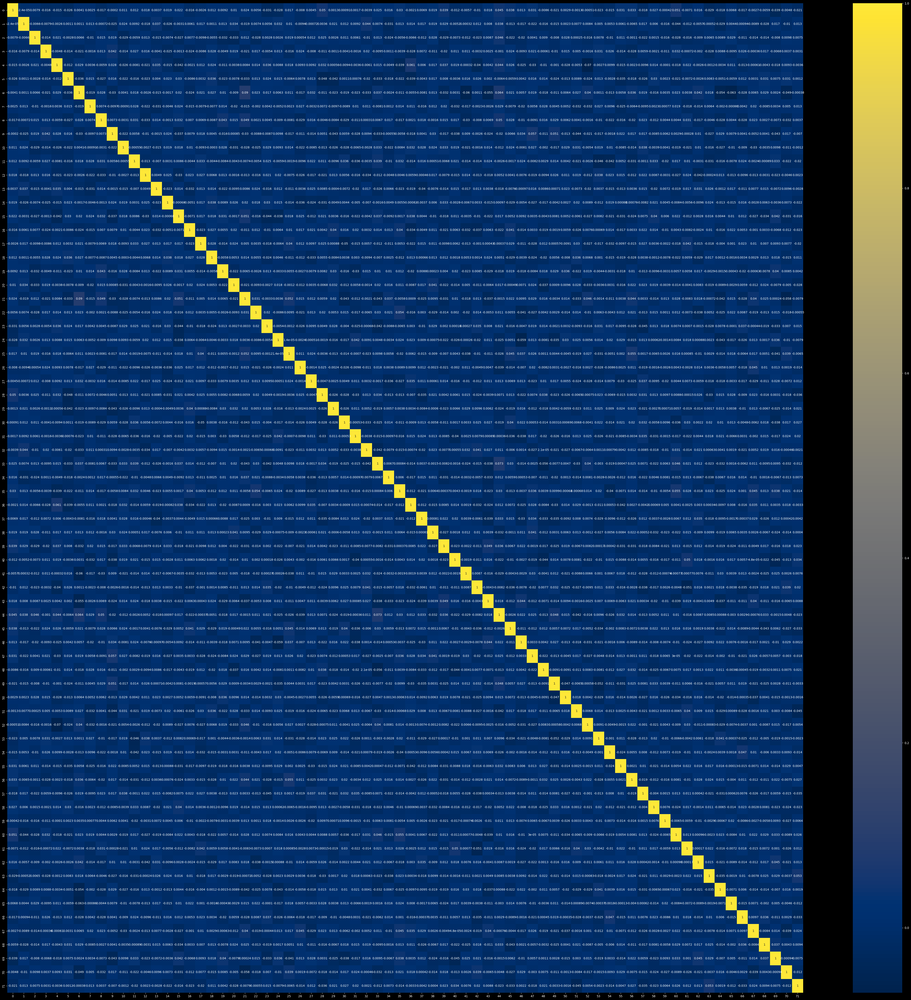

In [ ]:
fig, ax = plt.subplots(figsize=(60, 60))
sns.heatmap(valid.drop('Id', axis=1).corr(), annot=True, cmap='cividis').legend = False

Мультиколлинеарности в данных не прослеживается

##Обучение на части данных

In [ ]:
 df = df.set_index('Id')
 train = train.set_index('Id')
 valid = valid.set_index('Id')
 true = true.set_index('Id')

In [ ]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,62,63,64,65,66,67,68,69,70,71
Id,,,,,,,,,,,,,,,,,,,,,
4207931-base,-43.946243,15.364378,17.515854,-132.31146,157.064420,-4.069252,-340.630860,-57.550140,128.398220,45.090958,...,-71.927170,30.711966,-90.190475,-24.931271,66.972534,106.346634,-44.270622,155.98834,-1074.464888,-25.066608
2710972-base,-73.004890,4.923342,-19.750746,-136.52908,99.907170,-70.709110,-567.401996,-128.890150,109.914986,201.472200,...,-109.044660,20.916021,-171.201390,-110.596844,67.730100,8.909615,-9.470253,133.29536,-545.897014,-72.913230
1371460-base,-85.565570,-0.493598,-48.374817,-157.98502,96.809510,-81.710210,-22.297688,79.768670,124.357086,105.715180,...,-58.821650,41.369606,-132.934500,-43.016839,67.871925,141.778240,69.048520,111.72038,-1111.038833,-23.087206
3438601-base,-105.564090,15.393871,-46.223934,-158.11488,79.514114,-48.944480,-93.713010,38.581398,123.397960,110.324326,...,-87.907290,-58.806870,-147.794800,-155.830237,68.974754,21.397510,126.098785,139.73320,-1282.707248,-74.527940
422798-base,-74.638880,11.315012,-40.204174,-161.76430,50.507114,-80.775560,-640.923467,65.225000,122.344940,191.465850,...,-30.002094,53.642930,-149.823230,176.921371,69.473280,-43.395180,-58.947716,133.84064,-1074.464888,-1.164146


In [ ]:
train.head()

,0,1,2,3,4,5,6,7,8,9,...,63,64,65,66,67,68,69,70,71,Target
Id,,,,,,,,,,,,,,,,,,,,,
109249-query,-24.021454,3.122524,-80.947525,-112.329994,191.090180,-66.903130,-759.626065,-75.284454,120.55149,131.131700,...,-24.601670,-167.760770,133.678516,68.184600,26.317545,11.938202,148.549320,-778.563381,-46.877750,66971-base
34137-query,-82.033580,8.115866,-8.793022,-182.972100,56.645336,-52.597610,-55.720337,130.059250,129.38335,76.202880,...,54.448433,-120.894806,-12.292085,66.608116,-27.997612,10.091335,95.809265,-1022.691531,-88.564705,1433819-base
136121-query,-75.719640,-0.223386,-86.186130,-162.064060,114.320114,-53.394600,-117.261013,-24.857851,124.80780,112.190155,...,-5.609123,-93.029880,-80.997871,63.733383,11.378683,62.932007,130.975390,-1074.464888,-74.861176,290133-base
105191-query,-56.580620,5.093593,-46.943110,-149.039120,112.436430,-76.820510,-324.995645,-32.833107,119.47865,120.074790,...,21.624313,-158.880370,179.597294,69.891360,-33.804955,233.914610,122.868546,-1074.464888,-93.775375,1270048-base
63983-query,-52.725650,9.027046,-92.829650,-113.111010,134.124970,-42.423073,-759.626065,8.261169,119.49023,172.365360,...,13.807772,-208.650040,41.742014,66.522420,41.362930,162.723050,111.261310,-151.162805,-33.831450,168591-base


In [ ]:
valid.head()

,0,1,2,3,4,5,6,7,8,9,...,62,63,64,65,66,67,68,69,70,71
Id,,,,,,,,,,,,,,,,,,,,,
196680-query,-59.383420,8.563436,-28.203072,-134.22534,82.73661,-150.572170,-129.178969,23.670555,125.66636,108.809586,...,-103.481630,79.564530,-120.31357,54.218155,68.50073,32.681908,84.19686,136.412960,-1074.464888,-21.233612
134615-query,-103.912150,9.742726,-15.209915,-116.37310,137.69880,-85.530075,-776.123158,44.481530,114.67121,95.231290,...,-51.193770,49.299644,-101.89454,105.560548,67.80104,13.633057,108.05138,111.864456,-841.022331,-76.567980
82675-query,-117.923280,-3.504554,-64.299390,-155.18713,156.82137,-34.082264,-537.423653,54.078613,121.97396,59.321335,...,-115.176155,48.636130,-132.17967,-0.988696,68.11125,107.065216,134.61765,134.080000,27.773269,-32.401714
162076-query,-90.880554,4.888542,-39.647797,-131.75010,62.36212,-105.593270,-347.132493,-83.351750,133.91331,201.146090,...,-112.293790,54.884007,-177.56935,-116.374997,67.88766,136.893980,124.89447,117.707750,-566.343980,-90.905556
23069-query,-66.946740,10.562773,-73.781830,-149.39787,2.93866,-51.288853,-587.189361,-2.764402,126.56105,131.900620,...,-116.440605,47.279976,-162.65400,107.409409,67.78526,-60.976490,142.68571,82.264300,-345.340457,-48.572525


Создаем индекс IndexFlatL2, создаем индекс IndexIVFFlat основанный на IndexFlatL2 в котором мы делим гиперпространство признаков на 20 кластеров (для ускорения обучения алгоритма), обучаем индексы на df, добавляем данные df в индекc

In [ ]:
index_l2 = faiss.IndexFlatL2(df.shape[1])
index = faiss.IndexIVFFlat(index_l2, df.shape[1], 20)
index.train(np.ascontiguousarray(df.values).astype('float32'))
index.add(np.ascontiguousarray(df.values).astype('float32'))

Создаем словарь base_index, который сопоставляет каждый индекс строки в df с его порядковым номером, для удобства обращения

In [ ]:
base_index = {k: v for k, v in enumerate(df.index.to_list())}

In [ ]:
targets = train["Target"]
train.drop("Target", axis=1, inplace=True)

Сохраняем в переменную cand_num, количество необходимое нам бл. соседей

In [ ]:
cand_num = 5

In [ ]:
D, I = index.search(np.ascontiguousarray(train.values.astype('float32')), k=cand_num)

Дистанция l2 до 5 бл. соседей:

In [ ]:
D

array([[100524.04 , 158884.92 , 169416.55 , 177662.8  , 179282.94 ],
       [114282.77 , 114937.195, 116201.516, 116586.016, 119378.49 ],
       [ 89214.08 , 103026.03 , 103220.91 , 106138.695, 107884.67 ],
       ...,
       [120548.18 , 131520.08 , 139462.36 , 142505.3  , 143393.75 ],
       [135276.17 , 136459.62 , 137637.53 , 153965.03 , 156857.64 ],
       [ 49851.688,  64205.465,  67379.08 ,  78075.41 ,  78514.15 ]],
      dtype=float32)

id этих 5 соседей:

In [ ]:
I

array([[173444, 159102, 236962,   8871, 182185],
       [162389, 124680, 210033, 212281, 104071],
       [220977, 182664, 176521, 156506,  13852],
       ...,
       [277749, 232482,  54042, 202763, 168740],
       [224345,   8877, 111461, 211485, 161105],
       [ 62325,  66541, 102291, 211741,  56458]])

Нахождение ACC для 5 бл. соседей:

In [ ]:
acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 12.4%


### Отсеивание 'аномальных признаков'

Уберем входные признаки которые мы посчитали аномальными на стадии EDA

In [ ]:
df_ = df.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)
train_ = train.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

In [ ]:
index_l2 = faiss.IndexFlatL2(df_.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_.shape[1], 20)
index.train(np.ascontiguousarray(df_.values).astype('float32'))
index.add(np.ascontiguousarray(df_.values).astype('float32'))

In [ ]:
base_index = {k: v for k, v in enumerate(df_.index.to_list())}

In [ ]:
D, I = index.search(np.ascontiguousarray(train_.values.astype('float32')), k=cand_num)

In [ ]:
acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 65.4%


Наблюдаем значительный прирост метрики после удаления аномальных признаков

### Применение функции slice_quantile

Попробуем не удалять аномальные признаки а обработать их:

Создадим функцию для обработки аномальных значений slice_quantile, которая приводит аномальные значения к "усам боксплота"

In [ ]:
def slice_quantile(column):
    IQR = Q3 - Q1
    max_q = Q3+1.5*IQR
    min_q = Q1-1.5*IQR
    try:
        if column < min_q:
            return min_q
        elif column > max_q:
            return max_q
        else:
            return column
    except:
        return column

In [ ]:
df_sq = df.copy()
train_sq = train.copy()
for colum in ['6', '21', '25', '33', '44', '59', '65', '70']:
  Q1 = df_sq[colum].quantile(0.25)
  Q3 = df_sq[colum].quantile(0.75)
  df_sq[colum] = df_sq[colum].apply(slice_quantile)
  Q1 = train_sq[colum].quantile(0.25)
  Q3 = train_sq[colum].quantile(0.75)
  train_sq[colum] = train_sq[colum].apply(slice_quantile)

Результаты работы функции slice_quantile:

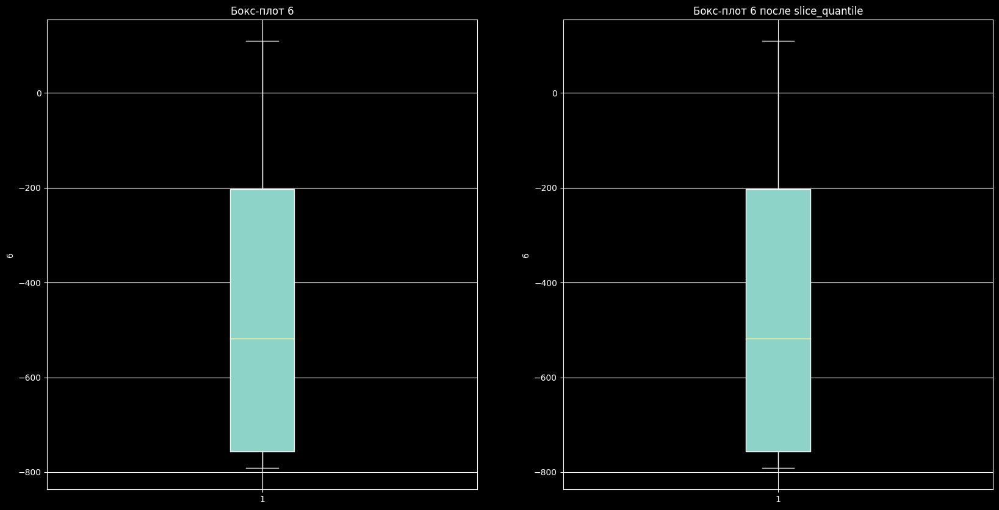

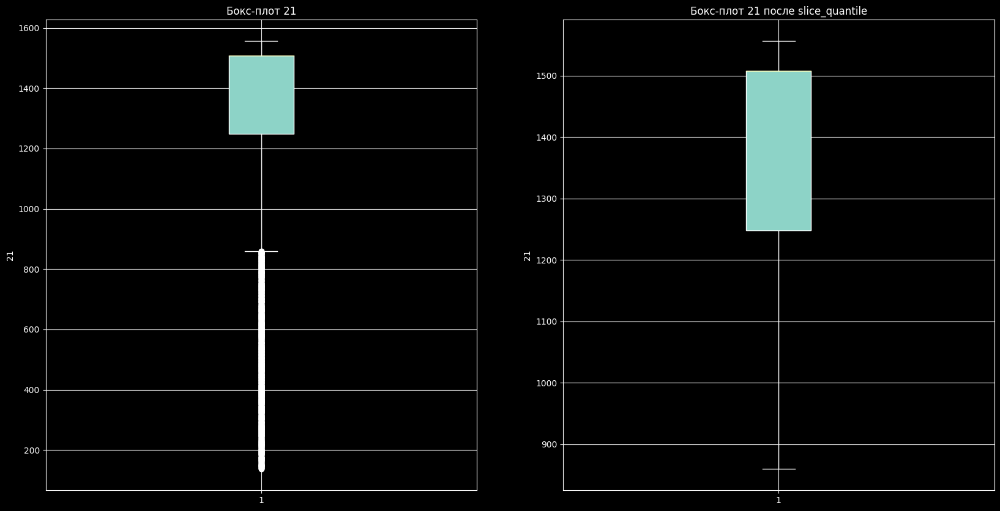

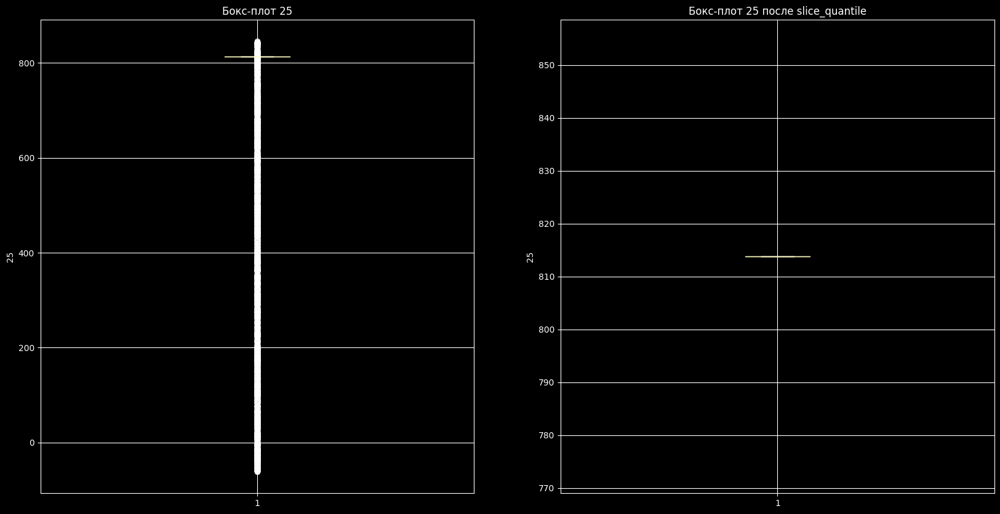

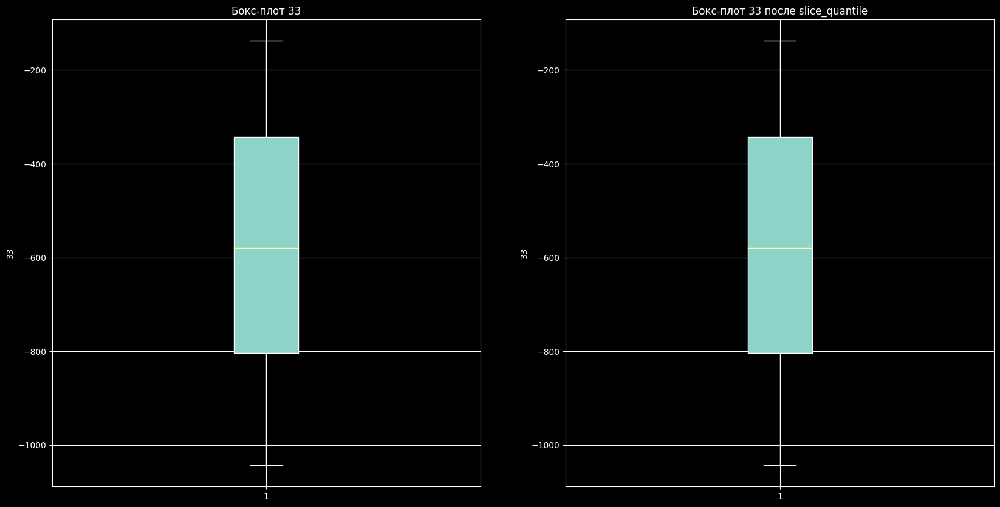

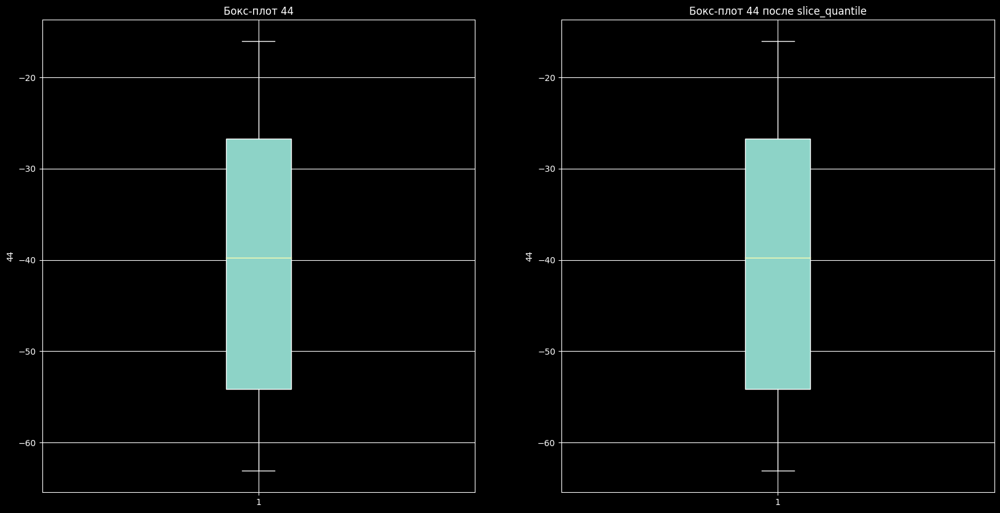

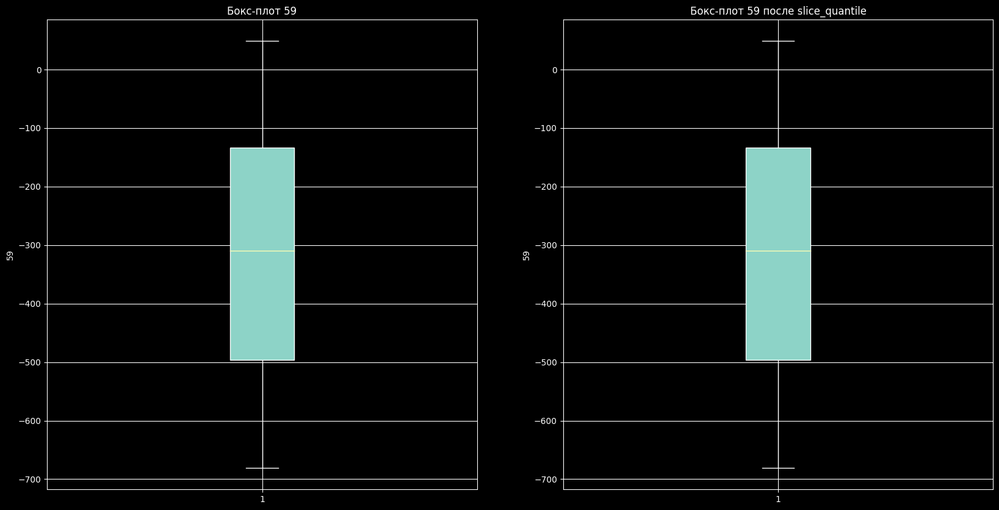

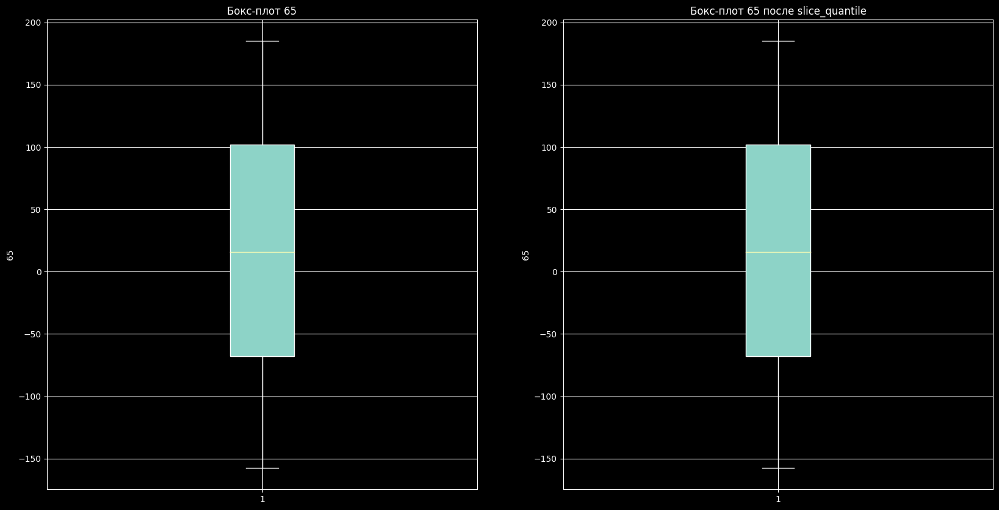

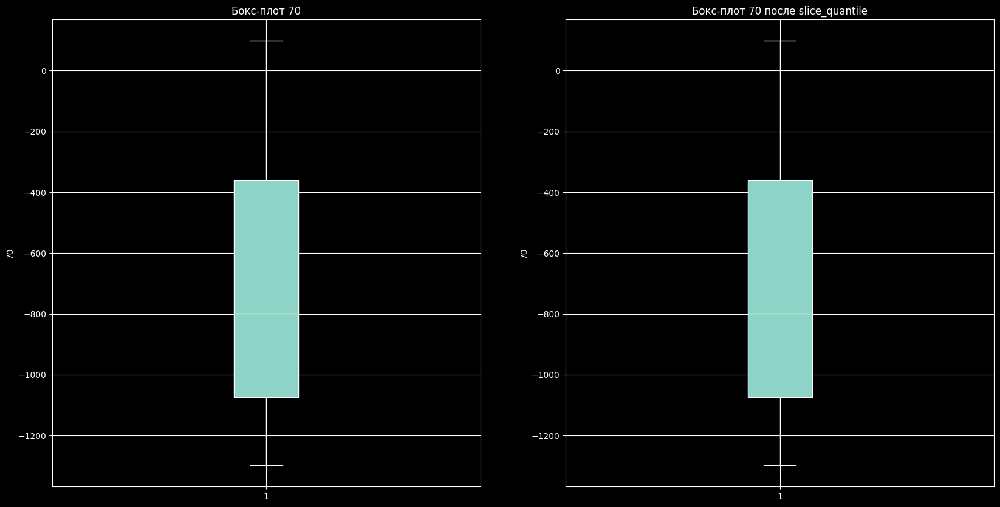

In [ ]:
for colum in ['6', '21', '25', '33', '44', '59', '65', '70']:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].boxplot(train[colum], patch_artist=True)
    ax[0].set_ylabel(colum)
    ax[0].set_title('Бокс-плот ' + colum)
    ax[0].grid(True)

    ax[1].boxplot(train_sq[colum], patch_artist=True)
    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum + ' после slice_quantile')
    ax[1].grid(True)
    plt.show()
    print()

In [ ]:
index_l2 = faiss.IndexFlatL2(df_sq.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_sq.shape[1], 20)
index.train(np.ascontiguousarray(df_sq.values).astype('float32'))
index.add(np.ascontiguousarray(df_sq.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_sq.astype('float32')), k=cand_num)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 10.7%


Можем наблюдать падение значения целевой метрики, на самом деле по бокс-плотам работы функции видим что она применилась только к признакам '21', '25'

### Масштабирование признаков

Применим масштабирование на входные признаки после удаления аномалий

StandardScaler:

In [ ]:
StandScale = StandardScaler()
df_ = StandScale.fit_transform(df_)
train_ = StandScale.transform(train_)

In [ ]:
index_l2 = faiss.IndexFlatL2(df_.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_.shape[1], 20)
index.train(np.ascontiguousarray(df_).astype('float32'))
index.add(np.ascontiguousarray(df_).astype('float32'))

In [ ]:
D, I = index.search(np.ascontiguousarray(train_.astype('float32')), k=cand_num)

In [ ]:
acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 68.2%


Есть улучшение метрики

MinMaxScaler:

In [ ]:
df_ = df.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)
train_ = train.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

MinScale = MinMaxScaler()
df_ = MinScale.fit_transform(df_)
train_ = MinScale.transform(train_)

In [ ]:
index_l2 = faiss.IndexFlatL2(df_.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_.shape[1], 20)
index.train(np.ascontiguousarray(df_).astype('float32'))
index.add(np.ascontiguousarray(df_).astype('float32'))

In [ ]:
D, I = index.search(np.ascontiguousarray(train_.astype('float32')), k=cand_num)

In [ ]:
acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 68.3%


MinMaxScaler дает чуть большый прирост в точности, будем использовать его

### Тест

Взглянем на целевую метрику при 20 бл. соседях:

In [ ]:
df_ = df.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)
train_ = train.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

MinScale = MinMaxScaler()
df_ = MinScale.fit_transform(df_)
train_ = MinScale.transform(train_)

index_l2 = faiss.IndexFlatL2(df_.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_.shape[1], 20)
index.train(np.ascontiguousarray(df_).astype('float32'))
index.add(np.ascontiguousarray(df_).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_.astype('float32')), k=20)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {20} = {acc / len(I):.1%}')

Accuracy @ 20 = 70.6%


Наблюдаем значение метрики 70.6%. В теории если получится правильно из этих 20 вариантов наблюдений бл. соседей в предсказании безошибочно отбирать 5, то можно разогнать точность вплоть до 70.6%

Подбираем значение кол-ва центройдов при делении признакового пространства на кластера:

In [ ]:
for _ in (5, 20, 50, 100, 1000):

  index_l2 = faiss.IndexFlatL2(df_.shape[1])
  index = faiss.IndexIVFFlat(index_l2, df_.shape[1], _)
  index.train(np.ascontiguousarray(df_).astype('float32'))
  index.add(np.ascontiguousarray(df_).astype('float32'))

  D, I = index.search(np.ascontiguousarray(train_.astype('float32')), k=cand_num)

  acc = 0
  for target, id in zip(targets.values.tolist(), I.tolist()):
      acc += int(target in [base_index[r] for r in id])
  print(f'Accuracy @ {cand_num} при {_} кластерах = {acc / len(I):.1%}')

Accuracy @ 5 при 5 кластерах = 69.2%
Accuracy @ 5 при 20 кластерах = 68.3%
Accuracy @ 5 при 50 кластерах = 67.6%
Accuracy @ 5 при 100 кластерах = 67.8%
Accuracy @ 5 при 1000 кластерах = 66.3%


Хоть мы и видим незначительно улучшение точности при 5 центроидах от 20, уменьшение кол-ва центройдов увеличевает время обучения алгоритма  

Поделим входные признаки на 3 части и на каждой обучим алгоритм, с целью выявления бесполезных признаков

In [ ]:
df_ = df.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

train_ = train.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

In [ ]:
df_1 = df_[['0', '1', '2', '3', '4', '5', '7', '8', '9', '10', '11', '12', '13',
       '14', '15', '16', '17', '18', '19', '20', '22']]

train_1 = train_[['0', '1', '2', '3', '4', '5', '7', '8', '9', '10', '11', '12', '13',
       '14', '15', '16', '17', '18', '19', '20', '22']]

In [ ]:
df_2 = df_[['23', '24', '26', '27', '28', '29', '30', '31', '32', '34', '35',
            '36', '37', '38', '39', '40', '41', '42', '43', '45', '46', '47']]

train_2 = train_[['23', '24', '26', '27', '28', '29', '30', '31', '32', '34', '35',
            '36', '37', '38', '39', '40', '41', '42', '43', '45', '46', '47']]

In [ ]:
df_3 = df_[['48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58',
            '60', '61', '62', '63', '64', '66', '67', '68', '69', '71']]

train_3 = train_[['48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58',
            '60', '61', '62', '63', '64', '66', '67', '68', '69', '71']]

In [ ]:
index_l2 = faiss.IndexFlatL2(df_1.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_1.shape[1], 20)
index.train(np.ascontiguousarray(df_1.values).astype('float32'))
index.add(np.ascontiguousarray(df_1.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_1.astype('float32')), k=cand_num)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} на первой трети вх. данных = {acc / len(I):.1%}')

Accuracy @ 5 на первой трети вх. данных = 59.3%


In [ ]:
index_l2 = faiss.IndexFlatL2(df_2.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_2.shape[1], 20)
index.train(np.ascontiguousarray(df_2.values).astype('float32'))
index.add(np.ascontiguousarray(df_2.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_2.astype('float32')), k=cand_num)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} на второй трети вх. данных = {acc / len(I):.1%}')

Accuracy @ 5 на второй трети вх. данных = 58.0%


In [ ]:
index_l2 = faiss.IndexFlatL2(df_3.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_3.shape[1], 20)
index.train(np.ascontiguousarray(df_3.values).astype('float32'))
index.add(np.ascontiguousarray(df_3.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_3.astype('float32')), k=cand_num)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} на последней трети вх. данных = {acc / len(I):.1%}')

Accuracy @ 5 на последней трети вх. данных = 59.7%


<div class="alert alert-block alert-success">

Как видно, результаты по accuracy получились близкими, поэтому имеет смысл подумать над другими методами отбора признаков.
</div>

При 20 бл.соседах

In [ ]:
index_l2 = faiss.IndexFlatL2(df_1.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_1.shape[1], 20)
index.train(np.ascontiguousarray(df_1.values).astype('float32'))
index.add(np.ascontiguousarray(df_1.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_1.astype('float32')), k=20)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {20} на первой трети вх. данных = {acc / len(I):.1%}')

Accuracy @ 20 на первой трети вх. данных = 61.5%


In [ ]:
index_l2 = faiss.IndexFlatL2(df_2.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_2.shape[1], 20)
index.train(np.ascontiguousarray(df_2.values).astype('float32'))
index.add(np.ascontiguousarray(df_2.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_2.astype('float32')), k=20)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {20} на второй трети вх. данных = {acc / len(I):.1%}')

Accuracy @ 20 на второй трети вх. данных = 60.1%


In [ ]:
index_l2 = faiss.IndexFlatL2(df_3.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_3.shape[1], 20)
index.train(np.ascontiguousarray(df_3.values).astype('float32'))
index.add(np.ascontiguousarray(df_3.values).astype('float32'))

D, I = index.search(np.ascontiguousarray(train_3.astype('float32')), k=20)

acc = 0
for target, id in zip(targets.values.tolist(), I.tolist()):
    acc += int(target in [base_index[r] for r in id])
print(f'Accuracy @ {20} на последней трети вх. данных = {acc / len(I):.1%}')

Accuracy @ 20 на последней трети вх. данных = 62.0%


Обучим алгоритм попарно на входных признаках и посмотрим на целевую метрику

In [ ]:
df_ = df.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)
train_ = train.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

In [ ]:
for i in range(0, len([_ for _ in df_.columns]), 2):

  df_i = df_[[_ for _ in df_.columns][i:(i+2)]]
  train_i = train_[[_ for _ in df_.columns][i:(i+2)]]

  MinScale = MinMaxScaler()
  df_i = MinScale.fit_transform(df_i)
  train_i = MinScale.transform(train_i)

  index_l2 = faiss.IndexFlatL2(df_i.shape[1])
  index = faiss.IndexIVFFlat(index_l2, df_i.shape[1], 20)
  index.train(np.ascontiguousarray(df_i).astype('float32'))
  index.add(np.ascontiguousarray(df_i).astype('float32'))

  D, I = index.search(np.ascontiguousarray(train_i.astype('float32')), k=cand_num)

  acc = 0
  for target, id in zip(targets.values.tolist(), I.tolist()):
      acc += int(target in [base_index[r] for r in id])
  print(f'Accuracy @ {cand_num} на вх. признаках {[_ for _ in df_.columns][i]} и {[_ for _ in df_.columns][i+1]} = {acc / len(I):.1%}')

Accuracy @ 5 на вх. признаках 0 и 1 = 29.9%
Accuracy @ 5 на вх. признаках 2 и 3 = 29.7%
Accuracy @ 5 на вх. признаках 4 и 5 = 29.8%
Accuracy @ 5 на вх. признаках 7 и 8 = 29.8%
Accuracy @ 5 на вх. признаках 9 и 10 = 29.8%
Accuracy @ 5 на вх. признаках 11 и 12 = 29.8%
Accuracy @ 5 на вх. признаках 13 и 14 = 29.8%
Accuracy @ 5 на вх. признаках 15 и 16 = 29.8%
Accuracy @ 5 на вх. признаках 17 и 18 = 29.9%
Accuracy @ 5 на вх. признаках 19 и 20 = 29.8%
Accuracy @ 5 на вх. признаках 22 и 23 = 29.8%
Accuracy @ 5 на вх. признаках 24 и 26 = 29.8%
Accuracy @ 5 на вх. признаках 27 и 28 = 29.9%
Accuracy @ 5 на вх. признаках 29 и 30 = 29.8%
Accuracy @ 5 на вх. признаках 31 и 32 = 29.8%
Accuracy @ 5 на вх. признаках 34 и 35 = 29.8%
Accuracy @ 5 на вх. признаках 36 и 37 = 29.9%
Accuracy @ 5 на вх. признаках 38 и 39 = 29.9%
Accuracy @ 5 на вх. признаках 40 и 41 = 29.8%
Accuracy @ 5 на вх. признаках 42 и 43 = 29.9%
Accuracy @ 5 на вх. признаках 45 и 46 = 29.8%
Accuracy @ 5 на вх. признаках 47 и 48 = 29.

Каких-то отличающихся закономерностей у оставшихся, после удаления аномалий, признаках не наблюдается, все они одинаково важны для алгоритма

### Получение результата на тестовых данных

In [ ]:
valid_ = valid.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

In [ ]:
MinScale = MinMaxScaler()
df_ = MinScale.fit_transform(df_)
valid_ = MinScale.transform(valid_)

In [ ]:
index_l2 = faiss.IndexFlatL2(df_.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_.shape[1], 20)
index.train(np.ascontiguousarray(df_).astype('float32'))
index.add(np.ascontiguousarray(df_).astype('float32'))

D, I = index.search(np.ascontiguousarray(valid_.astype('float32')), k=cand_num)

acc = 0
for target, id in zip(true.values.tolist(), I.tolist()):
    acc += int(target[0] in [base_index[r] for r in id])
print(f'Accuracy @ {cand_num} на тестовых данных = {acc / len(I):.1%}')

Accuracy @ 5 на тестовых данных = 67.2%


## Обучение на всех данных

In [ ]:
df_full = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_full/base.csv', index_col=0)
train_full = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_full/train.csv', index_col=0)
valid_full = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_full/validation.csv', index_col=0)
true_full = pd.read_csv('/content/drive/MyDrive/csv/Matching/data_full/validation_answer.csv', index_col=0)
targets_full = train_full["Target"]
train_full.drop("Target", axis=1, inplace=True)

In [ ]:
df_full.shape

(2918139, 72)

In [ ]:
train_full.shape

(100000, 72)

In [ ]:
valid_full.shape

(100000, 72)

In [ ]:
true_full.shape

(100000, 1)

In [ ]:
df_full_ = df_full.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)
train_full_ = train_full.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)
valid_full_ = valid_full.drop(['6', '21', '25', '33', '44', '59', '65', '70'], axis=1)

In [ ]:
MinScale = MinMaxScaler()
df_full_ = MinScale.fit_transform(df_full_)
train_full_ = MinScale.transform(train_full_)
valid_full_ = MinScale.transform(valid_full_)

In [ ]:
index_l2 = faiss.IndexFlatL2(df_full_.shape[1])
index = faiss.IndexIVFFlat(index_l2, df_full_.shape[1], 20)
index.train(np.ascontiguousarray(df_full_).astype('float32'))
index.add(np.ascontiguousarray(df_full_).astype('float32'))

### Результат на тренировочных данных

In [ ]:
base_index_full = {k: v for k, v in enumerate(df_full.index.to_list())}

In [ ]:
D, I = index.search(np.ascontiguousarray(train_full_.astype('float32')), k=cand_num)

In [ ]:
acc = 0
for target, id in zip(targets_full.values.tolist(), I.tolist()):
    acc += int(target in [base_index_full[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 63.0%


### Результат на тестовых данных

In [ ]:
D, I = index.search(np.ascontiguousarray(valid_full_.astype('float32')), k=cand_num)

In [ ]:
acc = 0
for target, id in zip(true_full.values.tolist(), I.tolist()):
    acc += int(target[0] in [base_index_full[r] for r in id])
print(f'Accuracy @ {cand_num} = {acc / len(I):.1%}')

Accuracy @ 5 = 62.8%


## Общий вывод

В проделанной работе есть промежуточные выводы, в общем выводе я бы хотел обобщить их и подвести итог по работе с данными

<h3>Загрузка данных</h3>

Данные представленны в 4 файла:

-В первом файле находятся данные с уникальным идентификатором базы каждого наблюдения, сохранено в df

-Второй файл несет в себе обучающую выборку с id как базы так и запроса, сохранено в train

-В третьем файле находятся входные признаки тестовой выборки, сохранено в valid

-В четвертом файле находится целевой признак (id-базы) тестовой выборки, сохранено в true

-df базы имеет 291813 строк, 72 (float) признака

<h4>Типы данных, дубликаты, пропуски</h4>

-Типы данных представленны корректно, пропусков в данных нет

-Удалено 11278 явных дубликатов в df

-Удалено 243 явных дубликатов в train

-Удалено 265 явных дубликатов в valid и true

<h3>Исследовательский анализ данных</h3>

-Распределения признаков: base, train и valid; идентичны

-Большинство признаков имеют патерн: 'похоже на нормальное распределение, присутствуют слегка выбивающиеся значения по обе стороны распределения'.

-Аномалными выглядят признаки: 6, 21, 25, 33, 44, 59, 65, 70

<h3>Корреляционный анализ</h3>

-Построен "хитмап" по матрице корреляций Пирсона, мультиколлинеарности в данных не прослеживается

<h3>Обучение на части данных</h3>

-Проведенно обучение алгоритма FAISS KNN, метрика расчета расстояния соседей была выбрана 'Евклидово расстояние' (.IndexFlatL2), для ускорения обучения алгоритма произведенно деление гиперпространство признаков на 20 кластеров (.IndexIVFFlat). ACC для 5 бл. соседей у базового алгоритма: 12.4%

-Убранны входные признаки признанные аномальными на стадии EDA ('6', '21', '25', '33', '44', '59', '65', '70'). Заметен прирост метрики Accuracy @ 5 = 65.4%

-Выполненно масштабирование вх. признаков MinMaxScaler(). Accuracy @ 5 = 68.3%

-Проведены группы эксперементов по ходу пунка

-Результат на тестовых данных: Accuracy @ 5 = 67.2%

<h3>Обучение на всех данных</h3>

Получен результат на всем объеме данных (df-2918139 строк, train-100000 строк, тест-100000строк):

-Результат на тренировочных данных Accuracy @ 5 = 63.0%

-Результат на тестовых данных Accuracy @ 5 = 62.8%